In [1]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import pandas as pd
from pandas.api.types import is_numeric_dtype
import xarray as xr

,Cl,NO3,SO4,Na,NH4,C Orgánico,C Elemental,C Total,S,Cl.1,...,Pb,Hg,Pb.1,Zn.1,Mn.1,Mo,Ni.1,Ti.1,Sb,PM2.5
Filtro,,,,,,,,,,,,,,,,,,,,,
1,0.552503,0.527410,0.686362,NaN,0.178875,4.160081,1.245980,3.047119,1.016740,0.346810,...,0.008707,0.000042,0.004976,0.016672,0.004977,0.000640,0.001847,0.003744,0.000814,22.205103
2,0.557869,0.658913,0.603011,NaN,0.131567,6.866859,0.798001,5.406061,0.575771,NaN,...,0.022858,NaN,0.029495,0.022229,0.004294,0.000287,0.001167,0.005485,0.002882,21.433939
3,0.168620,0.434042,0.392573,NaN,0.122202,7.444439,1.612772,7.664860,0.428413,0.520748,...,0.002590,NaN,0.002721,0.016826,0.005368,0.000268,0.002022,0.004556,0.000548,21.740892
4,0.090779,0.287820,0.457780,0.288266,0.245446,3.484149,0.697417,9.057211,0.372465,0.297309,...,0.002335,0.000049,0.002617,0.002857,0.002492,0.000089,0.000710,NaN,0.000888,10.417605
5,0.278473,0.230346,0.475337,0.333182,0.173857,6.701284,2.333298,4.181566,0.284590,0.493360,...,0.046121,0.000046,NaN,NaN,0.005739,0.000557,0.002142,0.011972,0.005157,15.334301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Cl,NO3,SO4,Na,NH4,C Orgánico,C Elemental,C Total,S,Cl.1,...,Pb,Hg,Pb.1,Zn.1,Mn.1,Mo,Ni.1,Ti.1,Sb,PM2.5
Cl,1.000000,0.205206,0.155012,0.443717,0.163710,0.373849,0.428923,0.094481,0.603597,0.271870,...,0.435923,-0.159237,0.398278,0.216742,0.105844,0.649533,0.278004,-0.141886,0.269464,0.439571
NO3,0.205206,1.000000,0.349285,-0.105187,0.794418,0.493523,0.238034,0.412085,0.746357,0.255389,...,0.021019,0.311826,0.382581,0.303005,-0.002584,0.477076,0.364360,-0.148764,0.219842,0.640768
SO4,0.155012,0.349285,1.000000,0.258534,0.375761,0.075001,0.383331,0.084656,0.835785,0.253401,...,0.185174,-0.503941,0.266796,0.327832,0.119178,0.542612,0.544548,-0.192476,0.058011,0.172828
Na,0.443717,-0.105187,0.258534,1.000000,-0.028537,0.335743,0.487569,0.270812,0.227948,0.260596,...,0.202895,0.110990,0.212717,-0.030253,0.234069,0.418442,0.313179,-0.039442,0.029198,0.172525
NH4,0.163710,0.794418,0.375761,-0.028537,1.000000,0.509533,0.267417,0.507742,0.718964,0.153112,...,-0.001678,0.027531,0.410533,0.183817,0.068805,0.476722,0.544665,-0.010721,0.121467,0.651228
C Orgánico,0.373849,0.493523,0.075001,0.335743,0.509533,1.000000,0.527947,0.796892,0.515116,0.385272,...,0.256090,0.347944,0.469597,0.153785,0.277692,0.580785,0.512569,-0.114657,0.384948,0.841468
C Elemental,0.428923,0.238034,0.383331,0.487569,0.267417,0.527947,1.000000,0.418829,0.430872,0.245484,...,0.434620,-0.262914,0.371879,0.318956,0.221386,0.782645,0.600724,0.024665,0.190647,0.484348
C Total,0.094481,0.412085,0.084656,0.270812,0.507742,0.796892,0.418829,1.000000,0.408737,0.246793,...,-0.216056,-0.224081,0.298320,0.015876,0.222526,0.264311,0.446702,0.067980,0.101518,0.735097
S,0.603597,0.746357,0.835785,0.227948,0.718964,0.515116,0.430872,0.408737,1.000000,0.167986,...,0.138206,-0.171221,0.449314,0.298131,0.100428,0.642128,0.555874,0.084394,0.075399,0.731114
Cl.1,0.271870,0.255389,0.253401,0.260596,0.153112,0.385272,0.245484,0.246793,0.167986,1.000000,...,0.313251,-0.174459,-0.114120,-0.022779,0.332494,0.207836,0.069326,0.170233,0.098486,0.424936


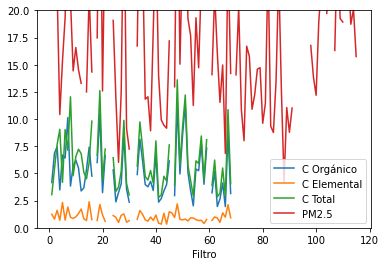

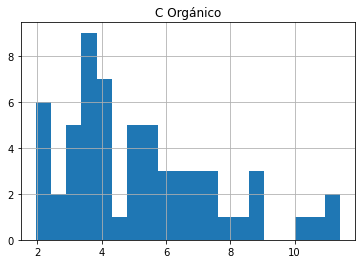

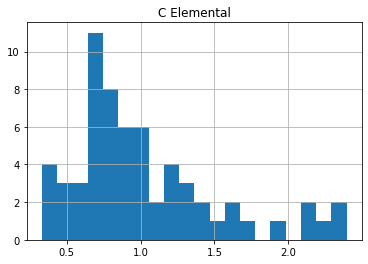

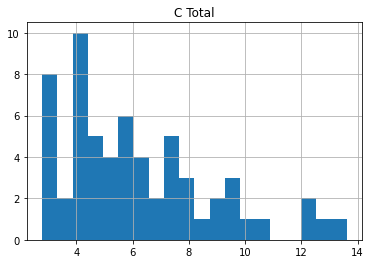

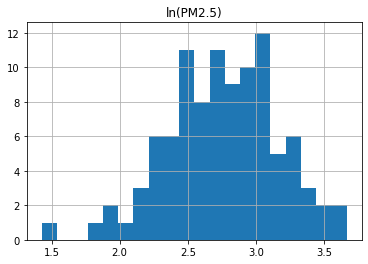

Test de normalidad ln(PM2.5), p-valor:
0.26888531931018206


In [27]:
df_raw = pd.read_csv('04122020_matriz_medidas_valores_apreciables.csv', index_col=0, skiprows=[1,2])
#df['PM2.5 (ug/m3)'] = df['PM2.5 (mg/m3)']*1000 * (df['PM2.5 (mg/m3)'] < 1) * (df['PM2.5 (mg/m3)'] > 0)

############# Remove outliers ############
df = df_raw.mask(df_raw.sub(df_raw.mean()).div(df_raw.std()).abs().gt(3))
display(df)
display(df.corr())
df.corr().to_csv('correlacion_todo.csv')

df.plot(y=['C Orgánico', 'C Elemental', 'C Total', 'PM2.5'], ylim=(0,20))
df.hist('C Orgánico', bins=20)
df.hist('C Elemental', bins=20)
df.hist('C Total', bins=20)
plt.show()
log_PM25 = np.log(df['PM2.5'].where(df['PM2.5']>0.1))
(np.log(df['PM2.5'].where(df['PM2.5']>1))).hist(bins=20)
plt.title('ln(PM2.5)')
plt.show()

### This function tests the null hypothesis that a sample comes from a normal distribution.
### It is based onD’Agostino and Pearson’s [1], [2] test that combines skew and kurtosis 
### to produce an omnibus test of normality.
print('Test de normalidad ln(PM2.5), p-valor:')
print(stats.normaltest(log_PM25, axis=0, nan_policy='omit').pvalue)
#df.plot(y=['C Elemental (ug/cm2)'], xlim=(0,36), ylim=(0,0.75))

In [3]:
#for i in df:
#    if is_numeric_dtype(df[i]):
#        #plt.figure(figsize=(20,10))
#        df.plot(y=i, label=i, xlim=(0, 96))
#        plt.show()

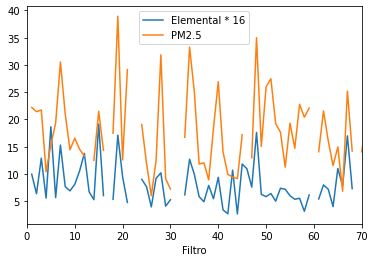

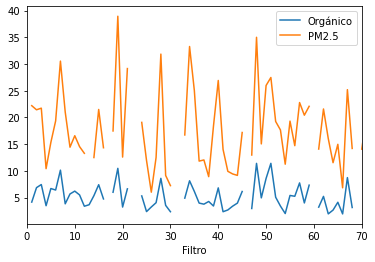

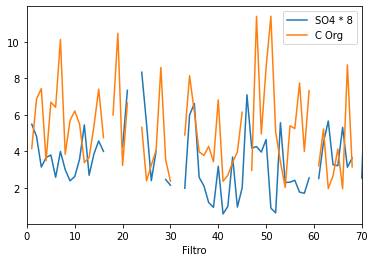

In [4]:
#df['C Orgánico'].plot(label='Orgánico')
(df['C Elemental'] * 8).plot(label='Elemental * 16')
(df['PM2.5']).plot(label='PM2.5', xlim=(0,70))
plt.legend()
plt.show()
(df['C Orgánico']).plot(label='Orgánico')
(df['PM2.5']).plot(label='PM2.5', xlim=(0,70))
plt.legend()
plt.show()
(df['SO4'] * 8).plot(label='SO4 * 8')
(df['C Orgánico']).plot(label='C Org', xlim=(0,70))
plt.legend()
plt.show()

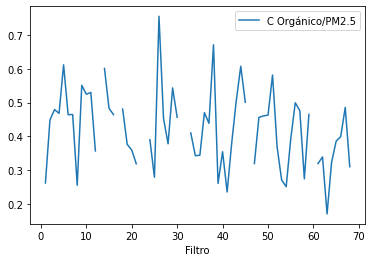

0.42158778949989


In [5]:
#df['C Orgánico'].plot(label='Orgánico')
fraccion_org = (df['C Orgánico']*1.4) / df['PM2.5']
fraccion_elemental = df['C Elemental'] / df['PM2.5']
(fraccion_org).plot(label='C Orgánico/PM2.5')
plt.legend()
plt.show()
print(fraccion_org.mean())

#print(fraccion_elemental.mean())

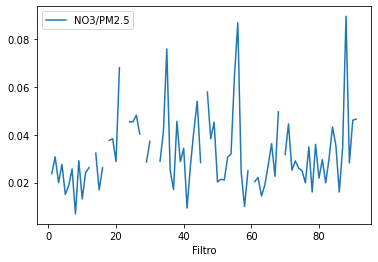

0.03249852143371584


In [6]:
fraccion_NO3 = df['NO3'] / df['PM2.5']
(fraccion_NO3).plot(label='NO3/PM2.5')
plt.legend()
plt.show()
print(fraccion_NO3.mean())

In [7]:
for i in df:
    print(i)
    print(df[i].mean()/df['PM2.5'].mean())

masa_explicada = 0
for i in df:
    if '.1' not in i:
        masa_explicada += df[i].mean()
masa_explicada = (masa_explicada - df['PM2.5'].mean() - df['C Total'].mean())/(df['PM2.5'].mean())
print('masa explicada = ', str(masa_explicada))

Cl
0.012189458006123694
NO3
0.029865806412327105
SO4
0.027887856226541895
Na
0.017376602718969503
NH4
0.013617010065993088
C Orgánico
0.3054766076427902
C Elemental
0.059943532670382015
C Total
0.3627211802854168
S
0.02682177560142899
Cl.1
0.015289969558417217
K
0.009141116985310057
Ca
0.034069458294688645
Ti
0.0004974960669811611
V
8.578726295149167e-05
Cr
0.00012829678408184204
Mn
0.00020298485960938044
Fe
0.007922504811371633
Ni
6.605536994077684e-05
Cu
0.0004020971928688026
Zn
0.0021008314024674006
As
9.588178431121328e-05
Se
4.148063306472563e-05
Sr
0.00011908780523650164
Pb
0.00039979103753815925
Hg
1.0988930656308454e-05
Pb.1
0.0005786530695678953
Zn.1
0.001855293217692178
Mn.1
0.00025456376355921073
Mo
1.8977758945255127e-05
Ni.1
7.971639767788832e-05
Ti.1
0.00045435697669927706
Sb
0.00013757319761313968
PM2.5
1.0
masa explicada =  0.548619059522193


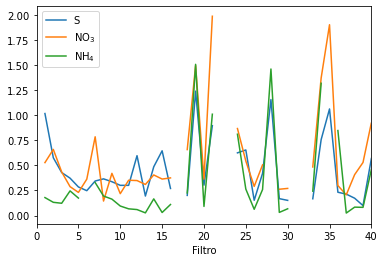

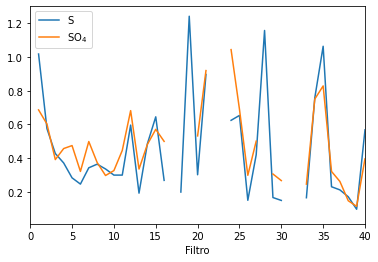

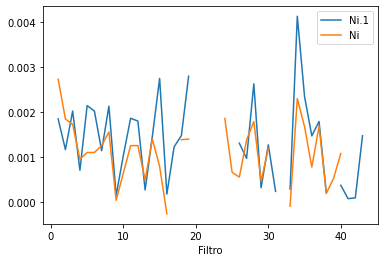

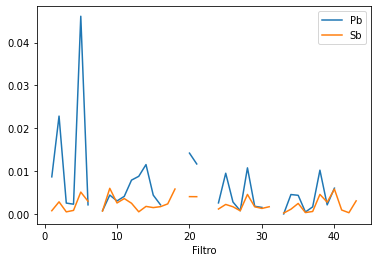

In [8]:
#(df['C Total'] *1.4 * 2.5).plot(label='Orgánico')
#(df['Na'] * 10).plot(label='Na')
(df['S']).plot(label='S', xlim=(0,40))
(df['NO3']).plot(label='NO$_3$')
(df['NH4']).plot(label='NH$_4$')
plt.legend()
plt.show()

df['S'].plot(label='S', xlim=(0,40))
df['SO4'].plot(label='SO$_4$')
plt.legend()
plt.show()

df['Ni.1'].plot(label='Ni.1')
df['Ni'].plot(label='Ni')
plt.legend()
plt.show()

df['Pb'].plot(label='Pb')
df['Sb'].plot(label='Sb')
plt.legend()
plt.show()


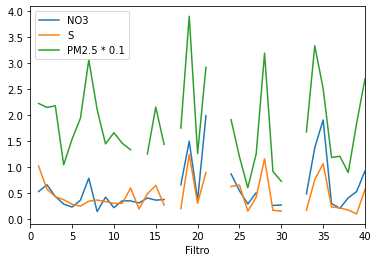

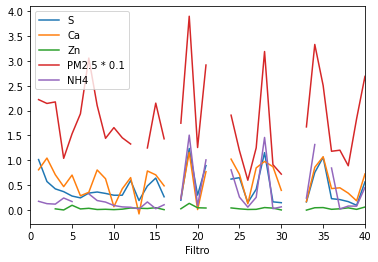

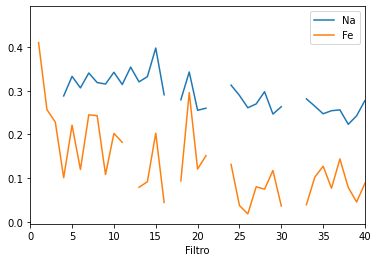

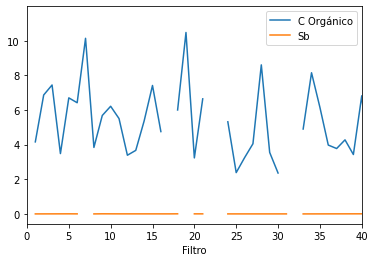

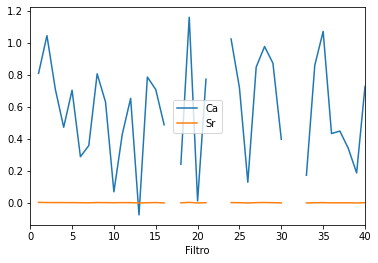

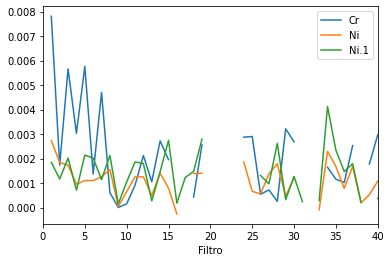

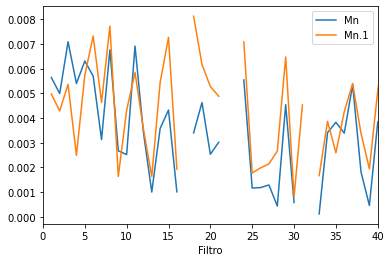

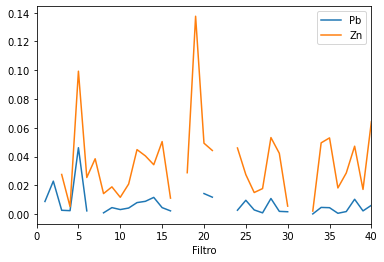

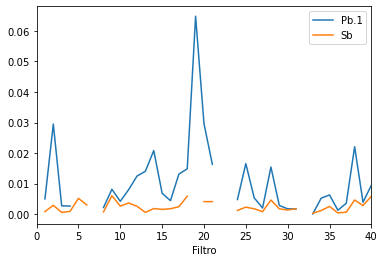

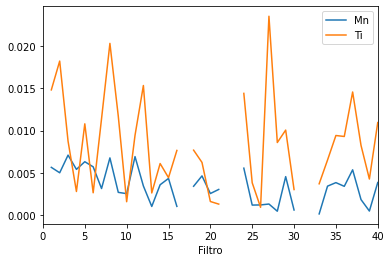

In [9]:
especies_corr_int = [['NO3', 'S', 'PM2.5'],
                          ['S', 'Ca', 'Zn', 'PM2.5', 'NH4'], ['Na', 'Fe'],
                          ['C Orgánico', 'Sb'], ['Ca', 'Sr'], ['Cr', 'Ni', 'Ni.1'],
                          ['Mn', 'Mn.1'], ['Pb', 'Zn'], ['Pb.1', 'Sb'],
                          ['Mn', 'Ti']]
for i in especies_corr_int:
    for j in i:
        if j == 'PM2.5':
            (df[j]*0.1).plot(label=j + ' * 0.1', xlim=(0,40))
        else:
            df[j].plot(label=j, xlim=(0,40))
    plt.legend()
    plt.show()

In [10]:
#df.corr().where(df.corr() > 0.8).to_csv('correlacion_grande.csv')
df.corr().where(df.corr() > 0.65).where(df.corr() <= 0.8).to_csv('correlacion_grande.csv')

1.0000000000000013 x + -7.225235670382454e-17


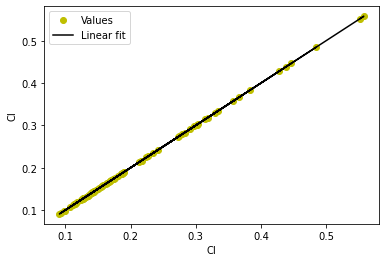

0.6838850537130183 x + 0.3568268521567164


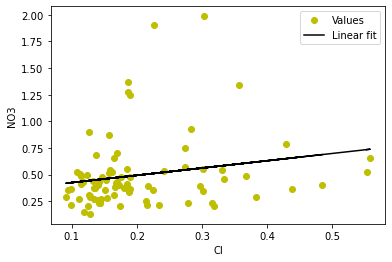

0.34710005187982335 x + 0.4085845079344772


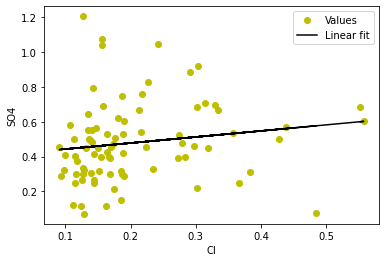

0.2266334675086501 x + 0.250055280492452


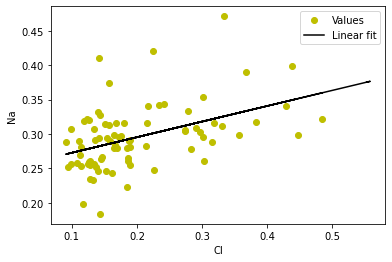

0.4028035969408039 x + 0.13098296062386205


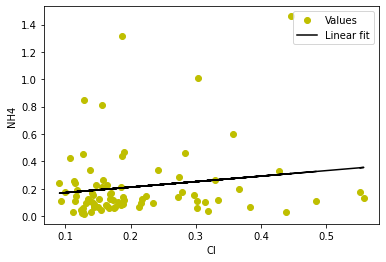

6.707718855430402 x + 3.5453585746527514


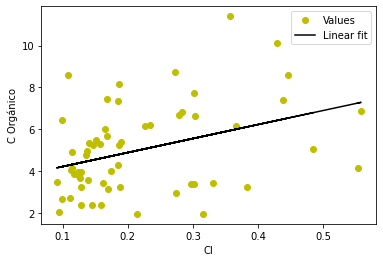

1.7517934625660134 x + 0.621491225902497


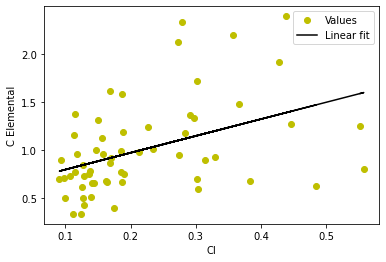

1.9545820640872271 x + 5.544074609629575


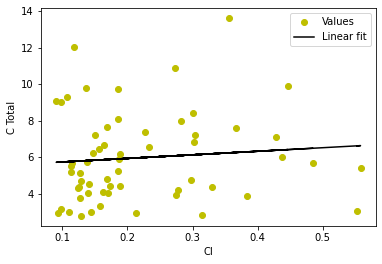

1.3290329628945299 x + 0.1471266835595958


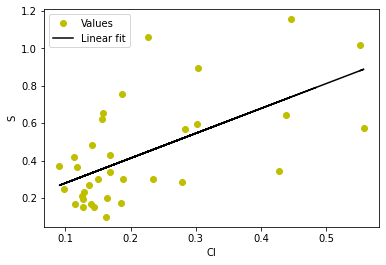

0.31633336929535816 x + 0.1973674992323472


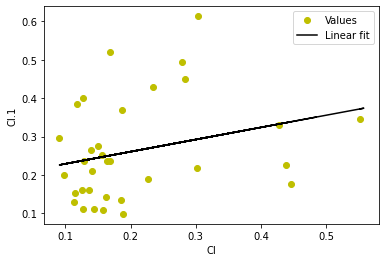

0.3696842941982855 x + 0.07208346096500333


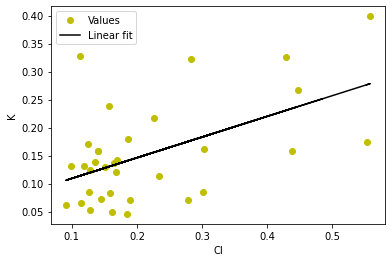

0.9476085340897997 x + 0.35899321364779296


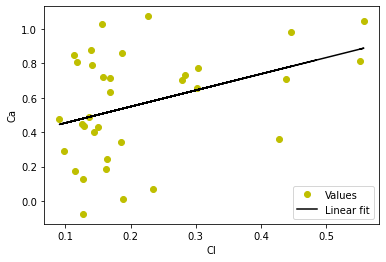

0.010845343431409022 x + 0.00620405284712067


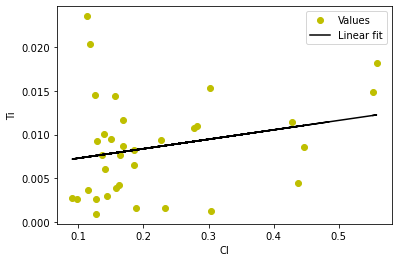

0.0035966497960905563 x + 0.0006434709395781216


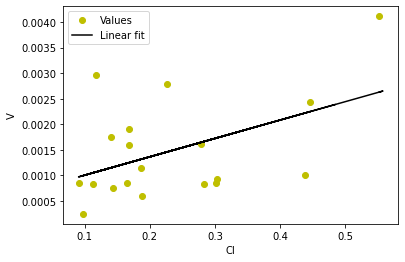

0.004652860660630698 x + 0.0011324412958492378


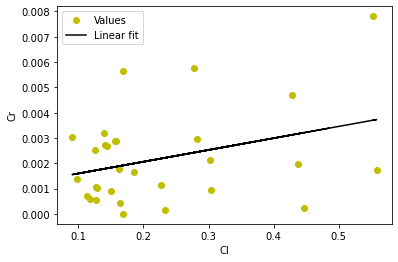

0.0018942541297860733 x + 0.0030165472876371897


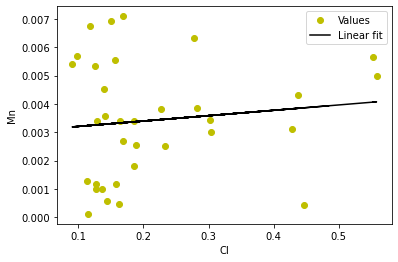

0.4181051913275949 x + 0.04095484155518243


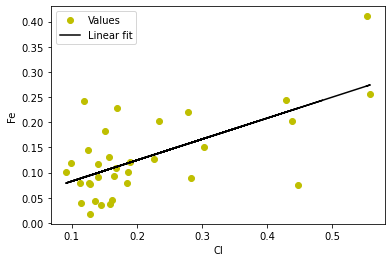

0.00230134660361057 x + 0.0006187403731154874


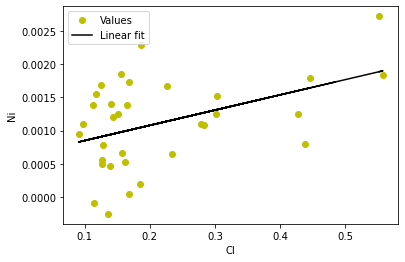

0.010265307951322777 x + 0.004171630223647973


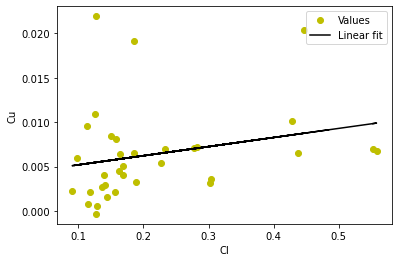

0.08049079563009959 x + 0.01617640034010032


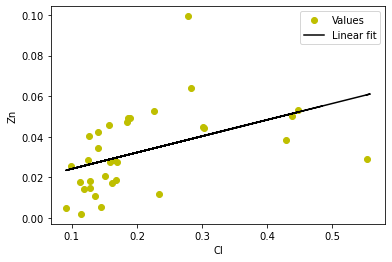

0.0035169575151826962 x + 0.0007444132185753709


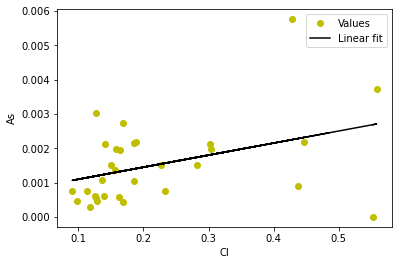

0.0019196763966815558 x + 0.00016409193587036403


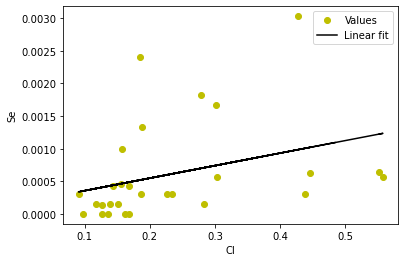

0.0037690698888246206 x + 0.0011552709556045225


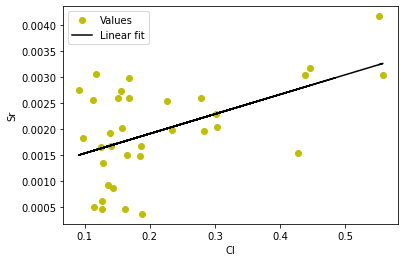

0.030163661499876475 x + 0.0004938719681760093


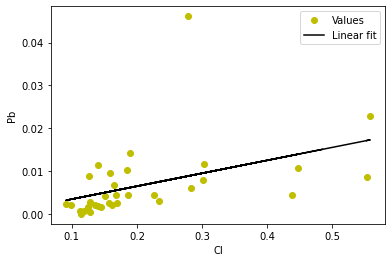

-0.00039491735811834374 x + 0.0002760265032097391


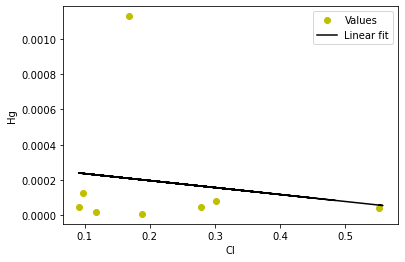

0.025515454904441643 x + 0.003205151126786577


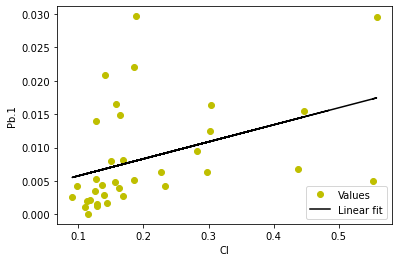

0.037438436312152885 x + 0.023895314082104126


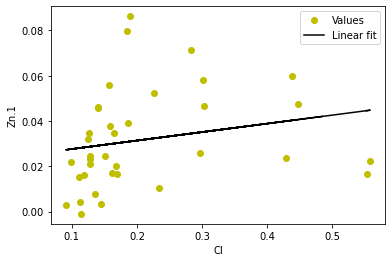

0.001730027399331934 x + 0.0039159809073047325


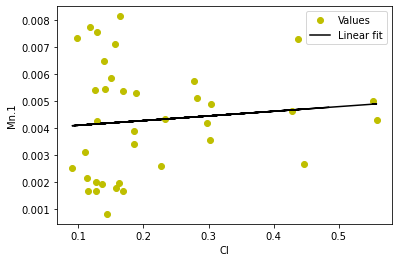

0.0007670132481043067 x + 0.00014417839430662483


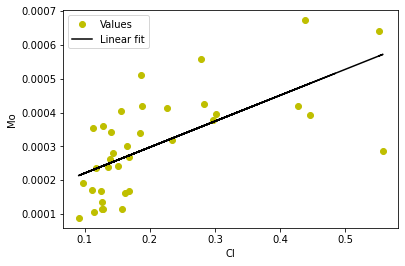

0.0019764442085534128 x + 0.0009248549120712961


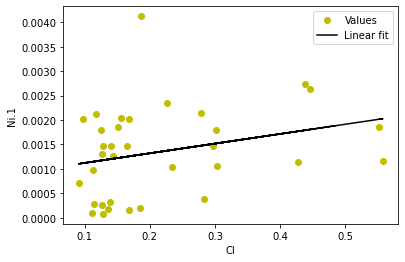

-0.006471746132251511 x + 0.00894455991387937


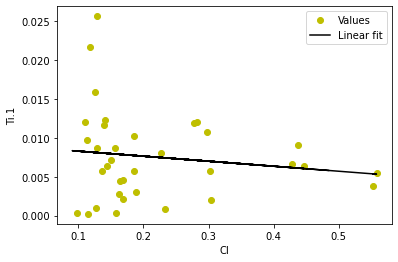

0.0038284217985951326 x + 0.001567636177601997


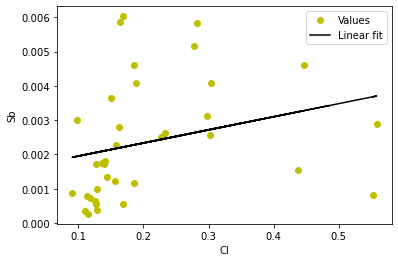

27.113489065948883 x + 10.470962346216702


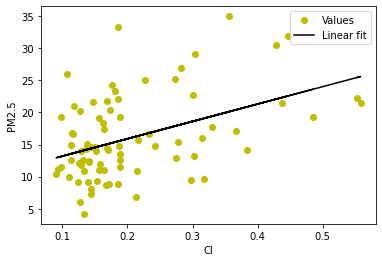

0.06157407572538186 x + 0.17334876307630018


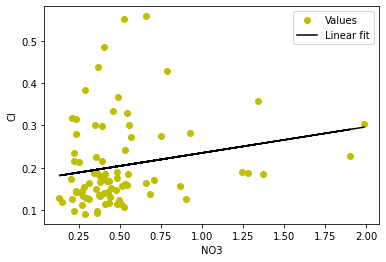

1.0000000000000002 x + -4.81682378025497e-17


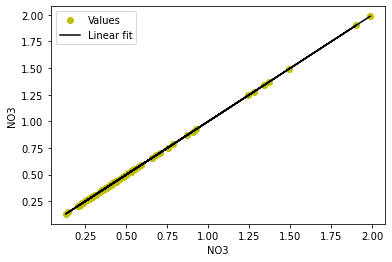

0.23457318527265808 x + 0.3537985435038654


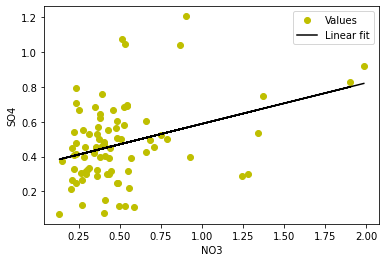

-0.013743165620763914 x + 0.30300265319485864


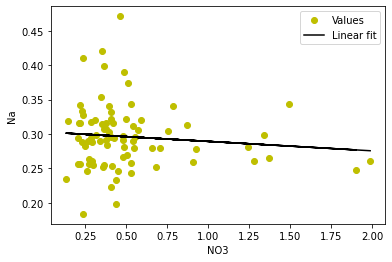

0.6439843543142458 x + -0.1008622151679603


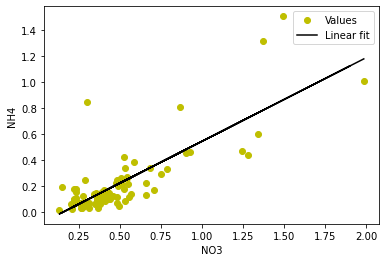

2.8578505937054803 x + 3.5530807762446988


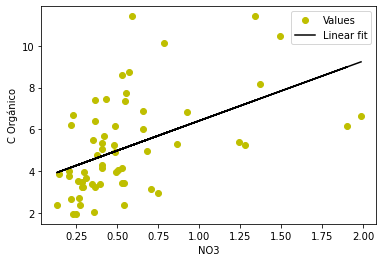

0.29693672739691424 x + 0.8458179942427748


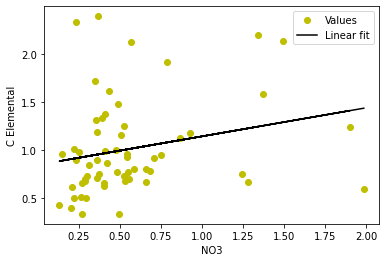

2.722355775282307 x + 4.599600555932821


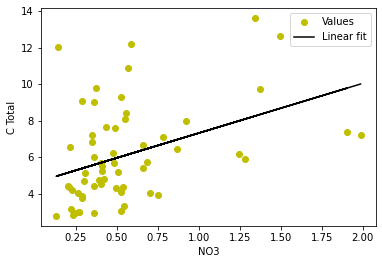

0.4685643200751004 x + 0.1667464015381603


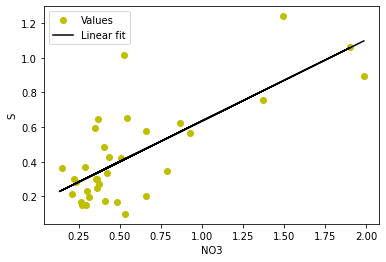

0.07269493821504772 x + 0.2215286589698616


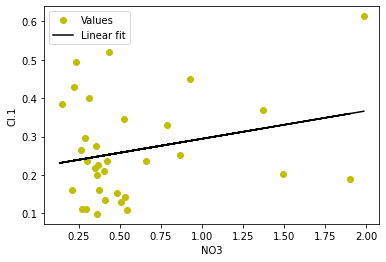

0.08631772268521112 x + 0.10282989559426427


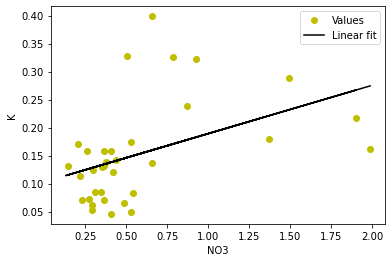

0.3514118083060456 x + 0.3666207490530801


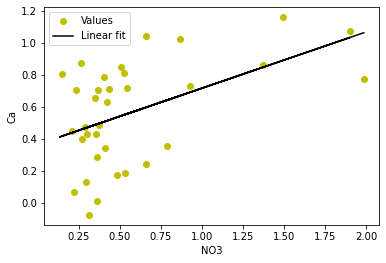

-0.0009602983397755281 x + 0.009030325647209106


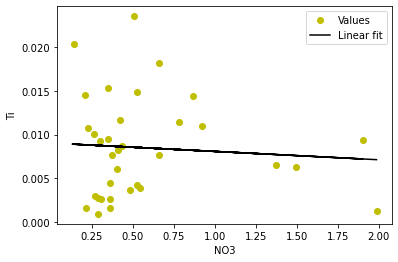

7.358680834136717e-05 x + 0.0013606289906649208


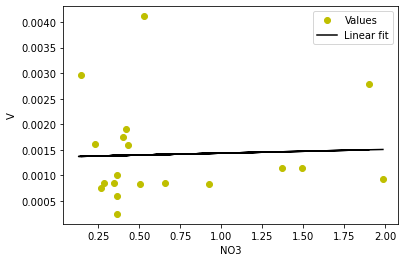

-0.0002809925984578757 x + 0.002419738320398883


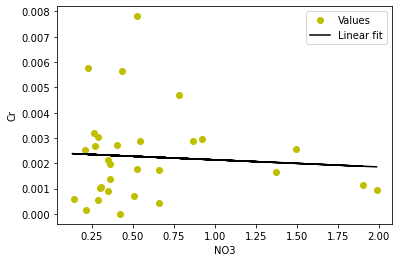

-1.0831934206970729e-05 x + 0.003555198012200891


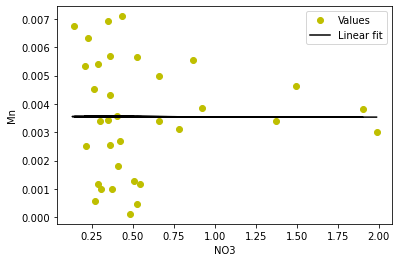

0.024160542493992482 x + 0.12280243709491802


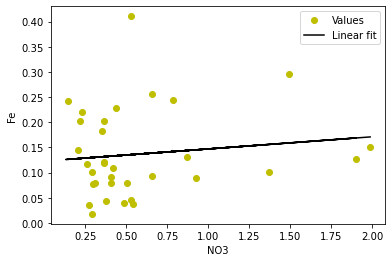

0.0005457892240826988 x + 0.000787983978329985


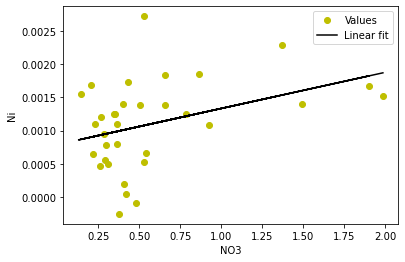

0.0018846170860456256 x + 0.005369257552678215


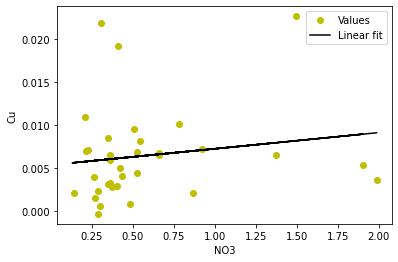

0.026839823201762557 x + 0.019891197236740606


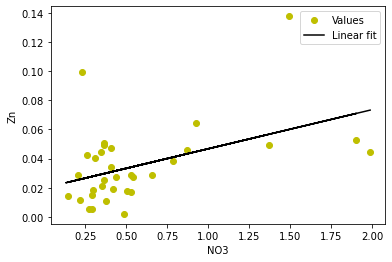

0.0009849399908222808 x + 0.0010259344895109585


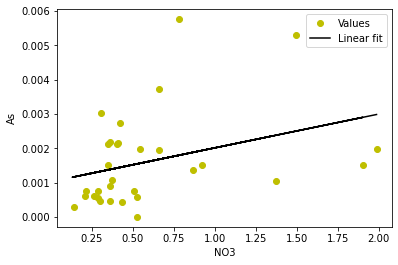

0.0003482772567258497 x + 0.0004983060029995969


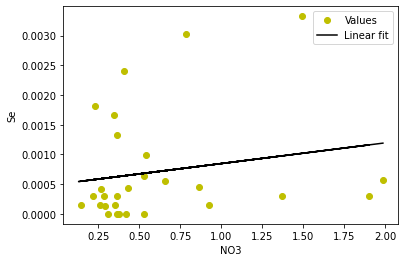

0.00048114317224234556 x + 0.001719180722019855


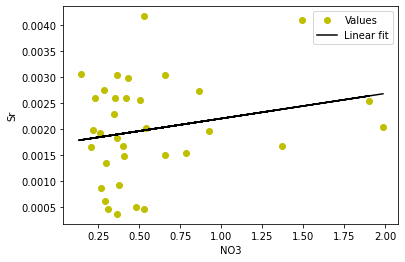

0.0004143280003911049 x + 0.006466319387800576


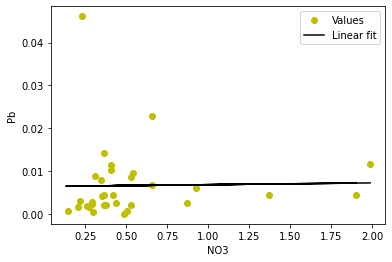

0.0010192331803215078 x + -0.0001546387282891768


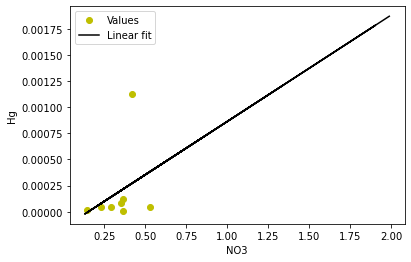

0.010309031308333242 x + 0.004143611295502951


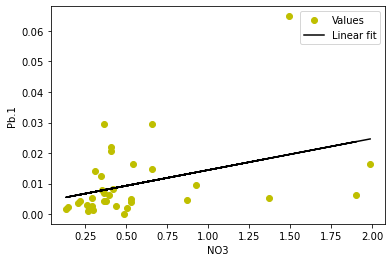

0.01553492265213221 x + 0.023070759799348365


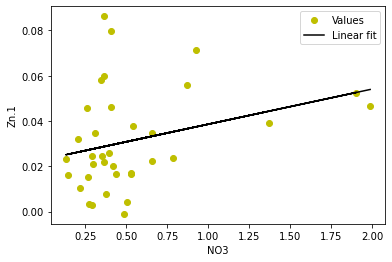

-1.179557819537207e-05 x + 0.004385791532659235


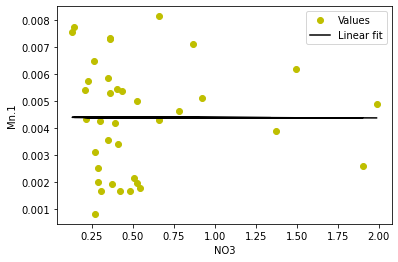

0.00020749389290665885 x + 0.00020990245938252487


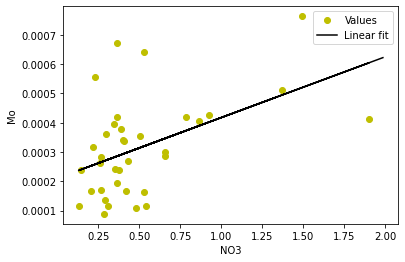

0.0007253890159777182 x + 0.0009541693206231254


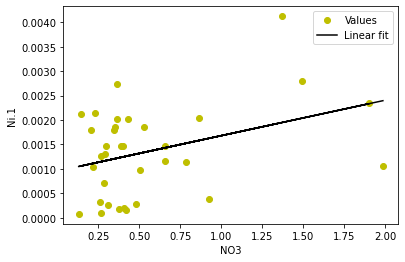

-0.0018762814622082626 x + 0.00871445387781153


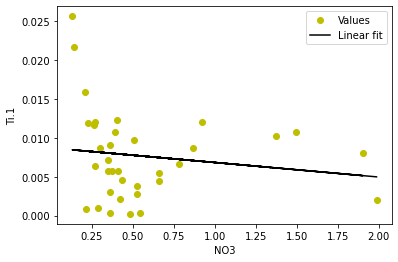

0.0008736151189246808 x + 0.0018442520506678122


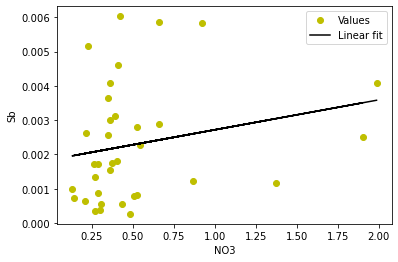

12.233890392270895 x + 9.975426379048072


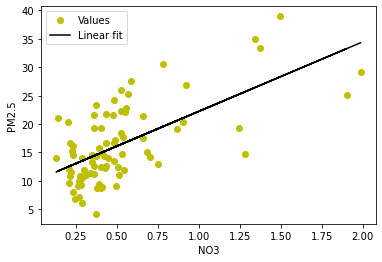

0.06922678769803242 x + 0.17173158141844921


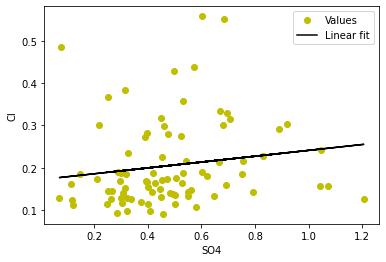

0.5200948079466264 x + 0.25267192831042606


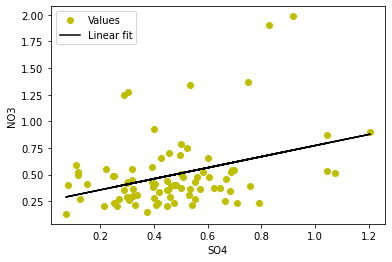

0.9999999999999997 x + 0.0


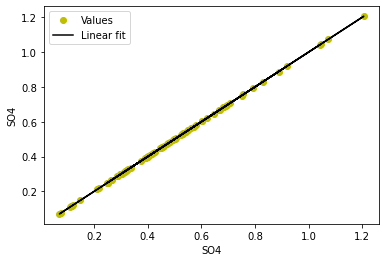

0.05181953462609603 x + 0.2711354495423788


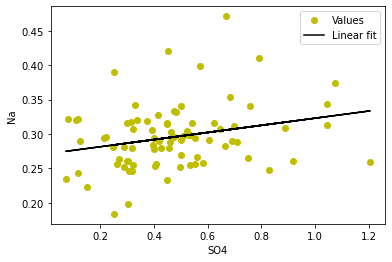

0.36608792825162195 x + 0.03028665275277708


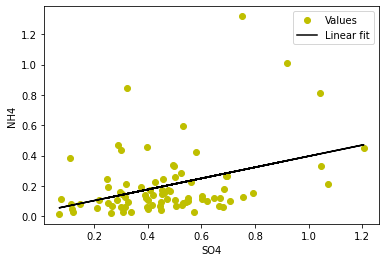

0.8045058046489526 x + 4.71804420213573


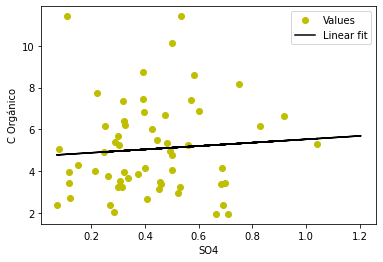

0.856878308718304 x + 0.6278218827252886


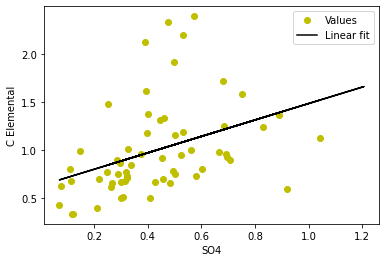

1.0286309822101507 x + 5.573669748076144


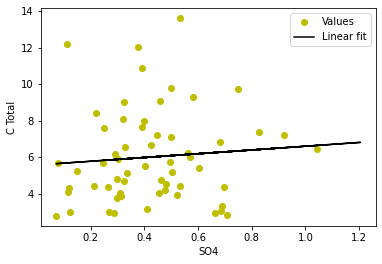

0.9969258305529264 x + -0.05651040776794217


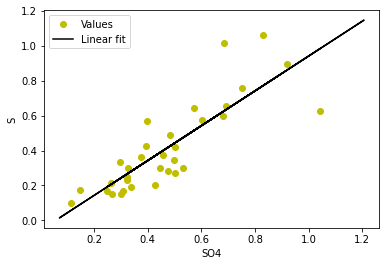

0.1577933755500413 x + 0.19158747315975488


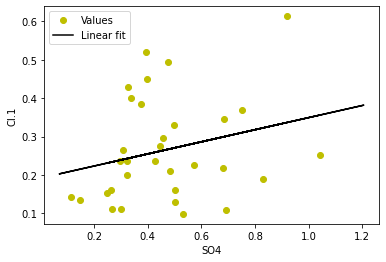

0.16165618012730418 x + 0.07242388729712554


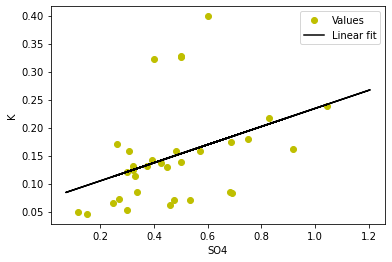

0.9079054588445874 x + 0.12413108264877397


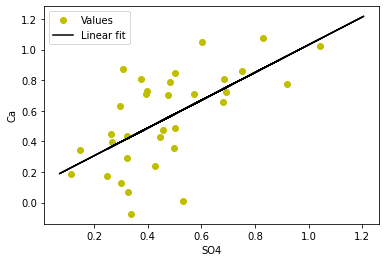

0.004755999417649947 x + 0.006308642824342771


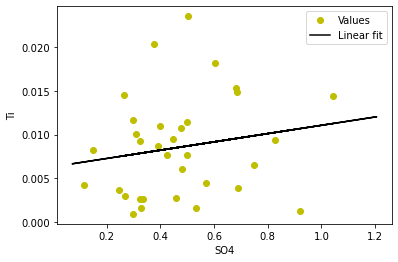

0.001152880415075428 x + 0.0008254759859337517


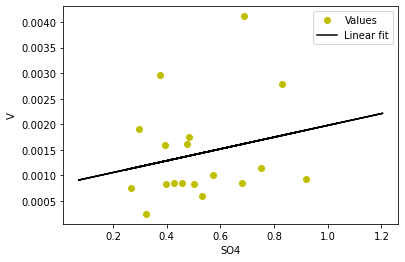

0.0013350462260366517 x + 0.001592227810661196


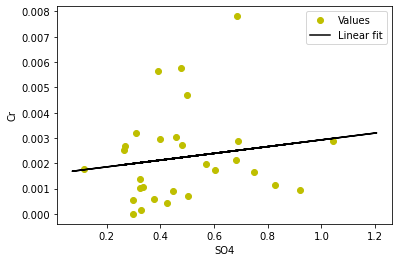

0.0023668241832245306 x + 0.002403163603496064


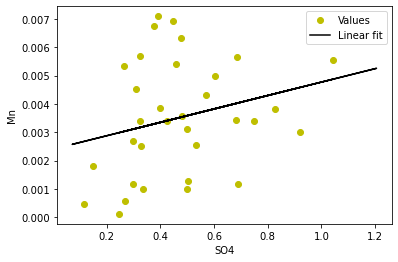

0.11599888747499247 x + 0.07813392091989832


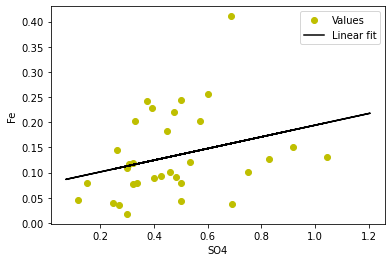

0.0017683681846693577 x + 0.00026858648731244817


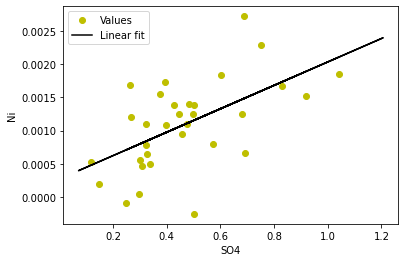

-0.003665218193733338 x + 0.007686907365814866


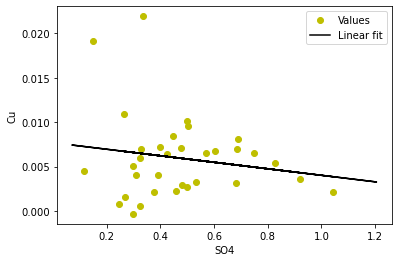

0.03548250901654886 x + 0.015549165608299392


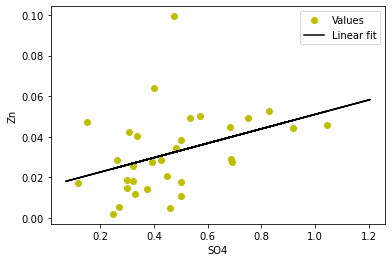

0.0008131519062148433 x + 0.0011007551281323597


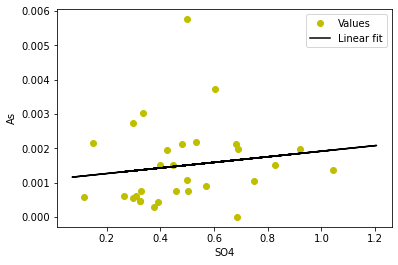

0.00024956917342099376 x + 0.0004905923615036591


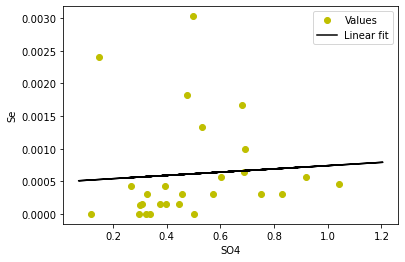

0.0019346697645678142 x + 0.0010230321248820894


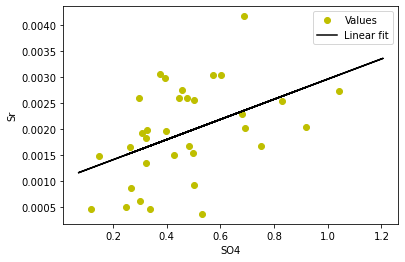

0.007419595921321829 x + 0.0032079384209780593


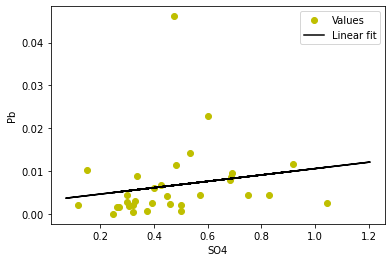

-0.0012915442790599459 x + 0.0008055971812214062


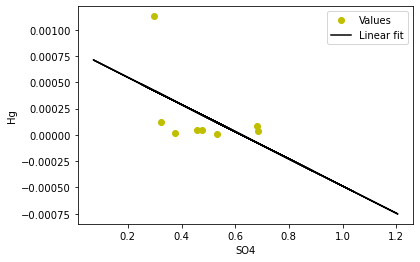

0.009203822073133179 x + 0.004115147378801192


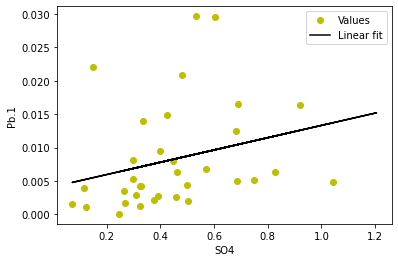

0.03201743174866842 x + 0.01698888168187721


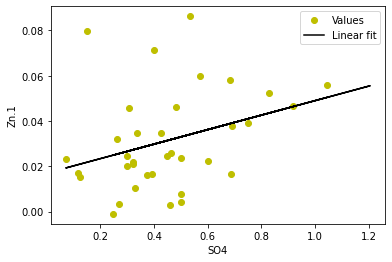

0.0011040887046041702 x + 0.0038333852492823746


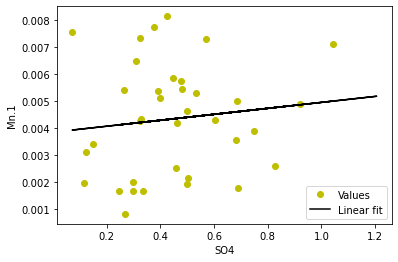

0.00038825076813323885 x + 0.0001338922207726549


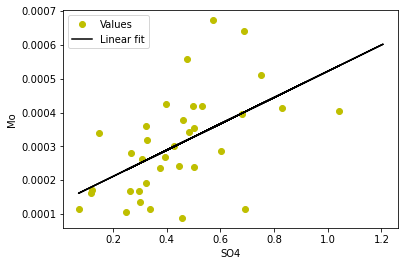

0.002252979962050205 x + 0.0003020714836125456


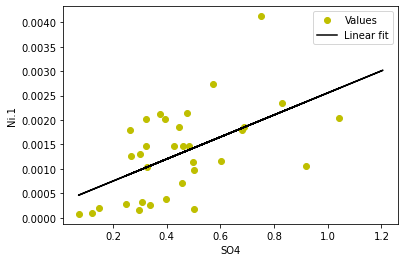

-0.0049308231034152 x + 0.009791852854769228


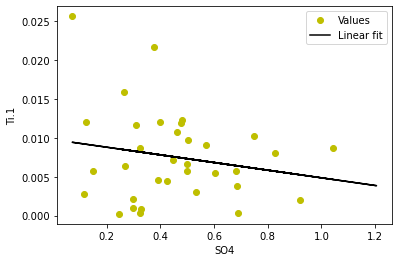

0.00044004764229436374 x + 0.0020989099441915417


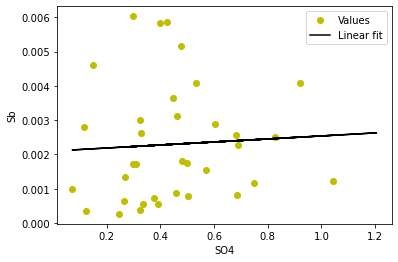

4.8526852636524795 x + 13.762691709703704


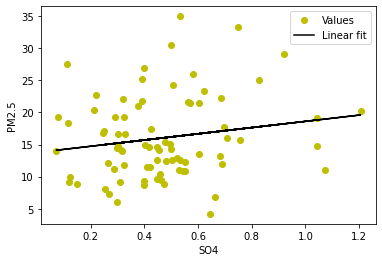

0.8687348305346528 x + -0.056780105905875886


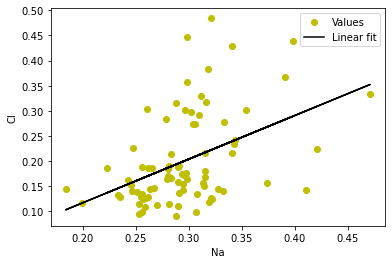

-0.8050822379400083 x + 0.7462807652145406


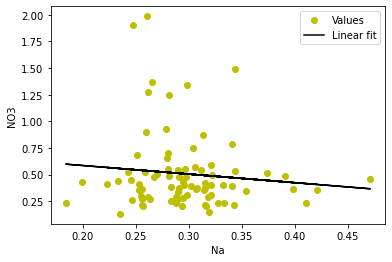

1.2898595024785986 x + 0.09096585341205911


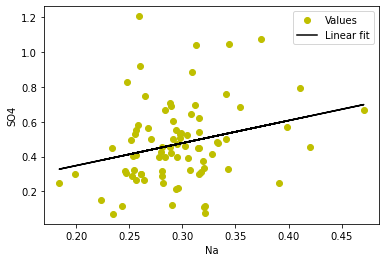

0.9999999999999997 x + 0.0


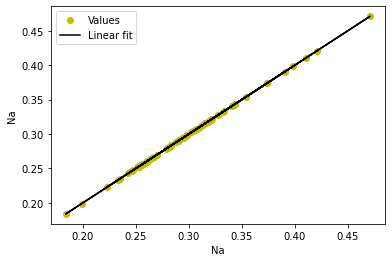

-0.18108680074600114 x + 0.28906665735861026


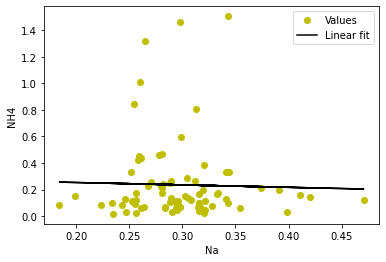

22.009942019970435 x + -1.258150400975419


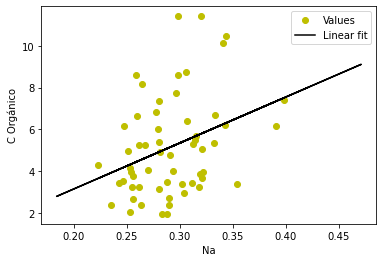

6.781037019178147 x + -0.967019779879241


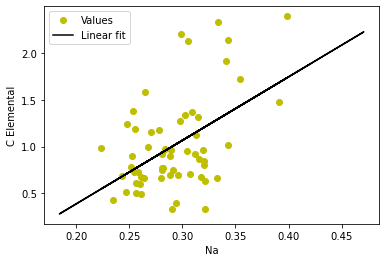

20.195986638035418 x + 0.33748213085197415


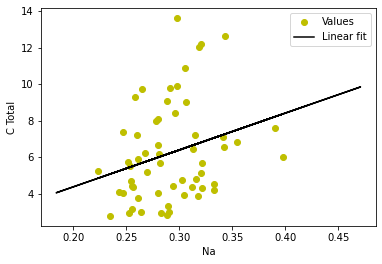

1.756114868476564 x + -0.07817895263848183


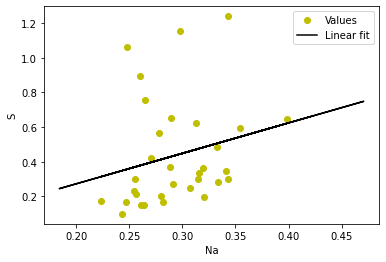

0.8263545478583476 x + 0.007430481449532803


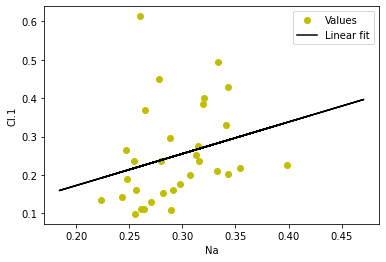

0.3634840089565431 x + 0.041474360592635776


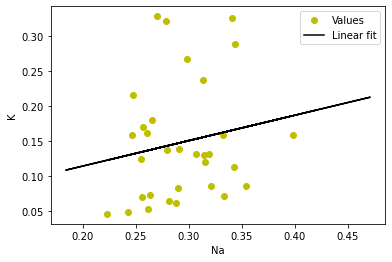

1.1427413323083049 x + 0.2196921412614336


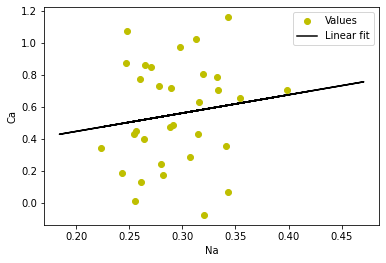

0.010179851077850001 x + 0.004982172028435351


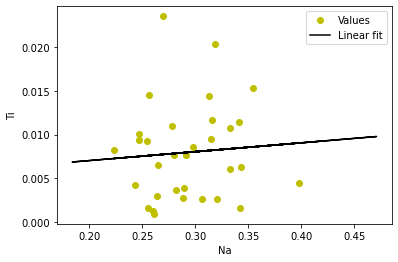

0.0010054399096722565 x + 0.0010054000466112887


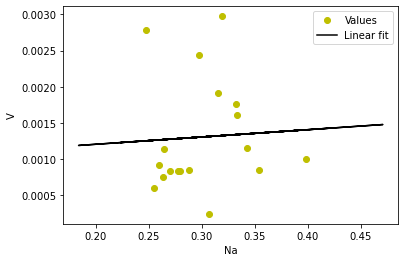

0.005839309595137157 x + 0.00014014856240150895


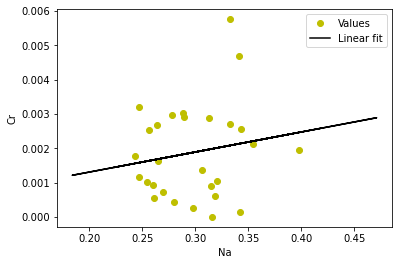

0.015635096420590414 x + -0.001355802130219442


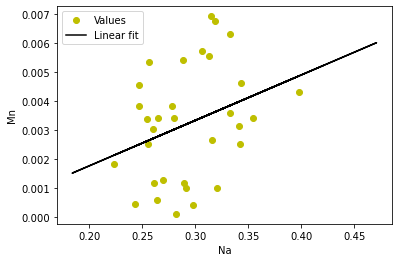

1.0915506212412454 x + -0.19880034975041197


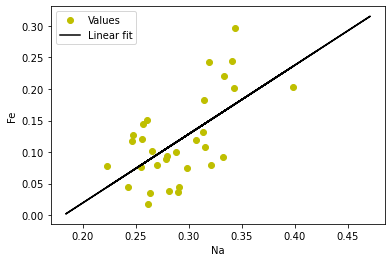

0.0009872439492442649 x + 0.0007409684928496097


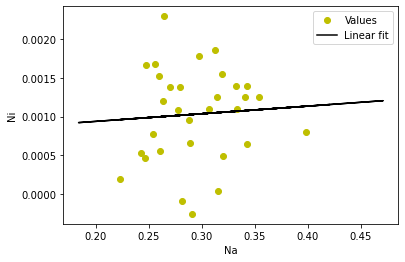

0.020753513162235386 x + 0.0008539194965853707


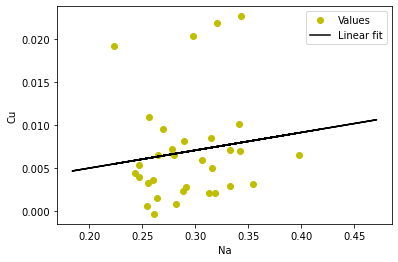

0.17796394491755196 x + -0.015914682682300497


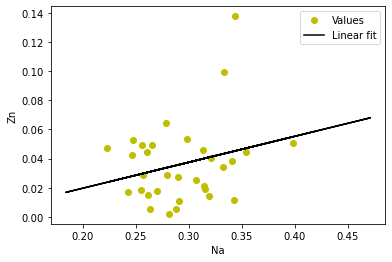

0.01106415058661543 x + -0.0015859008554397244


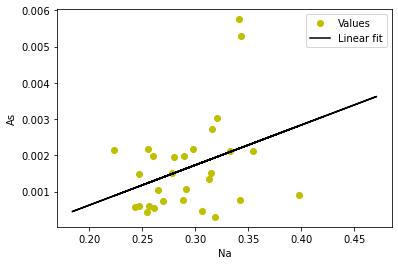

0.004522343906374606 x + -0.0006154723807569009


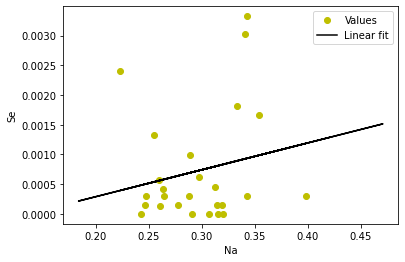

0.010949922257668105 x + -0.0013100274257138553


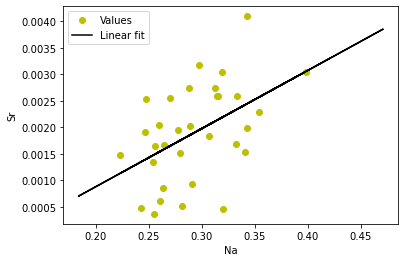

0.044128747605265986 x + -0.0064424802358506025


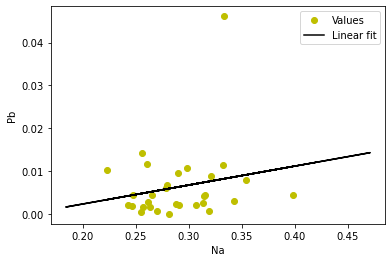

0.0014215998834232705 x + -0.0002331126870836342


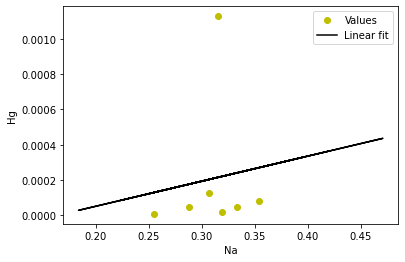

0.06676008106730699 x + -0.009514586973668077


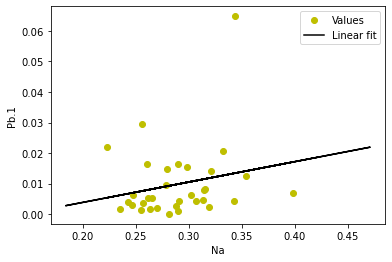

-0.01757153154660116 x + 0.038081531607216335


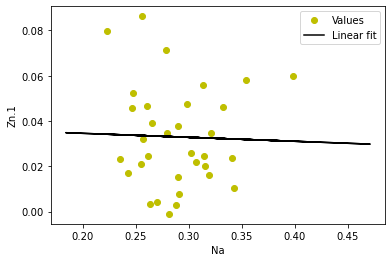

0.012637765137289328 x + 0.0005996348005662418


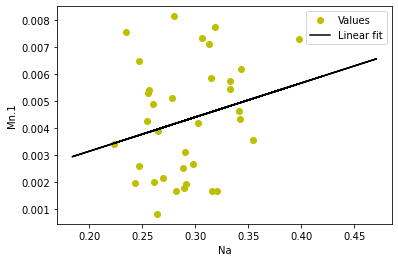

0.001722356081362004 x + -0.0001933120086837876


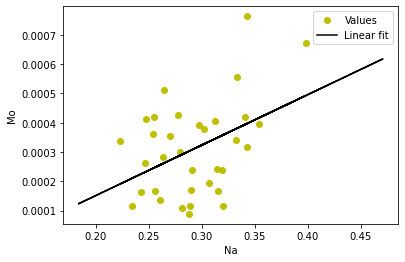

0.00773423819195155 x + -0.0009102831784649615


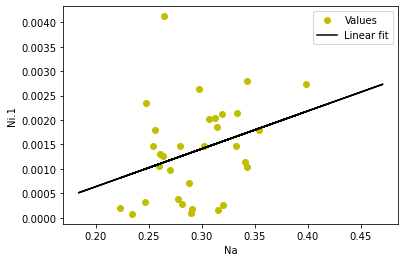

-0.005773876927475991 x + 0.009573994543943828


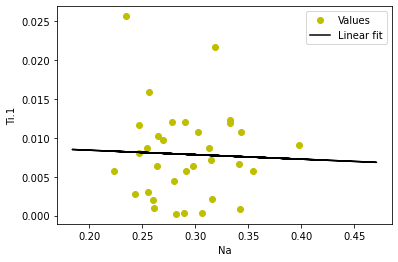

0.0013336721106965654 x + 0.002061002465987194


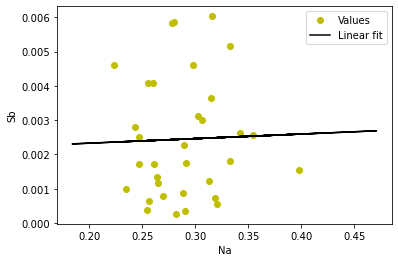

31.606724362537836 x + 7.113172680640256


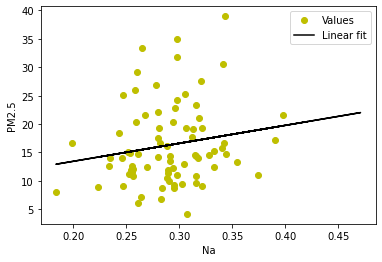

0.0665357572986506 x + 0.19358761500973878


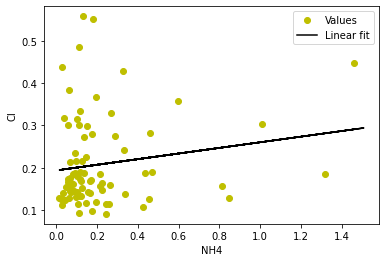

0.9799931227595063 x + 0.281107985945667


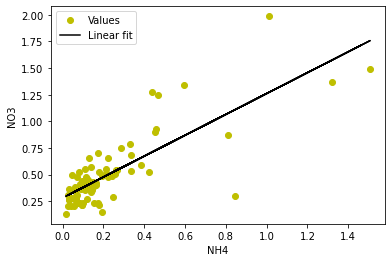

0.3856904910517769 x + 0.39016061435207094


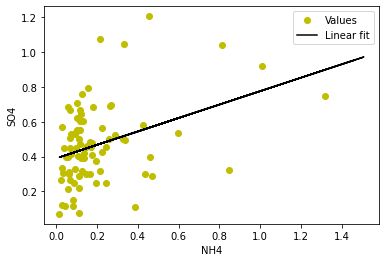

-0.004497077692434387 x + 0.2975724767575429


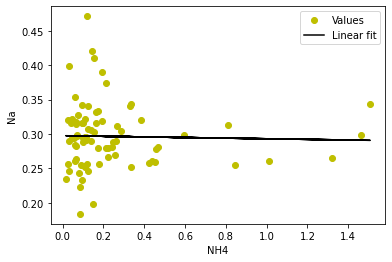

1.0000000000000004 x + 2.4227052612512395e-17


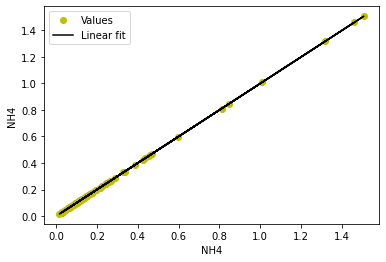

3.598255822124893 x + 4.180896399926642


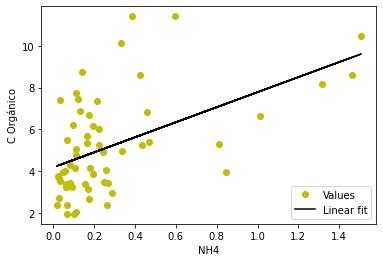

0.40001609243436054 x + 0.9075351532624182


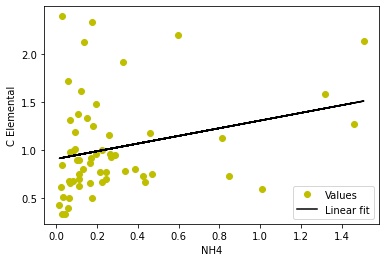

4.052027209085831 x + 4.999620571085321


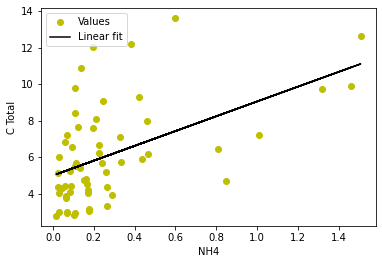

0.5029343666900479 x + 0.2785512639396014


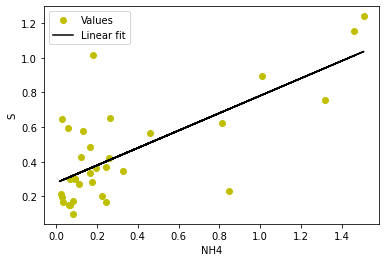

0.04787836560114922 x + 0.2485841017585043


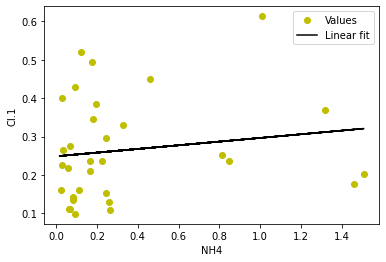

0.08943946166759419 x + 0.1250902010719736


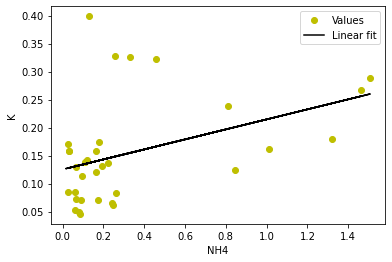

0.3866647408822364 x + 0.44652413473431213


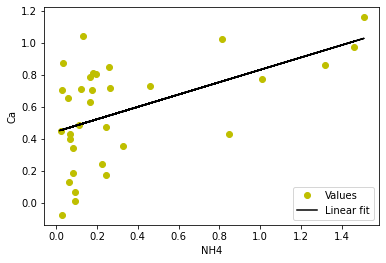

-0.0006982351021921138 x + 0.008860577208896292


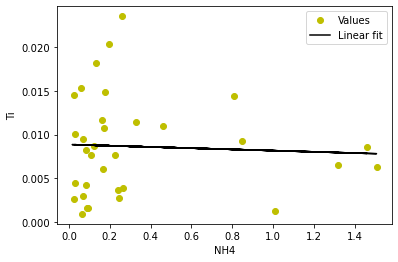

1.3719921245231012e-05 x + 0.0014505669948535113


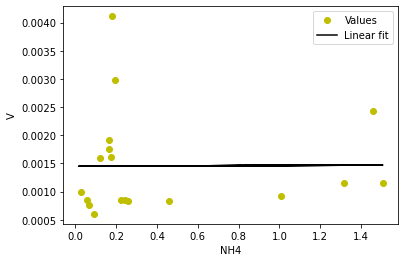

-0.0006265971643552989 x + 0.002475574124072535


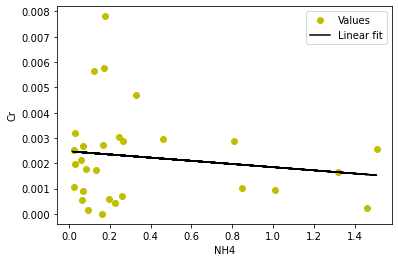

-0.00015887322911895148 x + 0.0034334332566416897


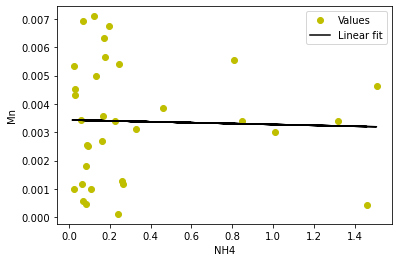

0.012857327931244661 x + 0.13140215780558862


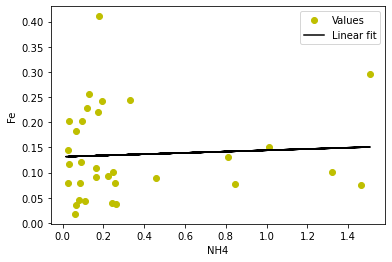

0.0006153487317387666 x + 0.00090101548621893


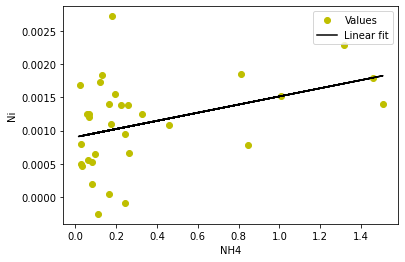

0.004670227323084653 x + 0.005379146884117064


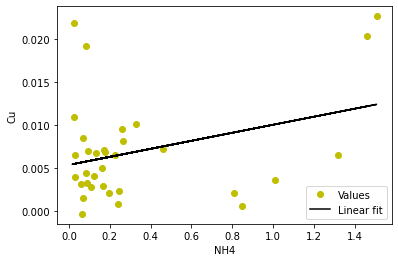

0.032091307103593494 x + 0.024765659398791846


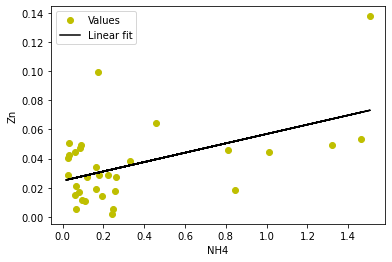

0.0008515152971441368 x + 0.0013816410962166543


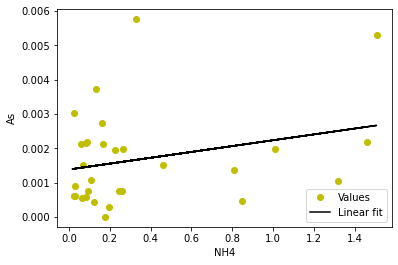

0.0005380867381427115 x + 0.0005656001957277327


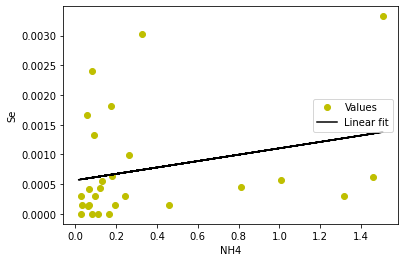

0.000762730967782486 x + 0.001767624869699995


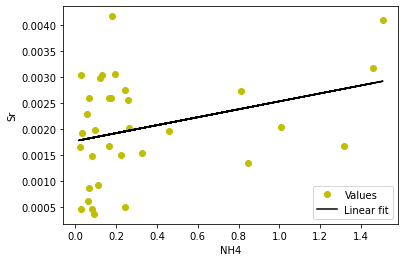

-3.88075086678803e-05 x + 0.007053460727835532


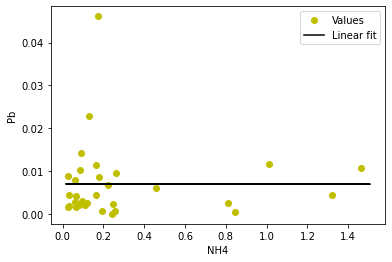

0.00017932847140866685 x + 0.00016802651681218885


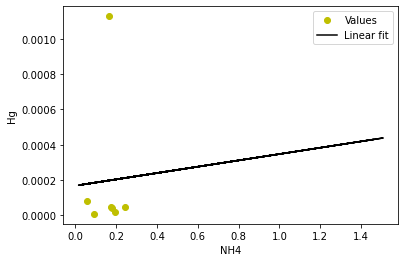

0.012044346473284057 x + 0.0065150450230051634


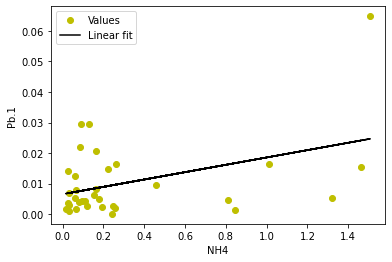

0.01102096252496175 x + 0.028423407947747763


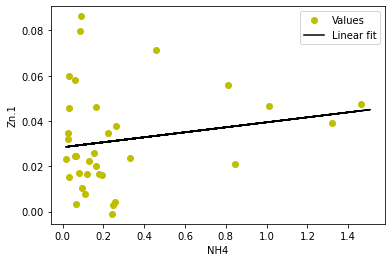

0.0003352997772785849 x + 0.004195717704455826


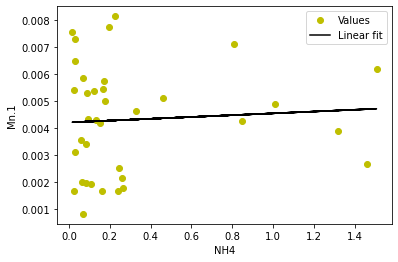

0.00019884524098172333 x + 0.00026132389411164756


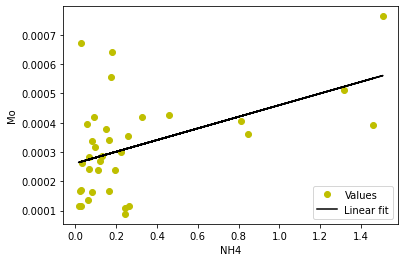

0.001206012081000606 x + 0.0009558337851539906


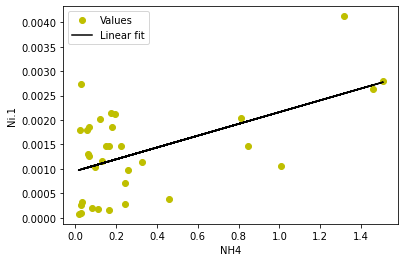

-0.00014506365265780984 x + 0.007865426797957579


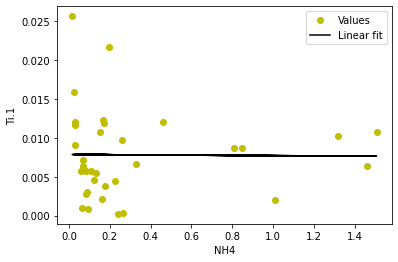

0.0005827782615023068 x + 0.0021772448456401504


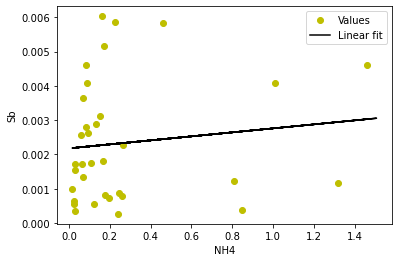

15.370294524233154 x + 12.692988195832356


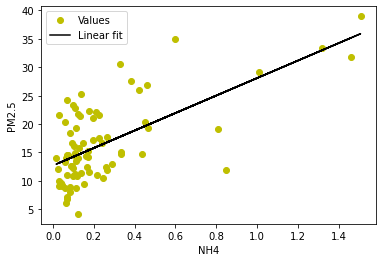

0.02083613943123742 x + 0.11430365694208725


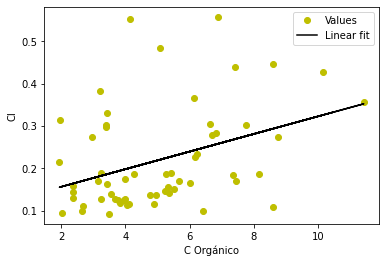

0.08522650140747383 x + 0.12000518455309875


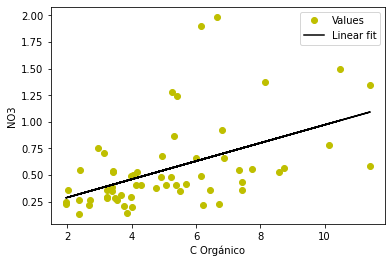

0.006992014239576334 x + 0.3899827909799064


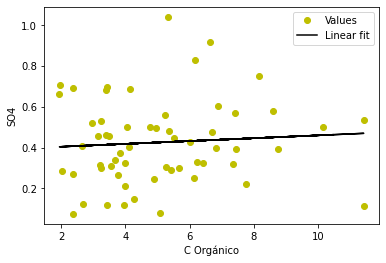

0.0051214872694788915 x + 0.26509622772437075


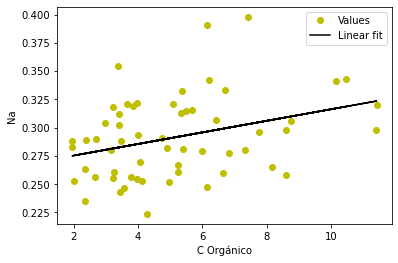

0.07215266818300906 x + -0.09803748188861582


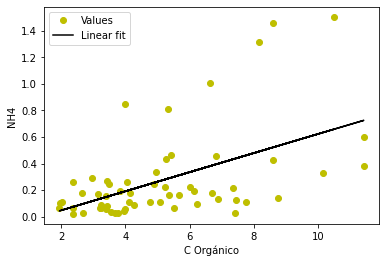

1.0000000000000004 x + -4.54878374728537e-16


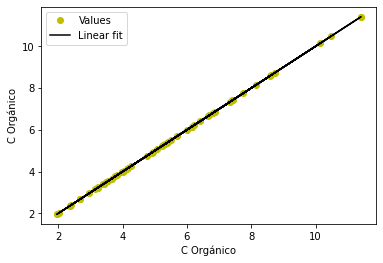

0.11196390320192143 x + 0.4331193770390771


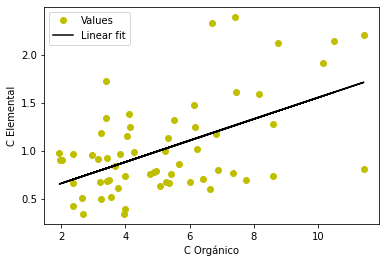

0.907687025788191 x + 1.4564833653968132


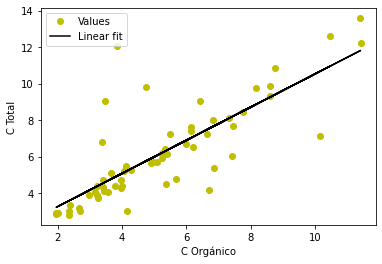

0.07776139501230649 x + 0.038580829122066486


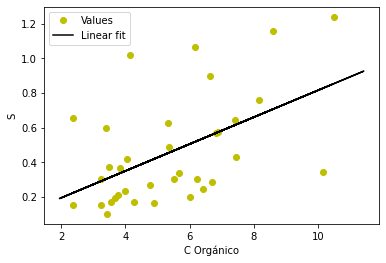

0.024588651734519643 x + 0.12933464663002037


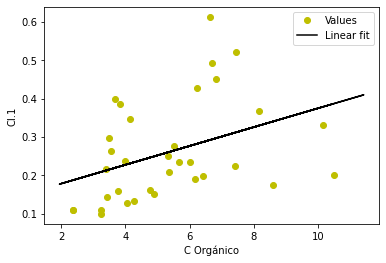

0.026930808606841255 x + 0.010839304009838837


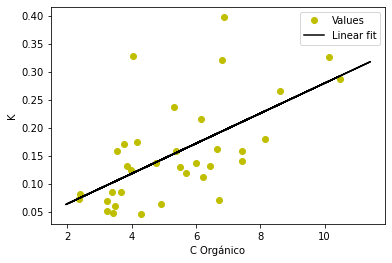

0.06234502052283898 x + 0.24511848657750254


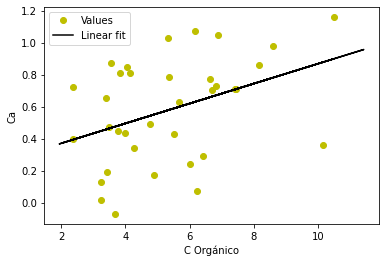

7.60504853497093e-05 x + 0.008070930095421328


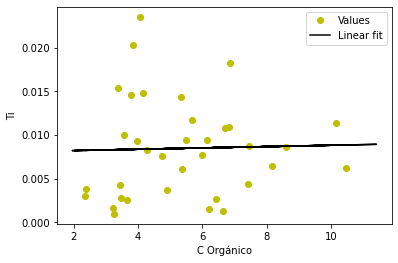

-3.07604584774556e-06 x + 0.0014802379773091662


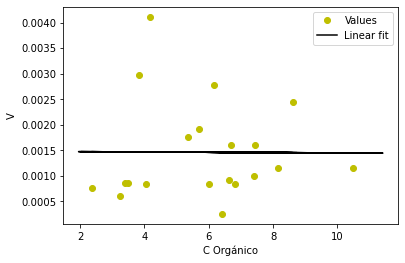

6.613877742653598e-05 x + 0.0018215806514035946


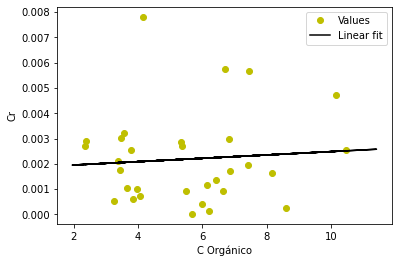

0.0002502526401114712 x + 0.002112868047089725


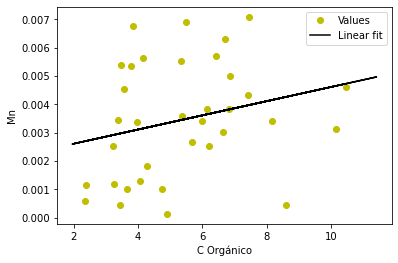

0.019410420715997235 x + 0.02941369915053042


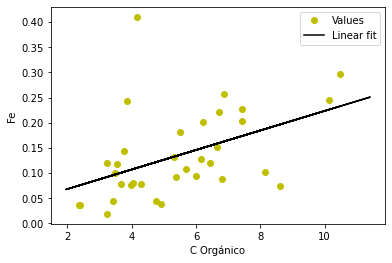

0.00010338462829134694 x + 0.0005628815602936086


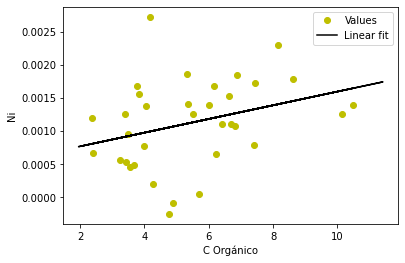

0.0011221743391250012 x + 0.0008130006451260207


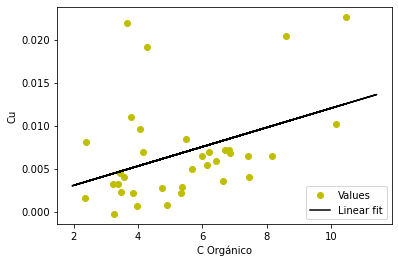

0.007515984719482659 x + -0.004323123964045963


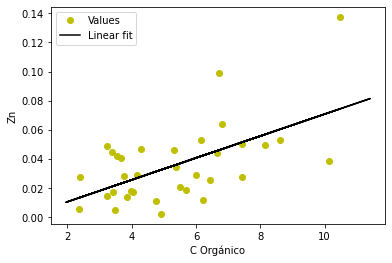

0.0003582705596973616 x + -0.0003188012837329092


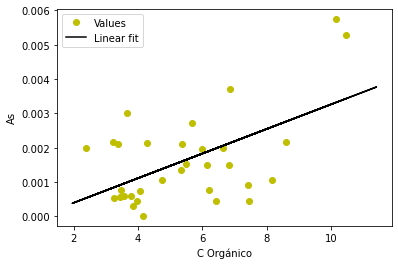

0.0001637658820786526 x + -0.00019842084641225714


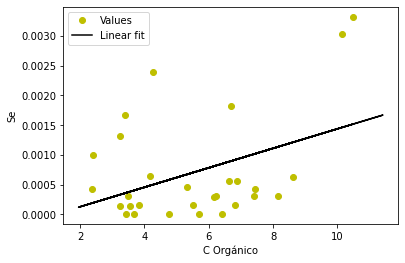

0.00020976864540428277 x + 0.0009006980082681454


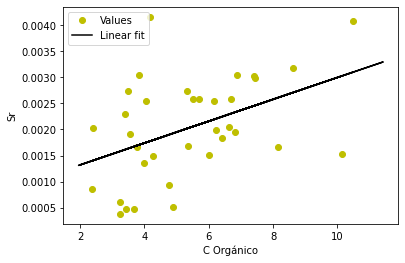

0.0013046336806094951 x + 0.00018080879739614786


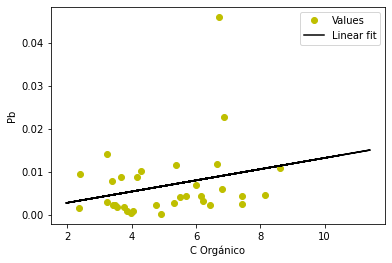

9.314058376552181e-05 x + -0.0002424222292119892


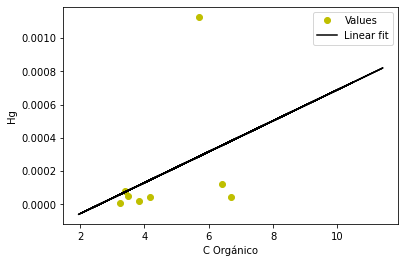

0.0029317833485114964 x + -0.004659841009101711


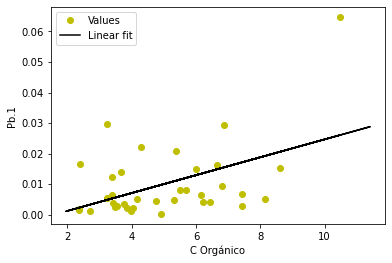

0.0017463685458388085 x + 0.023084183177772322


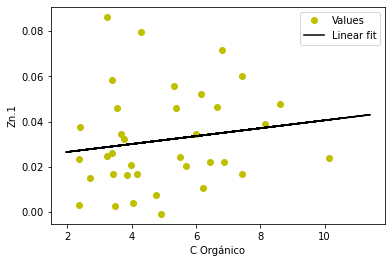

0.0002716560976601294 x + 0.0029267990676342475


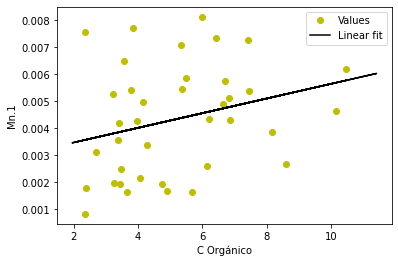

4.5574469305254185e-05 x + 8.36740558885077e-05


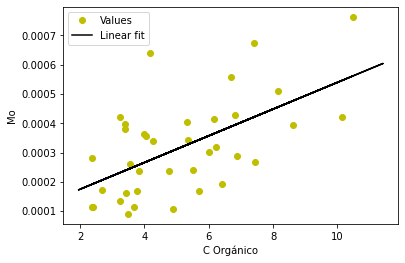

0.00023364756336061239 x + 0.00014067358753072629


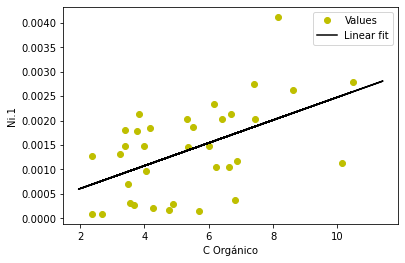

-0.00030960247350047003 x + 0.00925023924700335


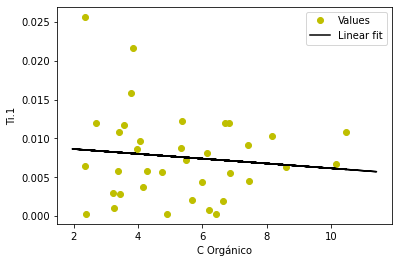

0.00038248559295965453 x + 0.00048752775728871977


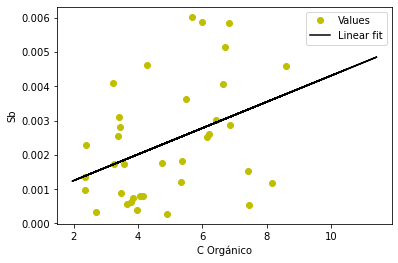

2.609986829267088 x + 4.118238165092962


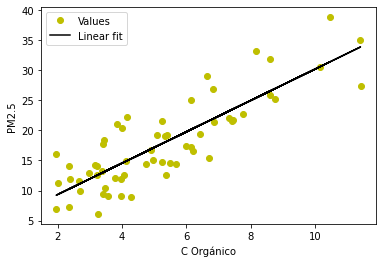

0.10502072749218726 x + 0.11421462989625174


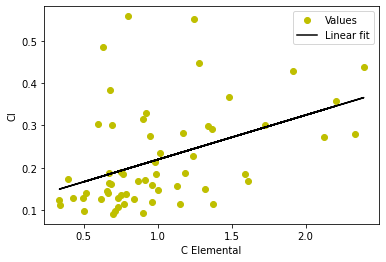

0.19081590427224793 x + 0.36589952422967265


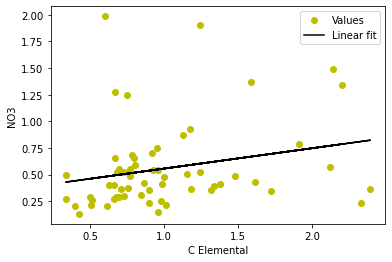

0.1714856278979868 x + 0.2617754936785498


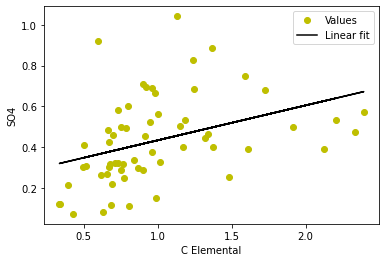

0.035057051183893996 x + 0.2563434589029817


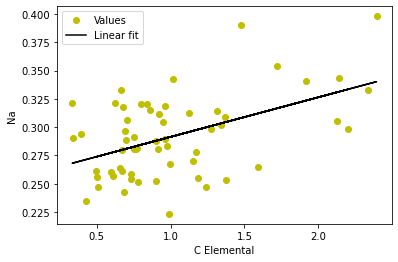

0.17877190406824334 x + 0.09311995414869992


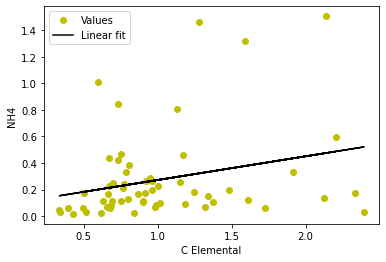

2.489443778557479 x + 2.6775606080625214


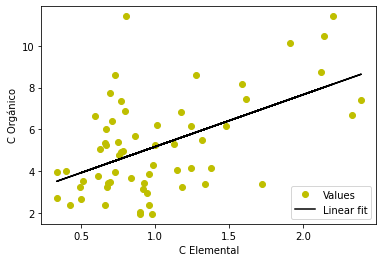

0.9999999999999996 x + 1.127987721007444e-16


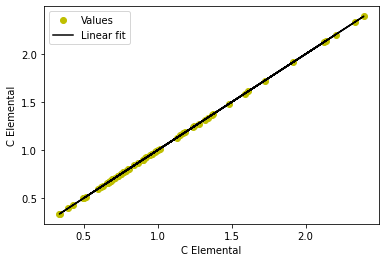

2.2494954232578253 x + 3.8971743961483716


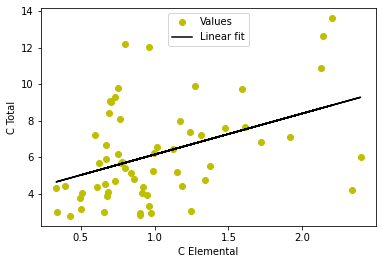

0.2608044338960929 x + 0.1710872154003087


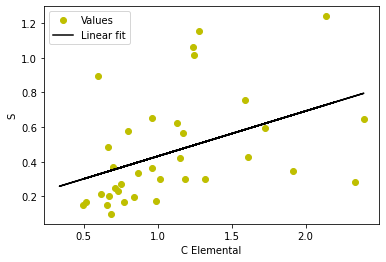

0.06264476818813951 x + 0.19135752341311646


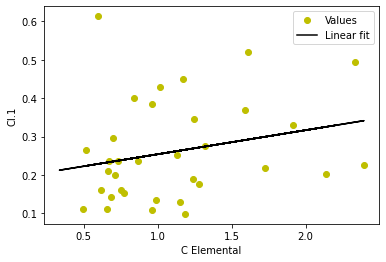

0.04441096337084774 x + 0.10709845697932947


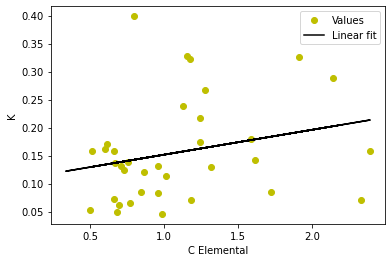

0.21482384947021727 x + 0.3450750666397219


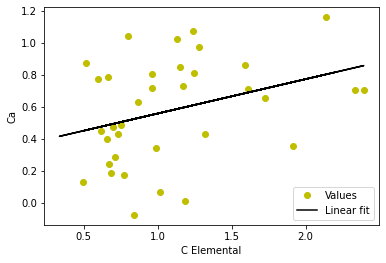

0.0018494440998100042 x + 0.006451392446926963


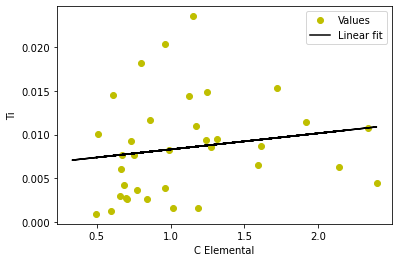

8.513341818377594e-05 x + 0.0013564283656567512


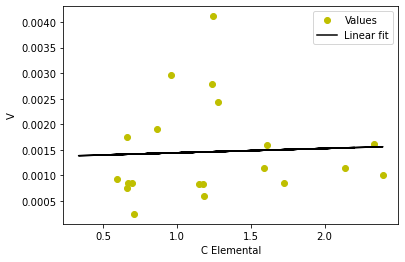

0.001286316489706456 x + 0.0007471111321945039


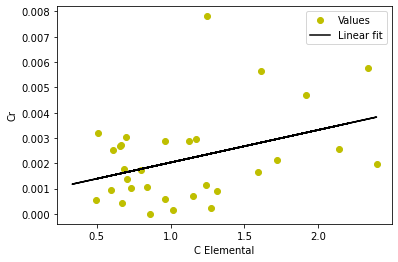

0.0012653952737344592 x + 0.002071875705875112


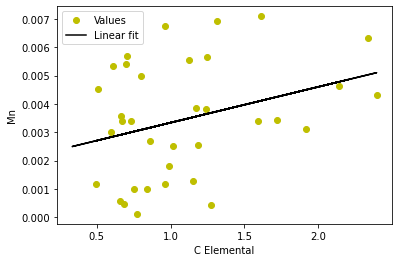

0.0931550806283943 x + 0.03456442592072258


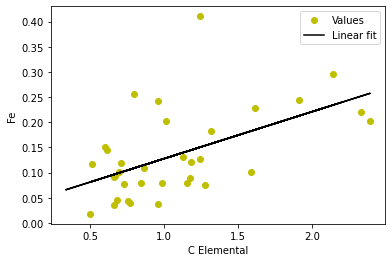

0.00034553155680900634 x + 0.0007477938016190206


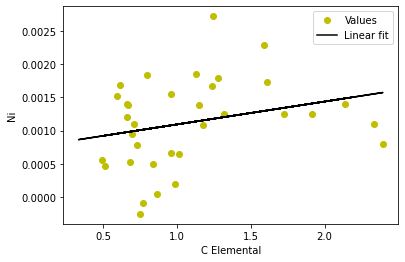

0.0036023062114739373 x + 0.0029022228757542476


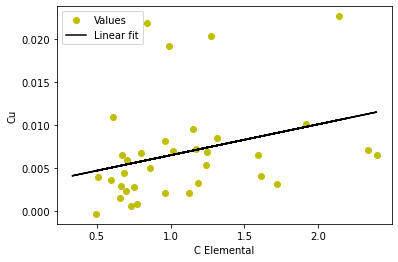

0.03425834330473627 x + -0.00207391613887011


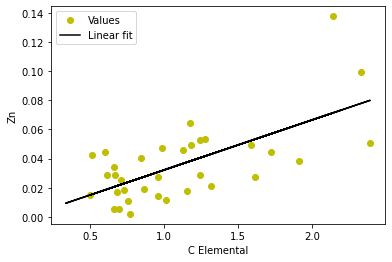

0.0010613160632324814 x + 0.0004857601076846239


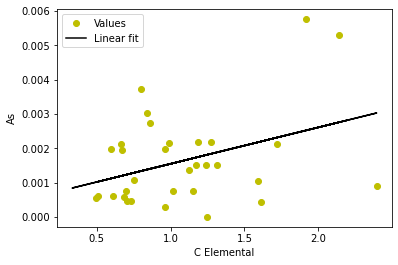

0.0009708380629739843 x + -0.00042440288787872713


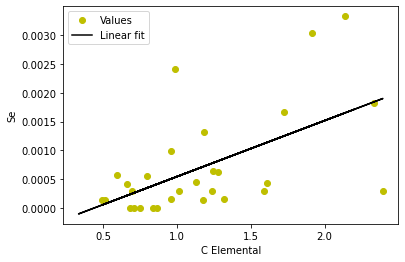

0.0009330121811373523 x + 0.0010064063950804435


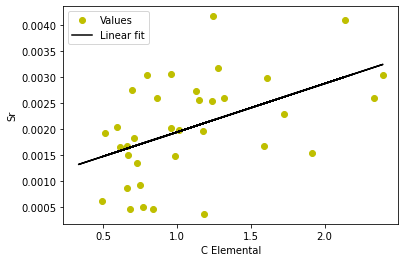

0.007981739346295763 x + -0.0014916884996332032


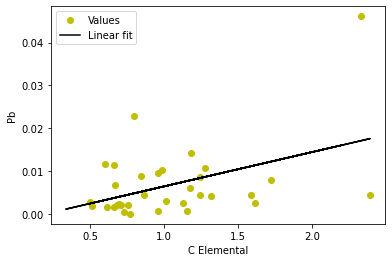

-0.00017817420743702873 x + 0.0004036802295814822


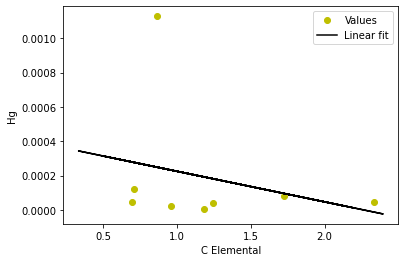

0.009809363651370967 x + 0.00012342451549510308


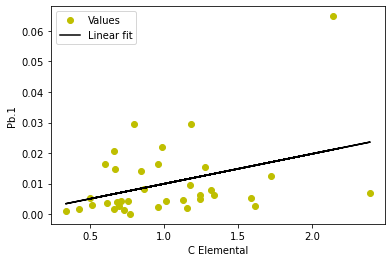

0.015587934121075252 x + 0.016202091252695186


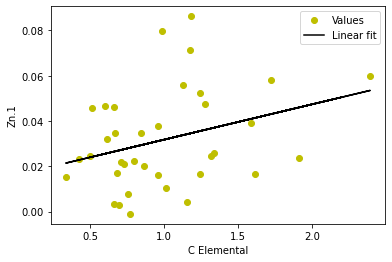

0.0008735766542092635 x + 0.003403161895051498


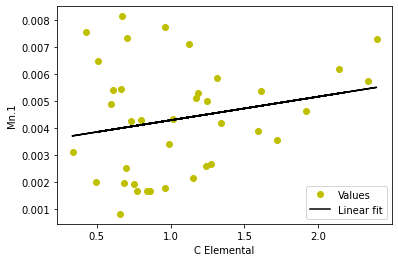

0.0002488779335183431 x + 4.9584995833775947e-05


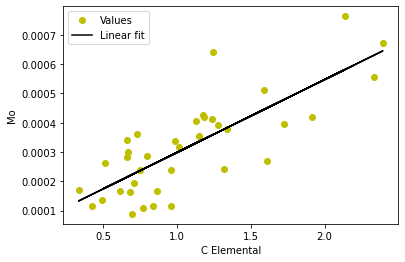

0.00105821300519022 x + 0.00025545369053888003


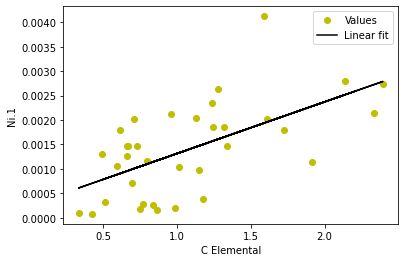

0.0002667219415592306 x + 0.007330004186965951


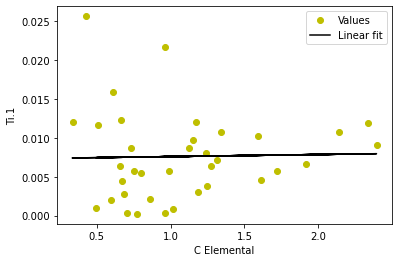

0.0006914094239728036 x + 0.001660199260797947


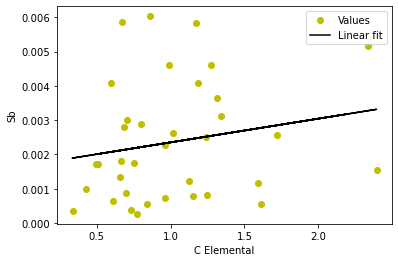

7.065608997808571 x + 10.575518304747437


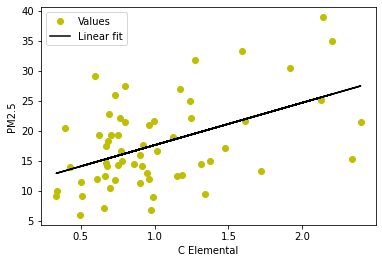

0.004567024783700441 x + 0.19147552121353895


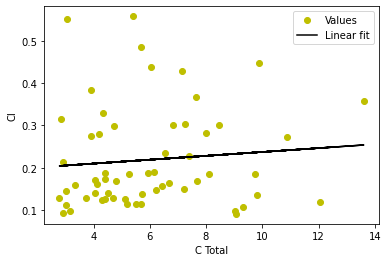

0.062377564455026374 x + 0.17713408934144853


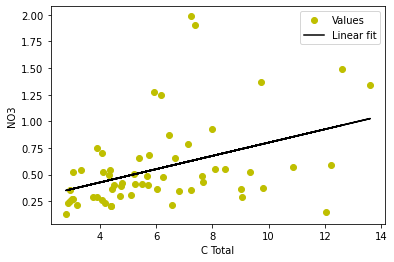

0.006967102230242622 x + 0.38348341397842256


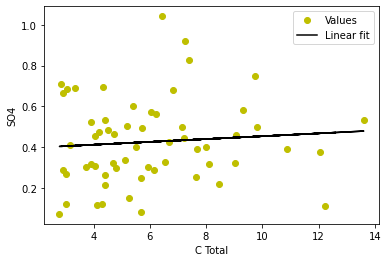

0.003631365764124866 x + 0.2689082365639754


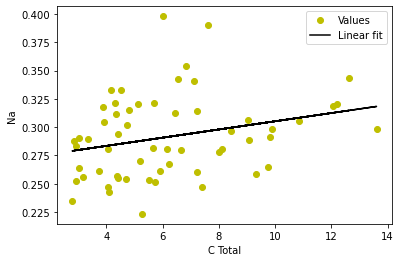

0.06362284415728528 x + -0.11396355556887919


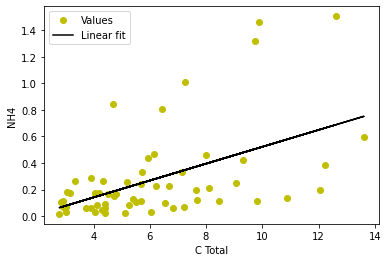

0.6996207337111389 x + 0.8814402826810892


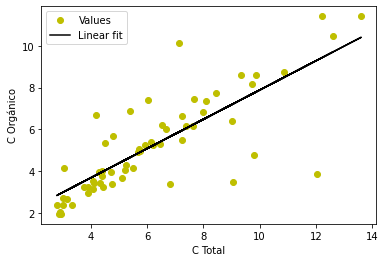

0.077980742339769 x + 0.5339823427892134


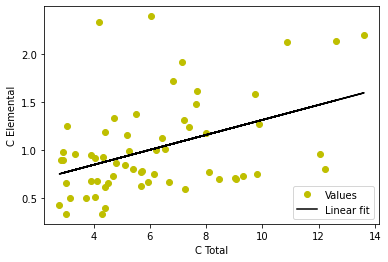

1.0 x + 4.548783747285368e-16


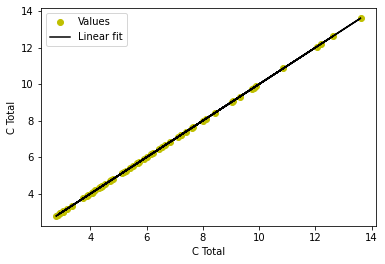

0.05150421472622814 x + 0.1270529578250804


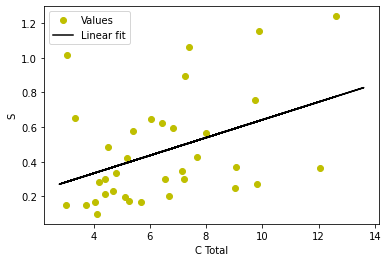

0.013075726372291 x + 0.1764293991541634


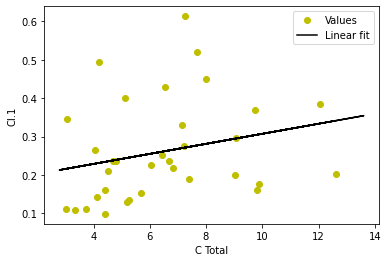

0.01162696461657854 x + 0.08128876429582226


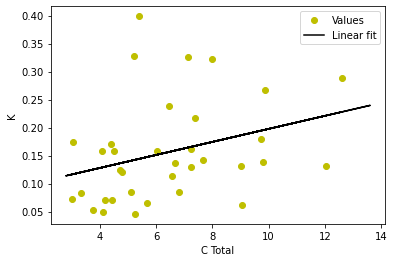

0.04302354596435403 x + 0.3049601398933508


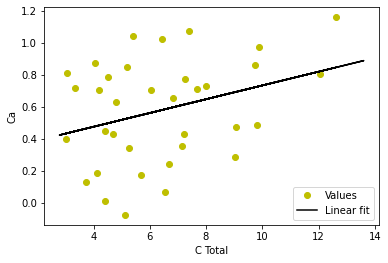

0.00016767256233803072 x + 0.007405529016828113


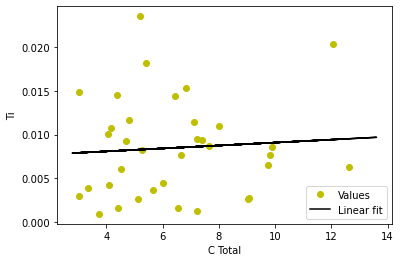

-1.224499626696014e-05 x + 0.001548895316499408


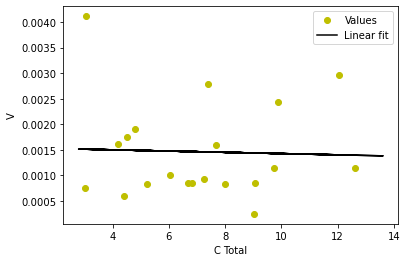

-0.00016939056062109154 x + 0.00327537524370007


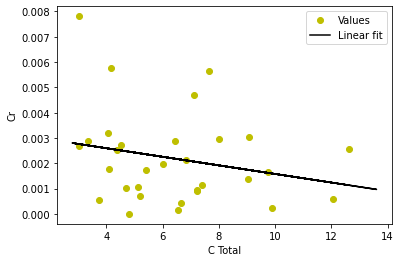

0.00022791003172516474 x + 0.001999141155303745


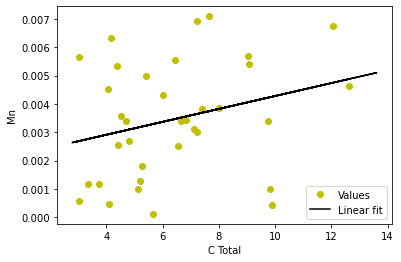

0.0071094995206276755 x + 0.08956020366447921


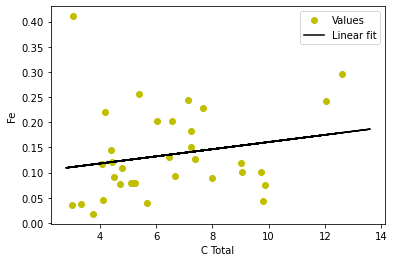

4.8722325091988165e-05 x + 0.000810807963246088


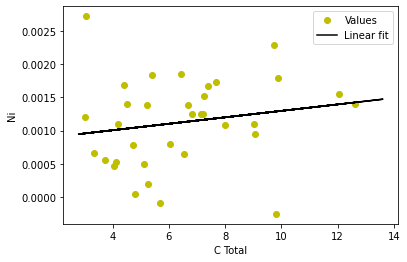

0.0005675066580458785 x + 0.0032163373557599845


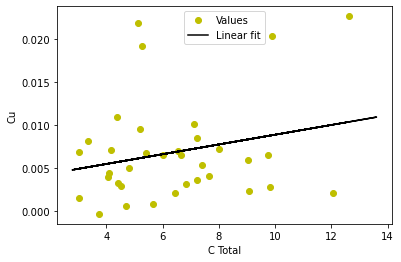

0.00311347974753139 x + 0.01576089508322318


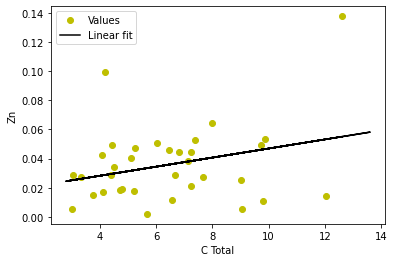

0.00010021047408371543 x + 0.0009721341503888507


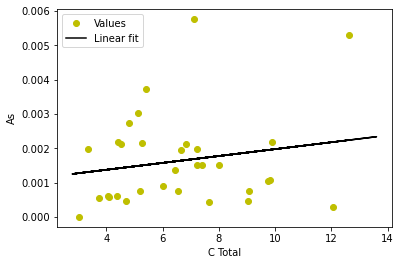

3.90969261346819e-05 x + 0.0004466090553745784


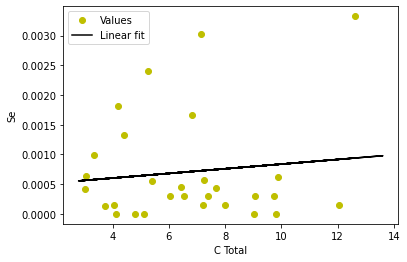

0.00014914428120797128 x + 0.0010739319603447087


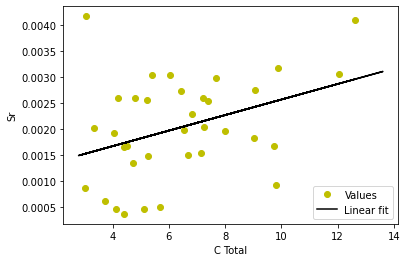

-0.0008198502960104363 x + 0.011898241704581258


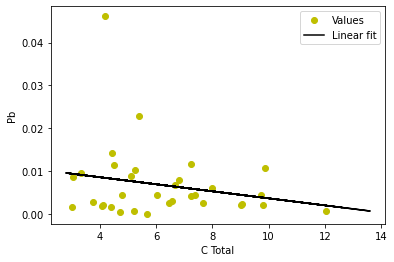

-2.7423610322967615e-05 x + 0.000370415207705652


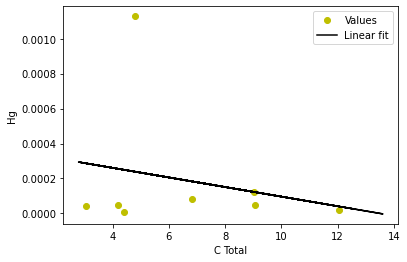

0.0014331007407359336 x + 0.001100335462311134


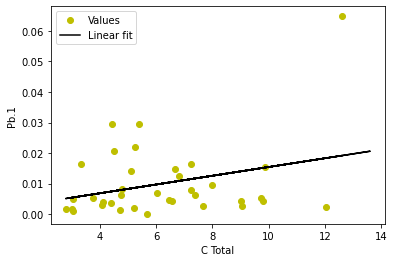

0.0001513347515678329 x + 0.03088421216675115


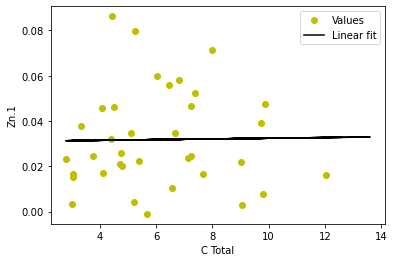

0.00018232039533575426 x + 0.0032071236956642047


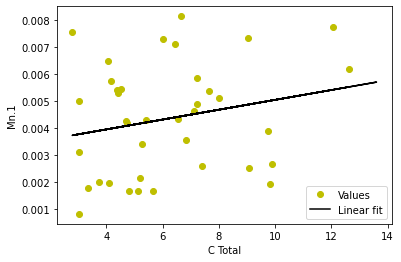

1.729545948343473e-05 x + 0.0002115617498931972


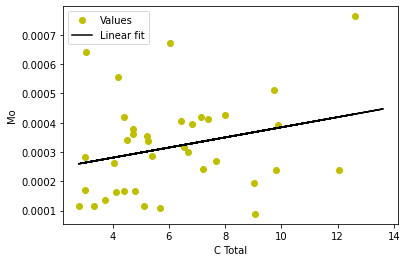

0.0001681566323699748 x + 0.00032293928666591416


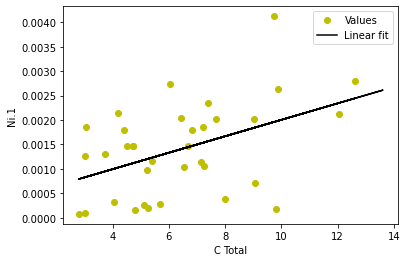

0.0001543438727351828 x + 0.006672280412733165


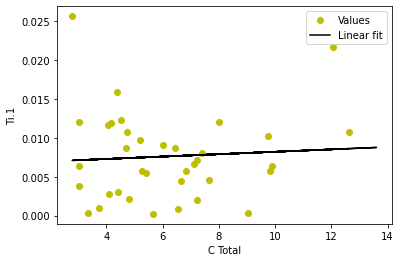

7.602731678364491e-05 x + 0.0019057564833679485


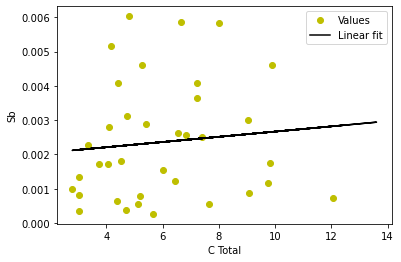

1.9971983167478515 x + 5.391509608618637


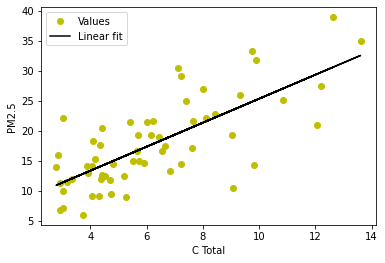

0.2741310275685962 x + 0.09696414142891702


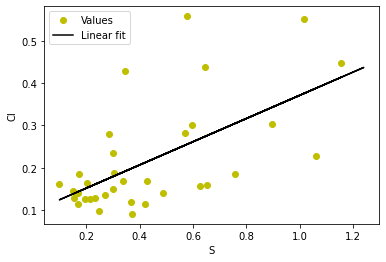

1.1888419248548703 x + 0.05691971579803255


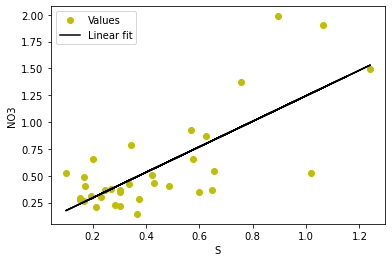

0.7006905730697097 x + 0.18136402517583503


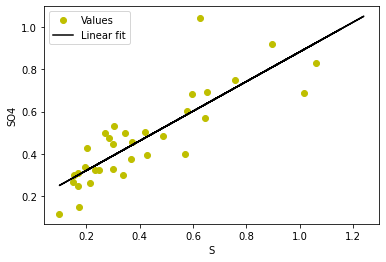

0.029588327666128986 x + 0.2803866520701398


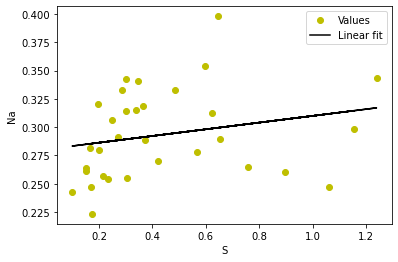

1.0277865555045798 x + -0.1262049899560912


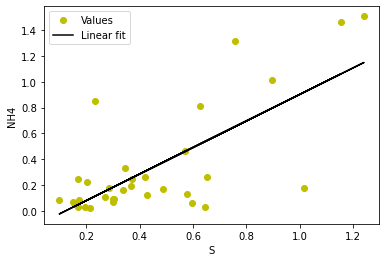

3.412292170361251 x + 3.823331397725755


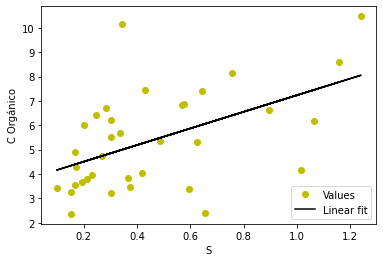

0.7118401861682789 x + 0.771603082889553


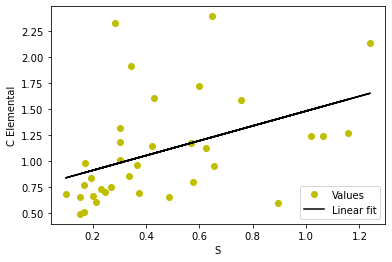

3.2437319806252134 x + 4.927150557598825


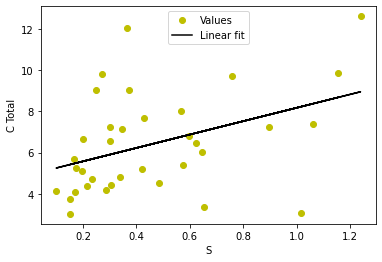

0.9999999999999999 x + 0.0


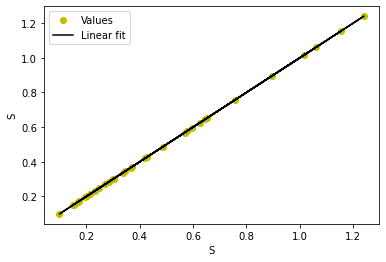

0.07061082136174113 x + 0.22859621105412736


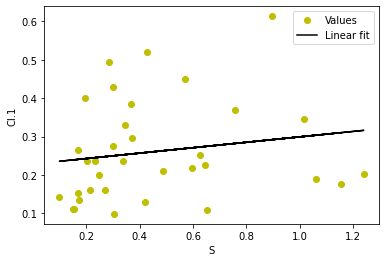

0.15131477597561563 x + 0.08663802799301976


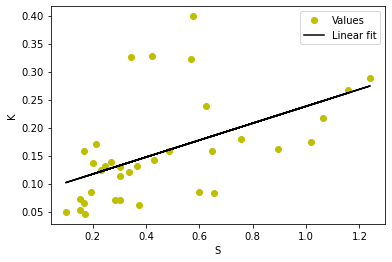

0.7831585109169984 x + 0.22268547805972663


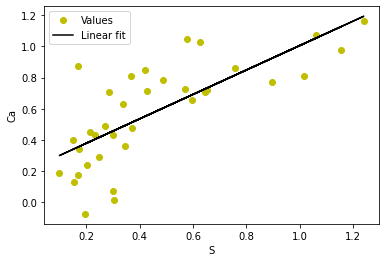

0.002460900178323264 x + 0.007355207227825337


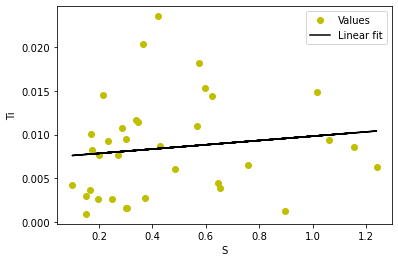

0.0012979026633404965 x + 0.0007137542787245025


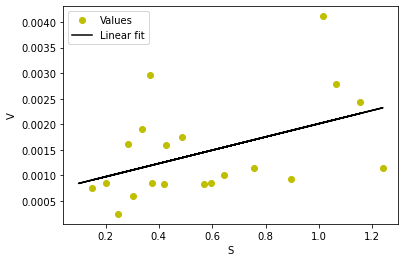

0.0007369564187413614 x + 0.0018282199615640082


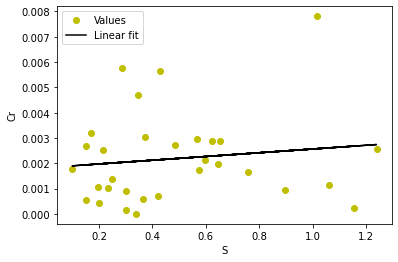

0.0009868581529342848 x + 0.0030088936977345523


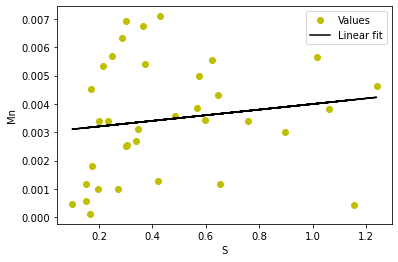

0.12018177393676337 x + 0.08059220846702696


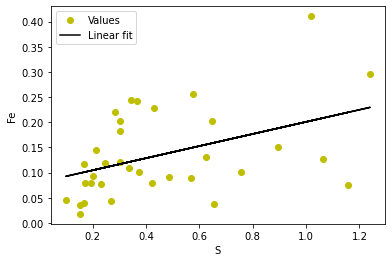

0.0012743835807710133 x + 0.0005375437490728142


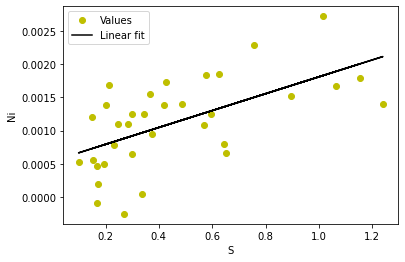

0.00628269274045361 x + 0.003981688837831579


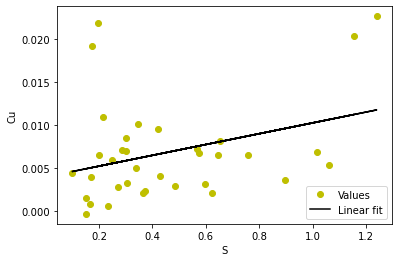

0.047574222086344646 x + 0.01422559351613987


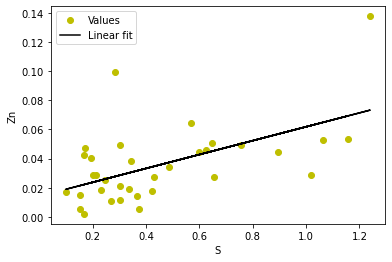

0.0011456035644754657 x + 0.0010830980660546045


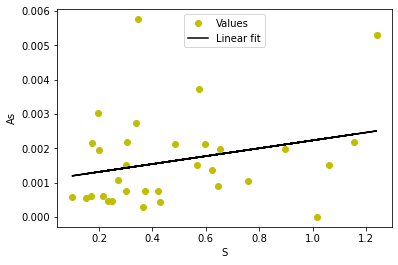

0.0006624095243602879 x + 0.00038084060740347964


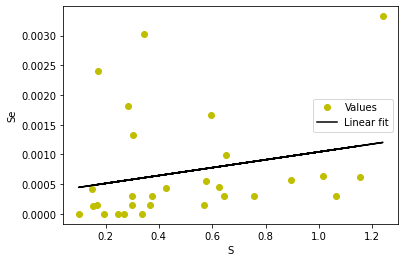

0.0021973212060208574 x + 0.0010253498686979084


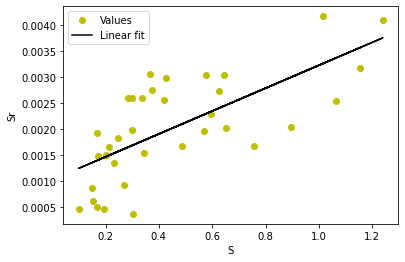

0.004159084893434577 x + 0.004997701761937246


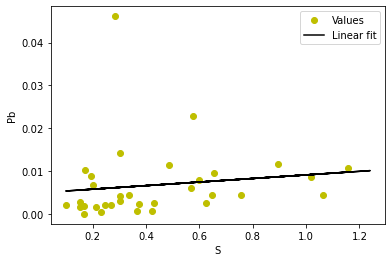

-0.0002557239031445764 x + 0.00029994336053318544


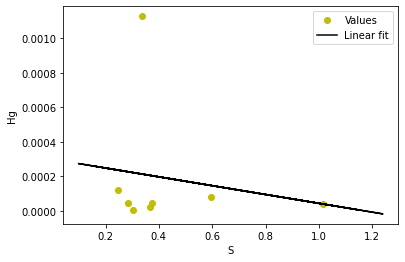

0.017778438898698002 x + 0.00235822751252854


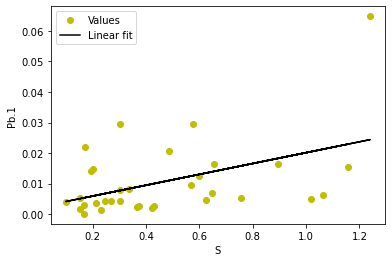

0.023640108763066783 x + 0.02236411107276549


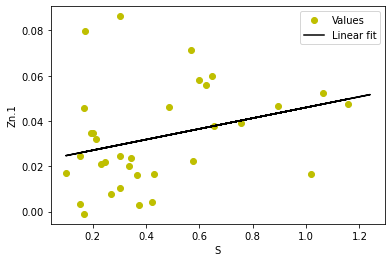

0.0006647625837944399 x + 0.003977628823815286


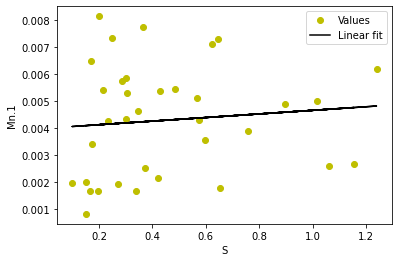

0.00035085657275729876 x + 0.00017058554068569756


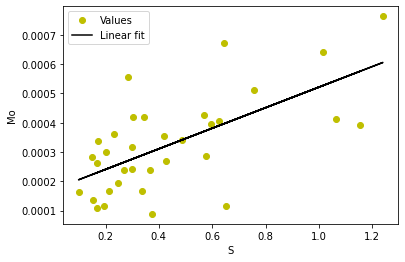

0.001640453815070461 x + 0.0007073679305902127


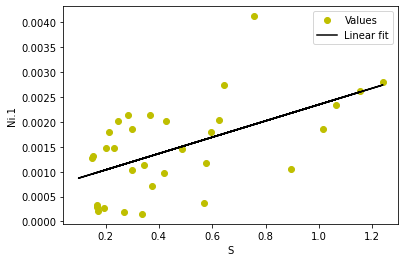

0.0013080304629039 x + 0.006230150339448508


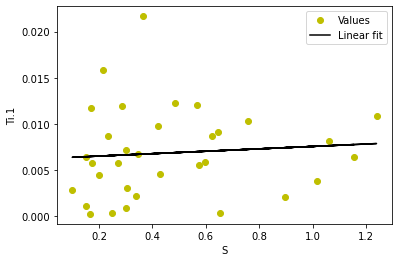

0.0004613057830402223 x + 0.0022387897333180965


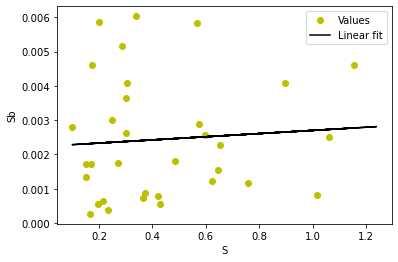

18.75134440594833 x + 9.468429879124912


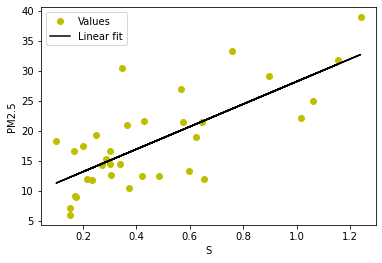

0.23365718620961257 x + 0.1443112212559518


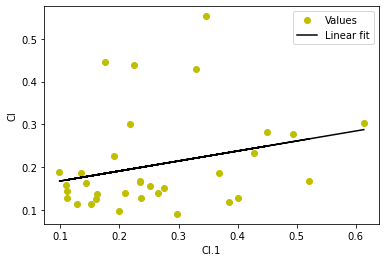

0.897225544436587 x + 0.3373539288371823


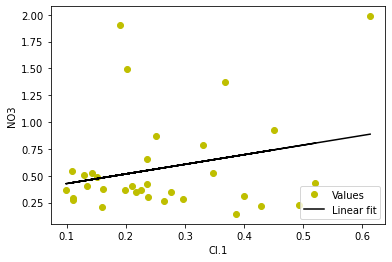

0.4069371896868016 x + 0.3582223151279588


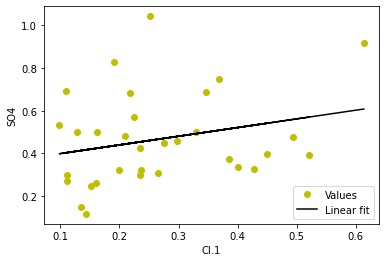

0.0821808038494585 x + 0.27278446902645465


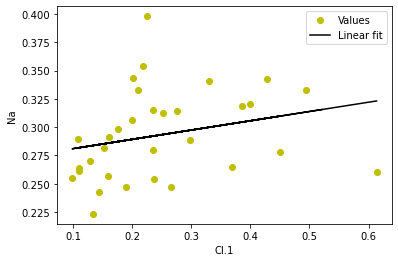

0.4896452031773173 x + 0.20799029507201514


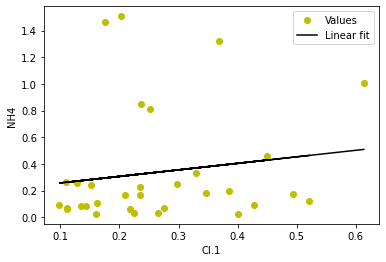

6.036714016885964 x + 3.7664494543923928


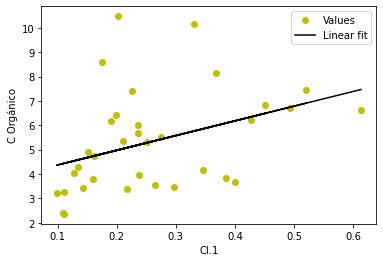

0.9619668023902375 x + 0.8551352226919727


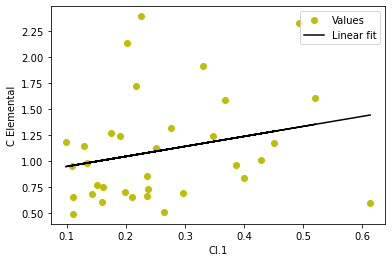

4.658010545175848 x + 5.225701715137512


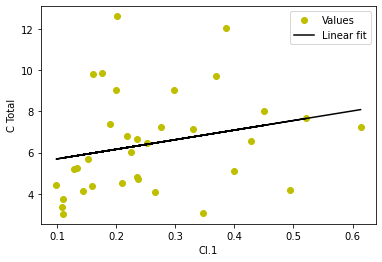

0.3996443669952319 x + 0.34955740695861165


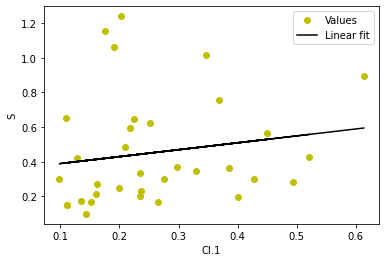

0.9999999999999998 x + 0.0


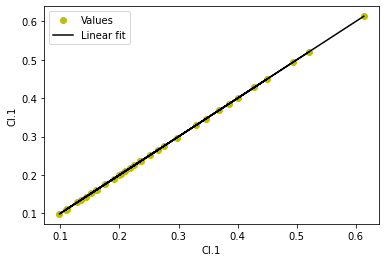

0.0936276177290228 x + 0.12427428568509738


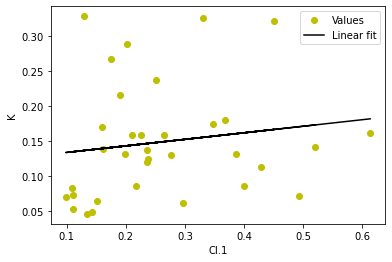

0.38131037816979735 x + 0.4676583725484534


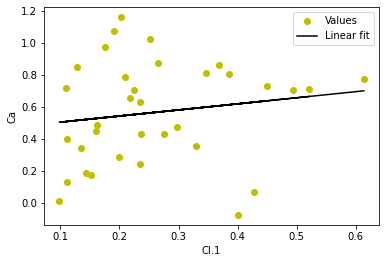

0.0016630041105349692 x + 0.0077594519506447674


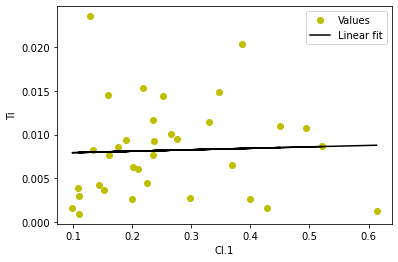

0.000993029371478206 x + 0.0011791087640137098


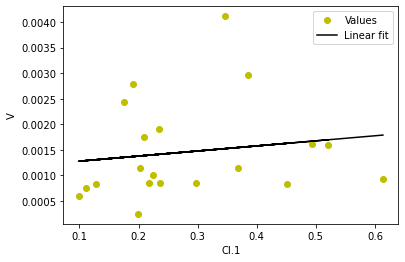

0.003996560929729054 x + 0.0010943079259459869


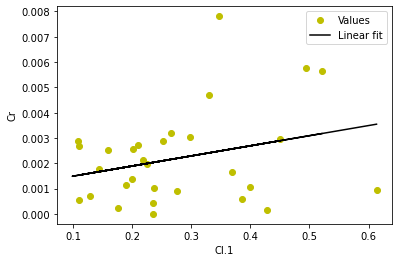

0.0074483739907703845 x + 0.0014734936844625736


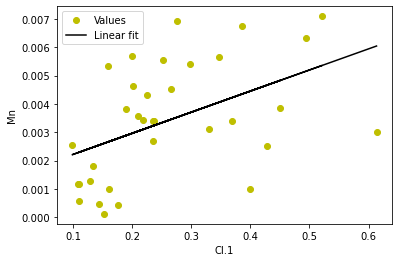

0.31409796342147756 x + 0.0490806410044923


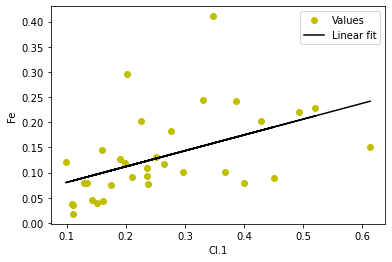

0.0015686227683250316 x + 0.0006876234523987924


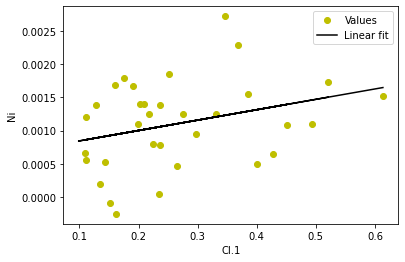

-0.00036285801633655887 x + 0.006951287454014988


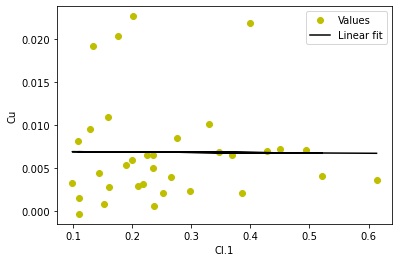

0.041069666665025685 x + 0.02510674629318233


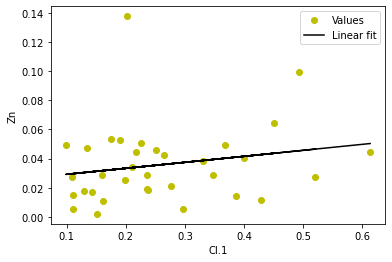

-0.0002610635210512592 x + 0.001635210763496011


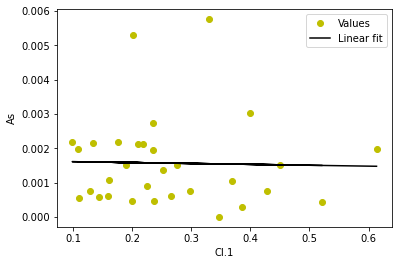

-0.0005277136393693972 x + 0.0008582309699146796


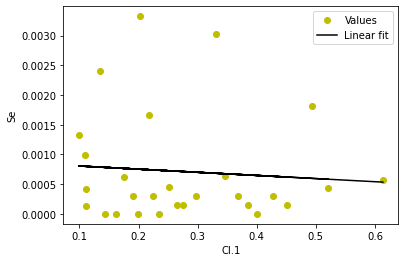

0.0022816435121713954 x + 0.0014055363017046905


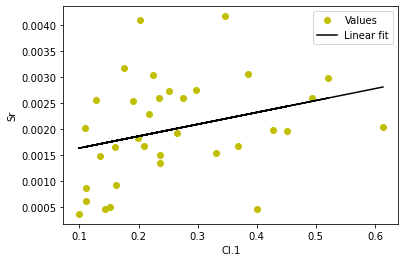

0.01911730105624042 x + 0.0013373403393116894


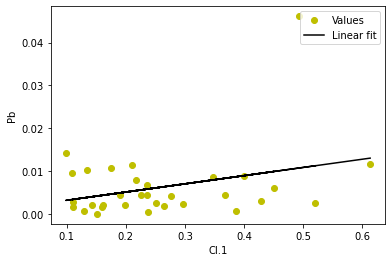

-0.0005398093152649398 x + 0.0003407664801988927


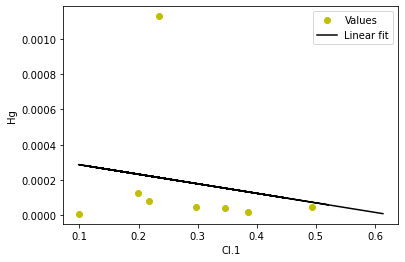

-0.010900362723627127 x + 0.012789468160951606


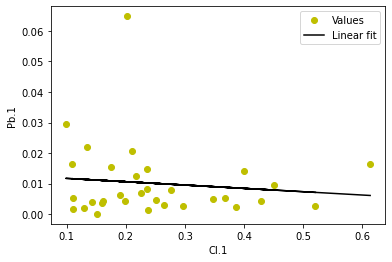

-0.004048397861906592 x + 0.03409679226019933


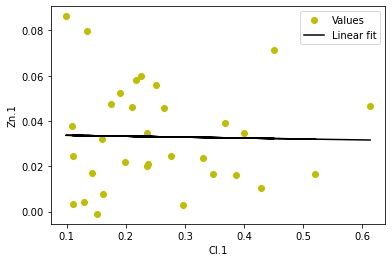

0.005247656114824076 x + 0.0029134943271412754


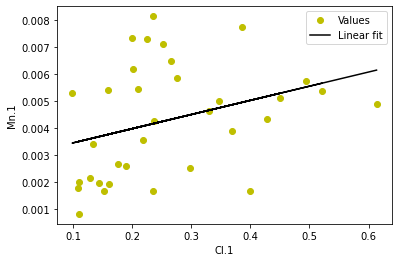

0.0002976736648729149 x + 0.00025328047974585967


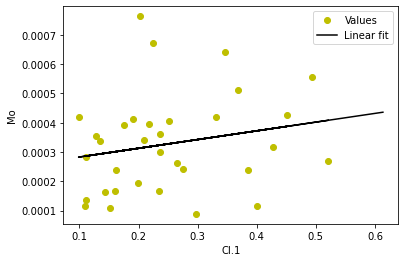

0.0005035732278045882 x + 0.0013452500107519543


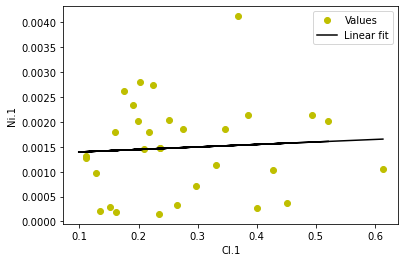

0.006326373523974549 x + 0.005270295552511438


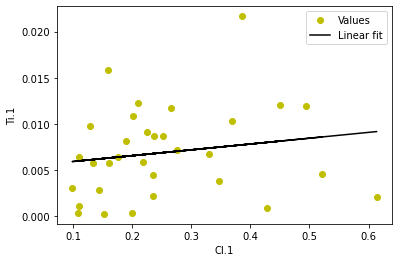

0.001295685172529225 x + 0.0020892912122423965


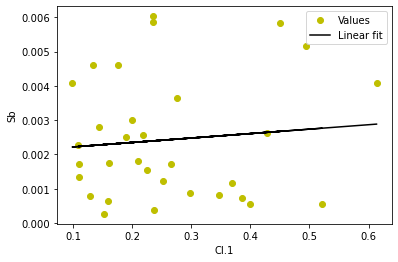

26.09219817383449 x + 11.397892121291543


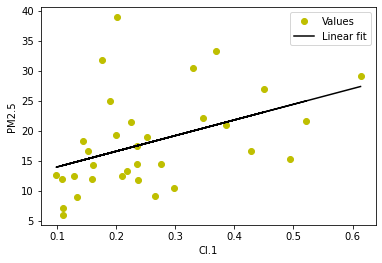

0.7553354665152959 x + 0.10122796077136029


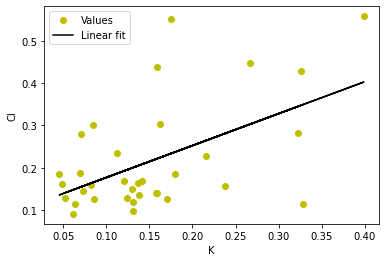

2.231119093337684 x + 0.2356725698439971


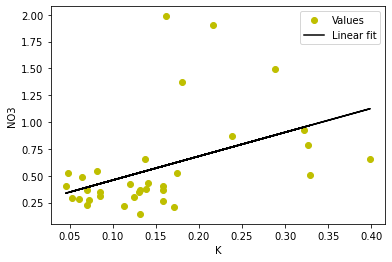

0.9433365822632428 x + 0.33023126965061345


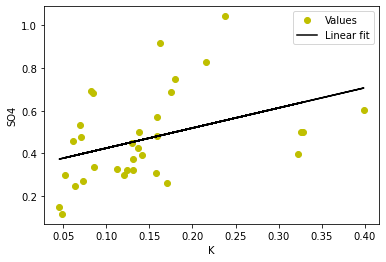

0.08065376146874004 x + 0.2813702555337083


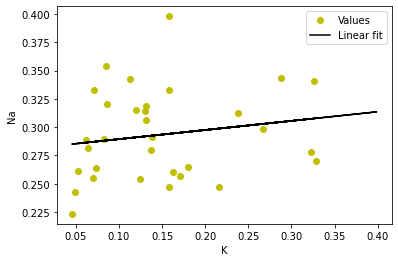

1.8629883713487834 x + 0.04312166615515077


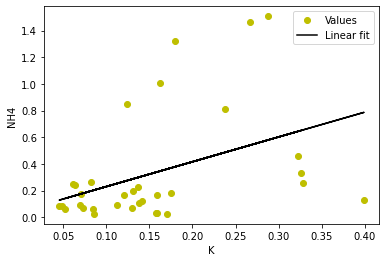

13.601574580729064 x + 3.2640529806136582


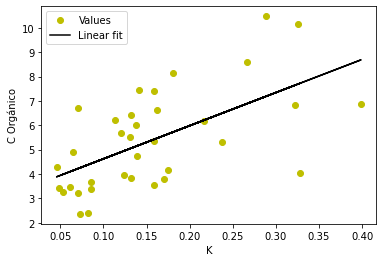

1.3951321688337504 x + 0.8796708174660589


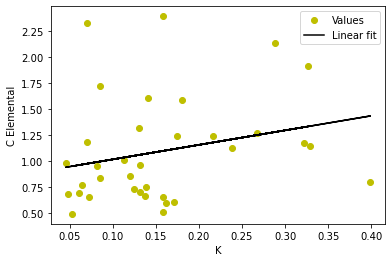

8.42803189881682 x + 5.096946725292406


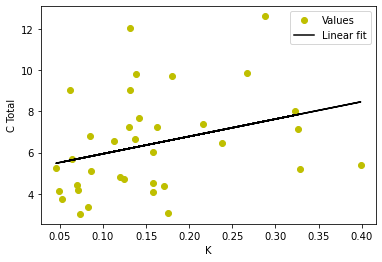

1.7415621056398172 x + 0.18583525707700663


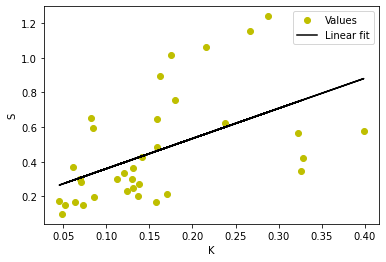

0.24151621331533396 x + 0.2247257678939635


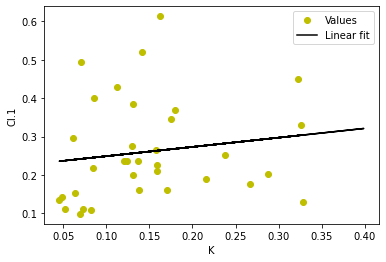

1.0 x + 0.0


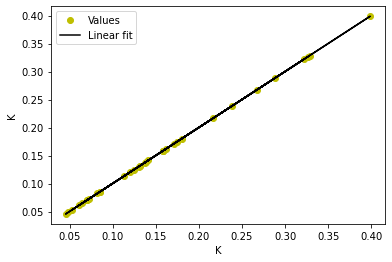

2.2256958168729852 x + 0.2339419411639188


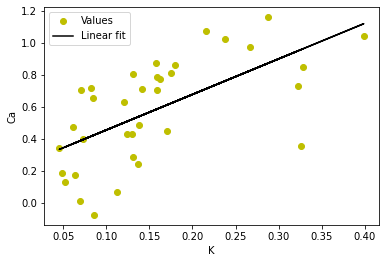

0.034081595870875316 x + 0.0031697511651660217


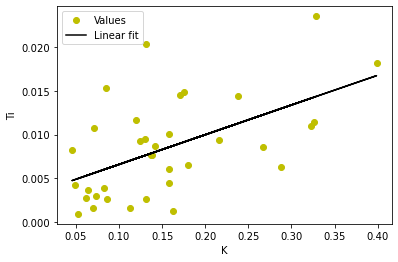

0.0014070733789901162 x + 0.0012317707773350423


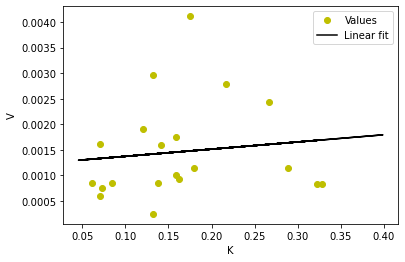

0.0008514405467287867 x + 0.0020459077288655504


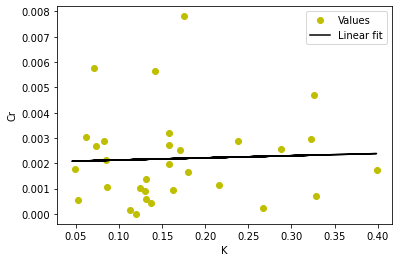

0.004272281682221137 x + 0.002794383808695958


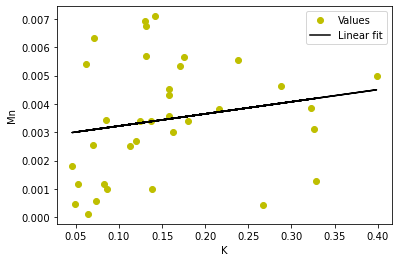

0.3619534475398291 x + 0.07789404530453295


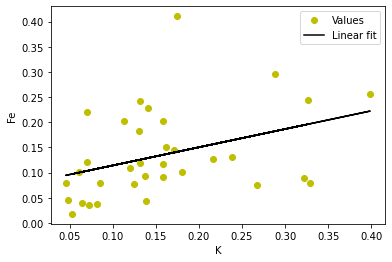

0.003603115459905222 x + 0.0005554600998981513


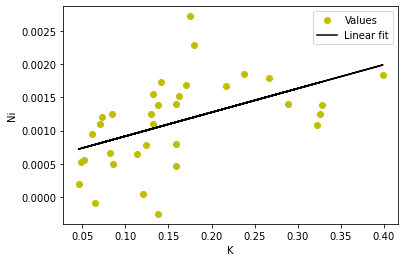

0.018232556296434194 x + 0.004013173660592374


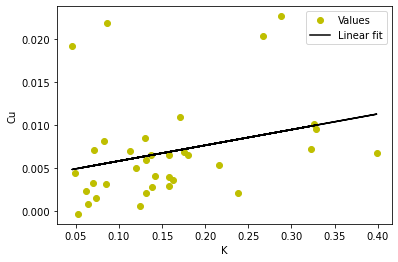

0.12668067550928613 x + 0.016976406020077862


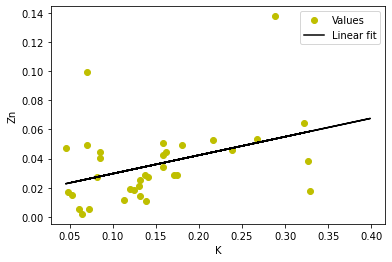

0.0064377157737228454 x + 0.0005790218187957632


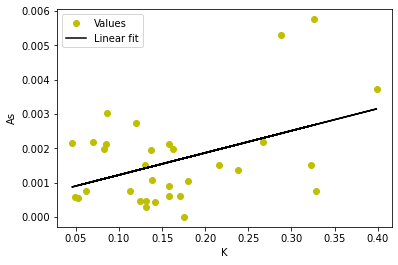

0.0019420857468767621 x + 0.00040771265554231587


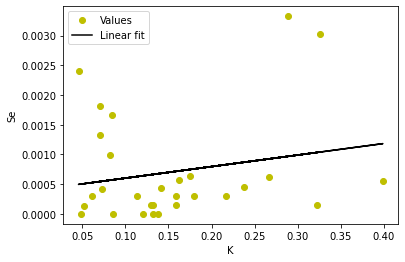

0.005195727384154221 x + 0.001220378945086308


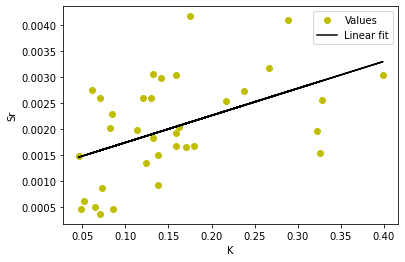

0.004848675587864084 x + 0.0061037836664139785


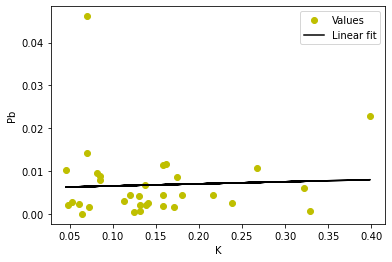

0.0015304868219321146 x + 2.5679496253255193e-05


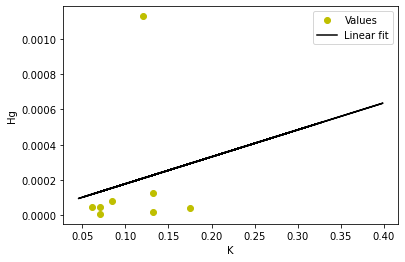

0.044053449883184936 x + 0.0038897326658051106


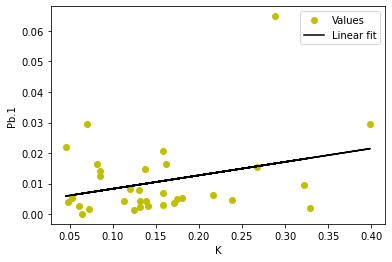

0.01693100907254131 x + 0.030121272411796983


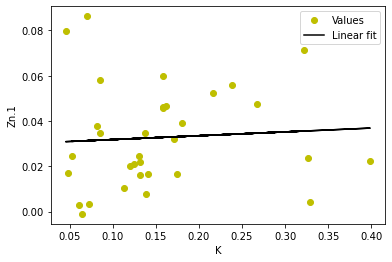

0.005015785732888442 x + 0.0035000023317488904


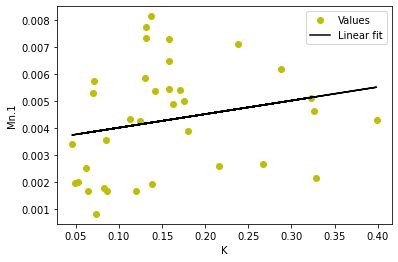

0.0007408210464315414 x + 0.00021117285986396


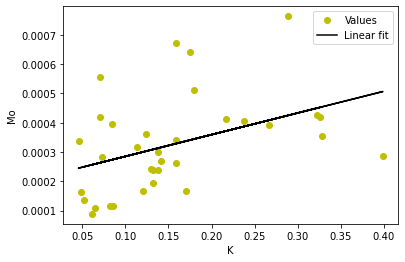

0.0018519915164992265 x + 0.001169619852999037


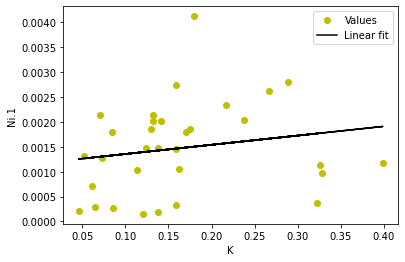

0.01632211781642668 x + 0.004217166001801103


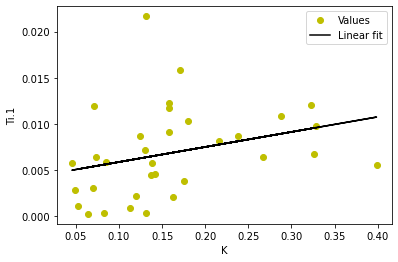

0.001487752797146642 x + 0.0022221559308001197


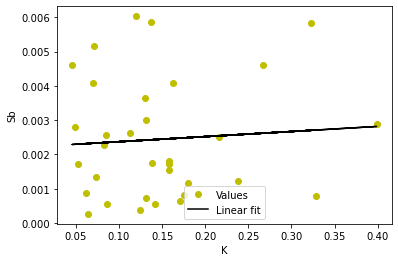

52.31696016543108 x + 9.926749935399908


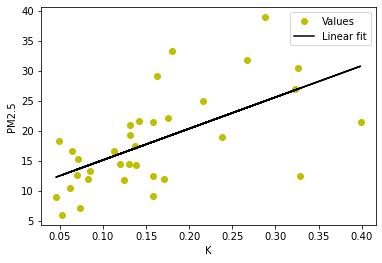

0.15581545580819053 x + 0.12815870737271534


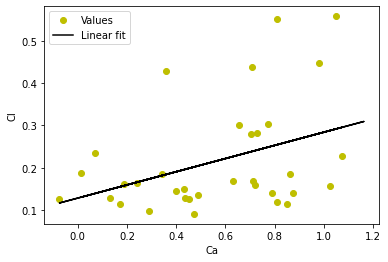

0.7059856013127389 x + 0.17429568645997523


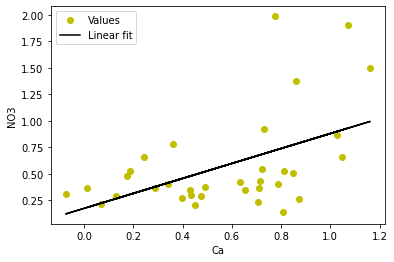

0.42748733046298254 x + 0.23468217977947023


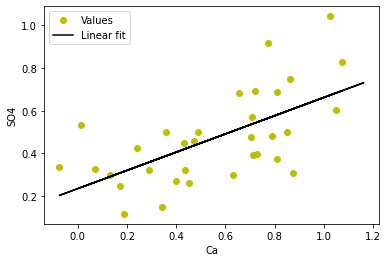

0.016851408178407013 x + 0.283963806418568


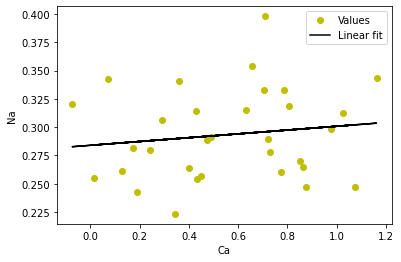

0.6779199639591685 x + -0.058192101147389944


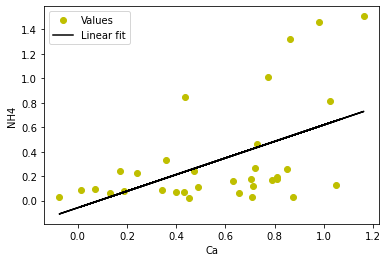

2.447712087088082 x + 3.9619415440921224


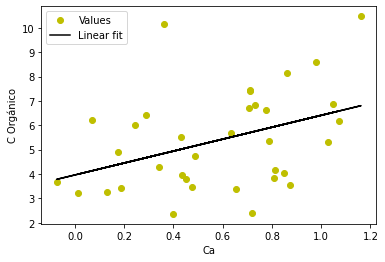

0.5245977452858946 x + 0.7924002339838281


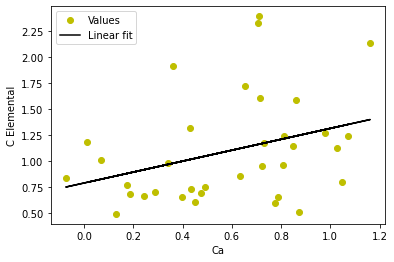

2.4242912167721813 x + 5.0022957410768765


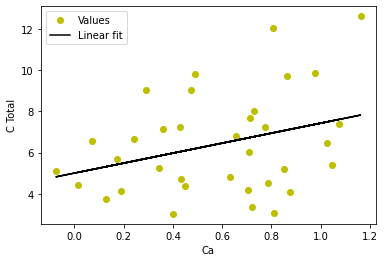

0.7006902358265273 x + 0.05027969835764255


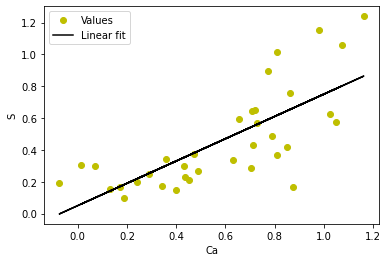

0.06394835148073712 x + 0.22437230686669912


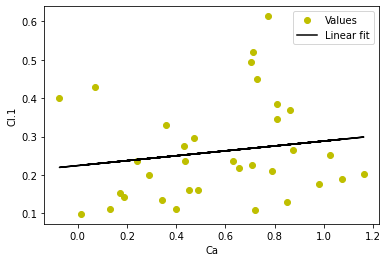

0.17301532624760899 x + 0.05534134821838413


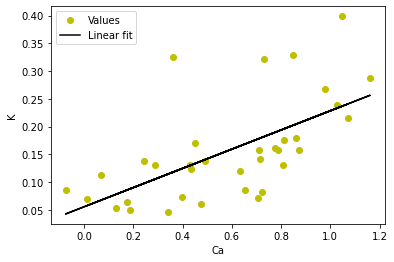

1.0000000000000007 x + 0.0


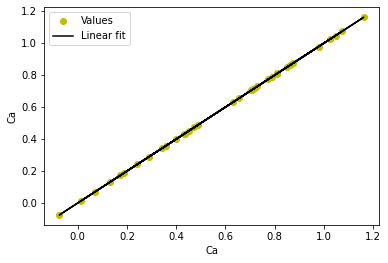

0.009132319592901164 x + 0.003176751525452375


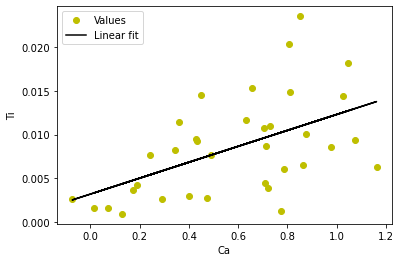

0.0017340346791956513 x + 0.0002774805495766771


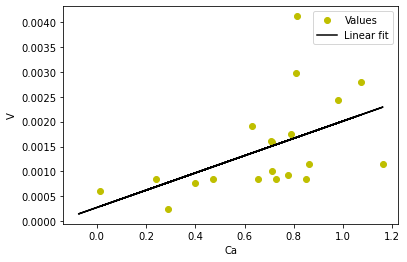

0.0012135047114538414 x + 0.0014311186357139117


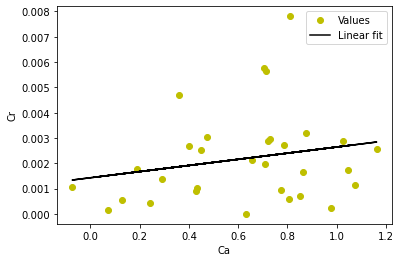

0.002382031031030581 x + 0.00207672658601401


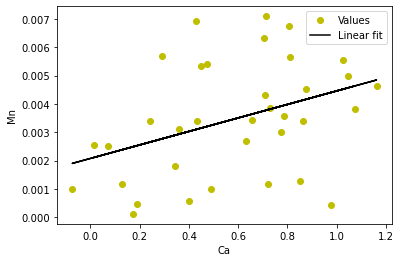

0.09910264077364134 x + 0.07770927868033117


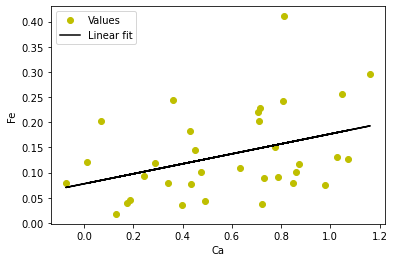

0.0011882706279235458 x + 0.00041604784844020195


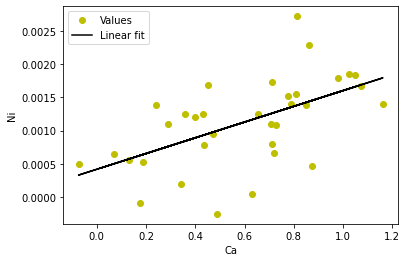

0.0016348571106866365 x + 0.005904726952730085


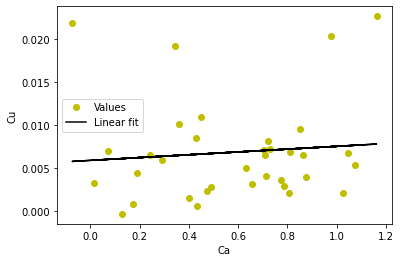

0.04033011296835934 x + 0.012942067725803169


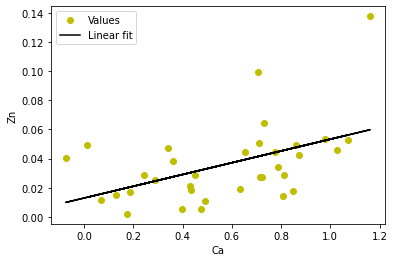

0.0004690370816413981 x + 0.0013552031720442262


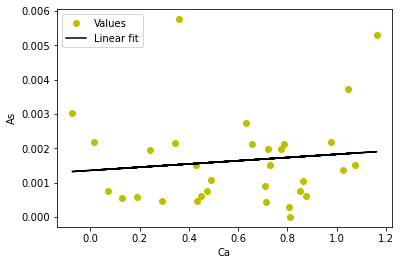

0.00034094774936013864 x + 0.0005026467786139523


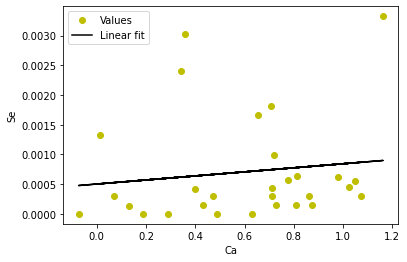

0.0022982510575589744 x + 0.0006952681952309124


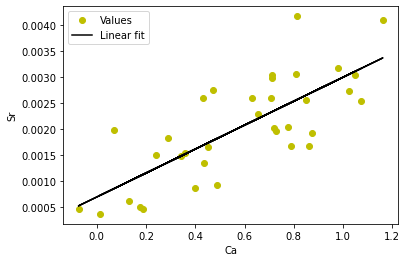

0.004536740028287575 x + 0.004229610943835078


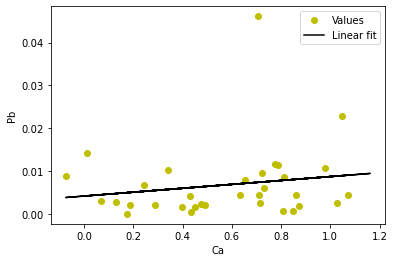

0.0001599004907206069 x + 9.962690831041915e-05


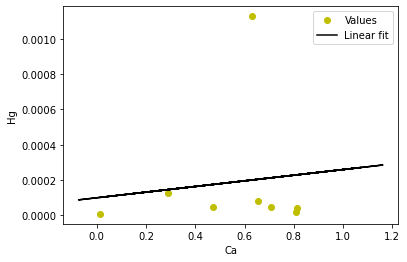

0.009385500700088773 x + 0.0051626205386090486


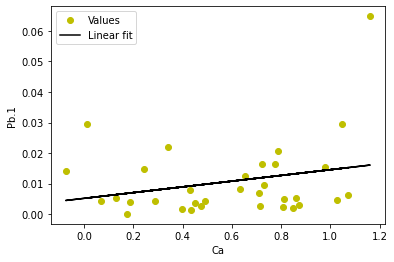

0.011172678944836728 x + 0.026485762283534876


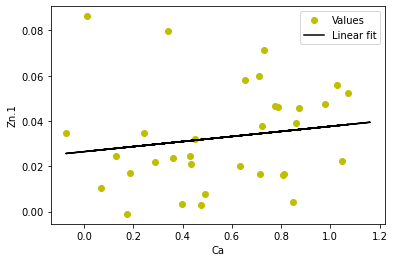

0.0014321905889165332 x + 0.003449817502393209


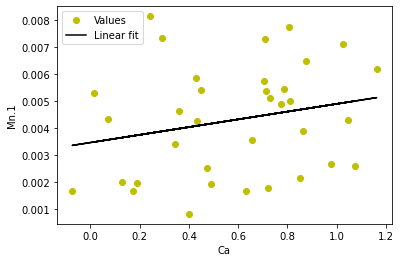

0.0002522861631607561 x + 0.00018139443665780497


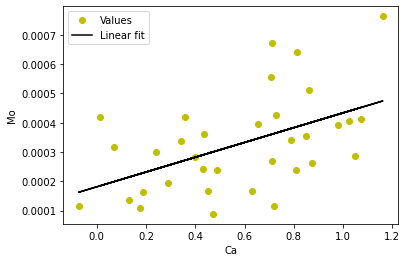

0.001351598770300546 x + 0.0006540151495879592


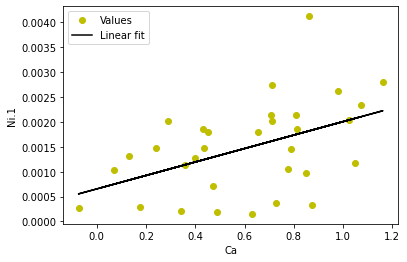

0.007241195187138046 x + 0.002469424475005603


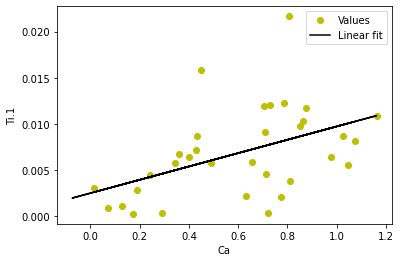

-5.337855921830083e-05 x + 0.002470757730517256


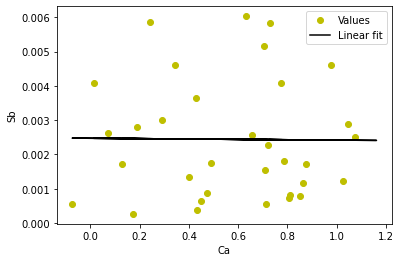

12.72817685269044 x + 10.549652872227085


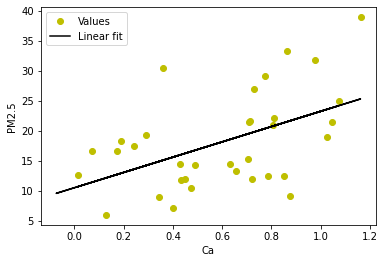

5.391939339237356 x + 0.16990401019775586


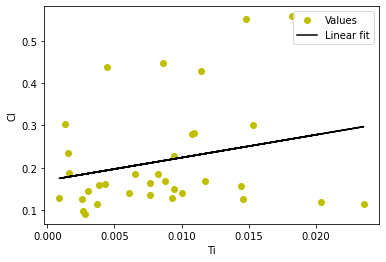

-6.131506725847712 x + 0.6280116349587875


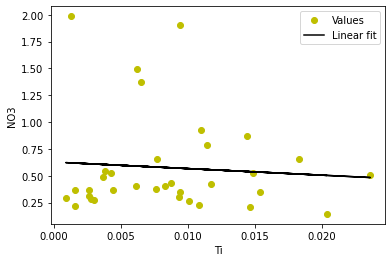

6.404853860815226 x + 0.41553408706675565


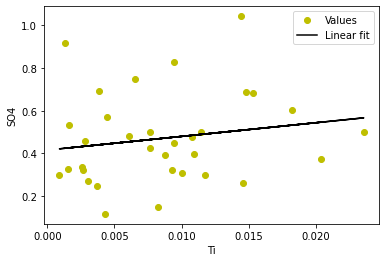

0.5267097679728909 x + 0.2891173630706007


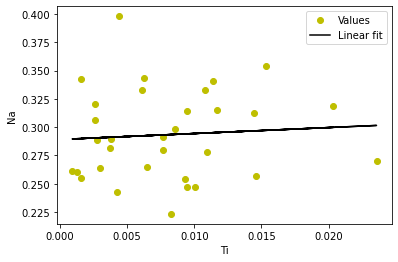

-3.8312519438096913 x + 0.3644398362483886


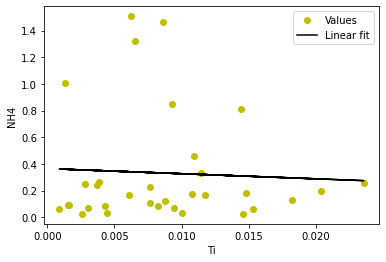

9.935516796038426 x + 5.299193184415889


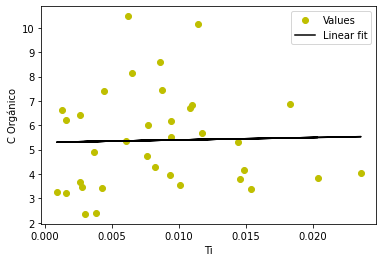

15.028479590942538 x + 0.9696135782639395


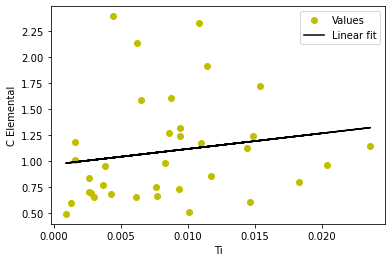

31.439128524114004 x + 6.14358769017712


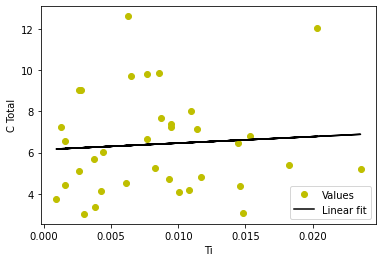

7.326563246509598 x + 0.3950736172656876


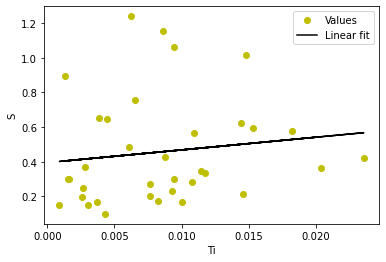

0.9571539484611505 x + 0.2527917695614661


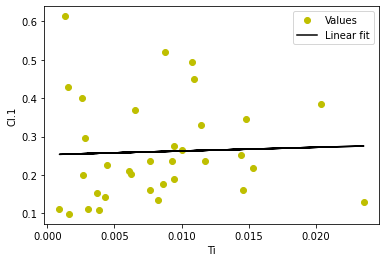

8.815939486650892 x + 0.08105775972424657


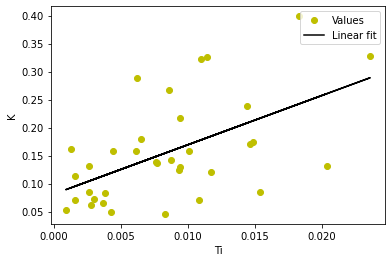

30.388622429514882 x + 0.32304380007904515


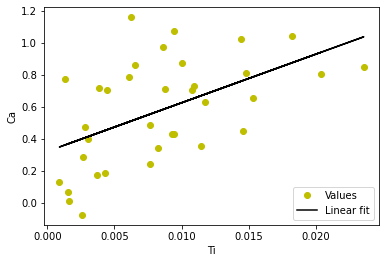

0.9999999999999999 x + 0.0


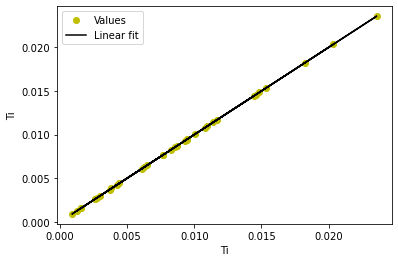

0.07107917616996937 x + 0.0008347706461659808


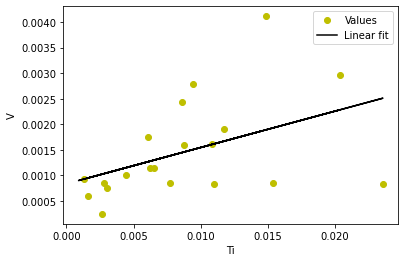

0.044453049945709054 x + 0.0017917156863990764


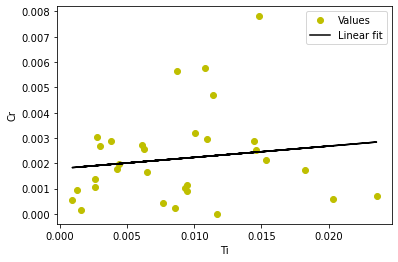

0.13190276755650465 x + 0.002341509716837418


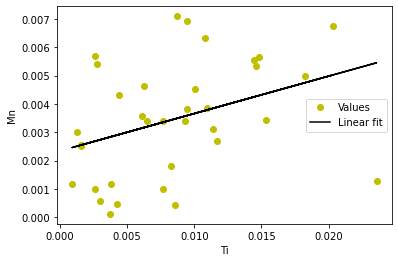

5.985971804770998 x + 0.08549433137840196


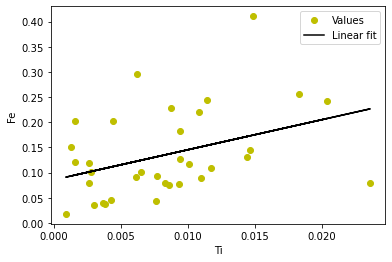

0.04765021041799239 x + 0.0007122377091013956


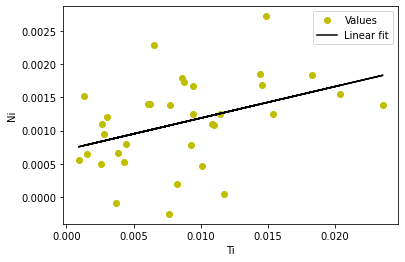

0.0341917763050008 x + 0.006564211822921529


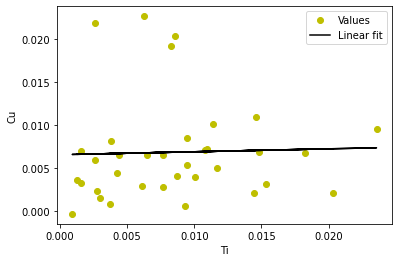

0.21303279969087308 x + 0.03406552873074568


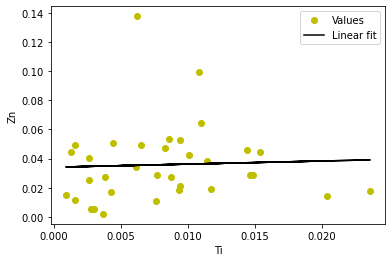

-0.0018832382014922866 x + 0.0016508432448811845


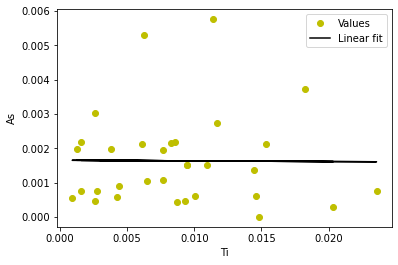

0.01888110439402845 x + 0.0005561123162322084


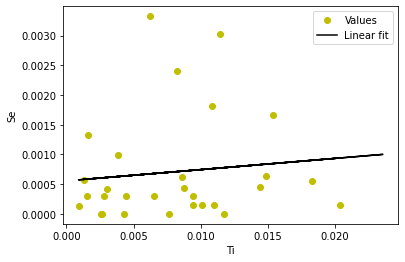

0.08474821938768944 x + 0.0013112829180763714


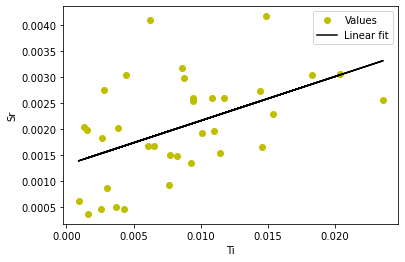

0.09845554683557381 x + 0.005981963731110427


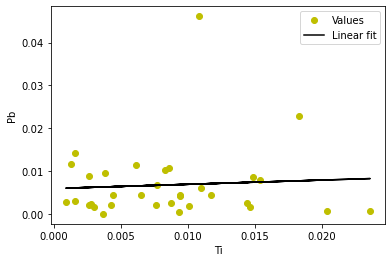

0.004343976211785197 x + 0.0001438450855651176


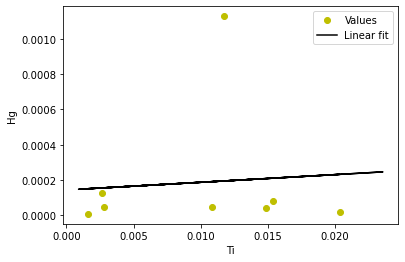

-0.2151185790485575 x + 0.012430603521968389


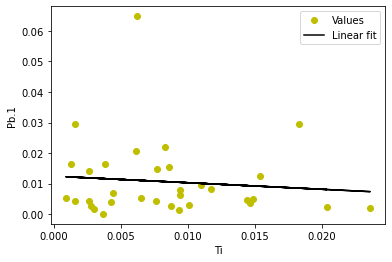

-0.2634298336753352 x + 0.03496867273342841


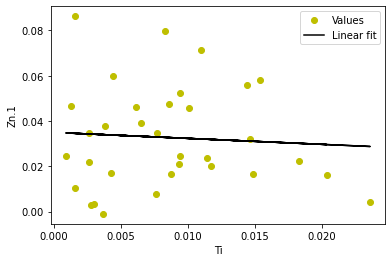

0.07408894280098718 x + 0.003653262136801708


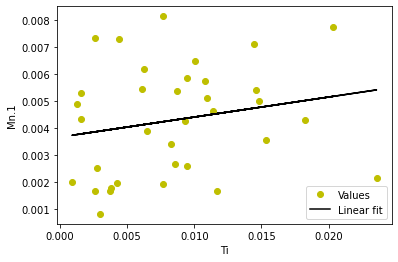

0.00571151970625135 x + 0.00027682701726333545


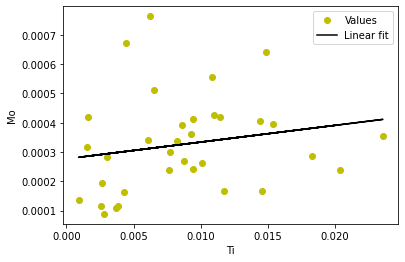

0.010647044433409723 x + 0.0013780694358183415


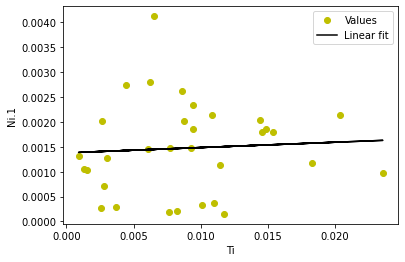

0.48737935121902987 x + 0.0025378636484583886


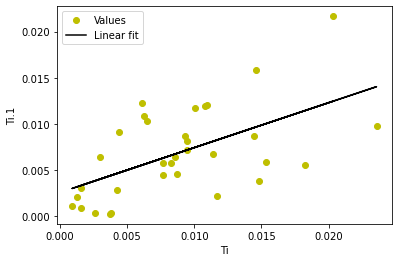

-0.024043034397188925 x + 0.002643734746485296


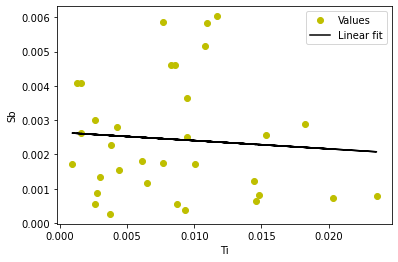

84.8801817124133 x + 17.452287920169685


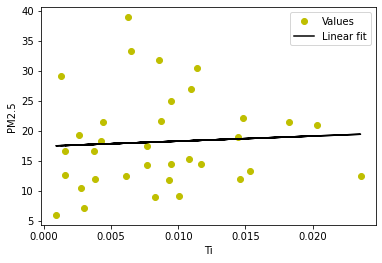

62.17961399420028 x + 0.140286291799434


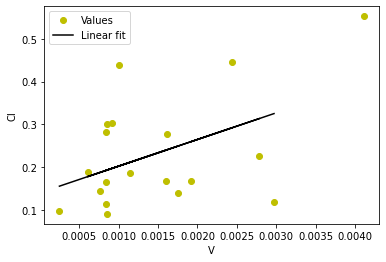

26.002586625446916 x + 0.6474673174848473


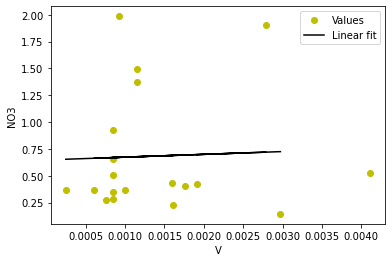

40.58883801126615 x + 0.4625393890023314


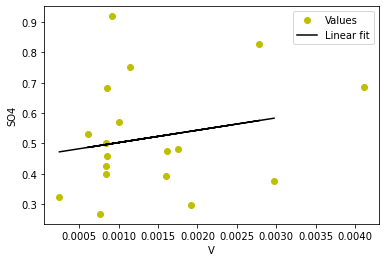

2.777779693928061 x + 0.2967976603760938


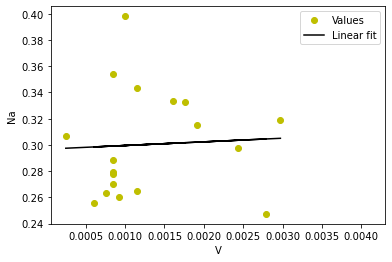

4.202564733990566 x + 0.42341442807551477


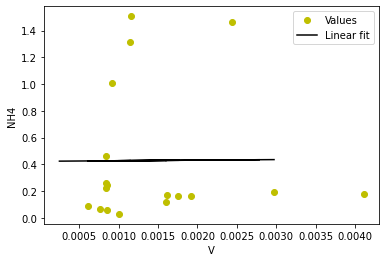

-14.476163180873593 x + 5.841560535485815


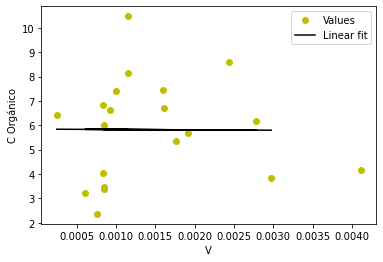

29.202915558748234 x + 1.2012937949371347


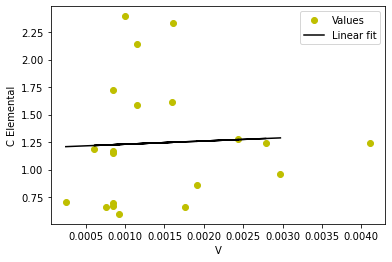

-100.05739930122384 x + 7.21541958753429


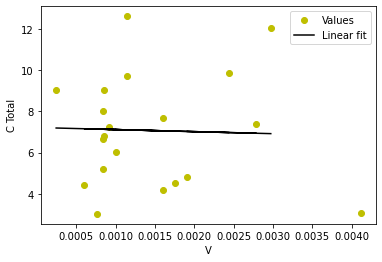

156.9214228621633 x + 0.3472896463299019


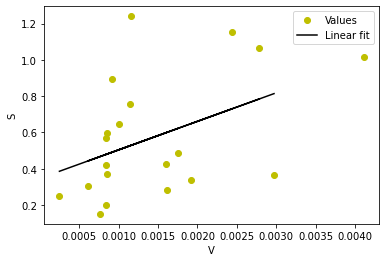

22.44421478426785 x + 0.252392597120711


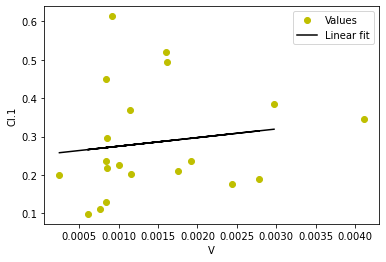

10.296573384778657 x + 0.14880322803144633


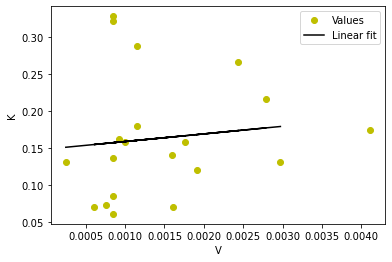

148.34387082800941 x + 0.4663646162877642


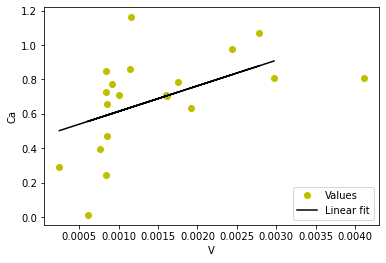

2.8371844191097164 x + 0.004680165518661382


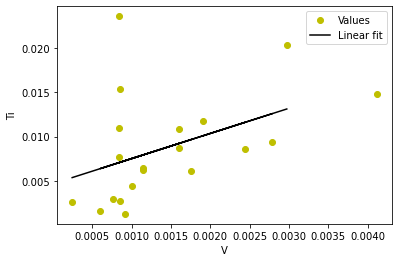

0.9999999999999998 x + 9.69739903612216e-20


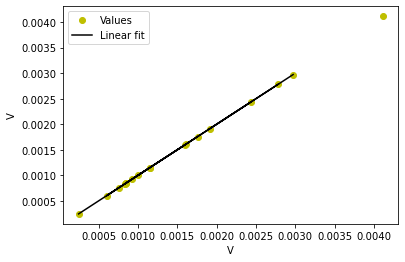

0.7014502008605578 x + 0.0012791536901712846


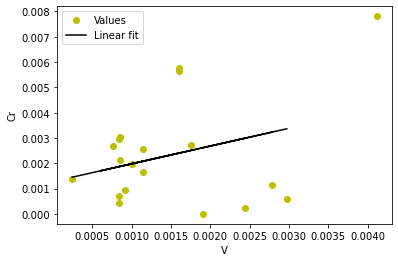

0.47934106301856566 x + 0.003195514697659573


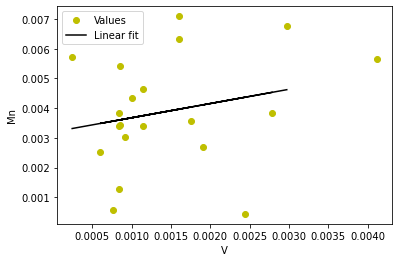

54.709572931787 x + 0.0706372240741596


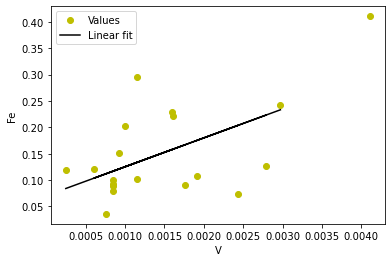

0.2907104148824597 x + 0.000951313793829349


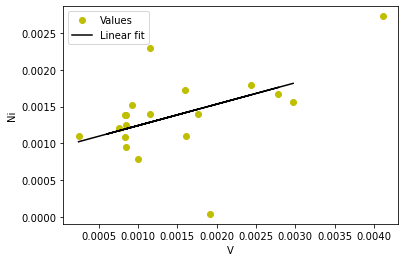

0.5892591209491006 x + 0.005779483883999025


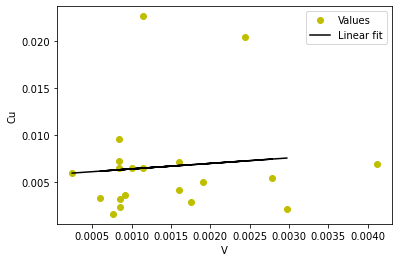

-1.4015084710786492 x + 0.04463148160513056


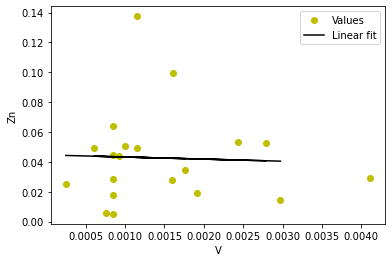

-0.2718314191440773 x + 0.0019731903753573924


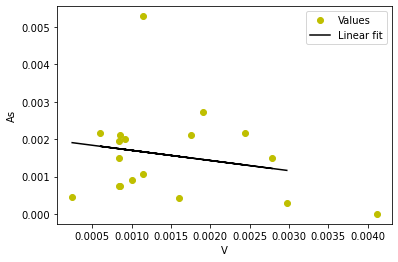

-0.10390418949272855 x + 0.0008829782006987829


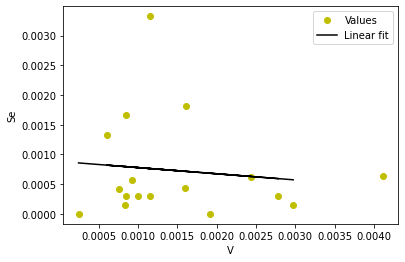

0.5824596718407643 x + 0.0015345320441023092


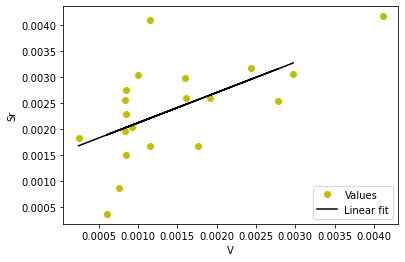

0.578250381883733 x + 0.007154267035664865


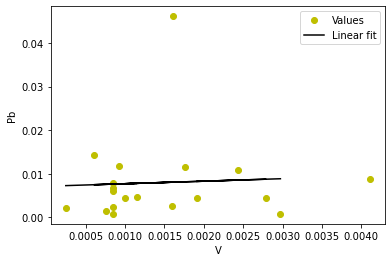

0.011996219120102663 x + 0.00016758080055615367


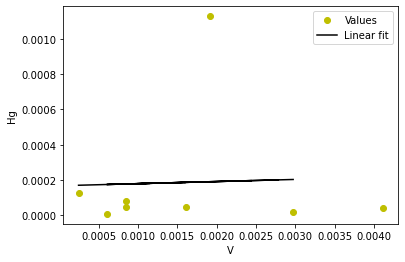

-2.233463450173123 x + 0.015391035660427928


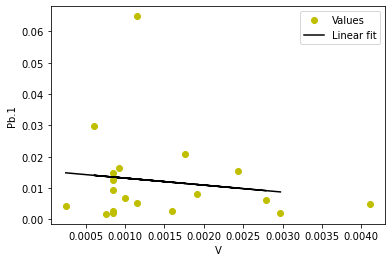

-4.026256546937136 x + 0.041739667980994134


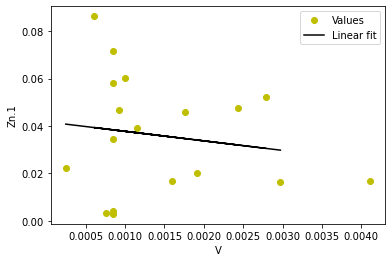

-0.08879726988469364 x + 0.004789753600921323


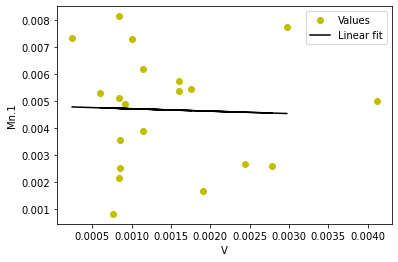

0.0345032405151213 x + 0.000339483137148216


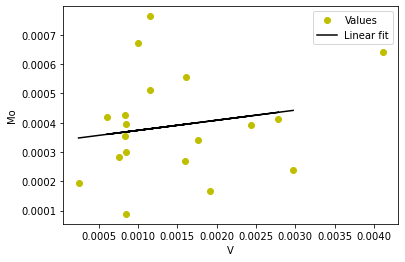

0.15908753603029693 x + 0.0015528489644915176


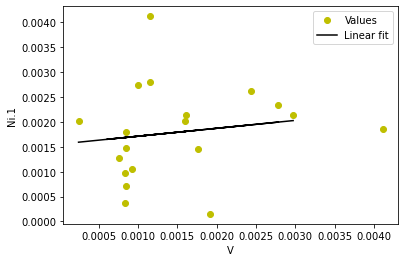

1.3177388147601865 x + 0.005653111376270961


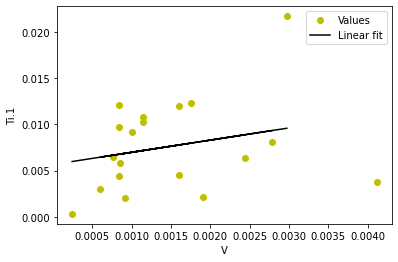

-0.3977930056279776 x + 0.0033997130123940263


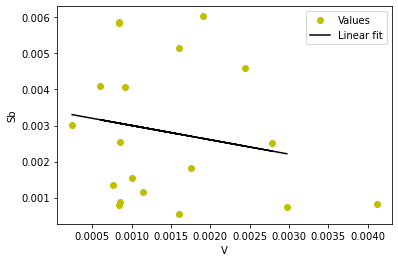

1849.514606955228 x + 17.634888269906025


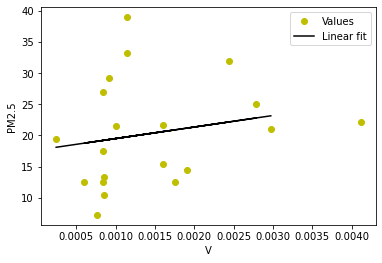

24.628439532367718 x + 0.17039908639811652


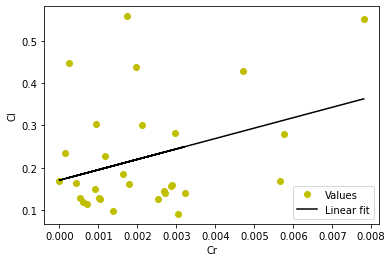

-20.316605682719175 x + 0.6442815599713431


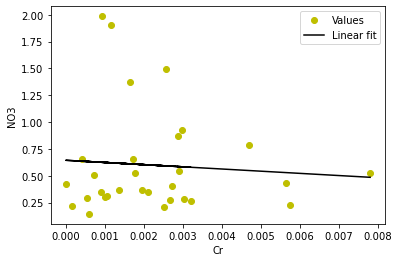

18.36378153113118 x + 0.4446984160195612


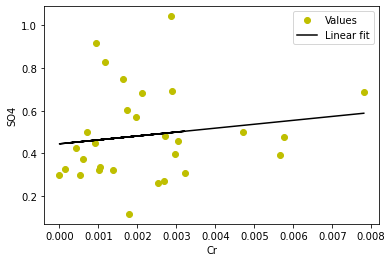

4.732326439651468 x + 0.28878152796562356


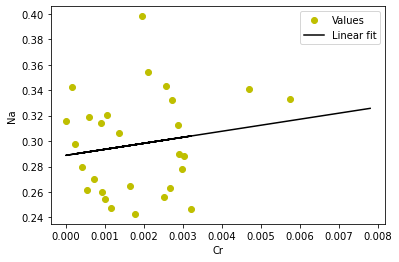

-36.315184514574646 x + 0.4406611818409065


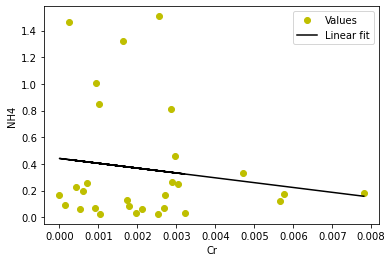

91.1148662163602 x + 5.3250755345687395


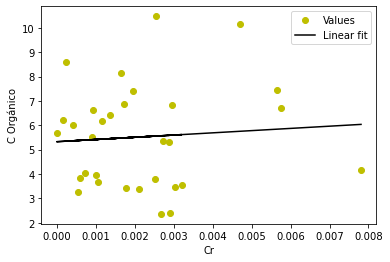

112.60850679151646 x + 0.8730836877820994


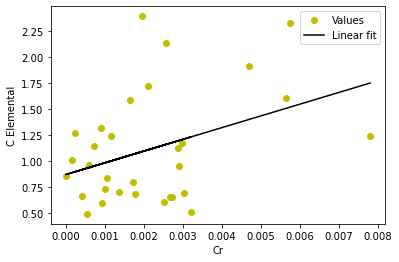

-322.47751101098817 x + 7.13075804554402


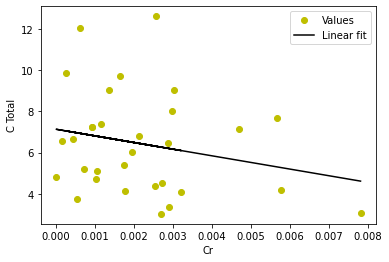

22.463098720104274 x + 0.43765167402347427


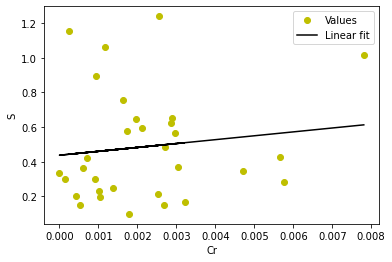

20.33720582054822 x + 0.23239428949709875


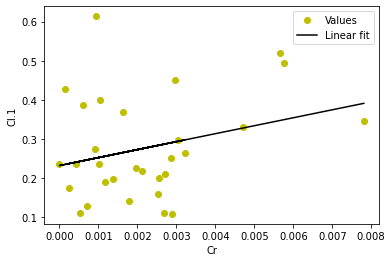

2.174141666890601 x + 0.16090095907948446


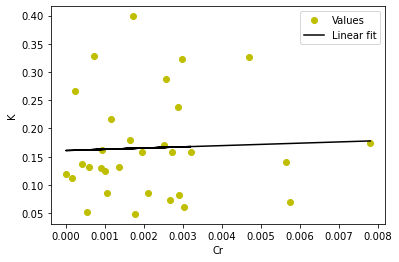

37.2973811519628 x + 0.541285377027757


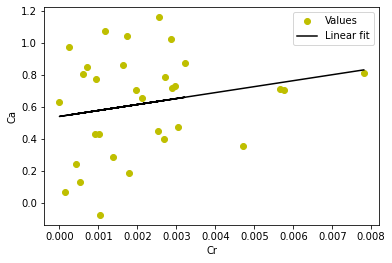

0.458760481047636 x + 0.007887846147807222


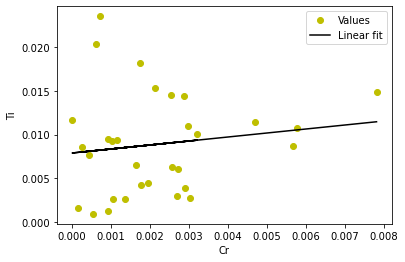

0.15192340120206946 x + 0.0011525019456413593


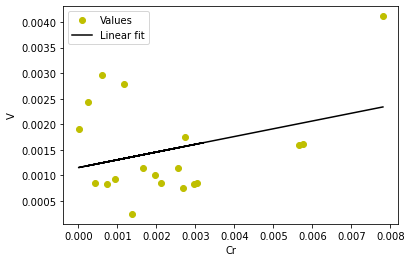

1.0 x + -3.1156553383575125e-19


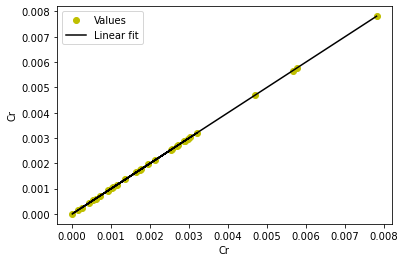

0.46011968264491726 x + 0.002723223979111092


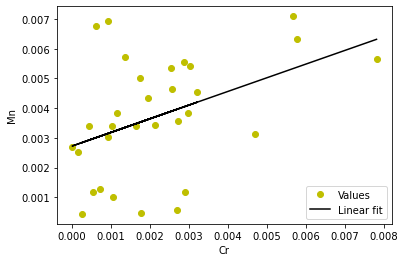

26.075864832270437 x + 0.08656043494676732


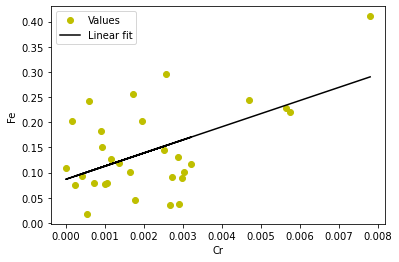

0.12062802185684414 x + 0.0009759570486189719


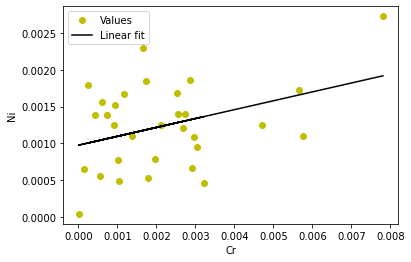

-0.1711323408079305 x + 0.007273249045143162


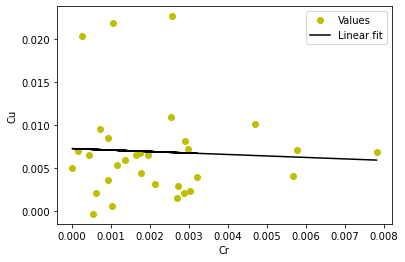

3.673852222674875 x + 0.028844105077314608


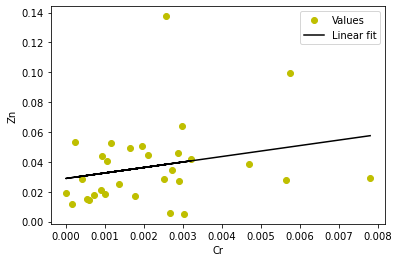

-0.001123398854543388 x + 0.0016201602901752086


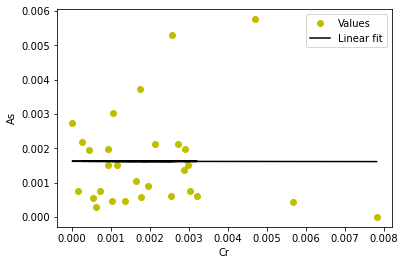

0.17458729415475074 x + 0.00023982685262580612


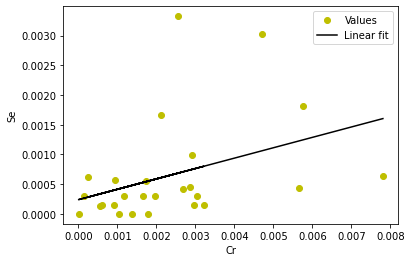

0.16264920598601712 x + 0.001829800909933131


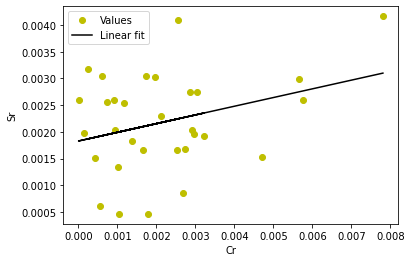

1.735205098820364 x + 0.00321056676092757


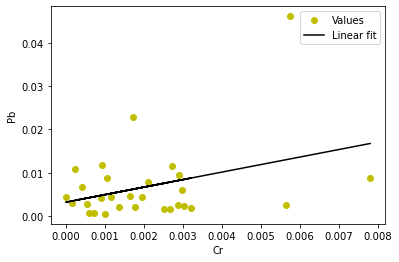

-0.06777388279264468 x + 0.0004133532441795424


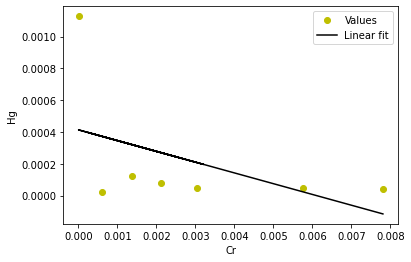

-0.1426293229971151 x + 0.01045159763260903


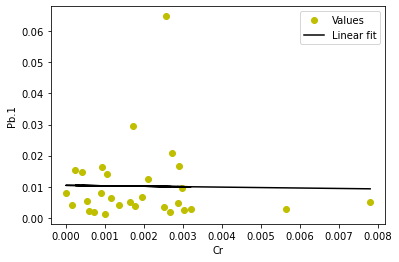

-0.33746832070582866 x + 0.03198982745164656


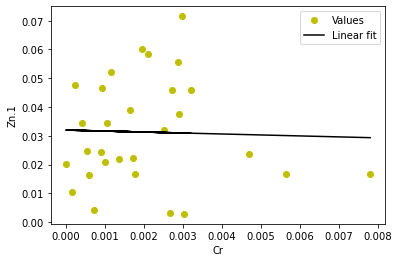

0.19162525260143007 x + 0.004019443810318298


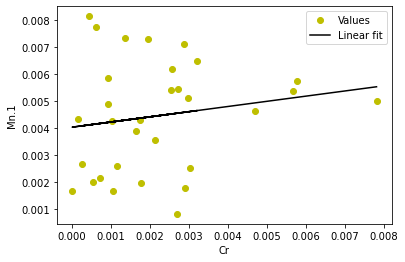

0.034619765997143975 x + 0.0002560146377002146


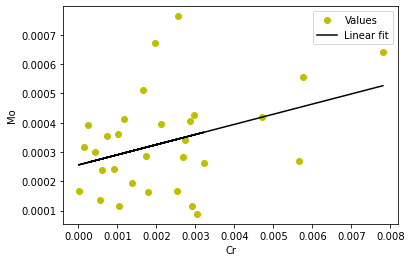

0.03837671092394557 x + 0.0015190470316043358


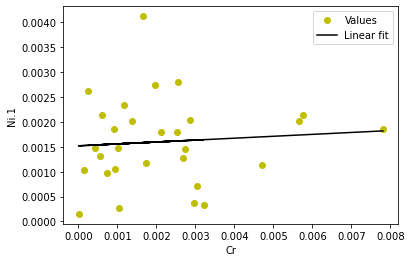

0.2334505397369049 x + 0.006766071513102325


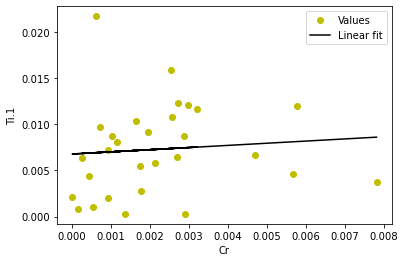

-0.20920484068234646 x + 0.0028434677958570453


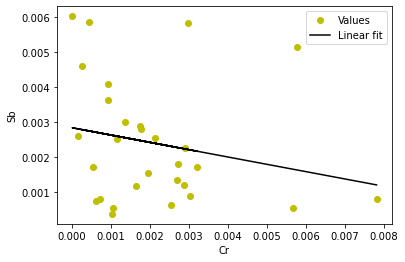

304.8243334261134 x + 18.18123991905405


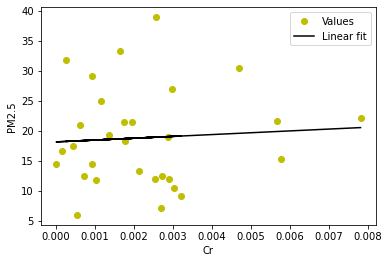

7.284340651225927 x + 0.19103238543662238


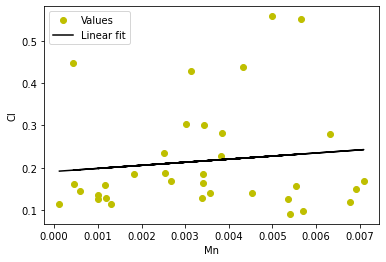

-0.5699542549849901 x + 0.5780566074974137


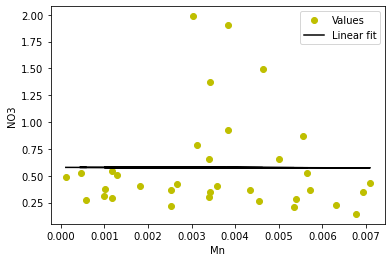

26.381587466960067 x + 0.3775021014043299


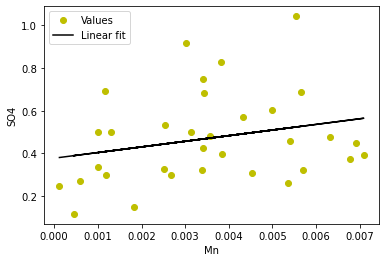

6.394588295381384 x + 0.27265846104919184


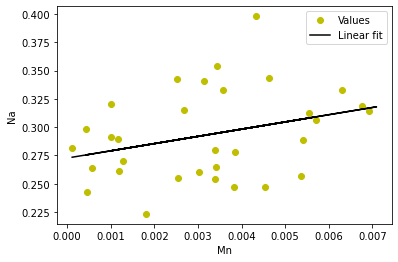

-6.743437551968367 x + 0.3541773290290674


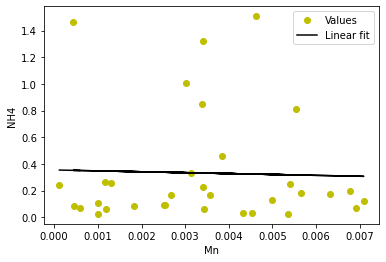

251.5693475438368 x + 4.5129970584764365


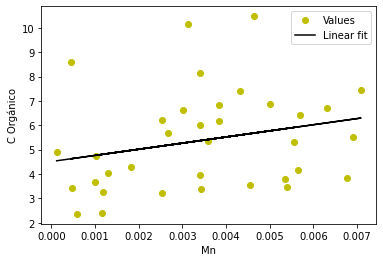

79.12079246833297 x + 0.8232951481474267


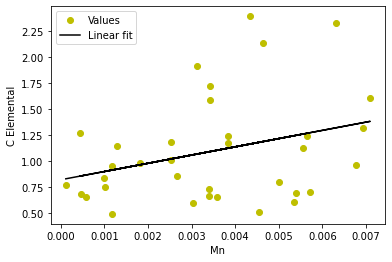

328.82325433754465 x + 5.27244407602256


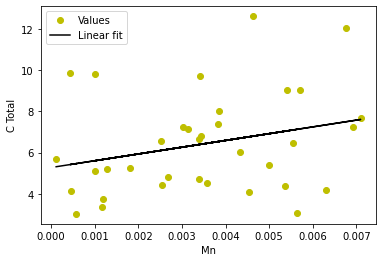

22.607452256362144 x + 0.3789815620698895


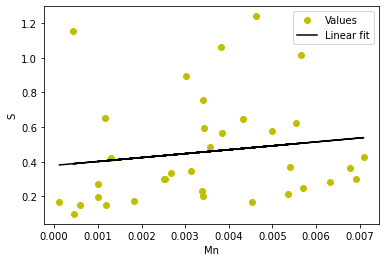

30.539521327975137 x + 0.15634755961270963


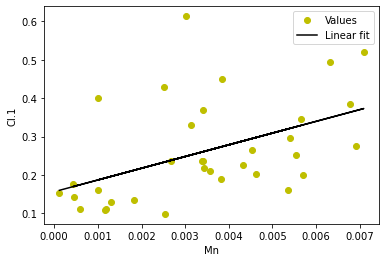

8.503527897692313 x + 0.12639698314233738


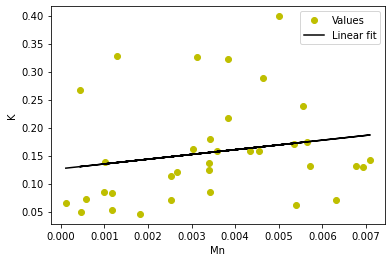

60.99130278947471 x + 0.36971434236714146


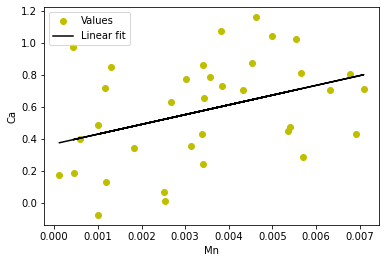

1.0149496347303897 x + 0.0049685264055426516


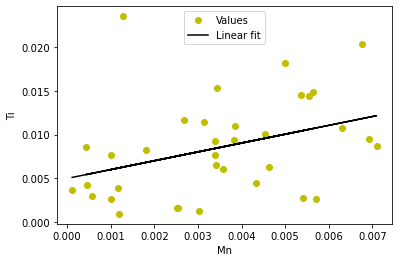

0.1240027446444067 x + 0.00097916102303869


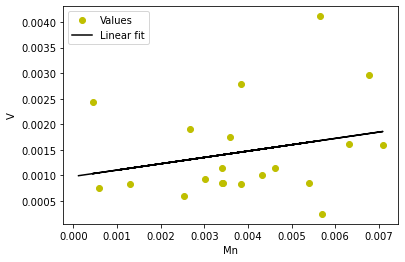

0.38065349935277126 x + 0.0007673124157029389


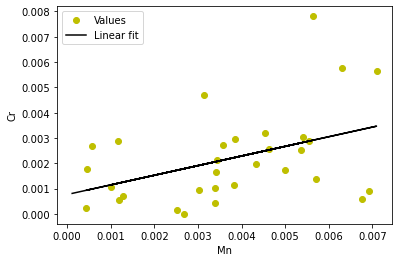

1.0 x + -5.86443570599696e-19


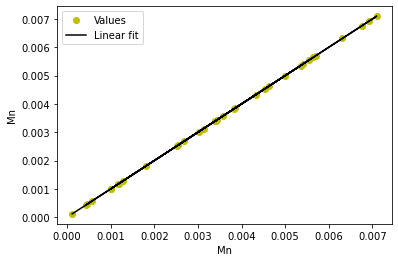

28.655855008175216 x + 0.03587283568101066


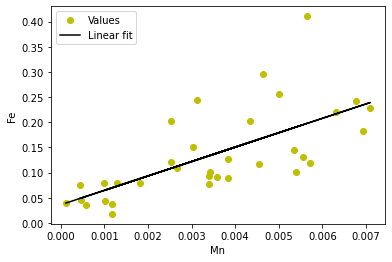

0.16497543607140175 x + 0.000550672255783691


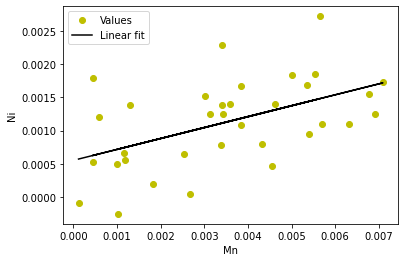

-0.35661773306622996 x + 0.008088099505001113


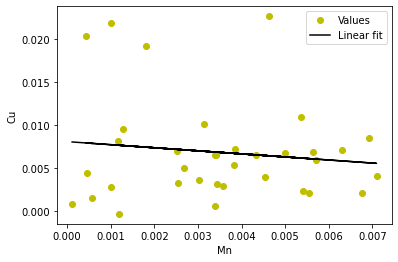

3.2512638872148796 x + 0.024708497664006294


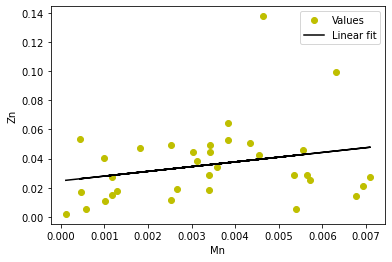

-0.11928935944429275 x + 0.002059714258881725


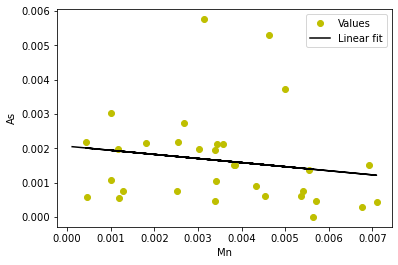

0.008818053630267171 x + 0.0006754670302868283


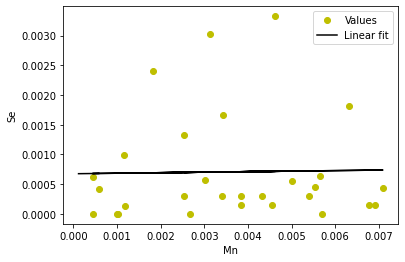

0.29733183849727446 x + 0.0010011818871540578


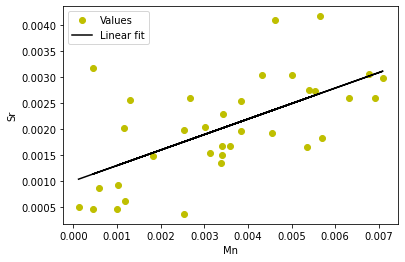

0.7406188923510869 x + 0.004271101708998156


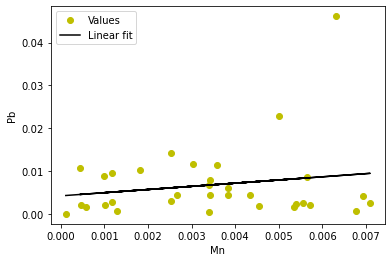

-0.11515529223365932 x + 0.000741146369683463


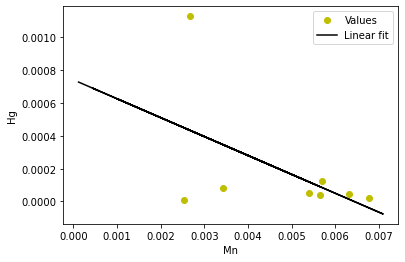

0.05072077398773967 x + 0.010468996485290965


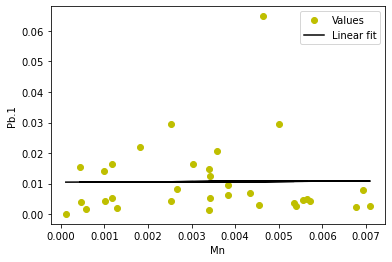

0.4643802048063862 x + 0.031185117207968526


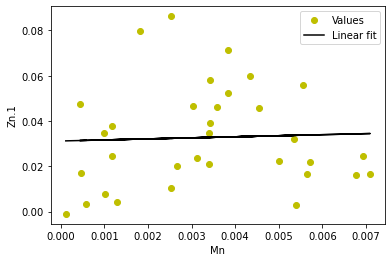

0.7427441726178835 x + 0.0017115997564416169


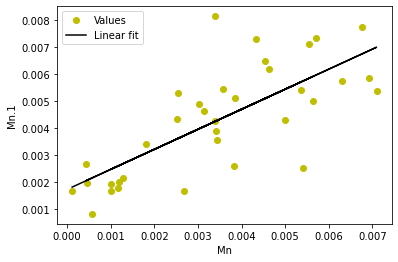

0.0220733046581572 x + 0.0002498122052835384


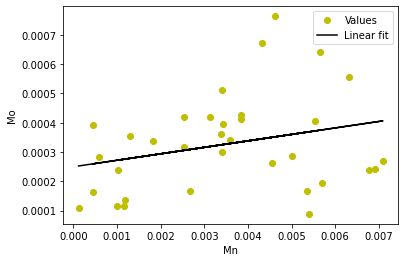

0.1823543593286493 x + 0.0008072211637974304


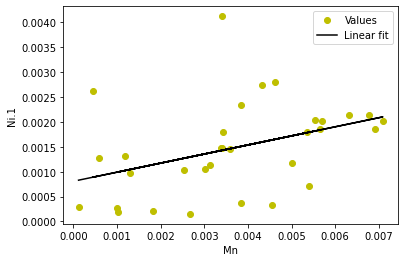

1.1175264515711014 x + 0.002957850461295523


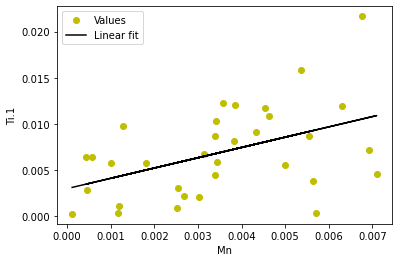

-0.04029267045182307 x + 0.002578730824504325


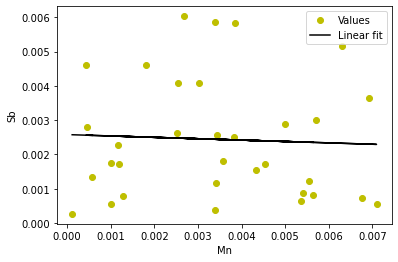

661.5445286263923 x + 15.849974450288306


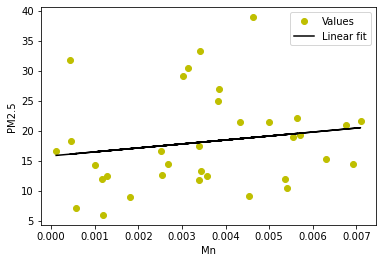

0.9829540982576772 x + 0.08543236416629979


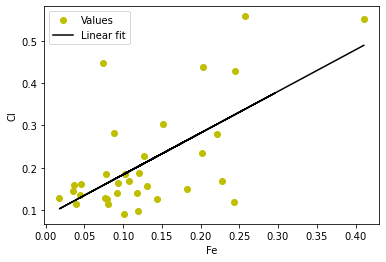

0.6700364077238432 x + 0.49121096116642315


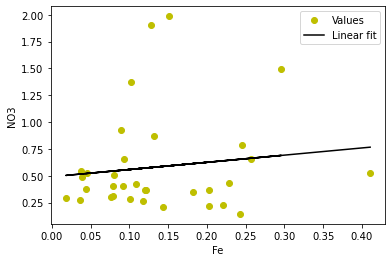

0.7359855495994185 x + 0.3665605814794346


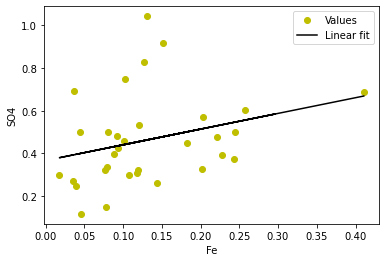

0.3379581107831881 x + 0.251054646176917


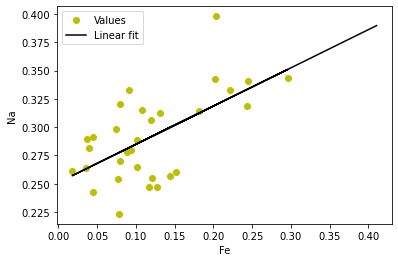

0.29063873085460257 x + 0.30041899241474795


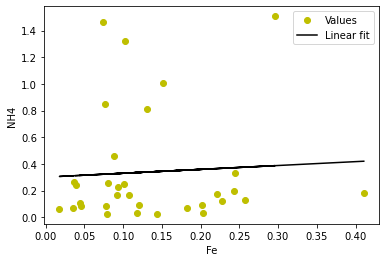

10.618775704041065 x + 4.008076183398275


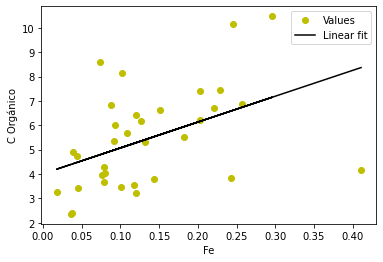

3.115309952925028 x + 0.6579491196613212


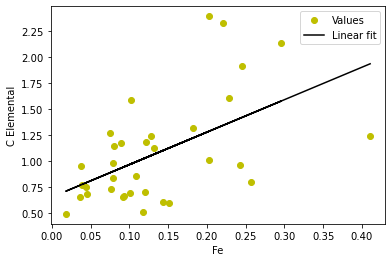

5.742360201451996 x + 5.622600586944221


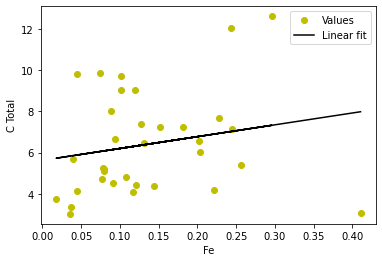

1.5331256579846966 x + 0.246062492586643


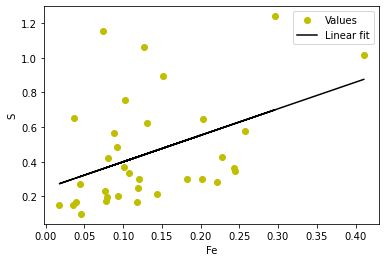

0.7522819694564129 x + 0.16312152113303122


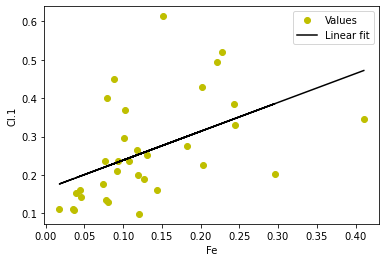

0.39627611119303574 x + 0.10438652025218174


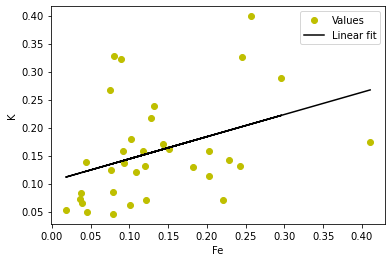

1.4195605600726113 x + 0.3868654134792627


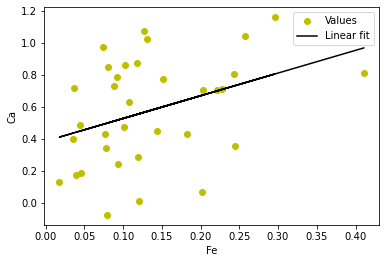

0.02465735596608897 x + 0.0049482923205340775


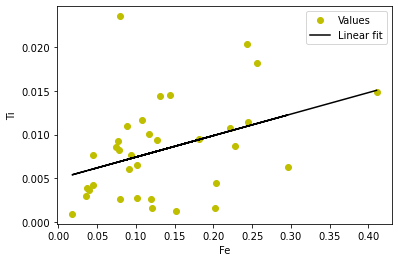

0.006109385348383537 x + 0.0005634028931756477


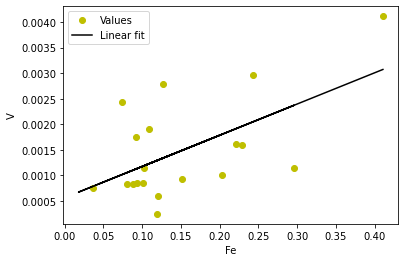

0.011148759698091766 x + 0.0005876346791402821


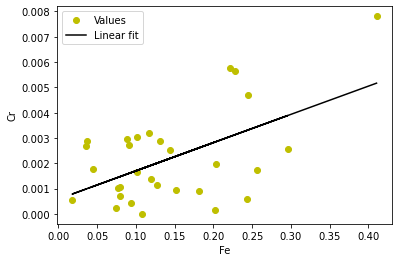

0.016055880423513007 x + 0.0012925788114546601


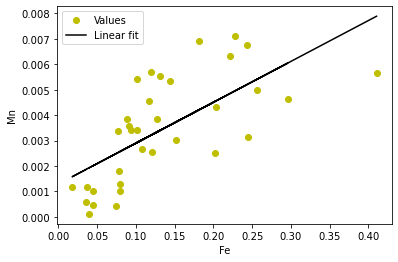

0.9999999999999998 x + 0.0


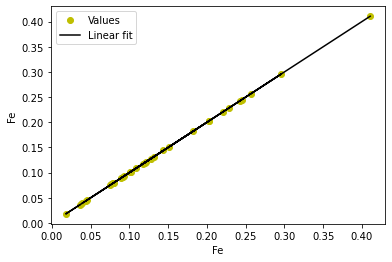

0.004294789936742087 x + 0.0005402167391831633


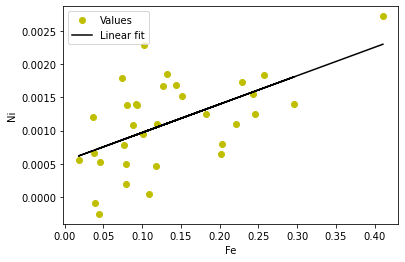

0.01191077639901361 x + 0.005353167105913436


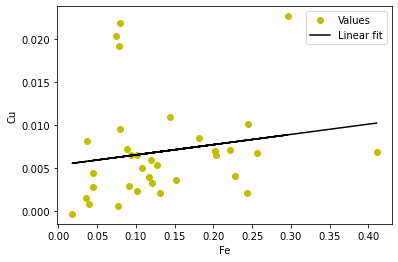

0.12251788517196394 x + 0.01944523518420598


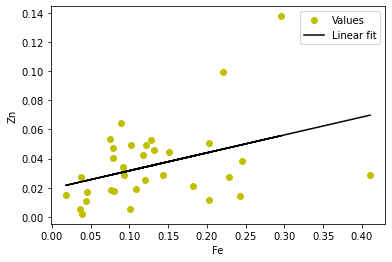

0.003169412889021587 x + 0.0011795299771707604


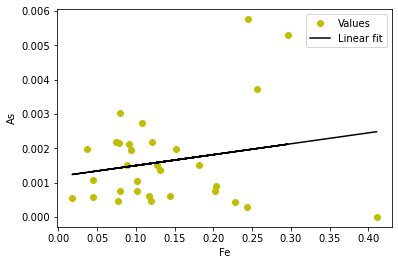

0.0035074489496125373 x + 0.0001633436984017033


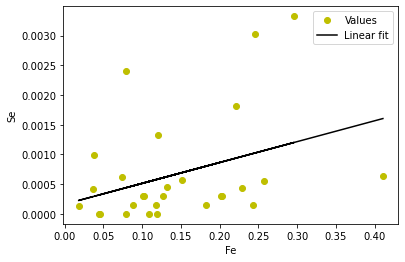

0.008250452628892109 x + 0.0009081402312260476


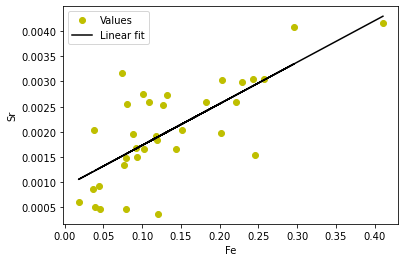

0.03227395814745408 x + 0.0026942648516519534


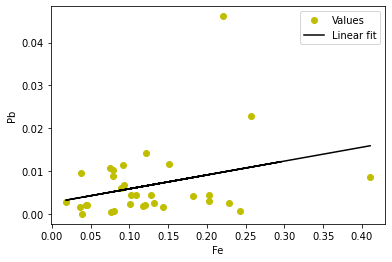

-0.0012105933492294009 x + 0.00043165285385283596


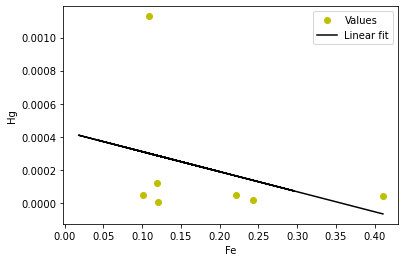

0.0430149493674944 x + 0.005038289957089114


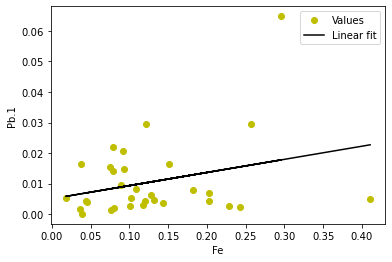

-0.015661168034352926 x + 0.033931271075006486


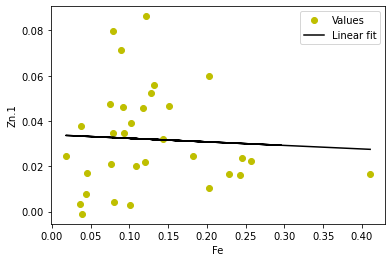

0.012585967118404144 x + 0.002603058985634651


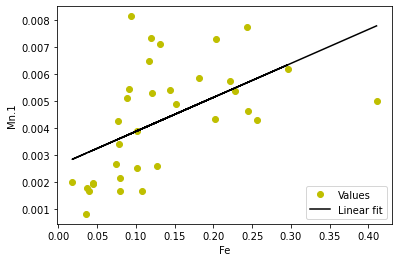

0.0011173805594519354 x + 0.00017401886201300765


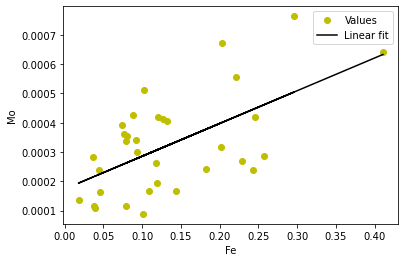

0.0038068431367103825 x + 0.000924145546690502


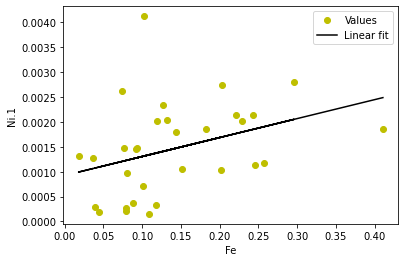

0.012772280759598032 x + 0.005113655840308912


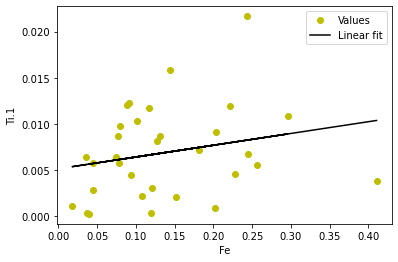

-0.0013538419720608354 x + 0.0026081686645149415


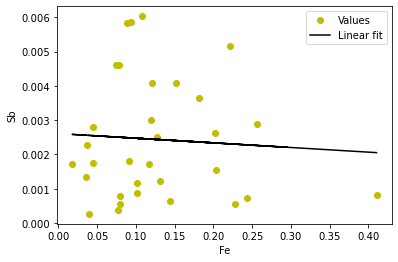

42.140791538228854 x + 12.572536861051736


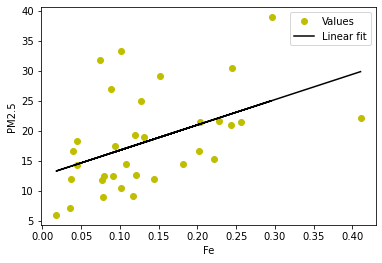

84.59485548869445 x + 0.12226464746222306


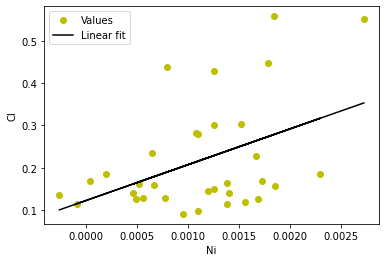

264.2847888199609 x + 0.29022757796837356


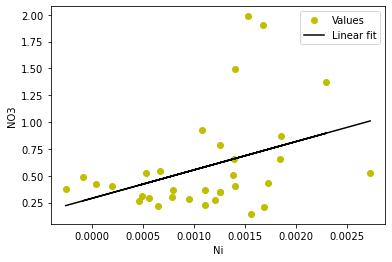

181.5940923651789 x + 0.2691575950666188


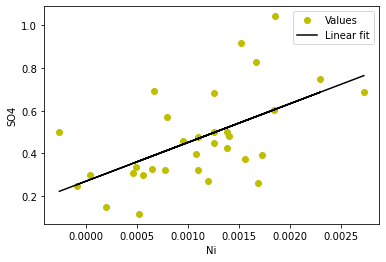

4.2534562795488435 x + 0.290148348321371


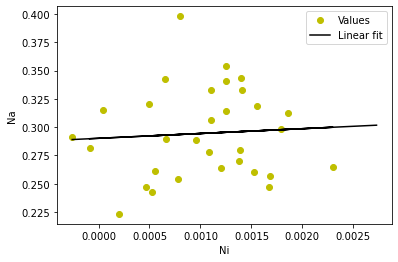

244.3093746777415 x + 0.0678295539639599


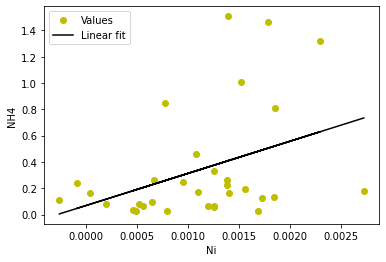

966.273146513563 x + 4.3586605274485235


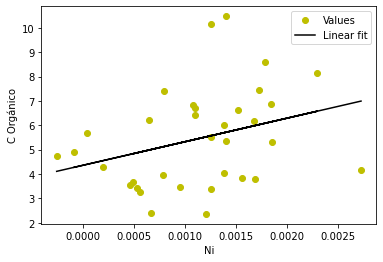

207.62458096097484 x + 0.8607332720998578


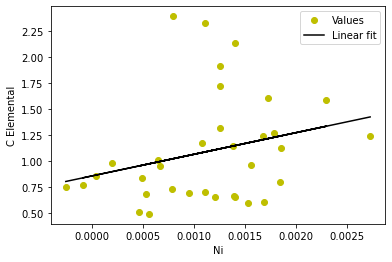

662.6222333110907 x + 5.722705870517995


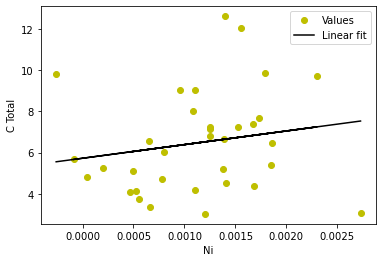

278.6831057490051 x + 0.14795193230662437


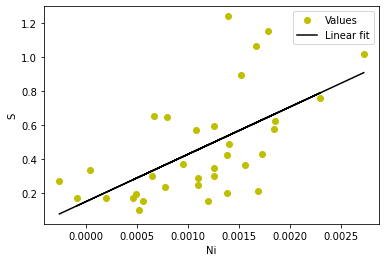

60.08934881686316 x + 0.1991993403050962


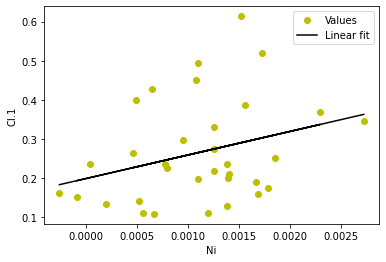

67.13006330692978 x + 0.08275430724833571


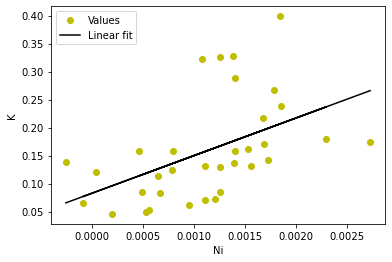

265.88052978068583 x + 0.2980756284771075


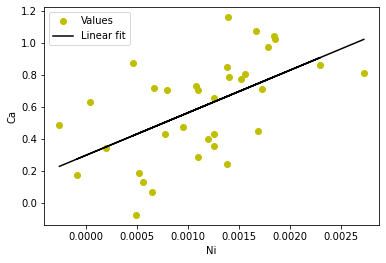

3.3686765729550765 x + 0.004889901583949016


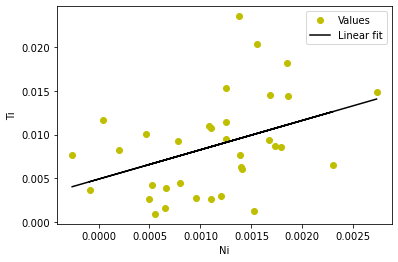

0.862903199402951 x + 0.00030843155945474844


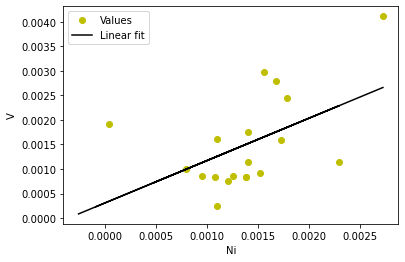

1.1757820739114144 x + 0.0007292603110507869


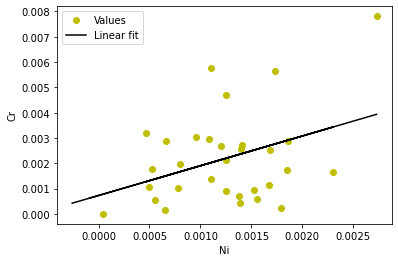

1.57697912307478 x + 0.001711600610108508


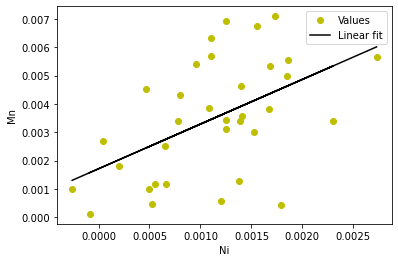

73.7504204950962 x + 0.05272739845121966


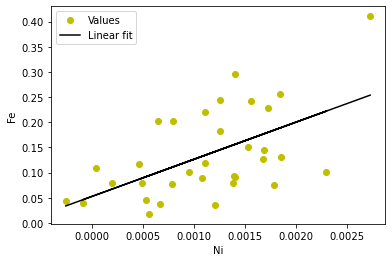

1.0 x + 0.0


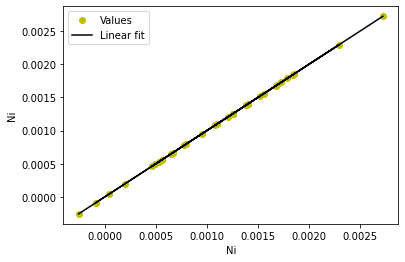

0.6166815088952353 x + 0.006265397657404435


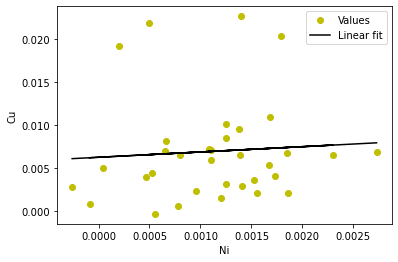

10.88572473673345 x + 0.023383562459024957


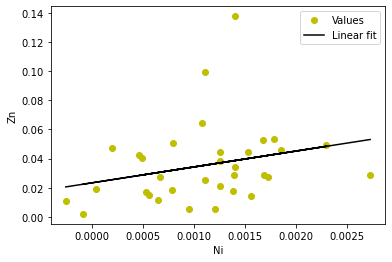

-0.041849816341362645 x + 0.0016657941180558268


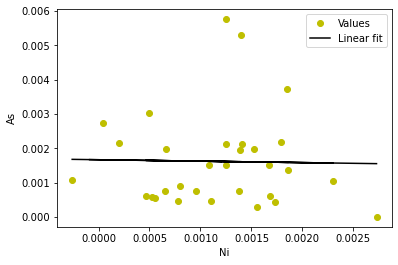

0.11501111305271437 x + 0.0005546072509365658


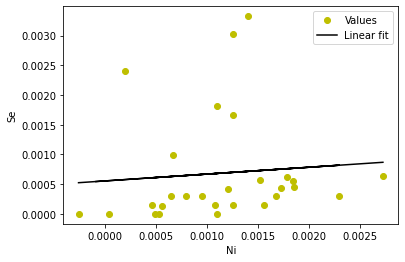

0.8384872766992173 x + 0.0011346917207071144


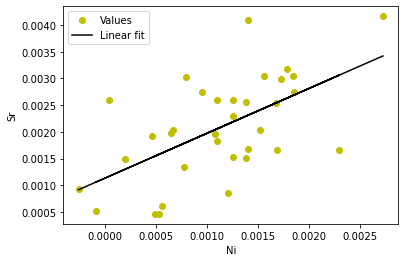

1.898575999849793 x + 0.00446917444723396


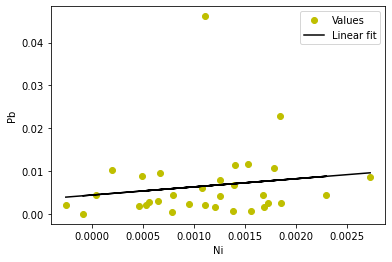

-0.3443466025787706 x + 0.0006428849065977557


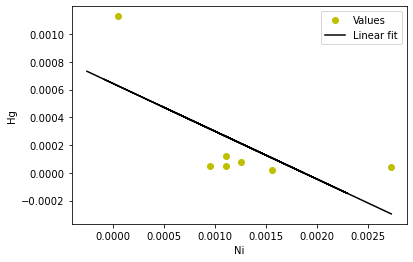

2.0549041640431507 x + 0.00773889103723689


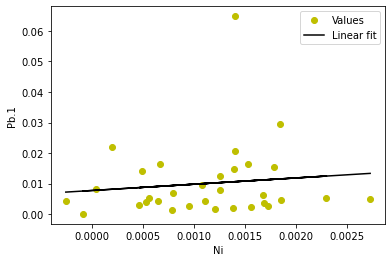

3.5513468519642815 x + 0.027091130378428037


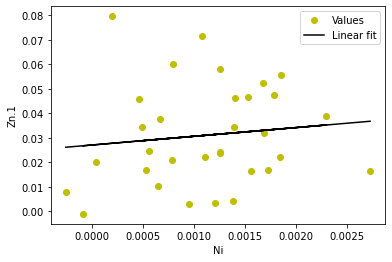

1.2389198469952067 x + 0.0028572176226590415


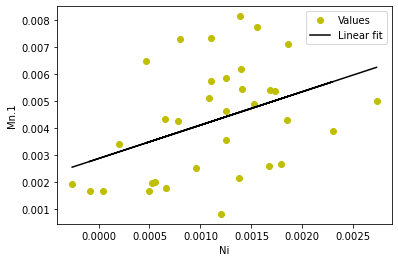

0.11989402565367534 x + 0.00019007650036876453


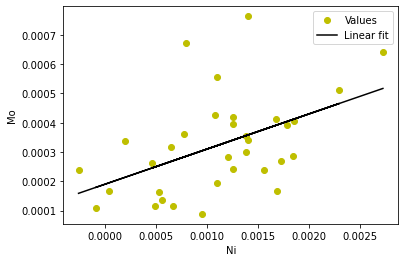

0.948767198455985 x + 0.00037386366093474313


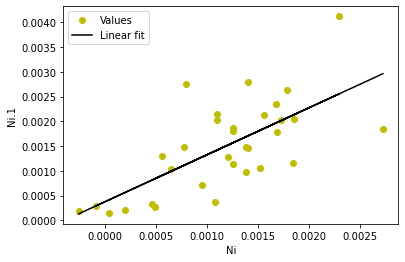

2.3124927572517926 x + 0.004299403575306435


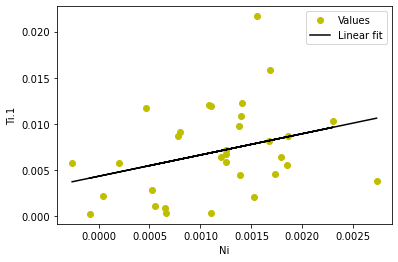

-0.30746509544172596 x + 0.0027309557000869556


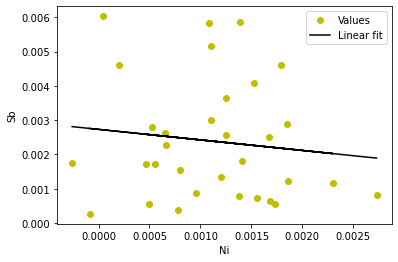

5899.514533850174 x + 11.600524495809108


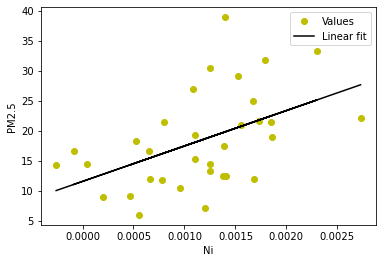

6.057797960585196 x + 0.17728417571232874


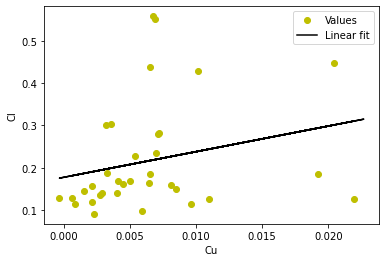

13.358717975219994 x + 0.4898051983435076


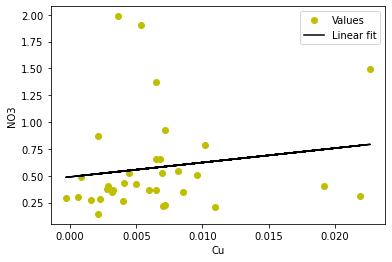

-7.531519927512945 x + 0.5151775796157576


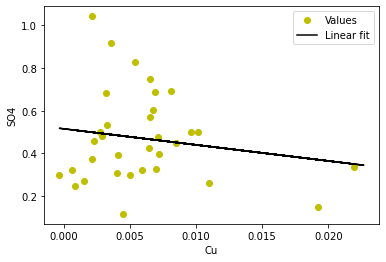

0.872865965435452 x + 0.2872554671082305


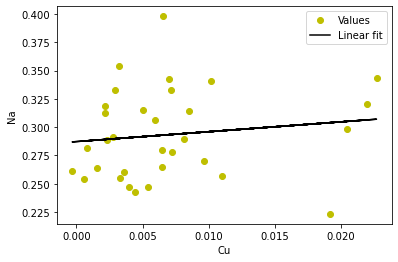

23.123049196565926 x + 0.17121132544728895


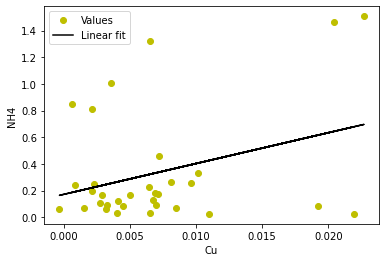

136.4146456611598 x + 4.44844063389307


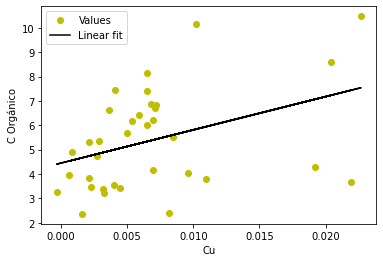

27.23746327697865 x + 0.9103700563727104


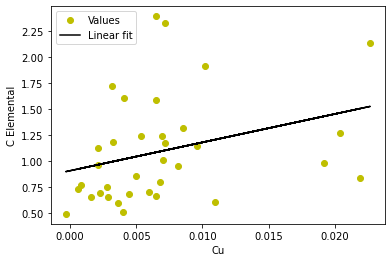

99.01287087168537 x + 5.731551282841303


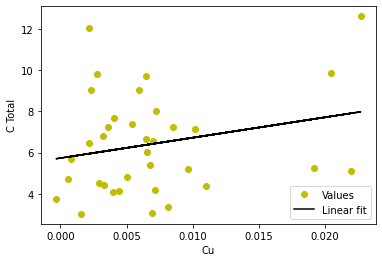

17.404610958409442 x + 0.337911234721099


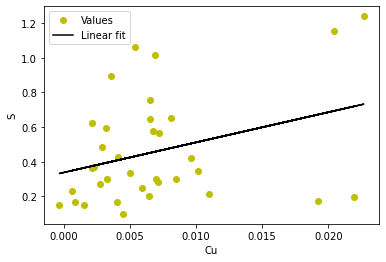

-0.17681384033308717 x + 0.2618459854665888


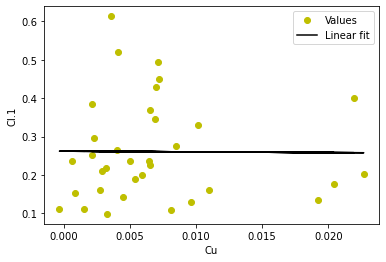

4.388422522395529 x + 0.12574096647963448


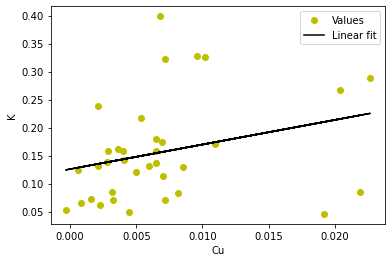

5.061997265324505 x + 0.5460539848883862


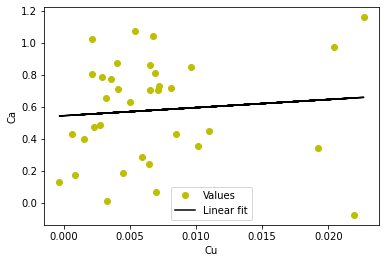

0.03181514138295655 x + 0.00826227768160379


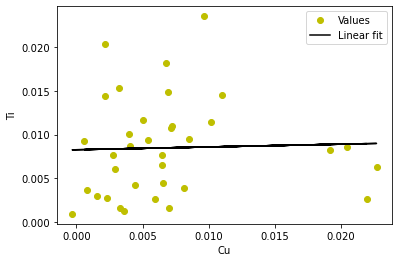

0.017945896096940275 x + 0.0013431523021513207


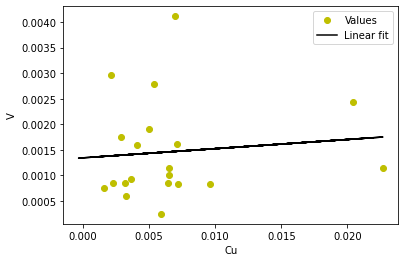

-0.01763493021727109 x + 0.002308616930669671


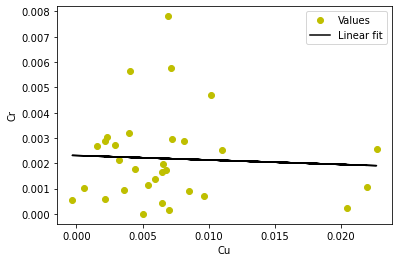

-0.04312454692284628 x + 0.0037556735380901815


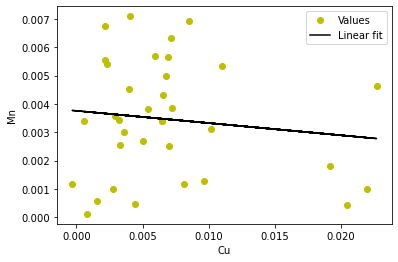

2.601144643297324 x + 0.11693907821918868


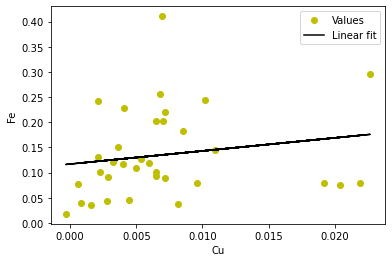

0.00784190977454488 x + 0.001071405408154379


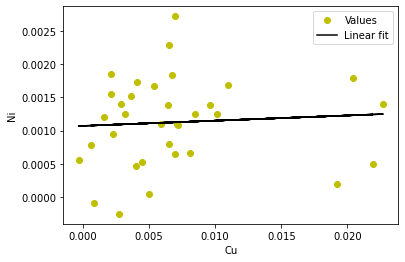

1.0 x + -1.7593307117990882e-18


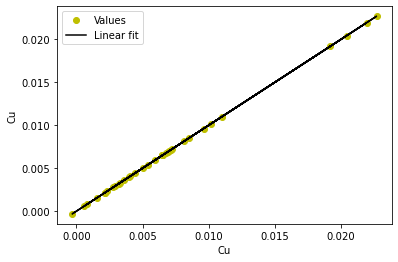

2.430465782865831 x + 0.019145872465700983


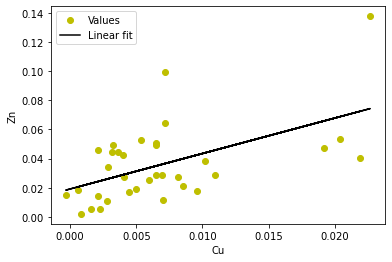

0.11784523365028592 x + 0.0007860135330718548


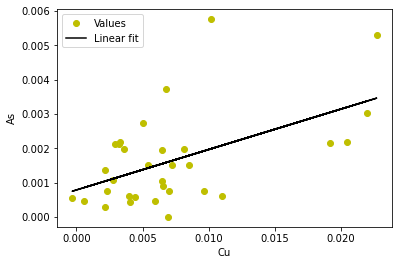

0.06981688599323499 x + 0.0002050452113421748


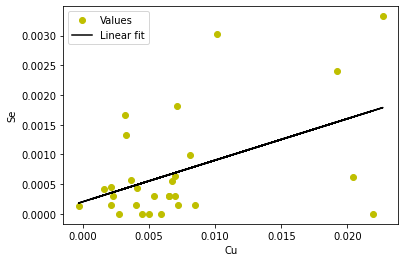

0.03947455111742822 x + 0.0017594116992156487


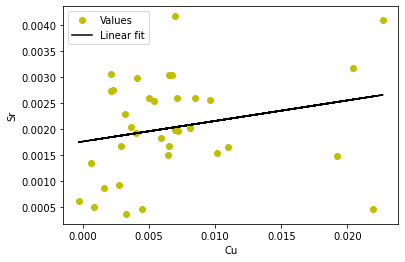

0.34081436475262045 x + 0.00467649591937513


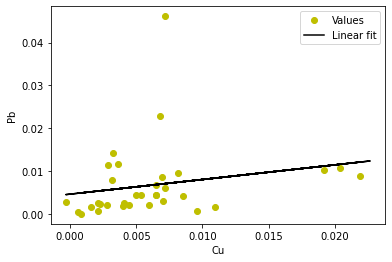

0.025263174343424916 x + 7.393841845277824e-05


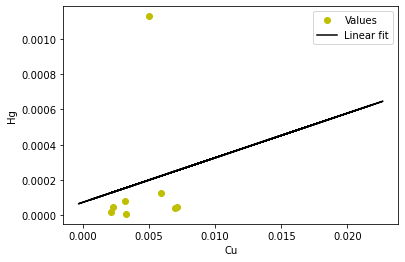

1.157929533507437 x + 0.0028302023139993894


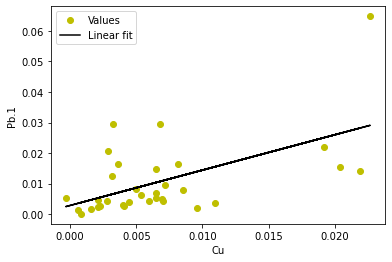

1.151348347532543 x + 0.02540572544155949


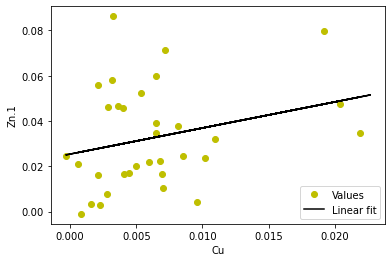

-0.010957115141498174 x + 0.004356663791373016


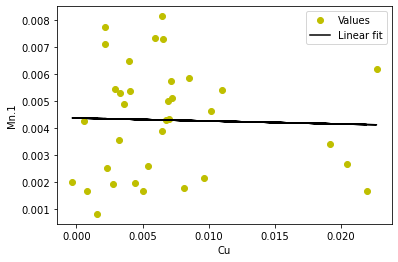

0.007436494677279395 x + 0.00027479005214933825


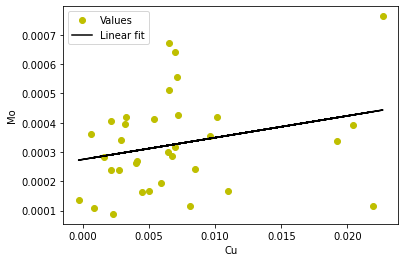

0.013635186547882074 x + 0.001378139461720235


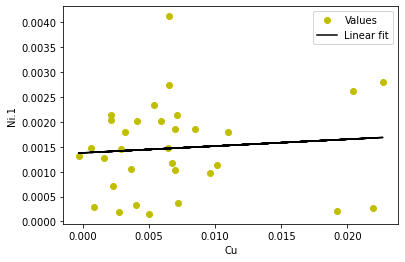

0.11532488984537884 x + 0.006088243796016769


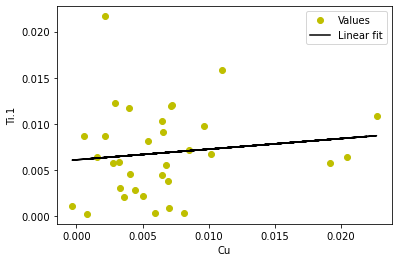

0.07724870485707436 x + 0.0019556604881801644


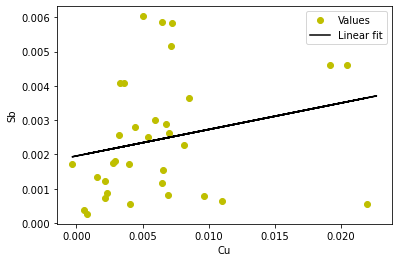

687.4062039458602 x + 13.779903651542273


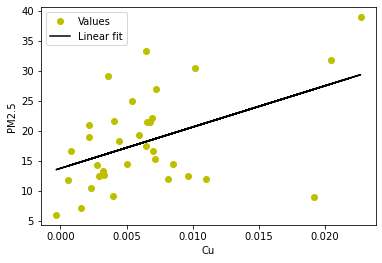

2.5646066889109154 x + 0.12169318054928464


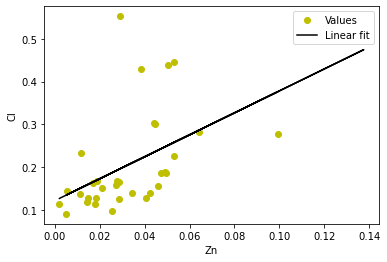

7.941098375575051 x + 0.2933252018382497


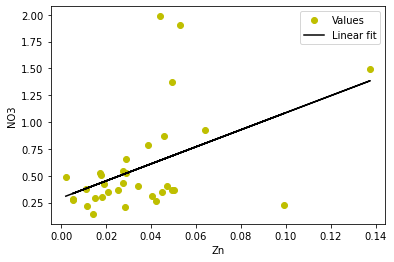

4.024733196511864 x + 0.336970403005412


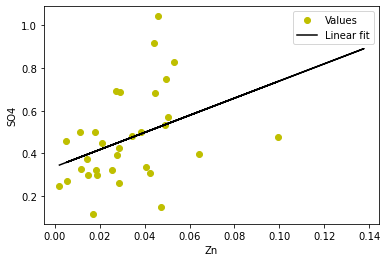

0.3676577795826757 x + 0.2799738794246712


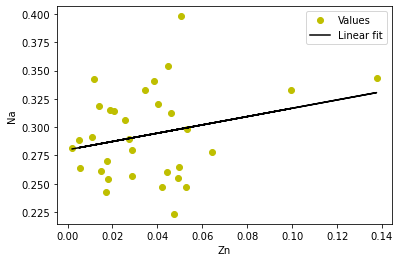

7.874032301549714 x + 0.05730438373298235


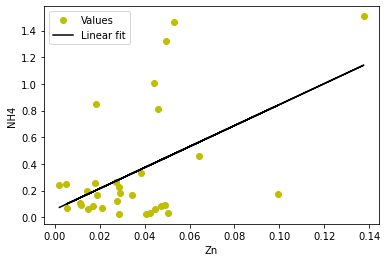

44.23824046455954 x + 3.755609678591202


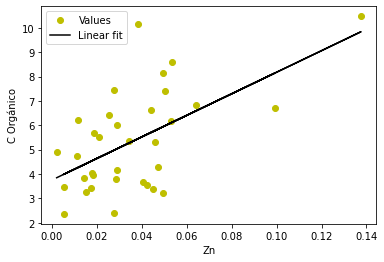

12.612108712371807 x + 0.654205375006809


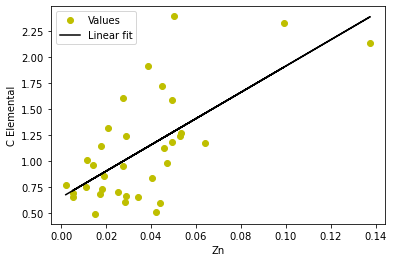

26.59051562090365 x + 5.487506055608101


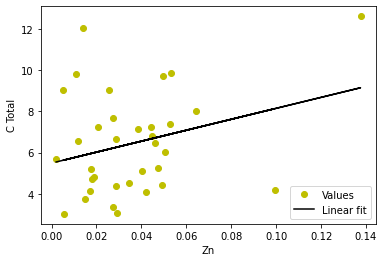

6.4553560103033805 x + 0.22254617193715787


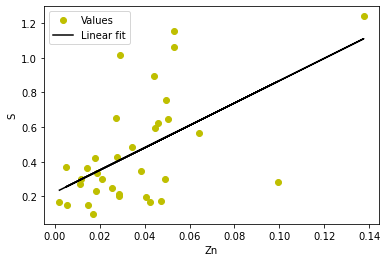

0.984616814863031 x + 0.22537362655459006


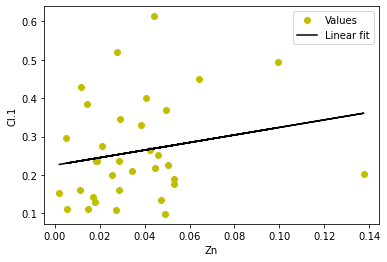

1.1773731382628505 x + 0.10651402003608683


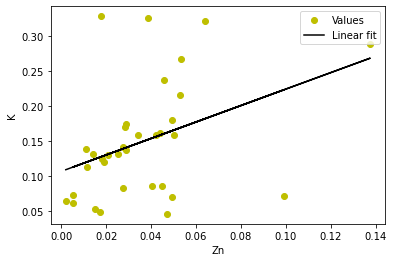

5.765338101567044 x + 0.3605788337224834


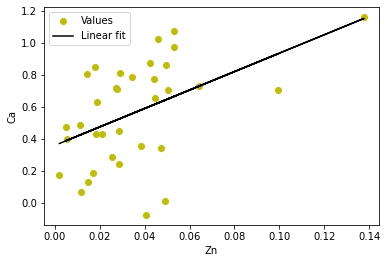

0.00887368632021524 x + 0.007875112201141822


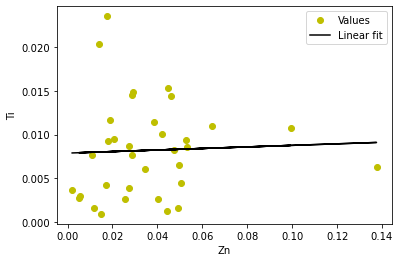

-0.0013140230503603924 x + 0.0015182879259113774


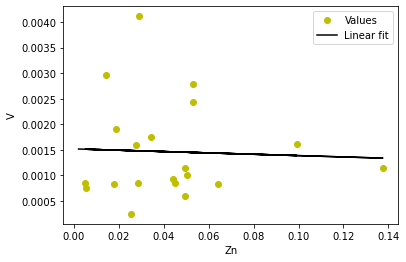

0.016585659855312043 x + 0.0015894897729594813


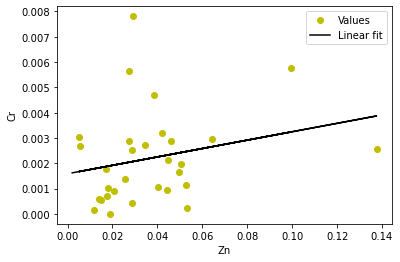

0.01901067509940308 x + 0.0027340013375019927


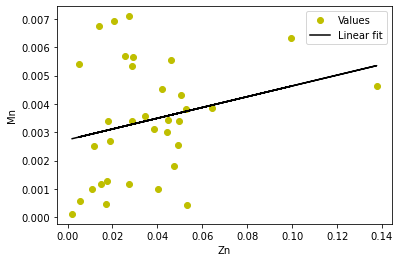

1.226585229363043 x + 0.08776355908572703


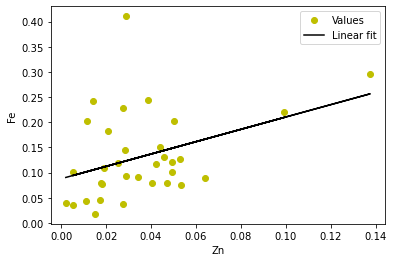

0.006540801439116999 x + 0.0008726027098191765


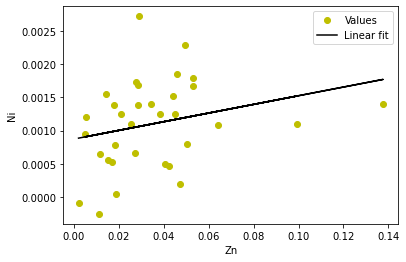

0.11957931094696098 x + 0.0025744738209889217


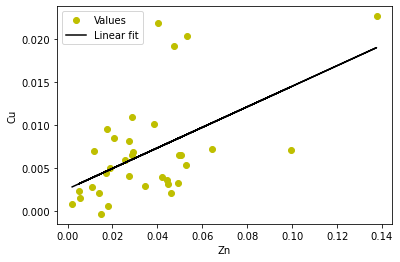

1.0 x + 4.760041947896276e-18


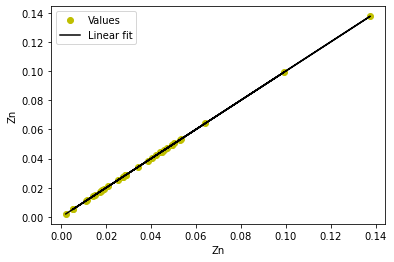

0.03236690939142184 x + 0.000407277976559295


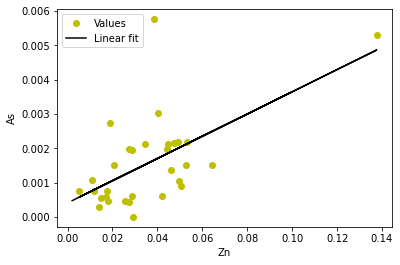

0.020567204690476504 x + -8.691106463178049e-05


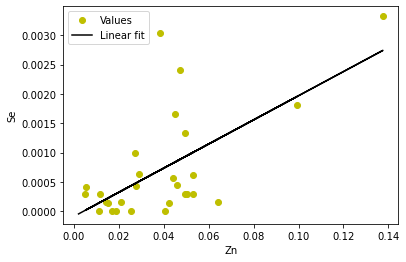

0.014863631275836536 x + 0.0014679295670911056


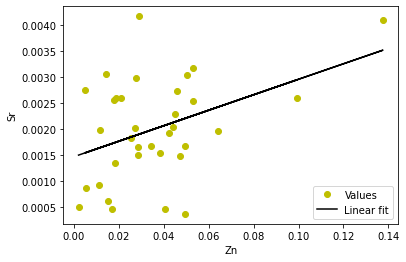

0.2982995997601192 x + -0.0033958656202244157


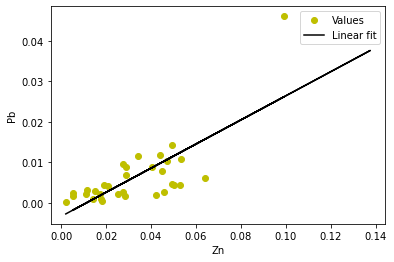

-0.0030533910922296886 x + 0.000296459692503821


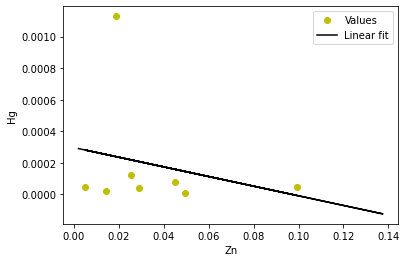

0.3976333708908278 x + -0.0033661182495051374


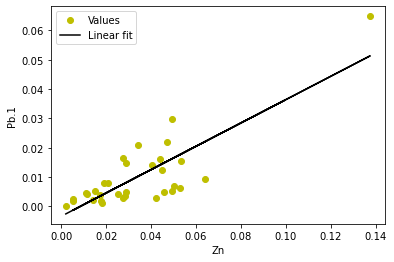

1.212111672691211 x + -0.004082374334596392


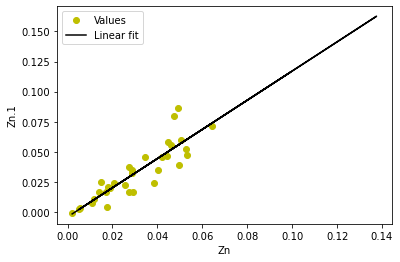

0.02703182325777224 x + 0.00331317651312635


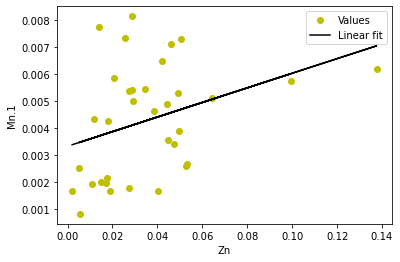

0.004499738233807084 x + 0.00016768368517501431


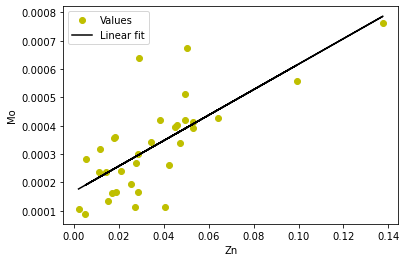

0.01393562517362073 x + 0.0009783204494443


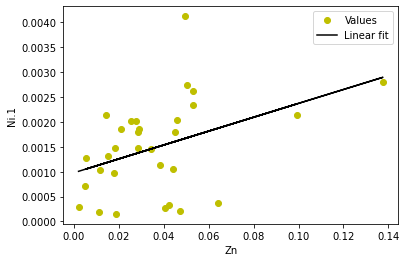

0.05638406002823366 x + 0.004819253123408436


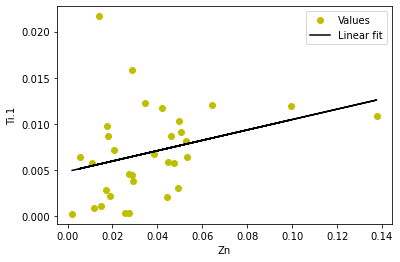

0.0398769663140772 x + 0.001128596225283551


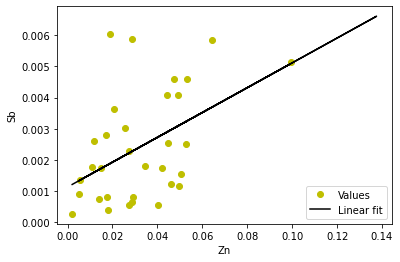

166.13625888242314 x + 12.162090250053486


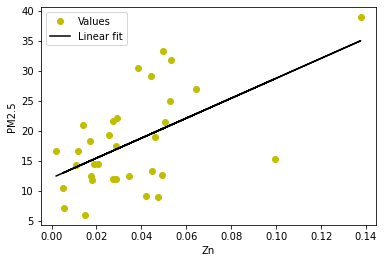

43.00582793707798 x + 0.1543221529559518


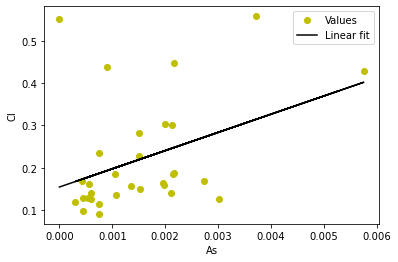

118.26768681542414 x + 0.40879028853375216


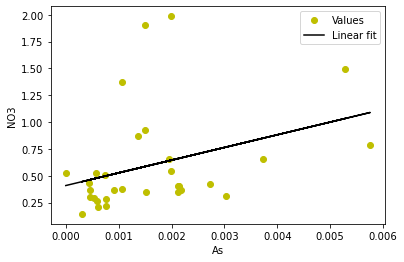

26.387454120469343 x + 0.44482344914280314


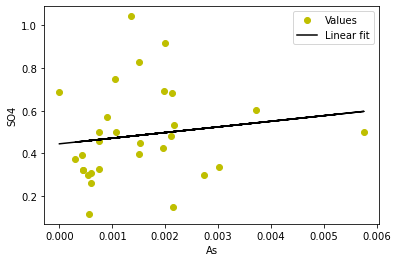

10.726830926320469 x + 0.2755646610825556


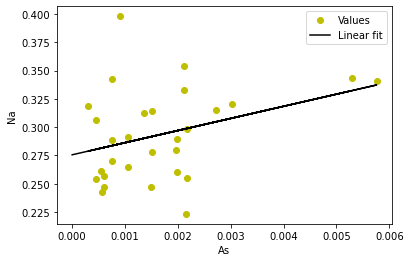

88.14617333954453 x + 0.20045093842290942


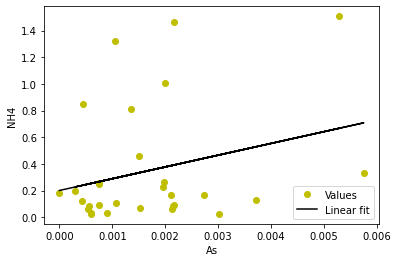

835.0733958979159 x + 4.086916965232653


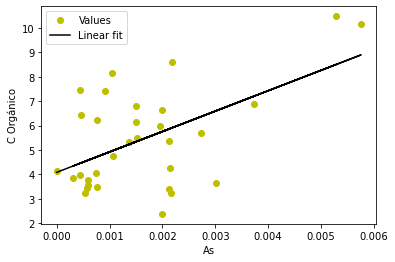

132.5122515881262 x + 0.8657055910795786


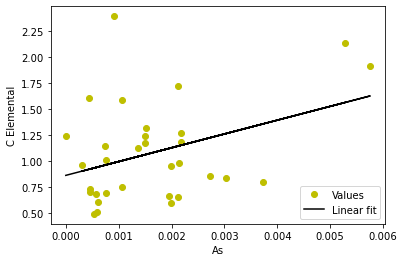

331.4707856813759 x + 6.067050120235646


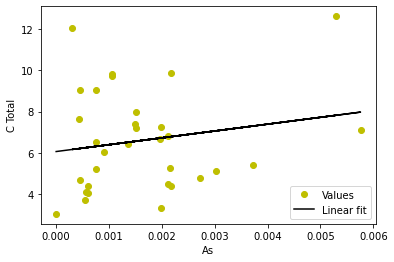

61.46391060594345 x + 0.38078092652113754


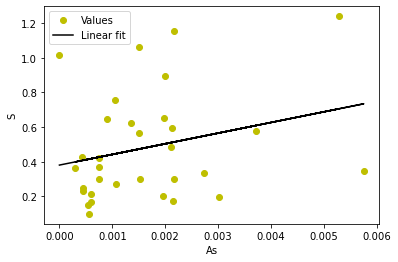

-2.432754262588199 x + 0.2652883359328819


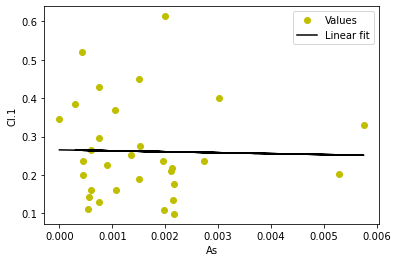

29.44019145058076 x + 0.11582044412183932


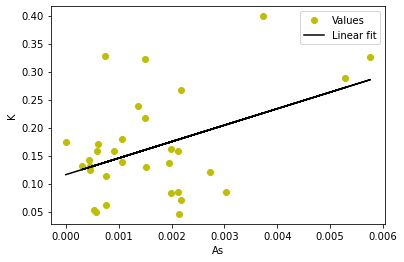

28.388741806590115 x + 0.5488692493627446


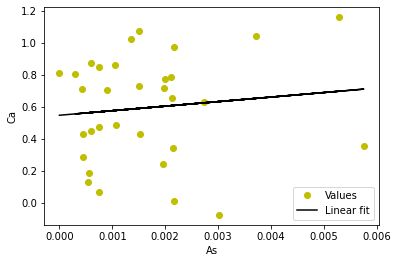

-0.03446471588479911 x + 0.008784549690783842


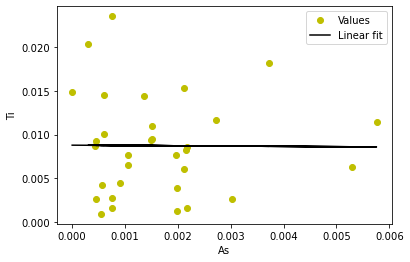

-0.1827366106445235 x + 0.0017795088788927005


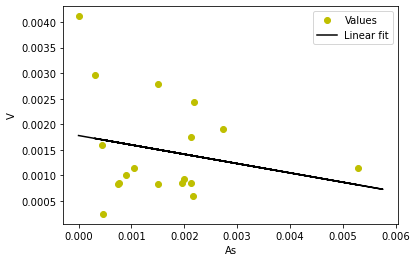

-0.0017170398757067084 x + 0.002049285993006497


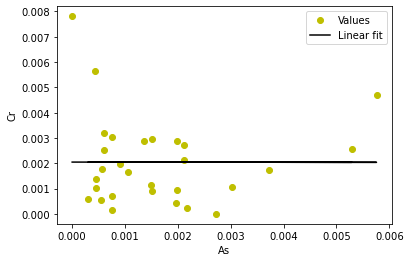

-0.24112179041178713 x + 0.003959441003301891


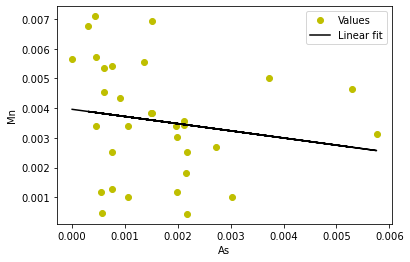

12.783073675869929 x + 0.11787488437610075


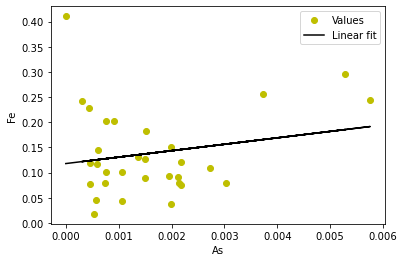

-0.00987381216980601 x + 0.001179346758752355


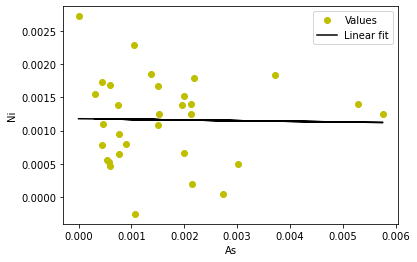

2.3103410107223192 x + 0.0034231733403903408


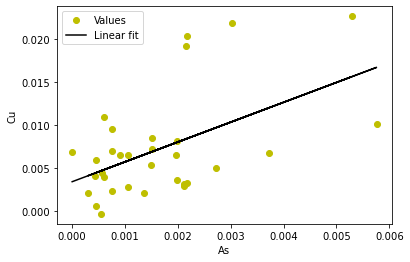

11.079692830201344 x + 0.018467591191843956


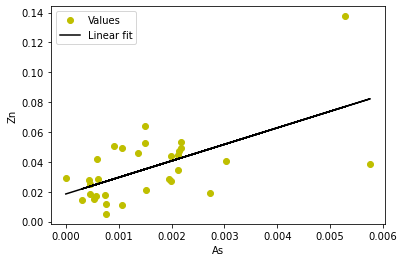

1.0000000000000004 x + 4.599880250050124e-19


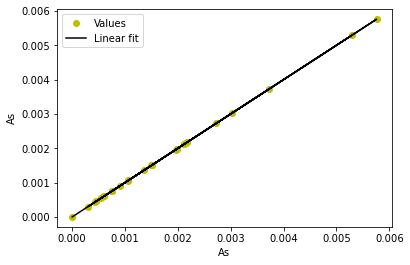

0.4702843205218387 x + -0.000132086982878624


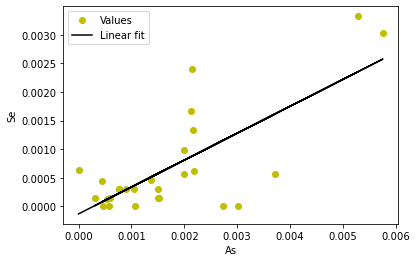

0.04942855859417061 x + 0.0020155430426234086


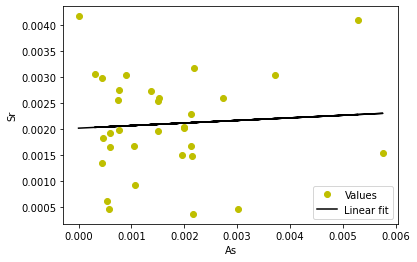

4.2929887163931255 x + 3.376885947694831e-07


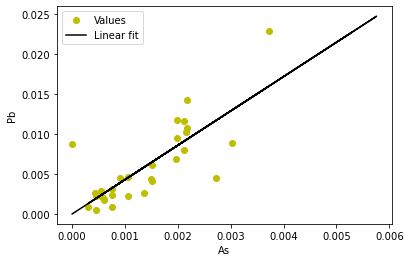

0.22398276754163207 x + -6.55531581456628e-05


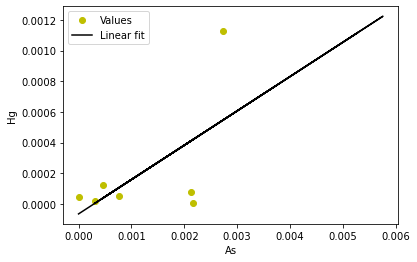

9.842454438799235 x + -0.0035081492237117


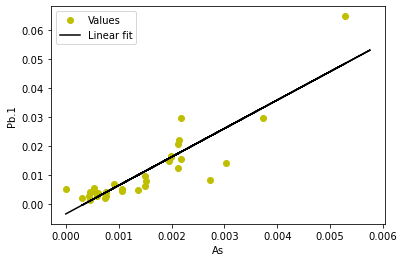

4.230567569011823 x + 0.028359706593581856


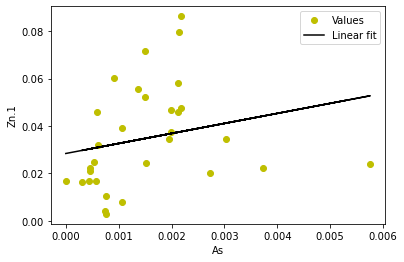

-0.09262937414044424 x + 0.00457767975970569


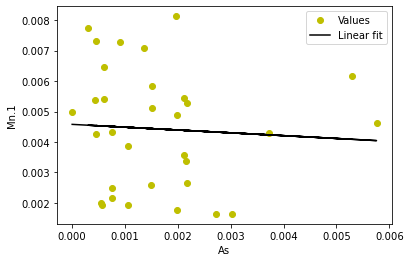

0.03091477709096439 x + 0.00027737688025141177


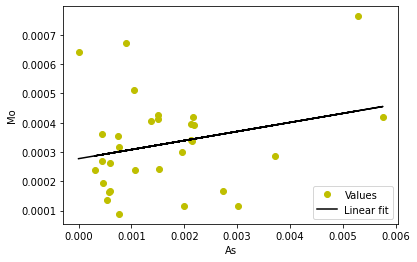

-0.045107801108248725 x + 0.001572245242685921


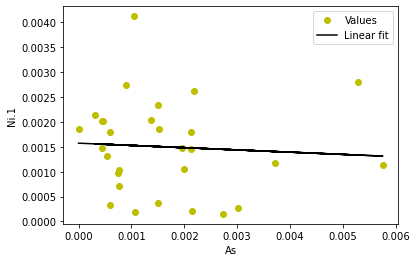

-0.21439027808476138 x + 0.007252500784972674


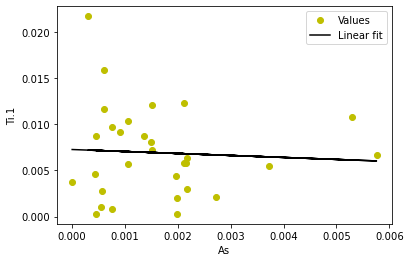

0.9626997470981596 x + 0.0011348849945697103


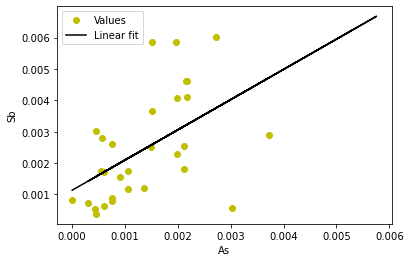

2741.477484129543 x + 14.320989699054905


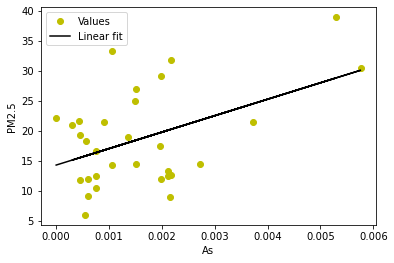

58.95484462865609 x + 0.1979896036557147


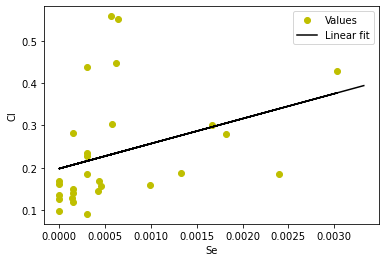

101.50976653048718 x + 0.5361041730421281


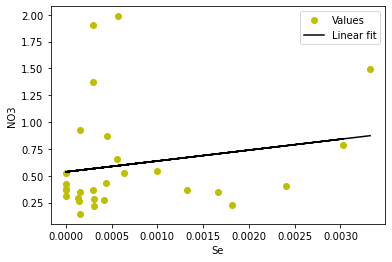

21.030596818151114 x + 0.4788088285340304


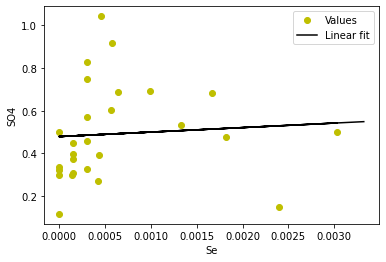

8.612690552379526 x + 0.29034711903981786


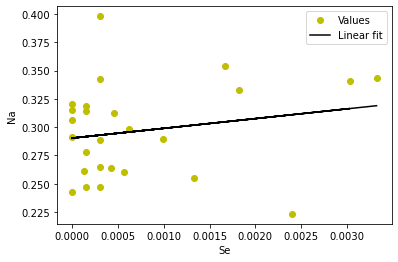

130.34081835953276 x + 0.24211343891062728


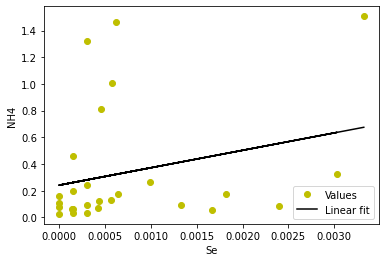

964.9385147475608 x + 4.84695654440481


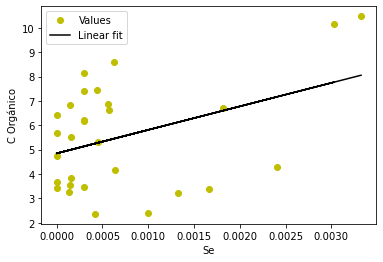

333.9982794059972 x + 0.9293074841762061


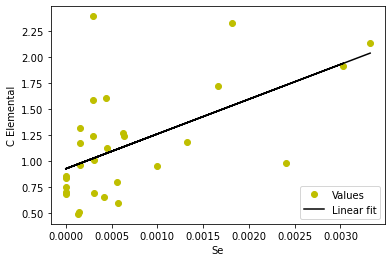

324.4144602893312 x + 6.432824226474692


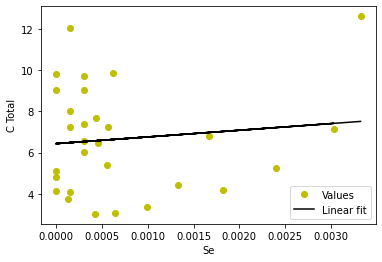

85.30034465663331 x + 0.432191403779794


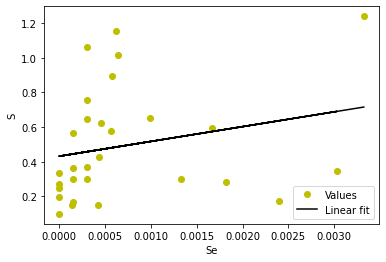

-12.018597620064433 x + 0.28495307512991014


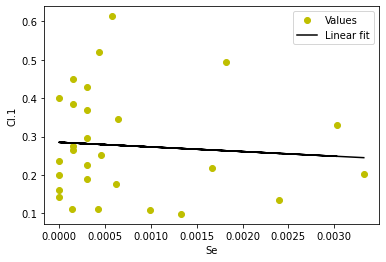

20.55126416176166 x + 0.13961646635893865


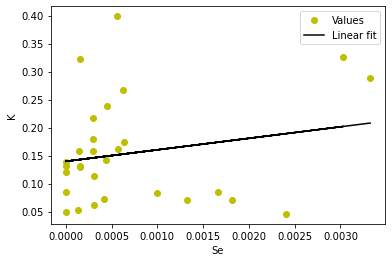

47.41840157776141 x + 0.566077209506427


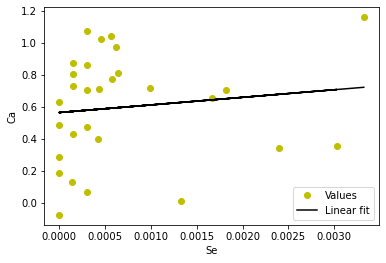

0.6505469991665475 x + 0.0075357680284445635


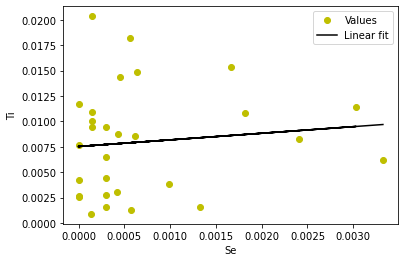

-0.14687456116527559 x + 0.0016244397983614942


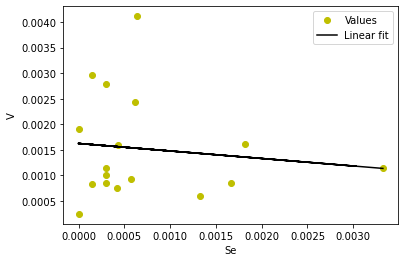

0.832693652142954 x + 0.0017847951787080298


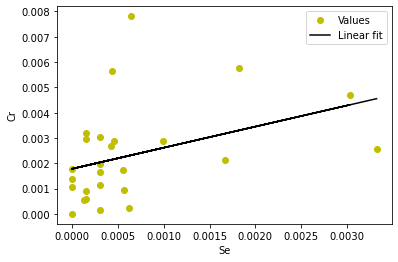

0.04691556664969989 x + 0.0035519737968085093


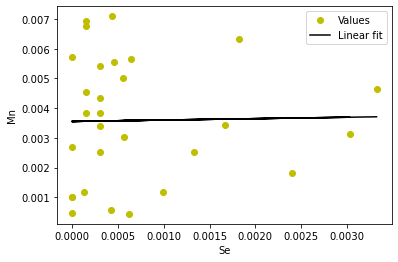

36.872517078520204 x + 0.12044520128773901


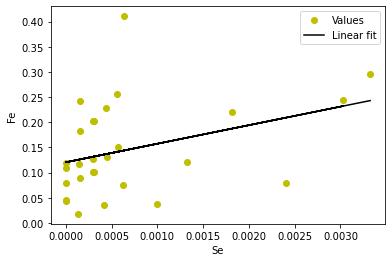

0.06451291316810122 x + 0.0010891872652280202


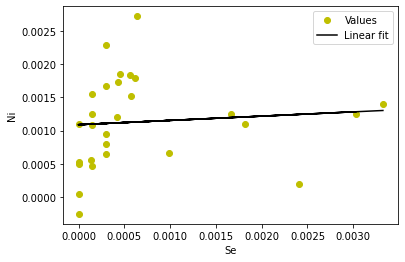

3.2104663697137137 x + 0.004920690986772343


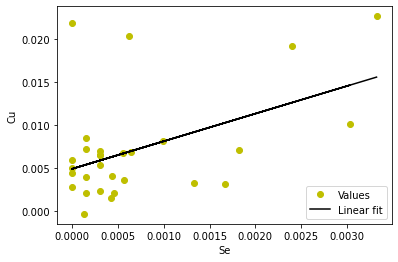

19.490702894134706 x + 0.024977488267101458


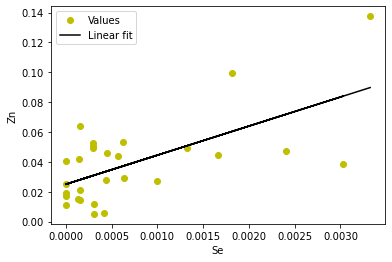

1.1458670741767607 x + 0.0009442191780424855


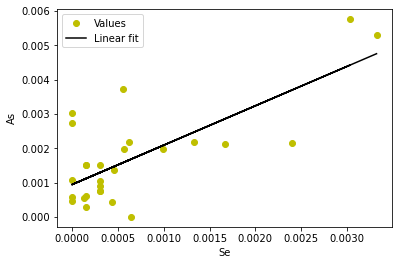

0.9999999999999999 x + -3.221300625151841e-19


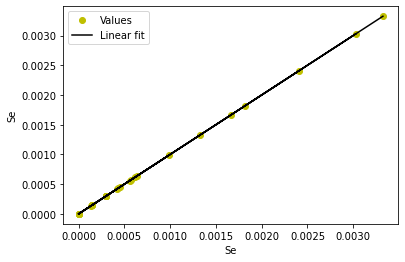

0.20476615526746944 x + 0.0019859639755074533


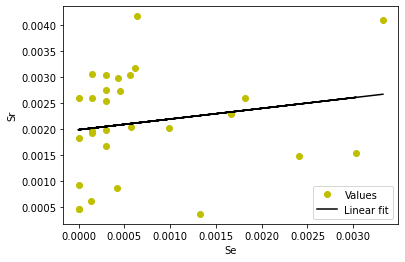

8.838297886003511 x + 0.002900928186110013


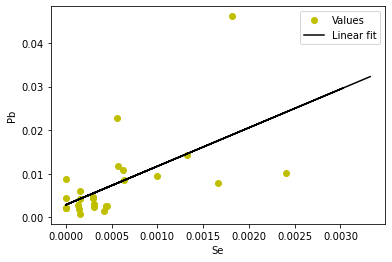

-0.2079413612016954 x + 0.0003408005001293638


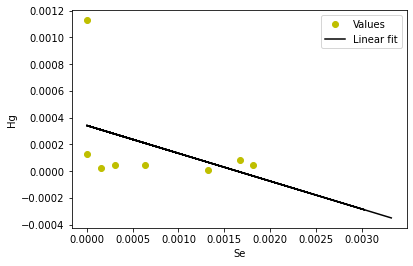

13.920194650717098 x + 0.0033573735657537675


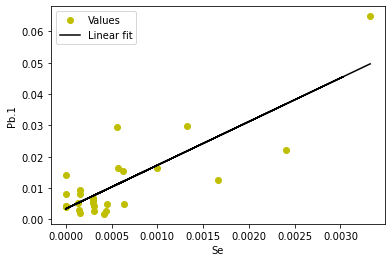

11.55858902235867 x + 0.02836229670798215


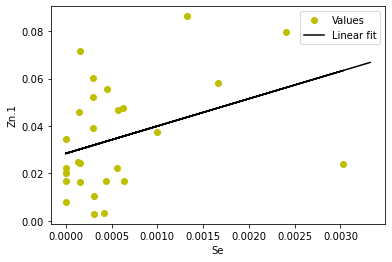

0.31286619338243615 x + 0.004013471700068361


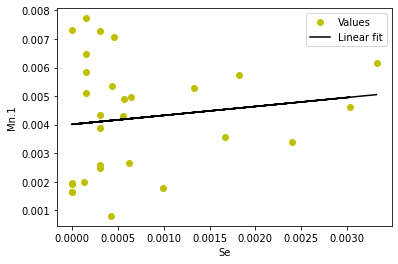

0.09869229397731795 x + 0.0002677953375460232


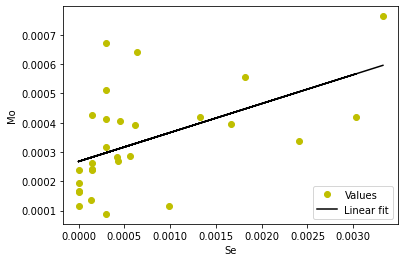

0.13518707628247867 x + 0.0014319459350723405


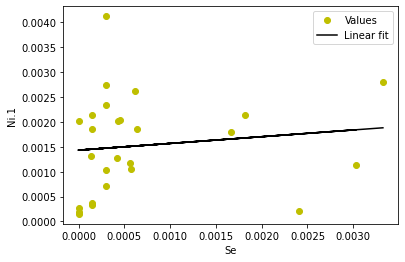

0.4924315233084578 x + 0.006095860679490178


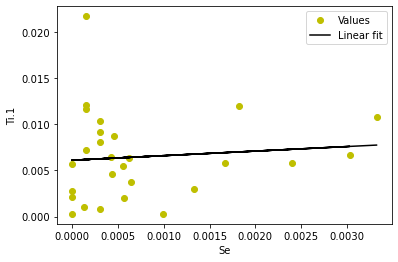

0.8878086725494148 x + 0.0021556775000950287


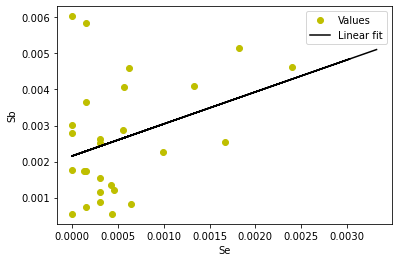

2572.745800078959 x + 17.231930720671656


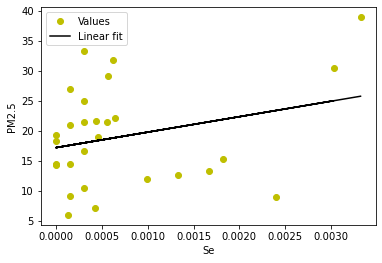

71.3088022968123 x + 0.0755550674646462


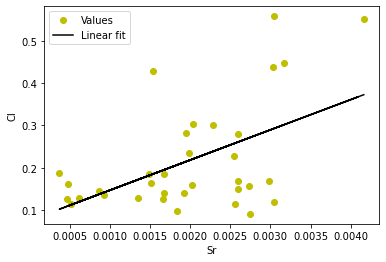

106.19295285762122 x + 0.3640371037529695


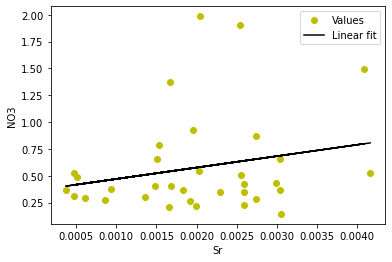

104.62863240841182 x + 0.2680346283120362


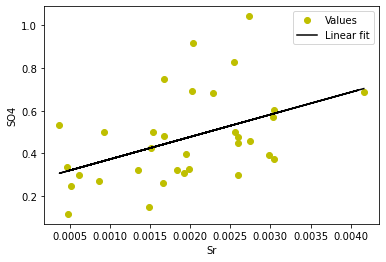

20.71734420730355 x + 0.2539152093118102


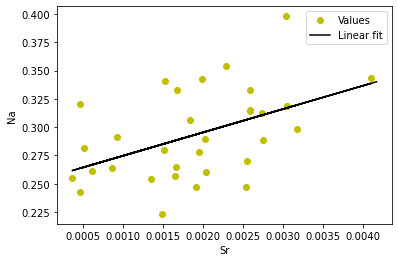

135.43039336654263 x + 0.057758615187374525


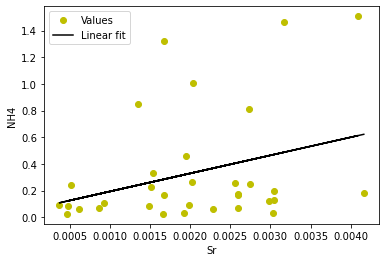

908.5425836680395 x + 3.53912925753126


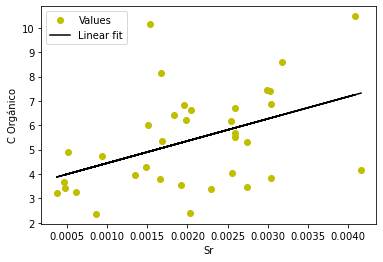

251.34913365147855 x + 0.5868273013754851


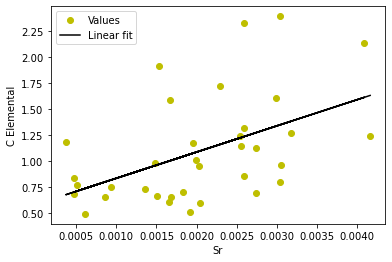

927.110170665271 x + 4.528190015245889


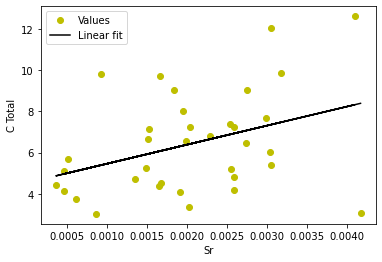

216.87829701572974 x + 0.016947444580826622


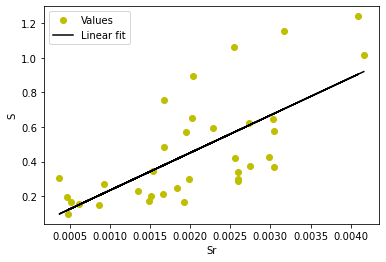

40.923559777428274 x + 0.1787779378712723


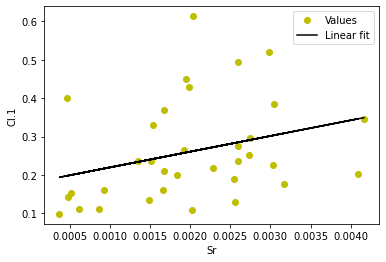

44.55652126053923 x + 0.06537124747345047


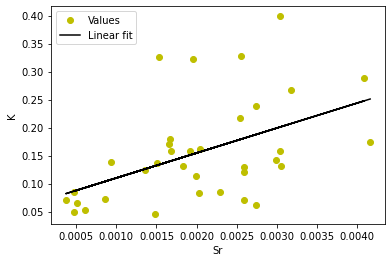

253.53832820540097 x + 0.06607280479740855


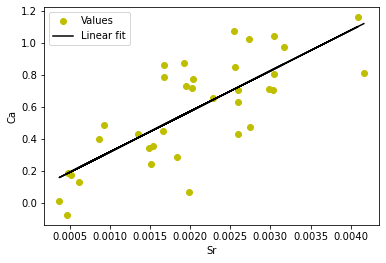

2.8096150738231684 x + 0.002776890149419519


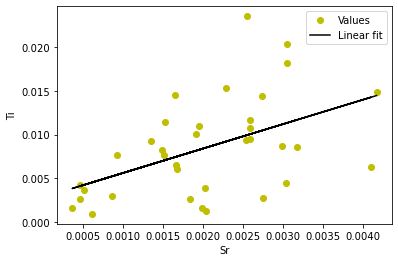

0.6059285150483601 x + 1.641743241746471e-05


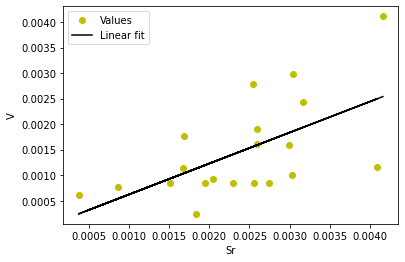

0.6248588482755661 x + 0.0008213202051919877


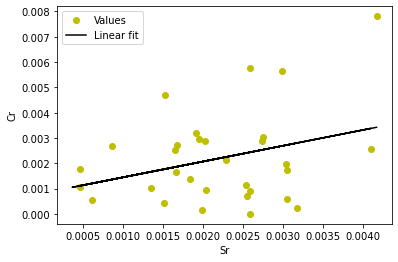

1.281052931563147 x + 0.000859582610951002


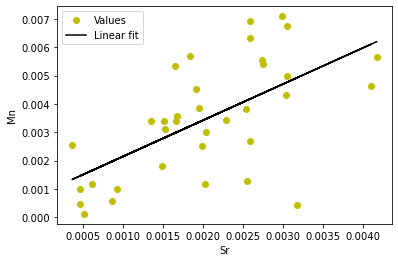

63.576514720655176 x + 0.006473933729191687


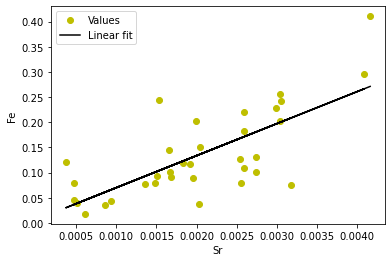

0.41104754410946365 x + 0.0002714917512366927


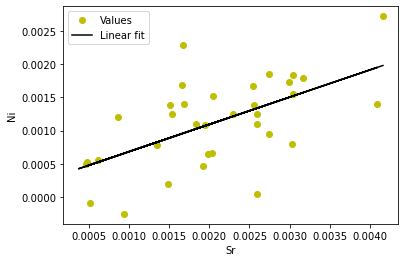

1.4064401253897416 x + 0.0039991287756235136


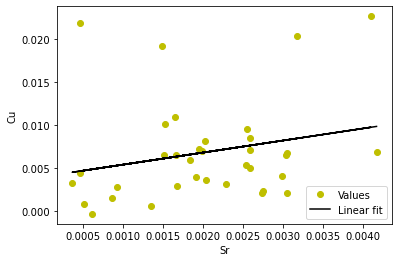

11.119991793145383 x + 0.01356857113256903


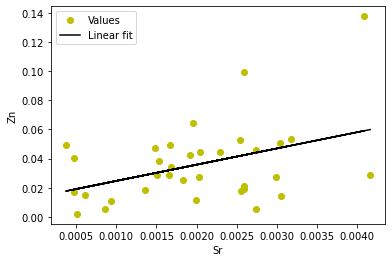

0.09672521488913623 x + 0.001431638017917231


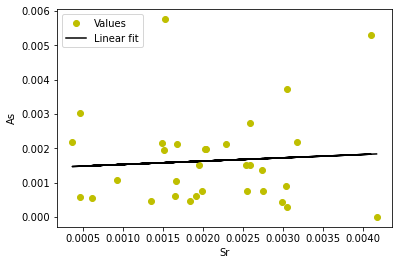

0.161523218933179 x + 0.00036291540994792874


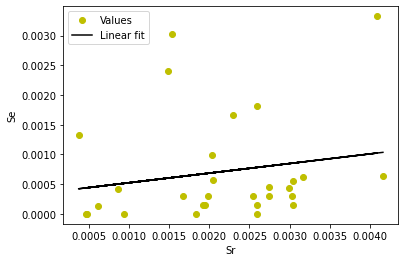

1.0000000000000004 x + -2.932217852998481e-19


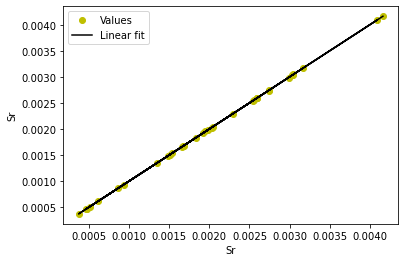

1.6011972408960027 x + 0.003640340367573049


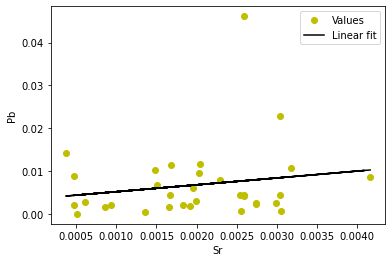

0.01886409143902384 x + 0.00014102021449357733


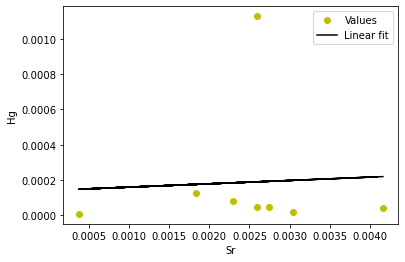

3.1264678608436967 x + 0.004300082503864567


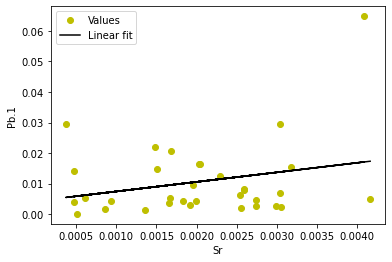

-0.4288233334876455 x + 0.03357172155088374


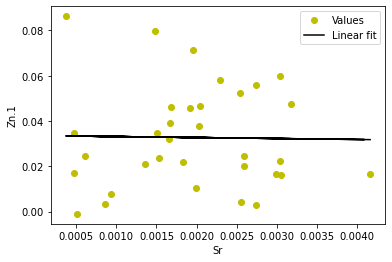

0.8080319225070111 x + 0.0026412756634856976


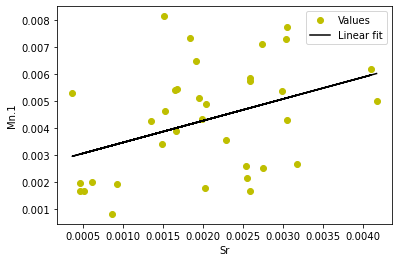

0.08801586073527565 x + 0.00014782749887786491


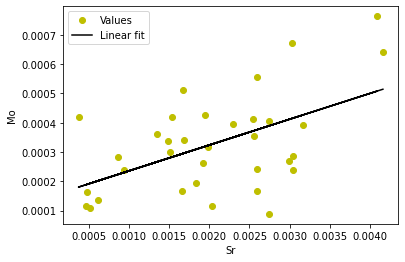

0.4535618917094866 x + 0.0005072529238329187


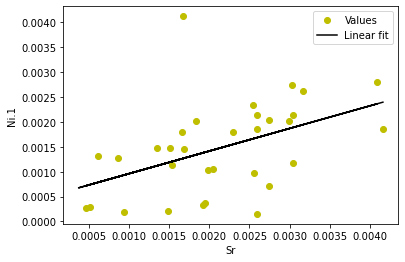

1.5325216886769653 x + 0.0036915176912549036


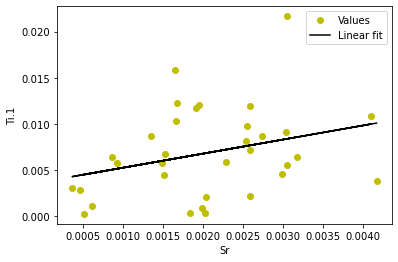

0.06770792311318323 x + 0.0023061030207987016


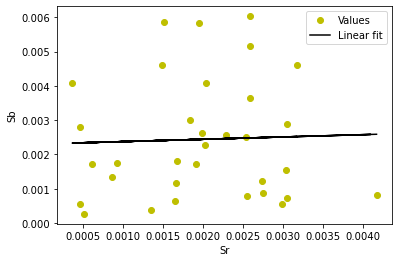

3837.5812256847757 x + 10.220019164958238


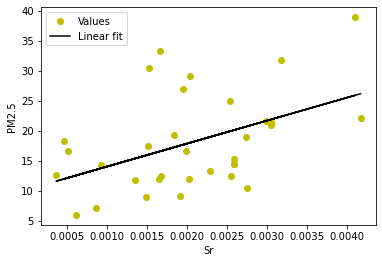

6.299920713402018 x + 0.16662328623980852


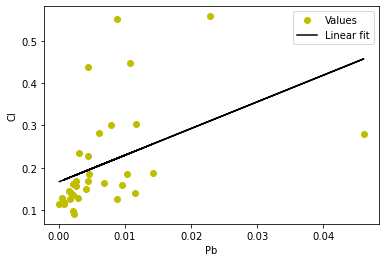

1.0663497908874637 x + 0.5336580055447875


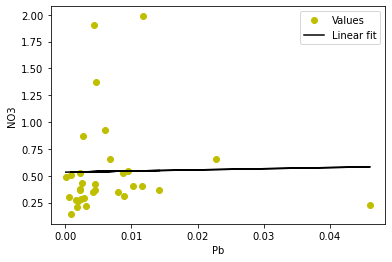

4.621472914848444 x + 0.4384385214571452


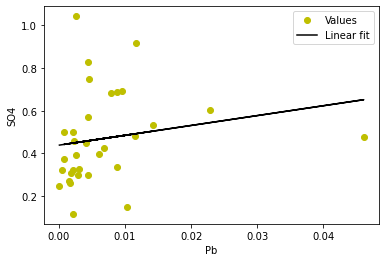

0.9328661591995564 x + 0.28413643880502626


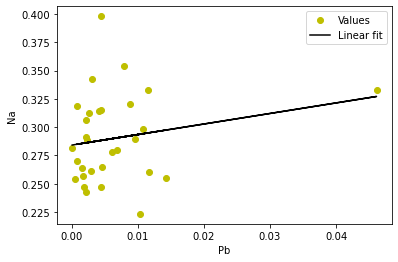

-0.07254205235267669 x + 0.2940429414211056


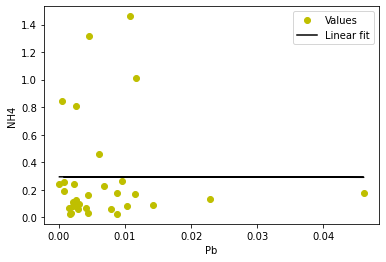

50.26842249884734 x + 4.74241854586994


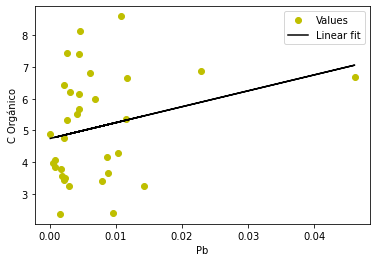

23.665792232559333 x + 0.8794148696919637


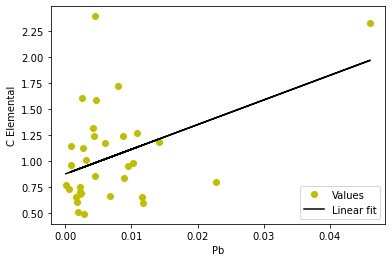

-56.93756613908337 x + 6.5884006569347795


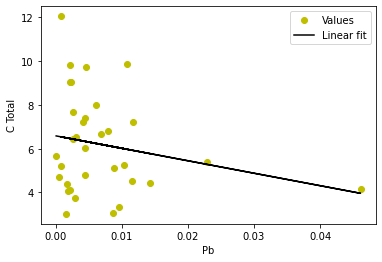

4.592581849997576 x + 0.40561495827271665


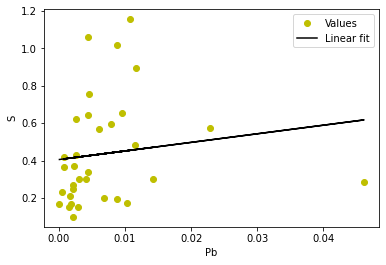

5.132832586105525 x + 0.22788990174125154


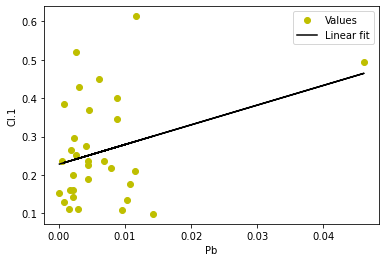

0.47811703363420555 x + 0.14339521914009562


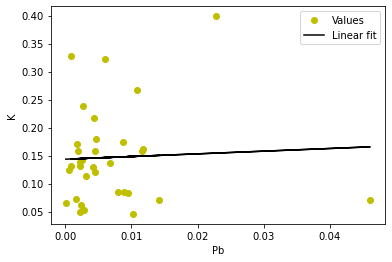

6.221916579590816 x + 0.527445596583399


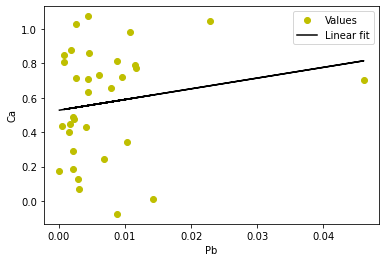

0.04489641061616049 x + 0.008153644708933722


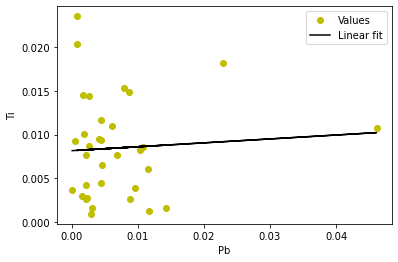

0.005572427230503073 x + 0.0014341014191127865


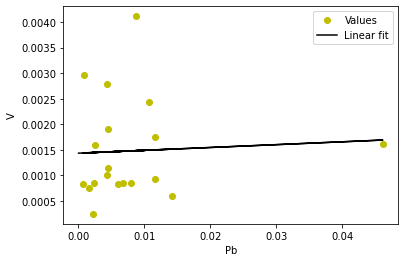

0.07129783146402759 x + 0.0016002508762827552


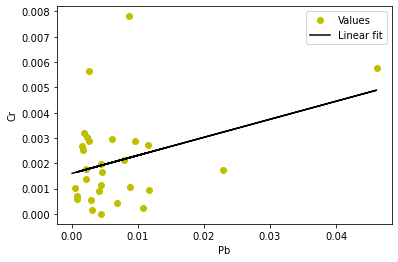

0.043978361997794535 x + 0.003134930995598422


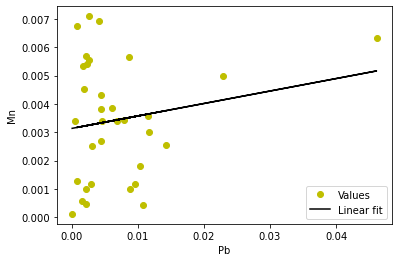

2.9085639184343814 x + 0.10686576652072965


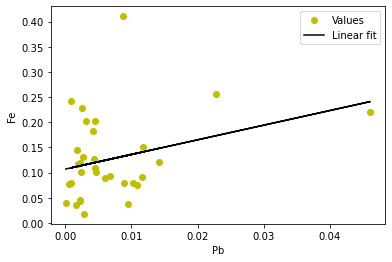

0.012058605699570847 x + 0.0010340459541277886


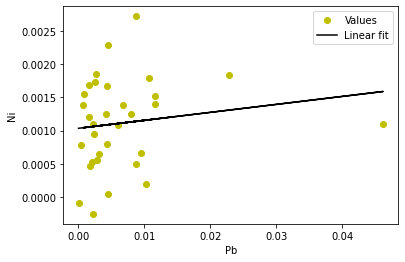

0.1298394062070354 x + 0.005389437863666045


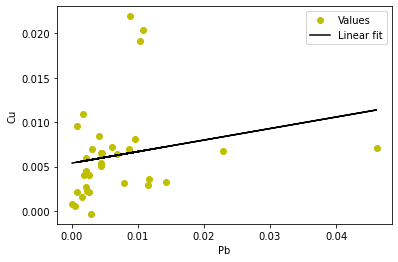

1.8675452480268848 x + 0.020758290009181588


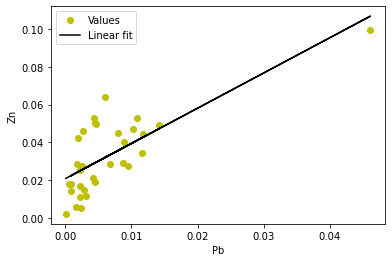

0.14290325135246632 x + 0.0005314811012785078


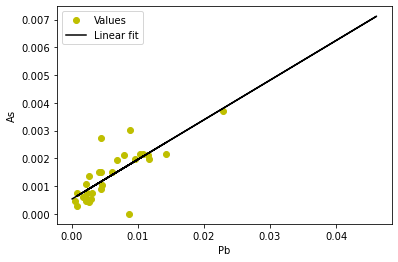

0.0395685261825512 x + 0.0002260345328925662


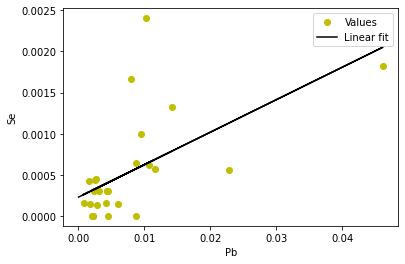

0.019204398141319145 x + 0.001851715358902216


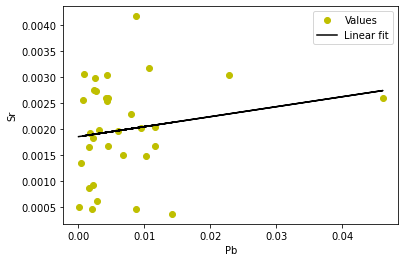

1.0 x + 1.2079063857174517e-18


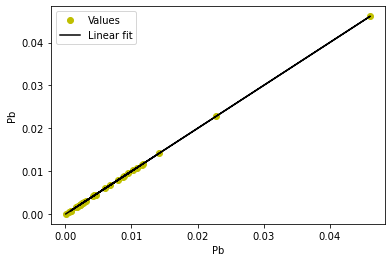

-0.004873589736403258 x + 0.000240194756629113


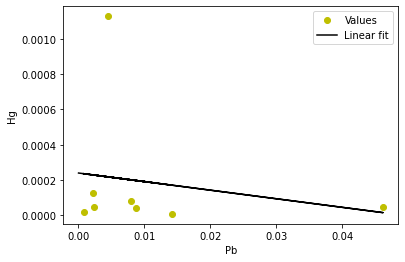

1.50192465006506 x + 0.0005567291919178715


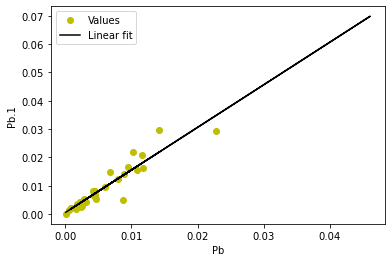

2.1140977187251875 x + 0.021203954661841218


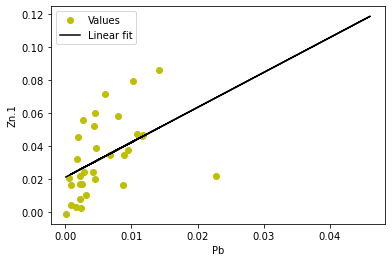

0.030165938962799788 x + 0.0040079403984084605


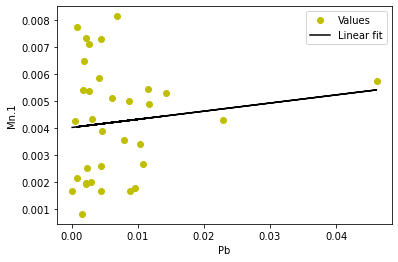

0.006296873116935759 x + 0.00026794248156248023


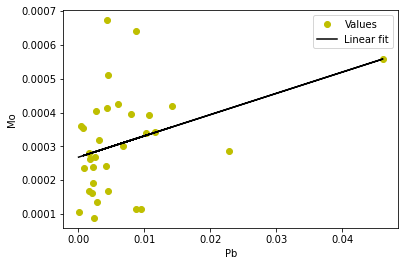

0.011655337755119233 x + 0.0013634585060306223


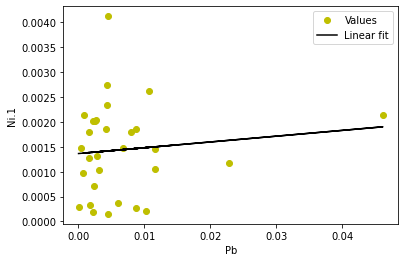

0.03158607406143334 x + 0.006501666087212133


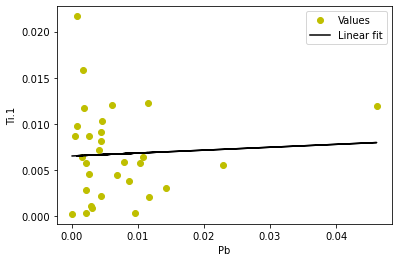

0.09228076424503799 x + 0.0018114597171300275


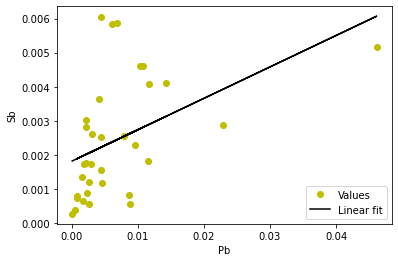

70.76729403952878 x + 16.6742686000131


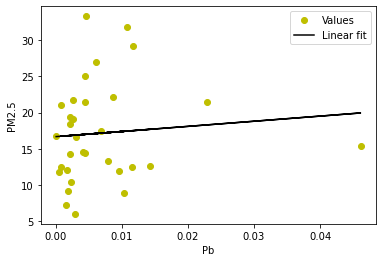

-64.20698319947033 x + 0.23665288382250108


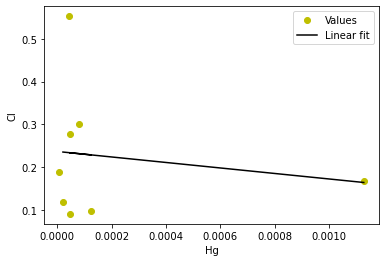

95.40078265590192 x + 0.317633538426212


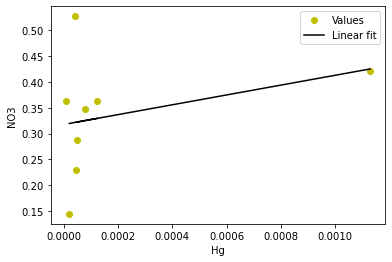

-196.63035443511077 x + 0.5155455811493824


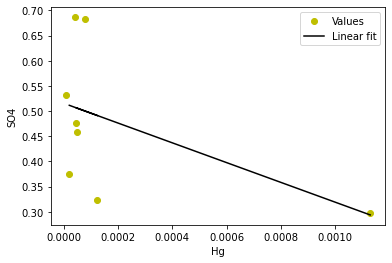

8.665446657126646 x + 0.3085510267329662


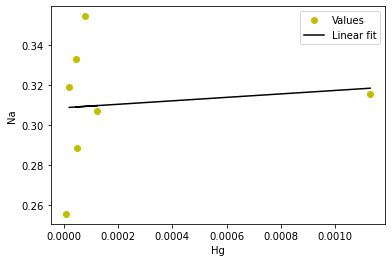

4.226649818258287 x + 0.1571374111599846


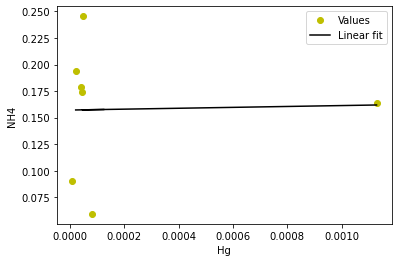

1299.808624143639 x + 4.370409477259398


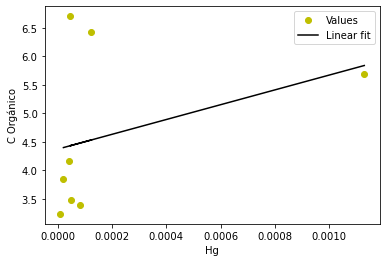

-387.9549841424012 x + 1.2870012207897397


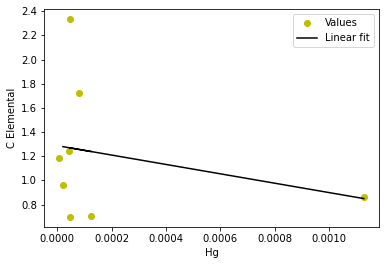

-1830.988357219354 x + 7.019607591185832


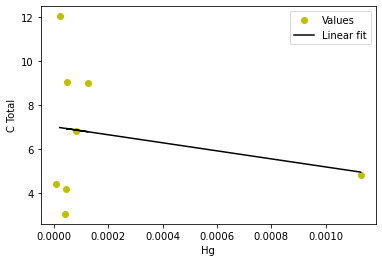

-114.64157393647434 x + 0.46189265976776867


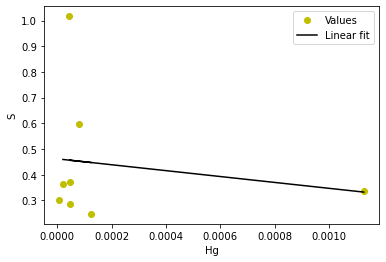

-56.3829142199929 x + 0.29482596634152014


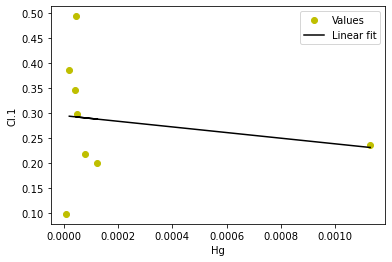

16.83595427104455 x + 0.10245872847314677


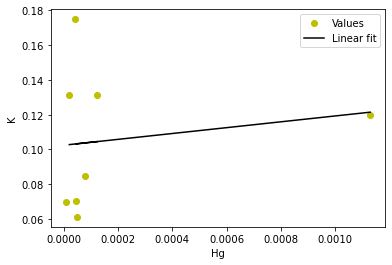

84.3477861598752 x + 0.5326098518375231


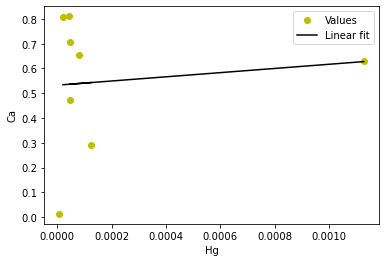

1.446490806433256 x + 0.00973665254779064


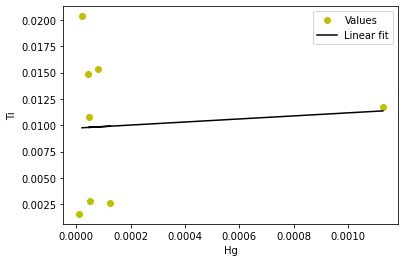

0.1436472131601616 x + 0.0016183680288394296


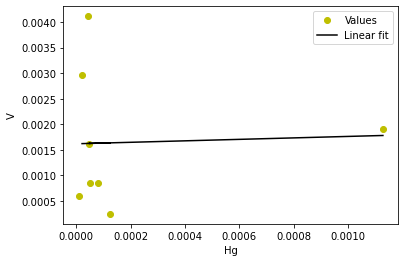

-3.3643008759877047 x + 0.003673677099580025


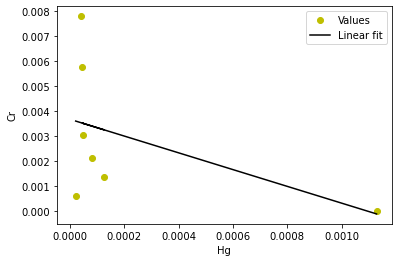

-2.2045860160836646 x + 0.005222363769617378


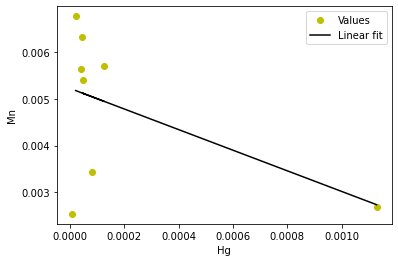

-92.27963700544707 x + 0.20789149437850224


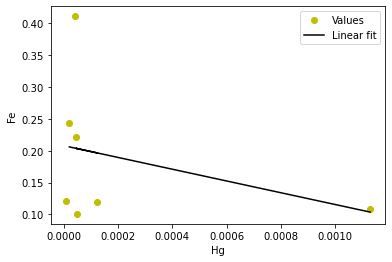

-1.3519680400561815 x + 0.0015364966277323893


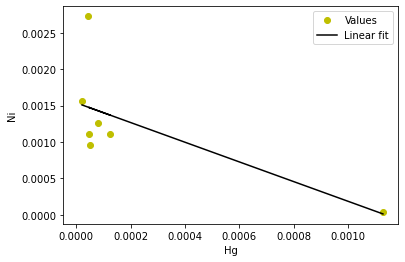

0.7140578053975903 x + 0.004354178638431876


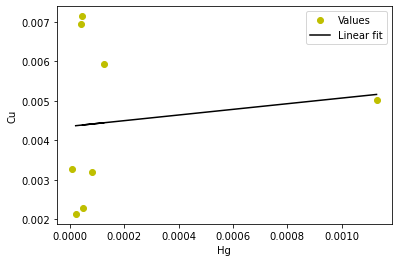

-18.386899357695892 x + 0.039188651274892114


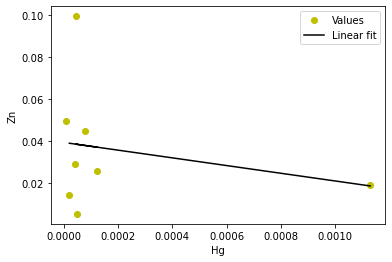

1.5965200055845246 x + 0.0008878437565588979


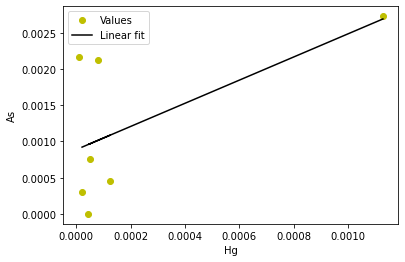

-0.8160038574290662 x + 0.0008909573750201339


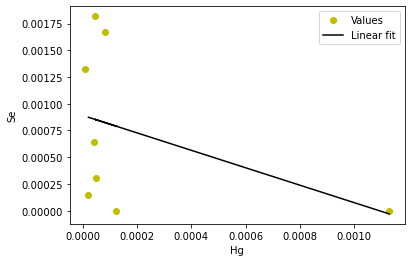

0.15060672135363387 x + 0.002426063991069764


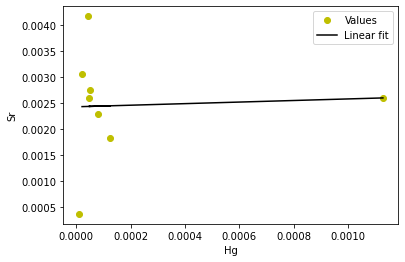

-7.433385724304699 x + 0.012242081792503037


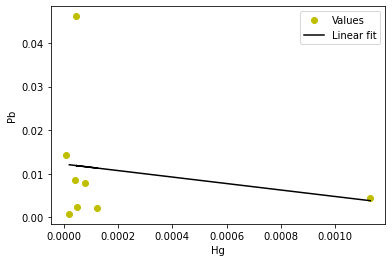

1.0000000000000002 x + 0.0


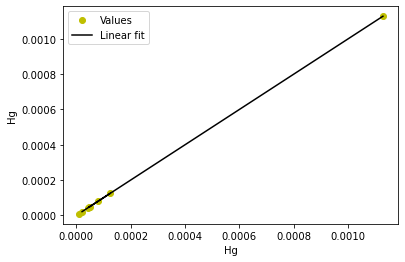

-2.015267174765951 x + 0.009593948207583977


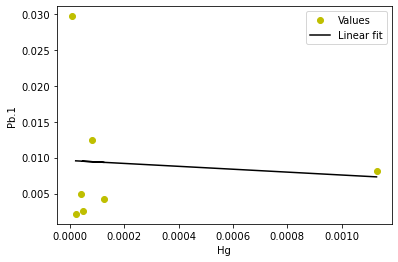

-14.020603877088838 x + 0.0347354845131519


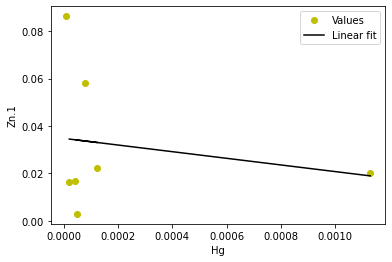

-3.3426150097640392 x + 0.005468724550305601


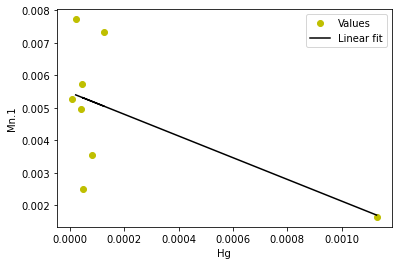

-0.1916072575524359 x + 0.0003734378038383034


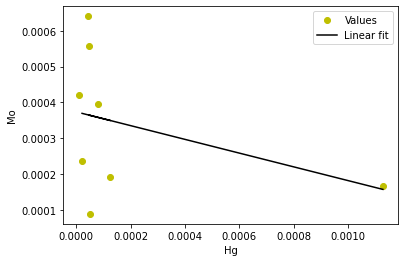

-1.5020026386623824 x + 0.0018629717610755584


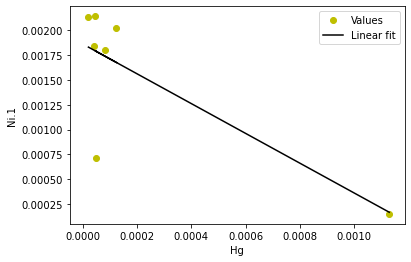

-5.982527557513501 x + 0.008189308140655233


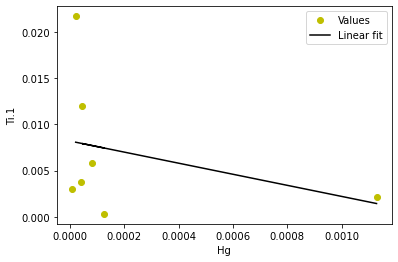

3.314812952592206 x + 0.0022896245927556164


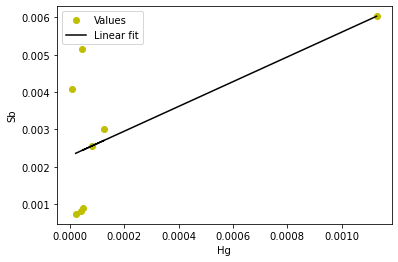

-1619.7618116379772 x + 16.384902244961506


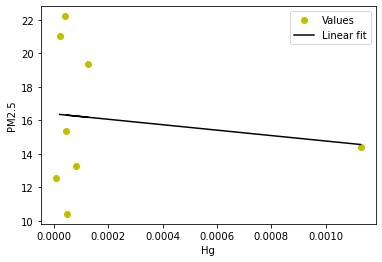

6.216832587052766 x + 0.15252837679793793


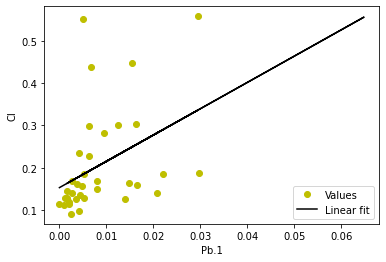

14.198041021810823 x + 0.4134100314826069


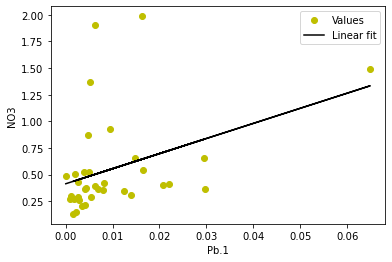

7.733758676905719 x + 0.383394948572633


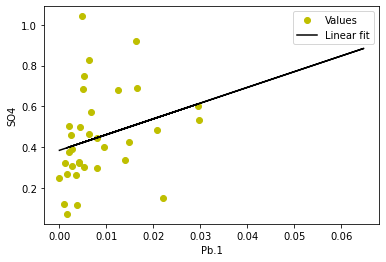

0.6777807623964419 x + 0.28243727381240985


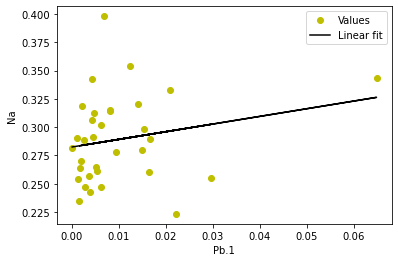

13.993098464187177 x + 0.1688161205742833


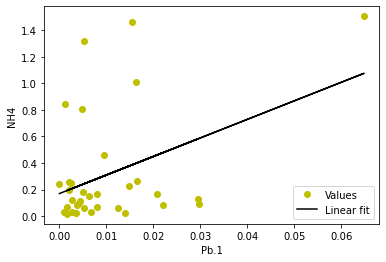

75.21752114777262 x + 4.248523059595584


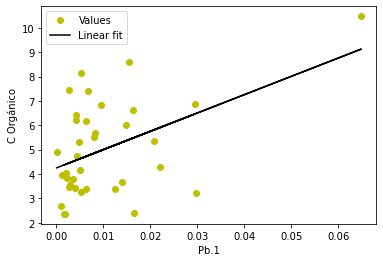

14.09816987297157 x + 0.865996654293058


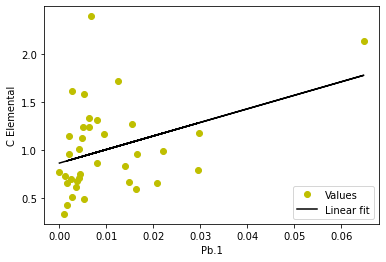

62.099336927667956 x + 5.589998415604598


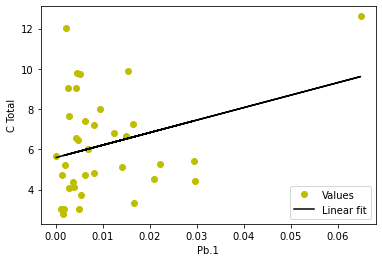

11.355484171002887 x + 0.34503782370688507


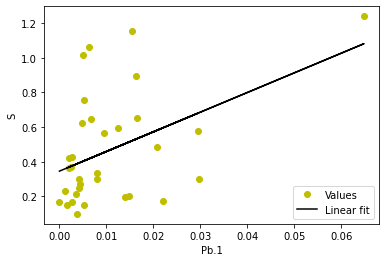

-1.194773233711982 x + 0.26319660837368325


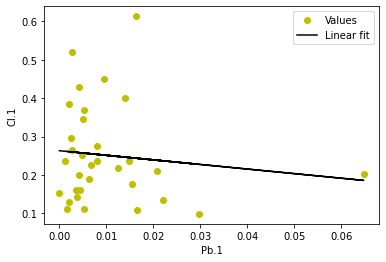

2.1588478749646143 x + 0.13027160563826165


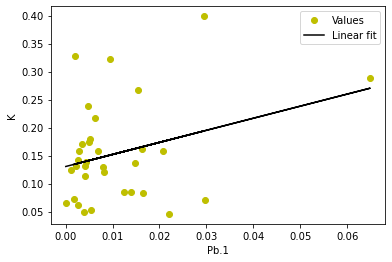

6.673355176867239 x + 0.5126574738639831


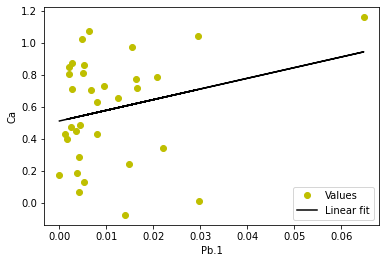

-0.046163462766386935 x + 0.008812127177385418


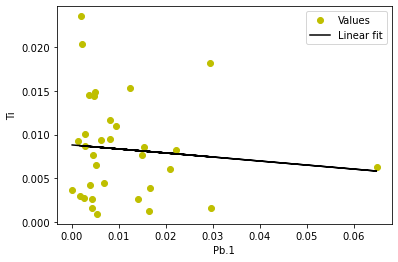

-0.010014508216808564 x + 0.0015761941720987742


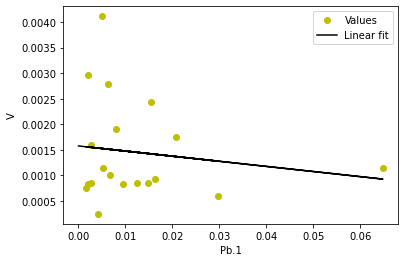

-0.0025477572048301813 x + 0.0020030365969478043


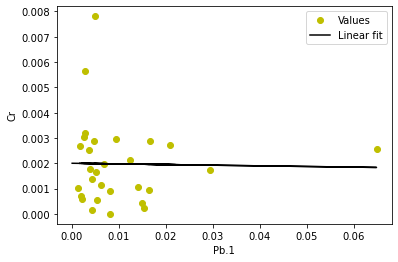

0.0013487710062924652 x + 0.003369324714969365


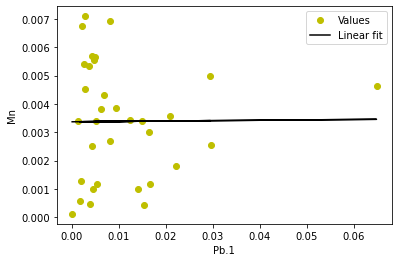

1.9943204815902054 x + 0.10781229421338462


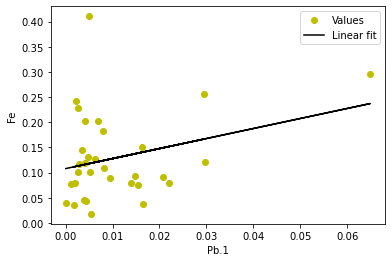

0.006518990277107575 x + 0.001057179467851897


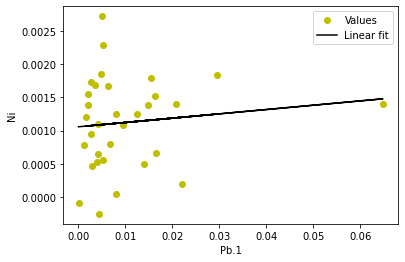

0.26809194690545857 x + 0.003892493002175877


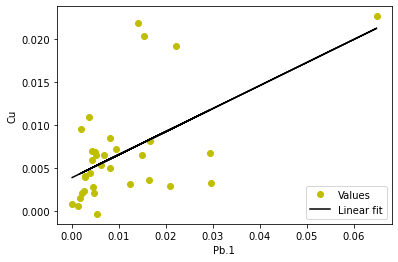

1.681079285822377 x + 0.016846269271888998


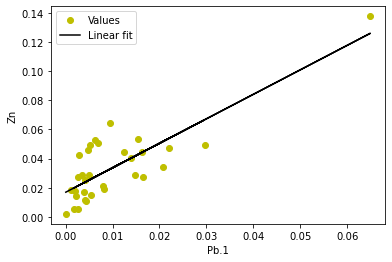

0.07932492397572356 x + 0.0006074647285970926


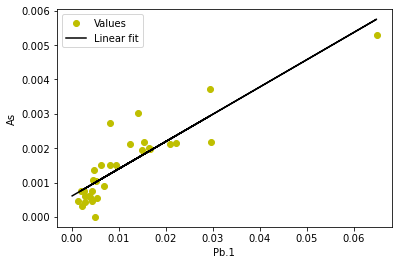

0.04842896336857674 x + 2.6369287512428502e-05


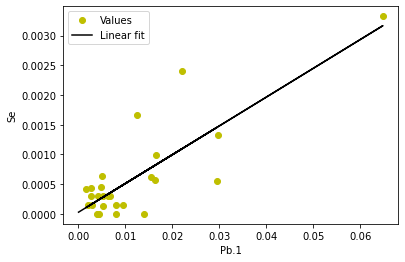

0.020165032087289574 x + 0.001813450715692895


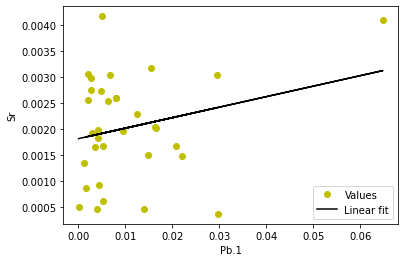

0.5814897232382549 x + 0.0003837812242957704


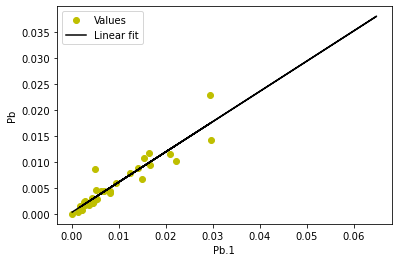

-0.0035518845509184996 x + 0.0002401053526414321


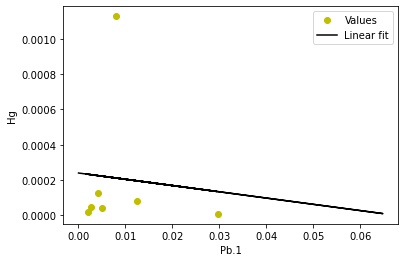

1.0000000000000002 x + 1.1256372301674155e-18


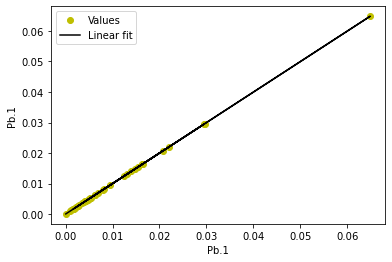

1.7518491168958226 x + 0.017159398375222082


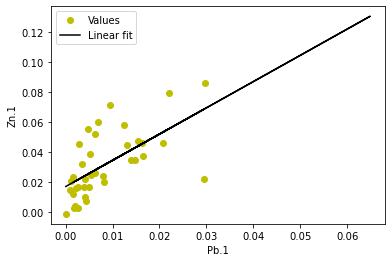

0.02304054752418275 x + 0.0040682581142948305


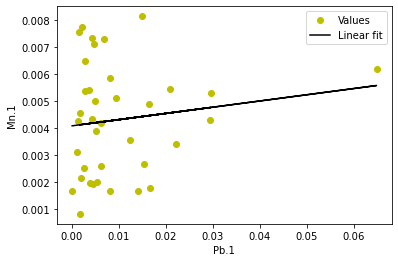

0.006664740875623171 x + 0.0002499924338765976


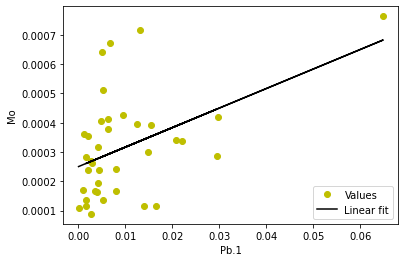

0.017903039647313455 x + 0.0011765893694514811


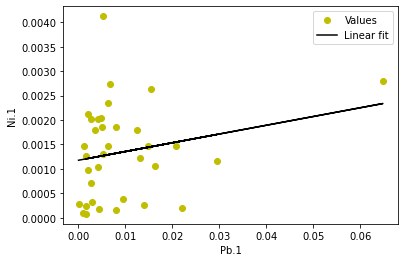

-0.04589003495362173 x + 0.008107165844808814


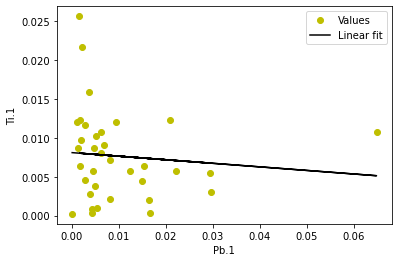

0.11304807156431312 x + 0.0013219295701188104


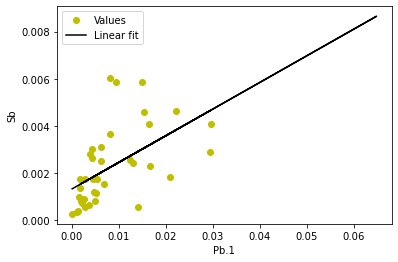

274.04242471479597 x + 14.600915162524954


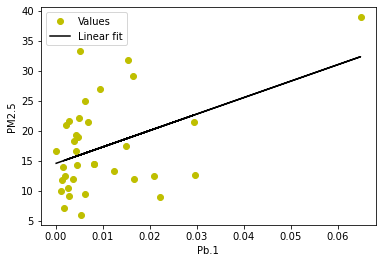

1.2547771970622916 x + 0.17126408682939406


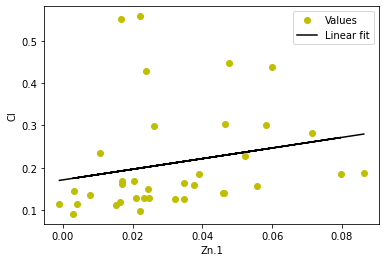

5.910026493384739 x + 0.3476516494810265


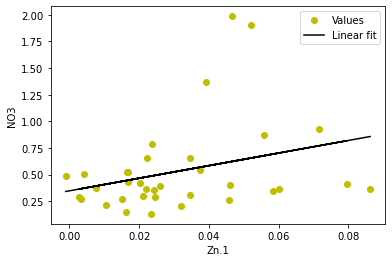

3.3567214892498014 x + 0.3433012924453433


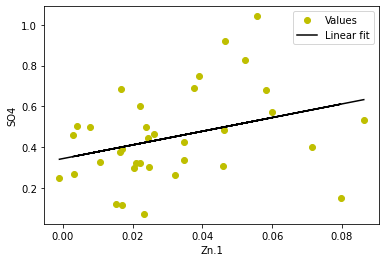

-0.052087958545712375 x + 0.290716611920842


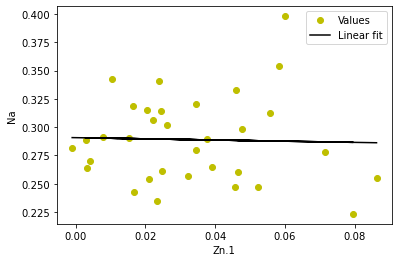

3.0658475194502652 x + 0.1814826481035748


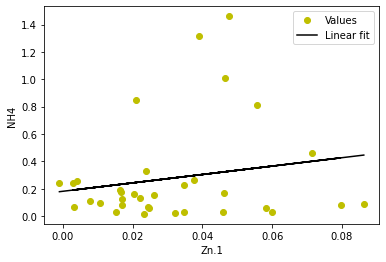

13.542329575358064 x + 4.560786719890042


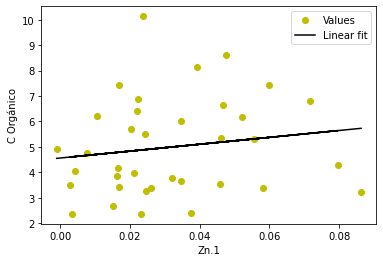

6.5264004210784305 x + 0.7931631844106208


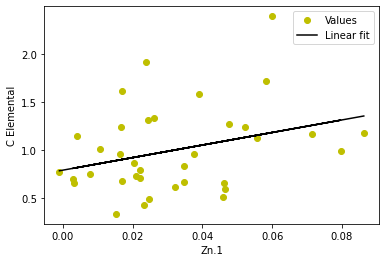

1.6653965239304187 x + 6.0056472286275975


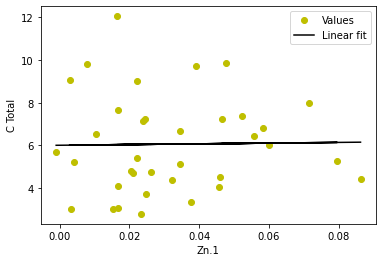

3.7598108460247865 x + 0.31563386814184347


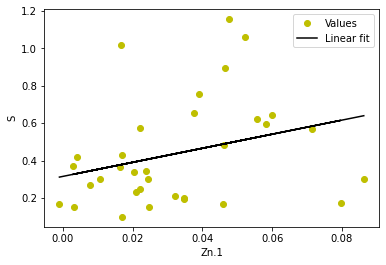

-0.12816846241341817 x + 0.25943455800931614


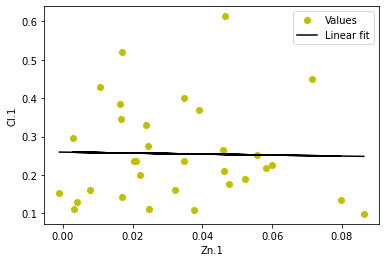

0.2671840416746141 x + 0.14564784215845292


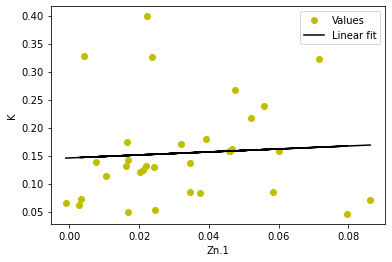

2.2346062990775444 x + 0.4862103381012557


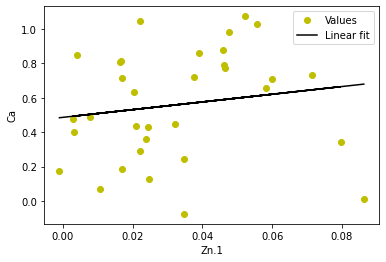

-0.017451497128268684 x + 0.009049252393571933


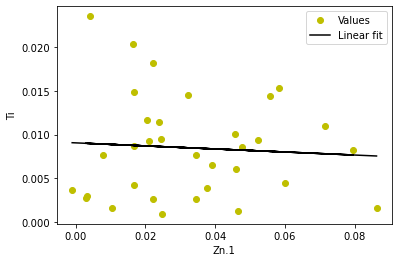

-0.006892067744226378 x + 0.0017183156580226717


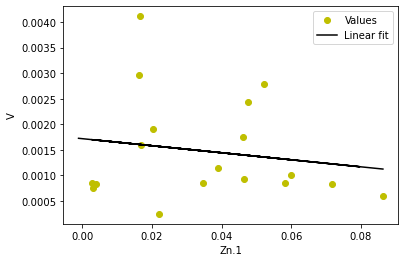

-0.0030392723810093577 x + 0.0021459547221793366


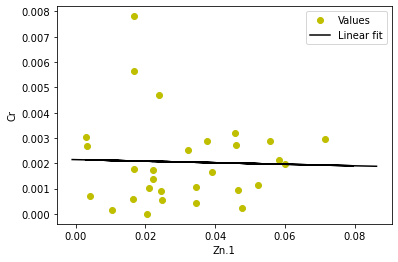

0.0037523646859454135 x + 0.00321538832100686


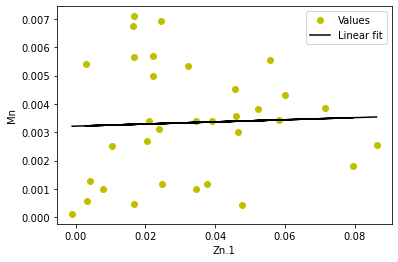

-0.21817074588901156 x + 0.13429592738859975


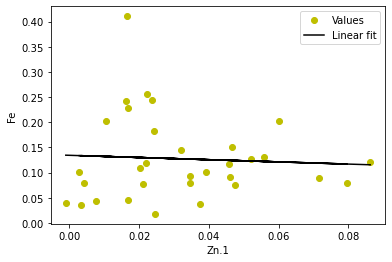

0.003899805561658152 x + 0.000997027415528695


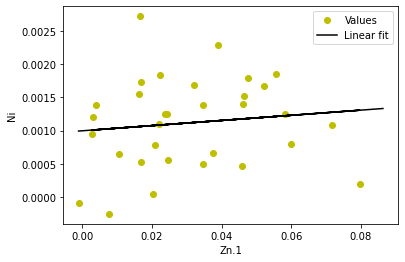

0.06453145657432978 x + 0.0042536400967938875


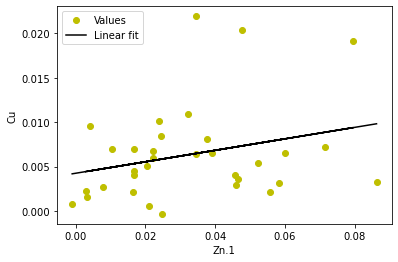

0.6425514376297602 x + 0.009400616132675003


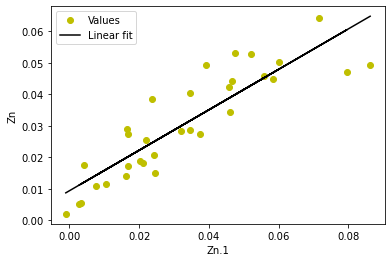

0.0126983566742264 x + 0.0010749410385121954


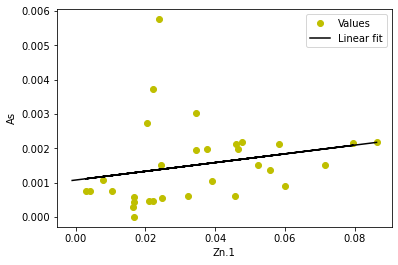

0.011894331191507783 x + 0.00015342464532672734


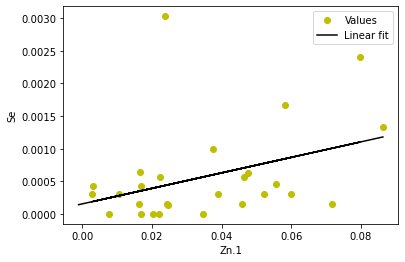

-0.0007396339377364328 x + 0.001974664731370521


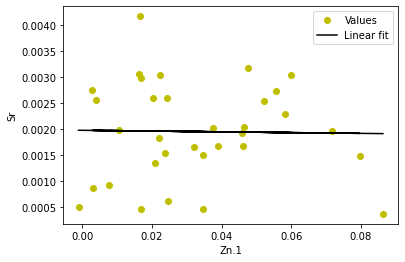

0.1001941857667361 x + 0.00227867935722225


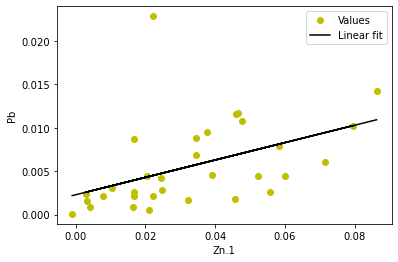

-0.002691132762913904 x + 0.0002931621624245367


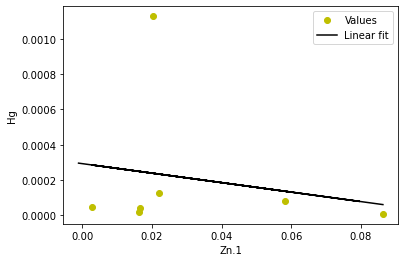

0.22057115028762317 x + 0.001355961710216561


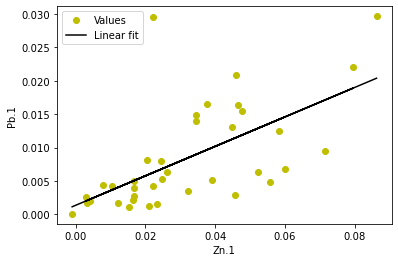

0.9999999999999998 x + 4.5025489206696626e-18


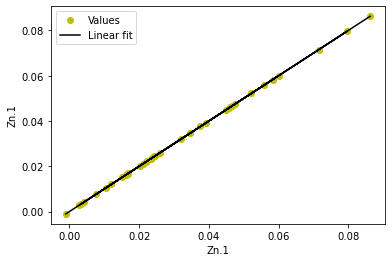

0.026576006231341435 x + 0.0034209617836159865


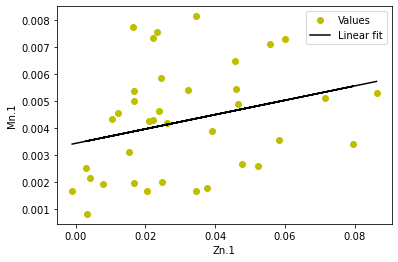

0.0034224543278130893 x + 0.00019843787612350774


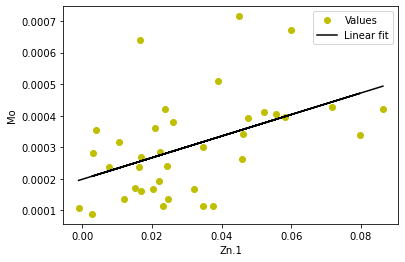

0.010042881376071153 x + 0.0009910631368996643


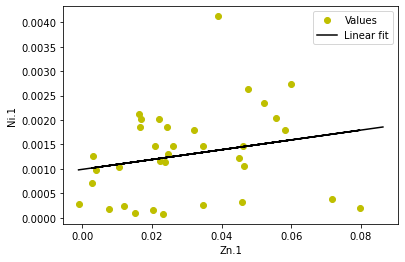

0.005650344570944672 x + 0.007356122820879849


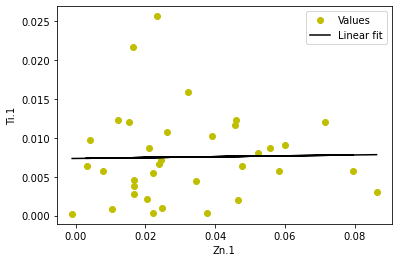

0.035779993873238485 x + 0.001129952854145219


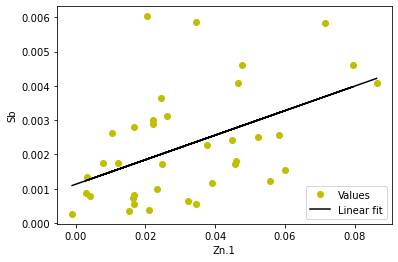

58.40630889807287 x + 15.217655125986898


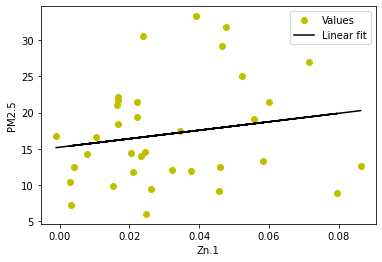

6.4755562799000606 x + 0.1852422100981612


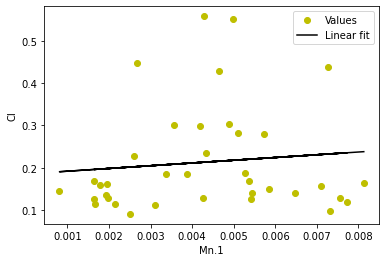

-0.5658783185238964 x + 0.5532284375447987


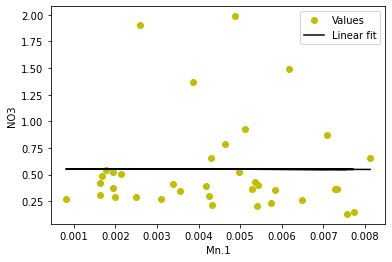

12.864359014918284 x + 0.3935829976310878


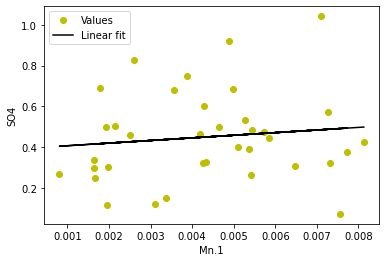

4.335278605069911 x + 0.27322093204752257


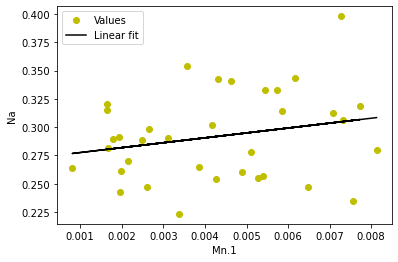

14.119037574538314 x + 0.24856699202263552


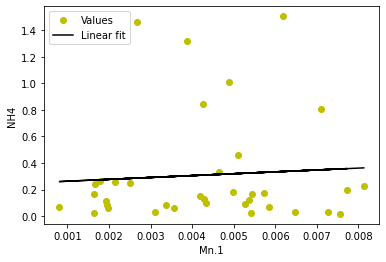

283.8626041378492 x + 3.9504715795351393


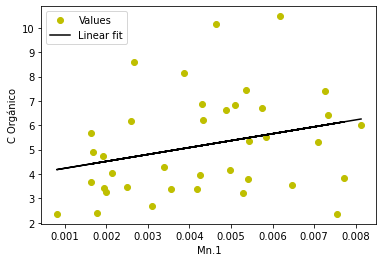

56.10476469039576 x + 0.8225984696970592


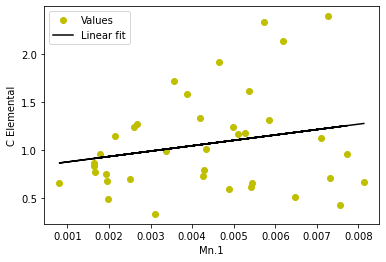

271.59663114025756 x + 5.004644790357472


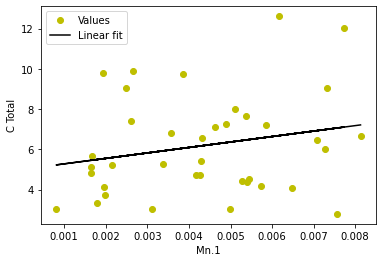

15.172054436994047 x + 0.39224530474334296


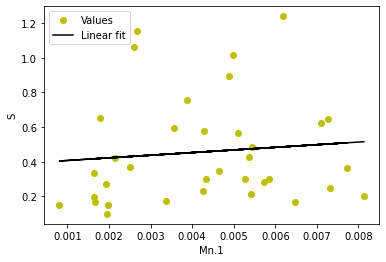

21.066957721611693 x + 0.170441554332991


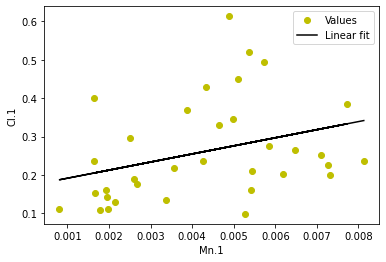

9.946245479749274 x + 0.11323449449503467


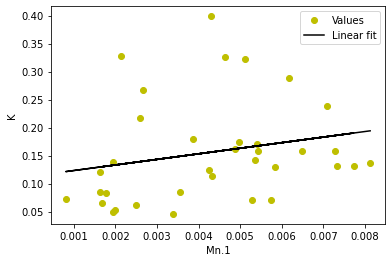

36.53442251795158 x + 0.42432538378180784


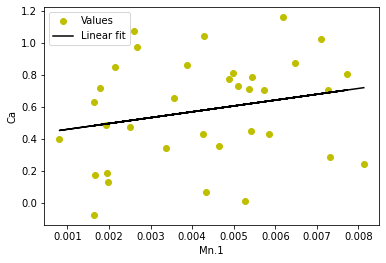

0.5679693729881364 x + 0.006048548057640265


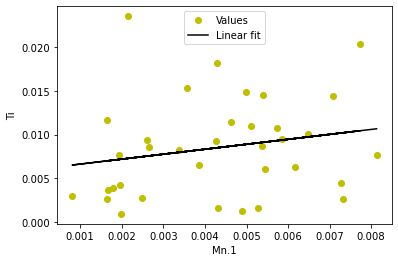

-0.018282695838413 x + 0.0015475297627665057


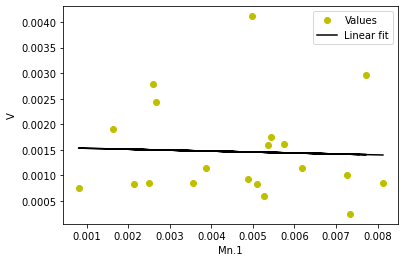

0.14788174828601364 x + 0.0015305777100140846


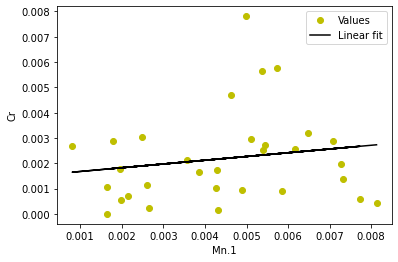

0.7399803533641579 x + 0.0002918189083436505


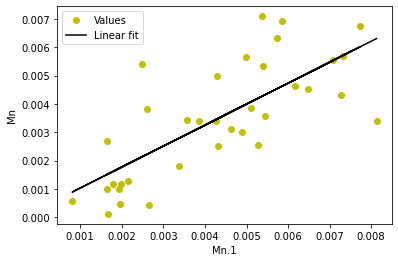

22.463619899632796 x + 0.038391833144579154


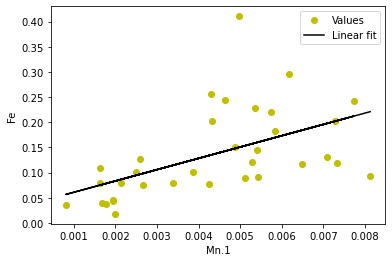

0.12925803879727035 x + 0.000576349596284564


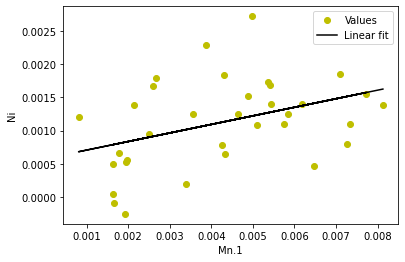

-0.09027251689460566 x + 0.007240677215786914


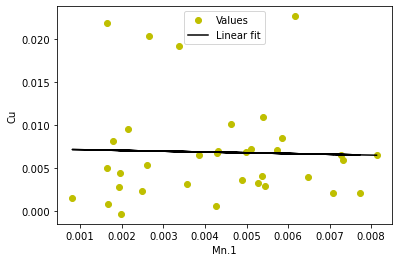

4.526533358270468 x + 0.016431842655083812


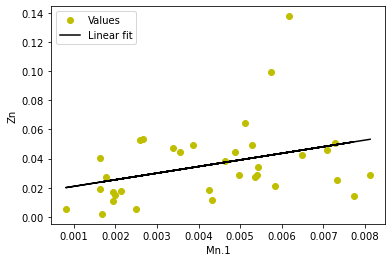

-0.043254407217041616 x + 0.001825862293669411


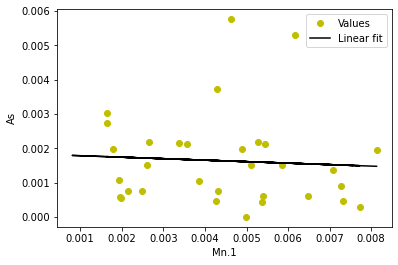

0.06315813108253261 x + 0.00043962572358034106


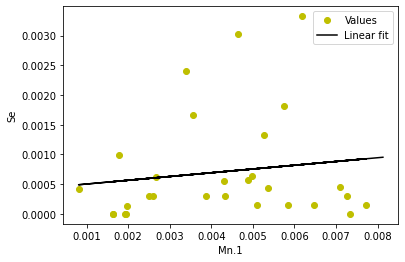

0.18684599630543577 x + 0.0012299842852744058


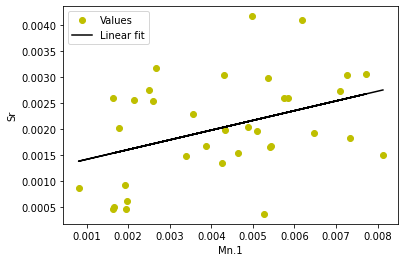

0.5147315702843362 x + 0.004646028773663223


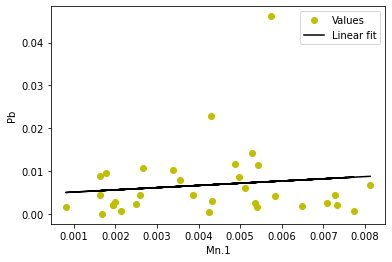

-0.1036631066116695 x + 0.000689316119348419


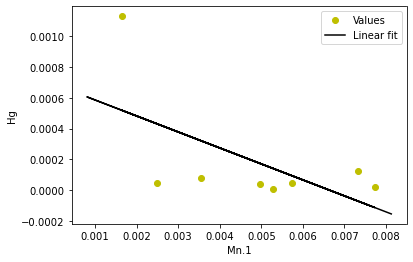

0.7958961061816203 x + 0.006359555742055852


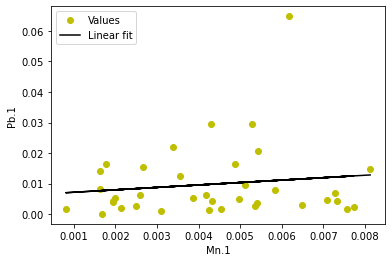

3.054362629537868 x + 0.01827920830552067


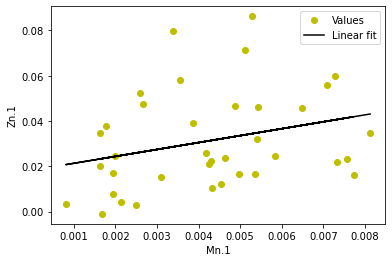

0.9999999999999999 x + -2.777780675705096e-19


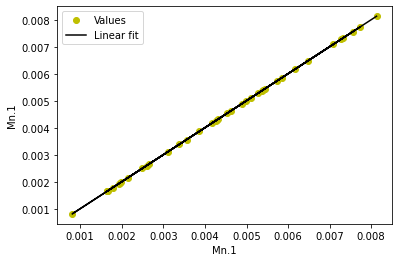

0.027456548058242686 x + 0.0001944393261322622


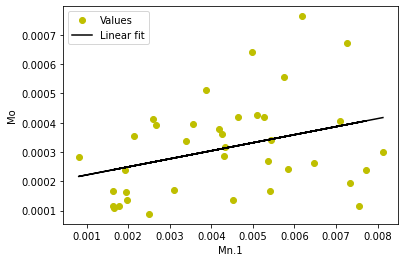

0.14912991778275353 x + 0.0006987086585620904


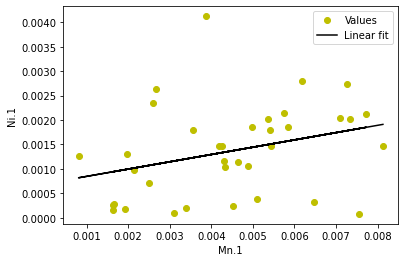

1.2976377366902543 x + 0.001954596746493328


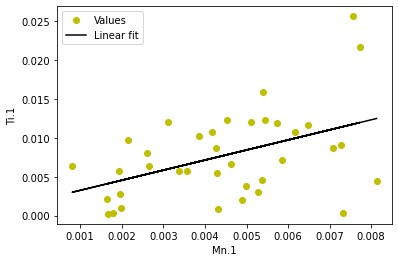

0.08685546700302761 x + 0.0019715241665336806


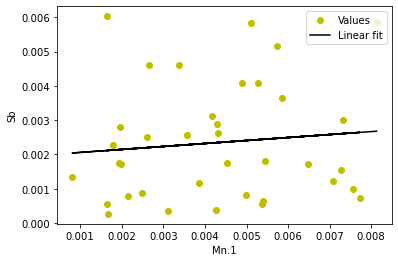

953.325460559186 x + 13.413093227058004


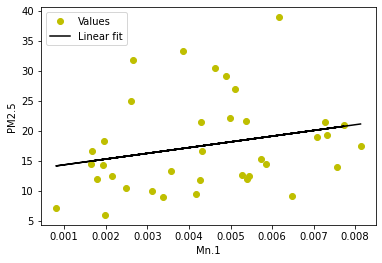

550.0472402026253 x + 0.04236878156059598


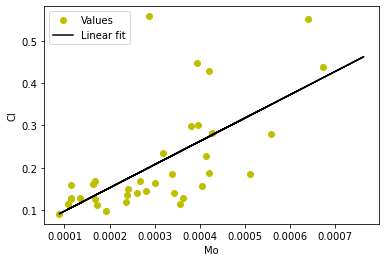

1096.9076681257443 x + 0.16434412854589844


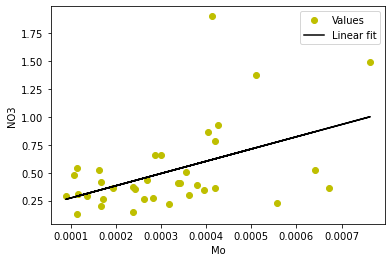

758.3455693911822 x + 0.20599778016360698


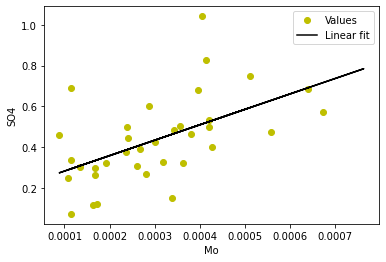

101.65925111297331 x + 0.261135336870031


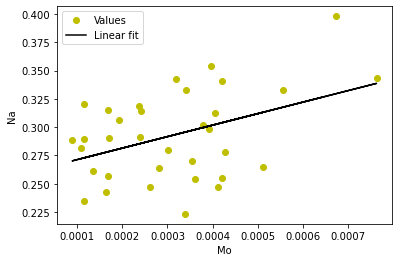

1142.9171282403365 x + -0.07515683071582699


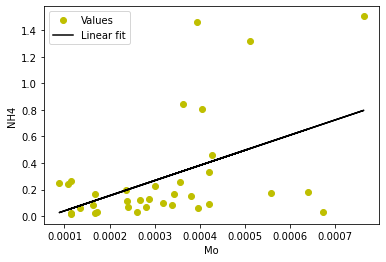

7401.317742785258 x + 2.7877508330155165


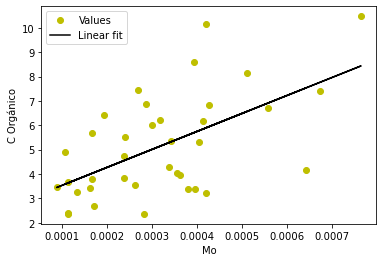

2461.177282671009 x + 0.29582100554038226


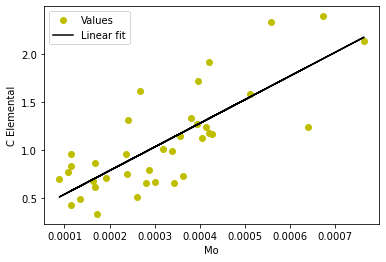

4039.223885006645 x + 4.868770373810767


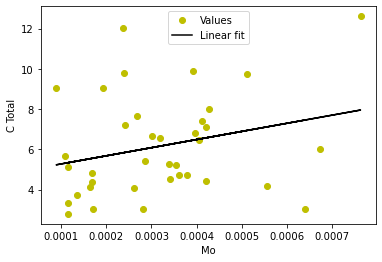

1175.2064589544234 x + 0.060630059674371836


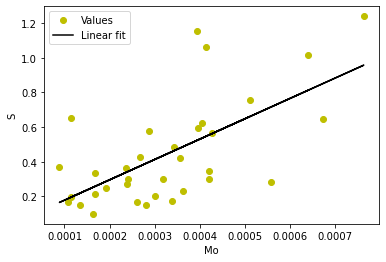

145.11148239028614 x + 0.20239234608447407


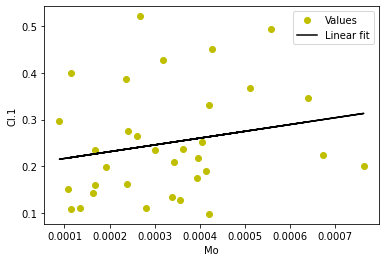

229.57046542977335 x + 0.0806883315692767


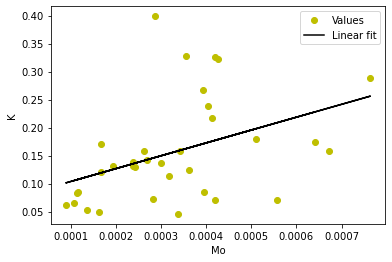

995.152993657641 x + 0.25016120822466803


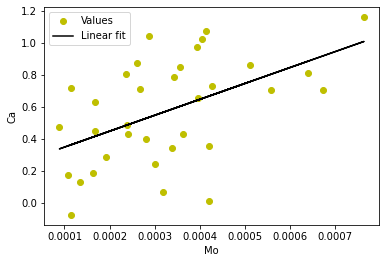

6.508812926925341 x + 0.006567088232228653


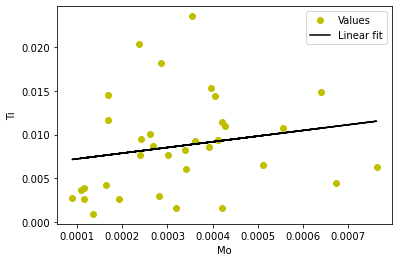

1.053982675598518 x + 0.0010788438501485417


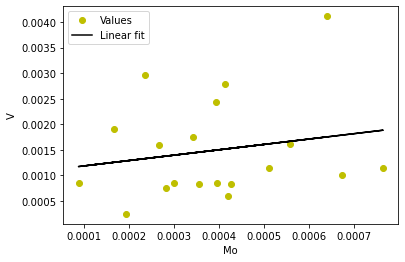

3.9632088367814404 x + 0.0009084606823340791


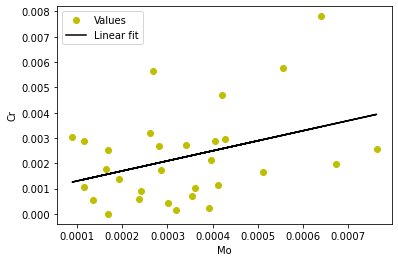

3.4323296670884056 x + 0.0023523931499931975


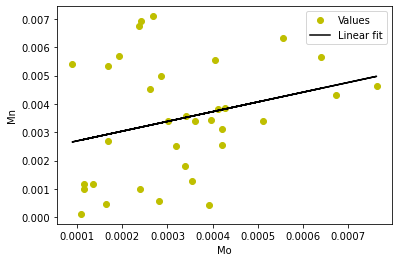

311.89645429078325 x + 0.03338621707439262


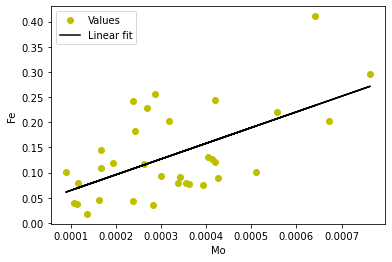

1.938752858759224 x + 0.0004864748038947645


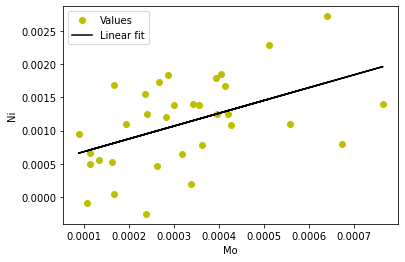

9.486958965180264 x + 0.0038525121592470637


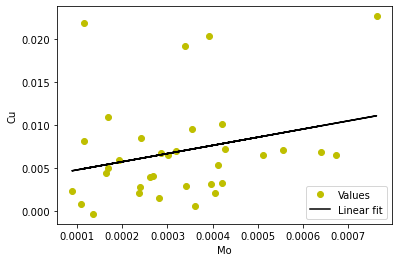

117.62182179164579 x + -0.0029853197598828252


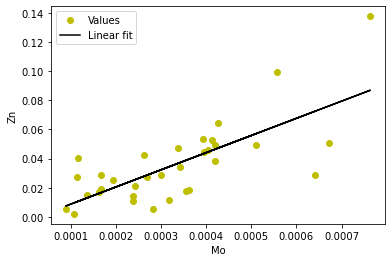

2.1517237274247667 x + 0.0009180872713318507


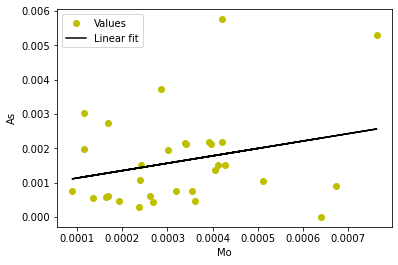

2.7196409813777183 x + -0.00020740586051041927


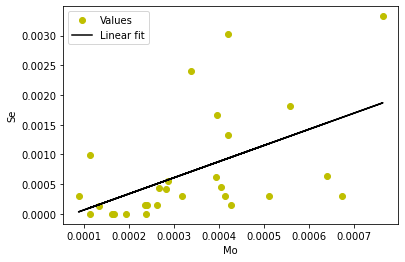

3.180965352223831 x + 0.0009911869754306805


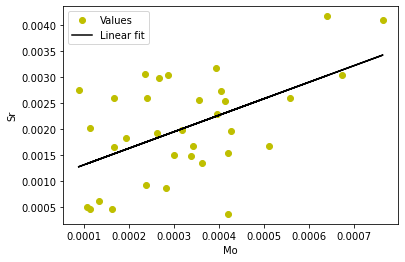

20.96754165680017 x + 0.00016421819588967825


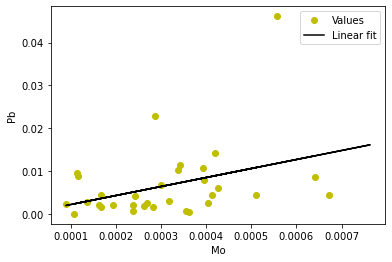

-0.7198348648237126 x + 0.0004302955104246795


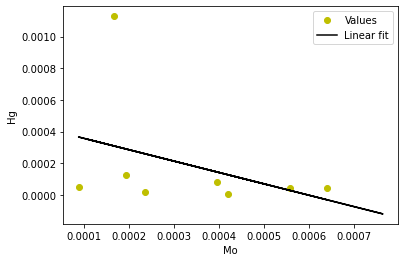

31.598726972446254 x + -0.0002504302739669697


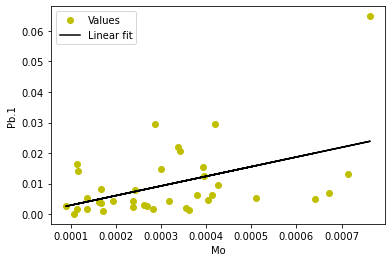

64.19086646114248 x + 0.011624827665431273


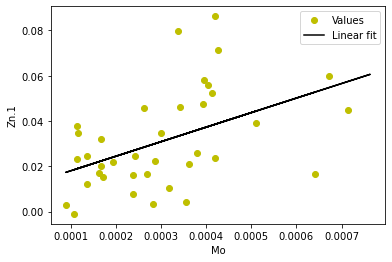

4.180524940299668 x + 0.003015617113918638


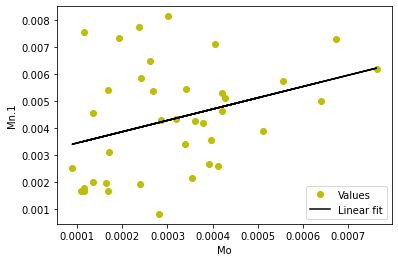

1.0000000000000004 x + 3.472225844631369e-20


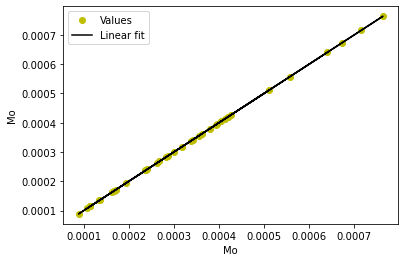

3.1158756223103232 x + 0.0003357327411119791


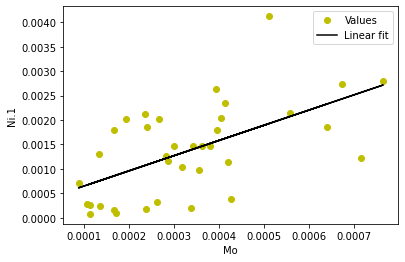

2.0403751945017246 x + 0.0072416777377232585


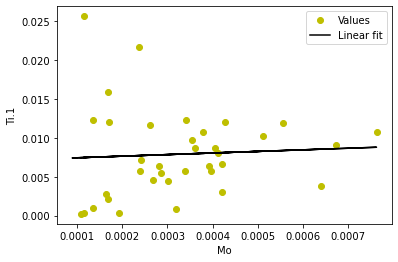

2.0103204131869434 x + 0.0016769967369330322


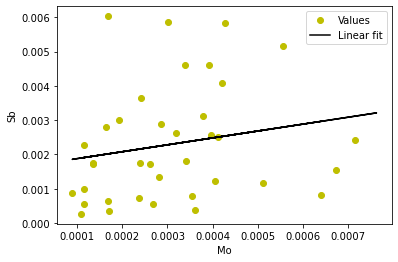

27447.28630619228 x + 8.4114324196005


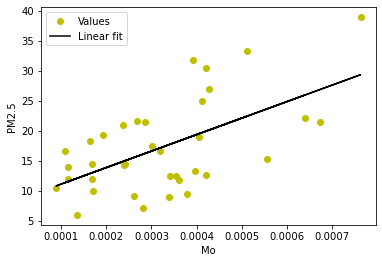

39.10372464197113 x + 0.16389779517400527


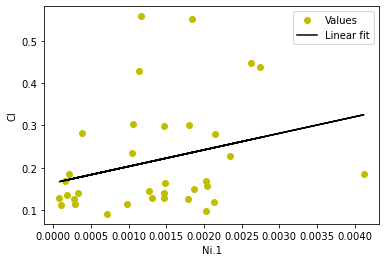

183.01618825219768 x + 0.3085544005200622


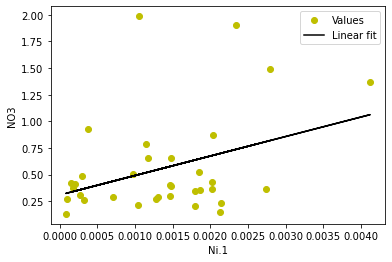

131.61810688903267 x + 0.27647614958492817


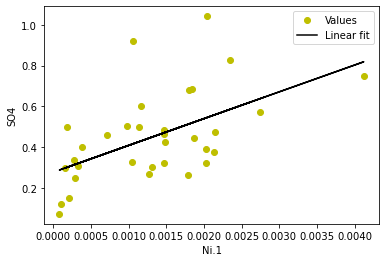

12.681414219681022 x + 0.277204863293703


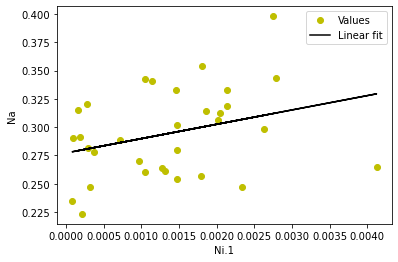

245.98400079883848 x + -0.007101103307249067


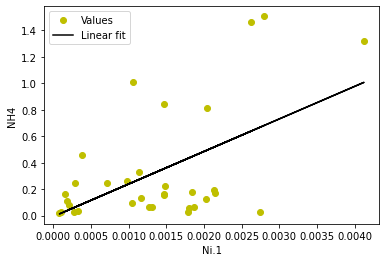

1124.4594970155642 x + 3.798245118821837


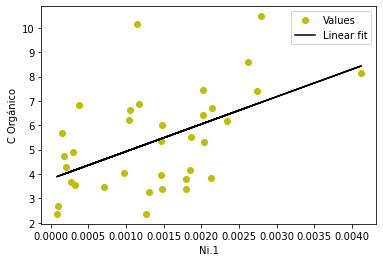

341.01791114268747 x + 0.6008350154893292


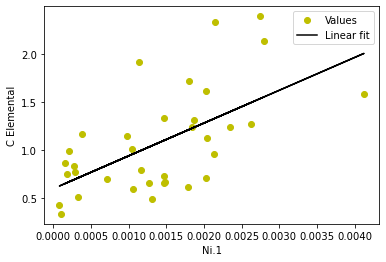

1186.6469439055193 x + 4.71760051499794


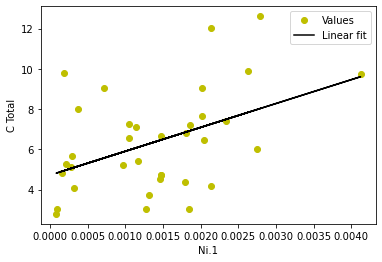

188.3600397727026 x + 0.18952175403024754


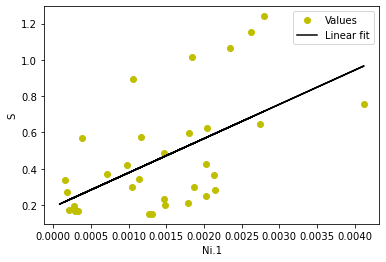

9.54401650552996 x + 0.2603822946046181


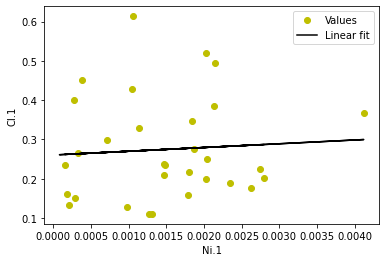

17.808368775740682 x + 0.1378990528287015


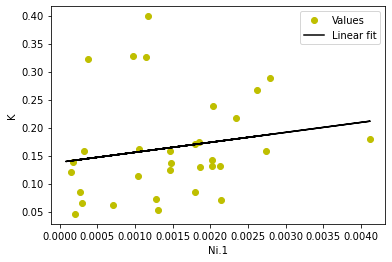

158.19652380437785 x + 0.3732684543829197


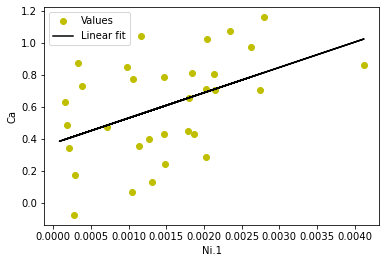

0.39874750900383604 x + 0.008385719323882445


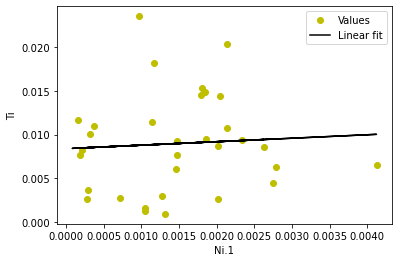

0.1653672823255543 x + 0.0012110337120864202


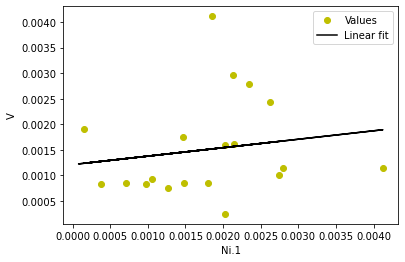

0.1747062024054158 x + 0.001896568622010171


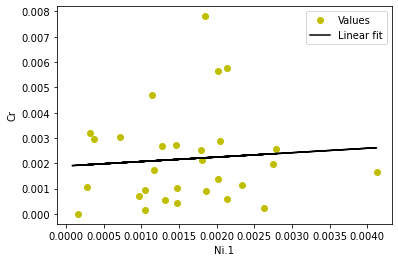

0.8601618947224243 x + 0.002386812986506188


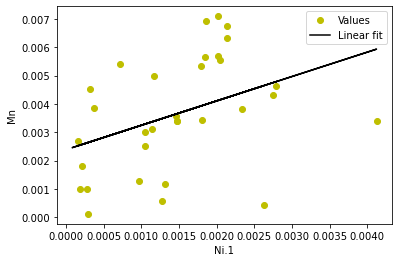

33.60533163704047 x + 0.09240401389484741


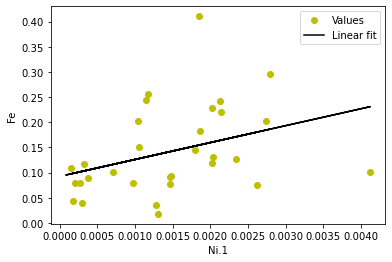

0.5041401703950698 x + 0.0004162252262423297


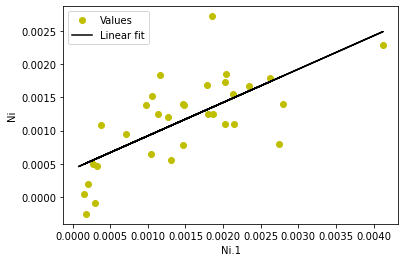

0.5902894537253978 x + 0.0061318292469360195


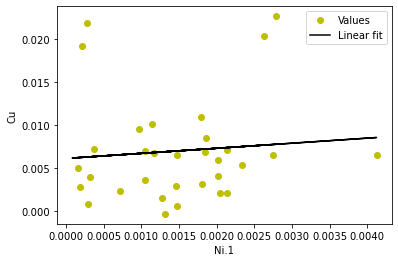

12.21191155413986 x + 0.018134657493168005


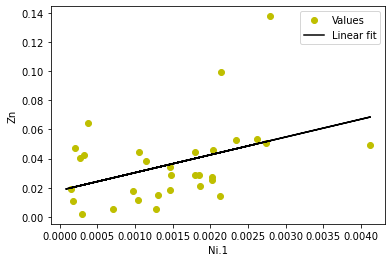

-0.10003761219447668 x + 0.0017904426189899979


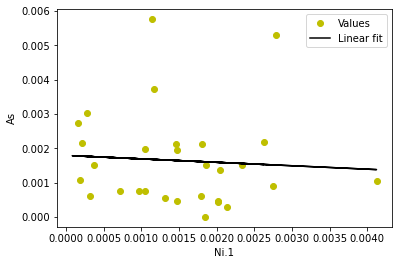

0.11968648201971024 x + 0.0005167607614193642


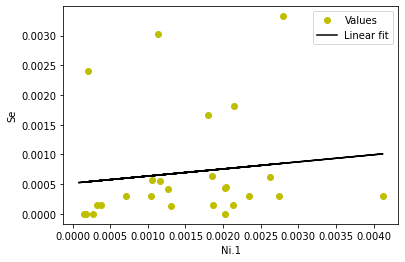

0.4672414786754123 x + 0.0014420619312949929


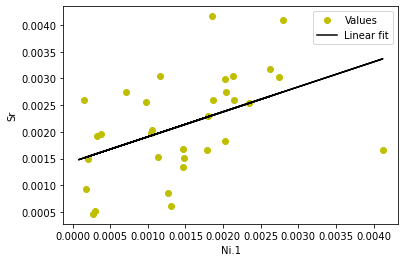

1.0739549454877746 x + 0.005083958307487441


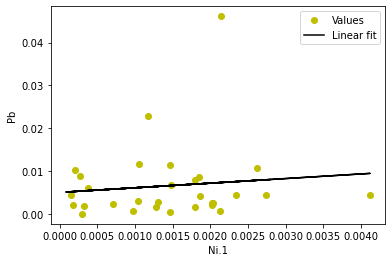

-0.39735458276243635 x + 0.0008261049457349008


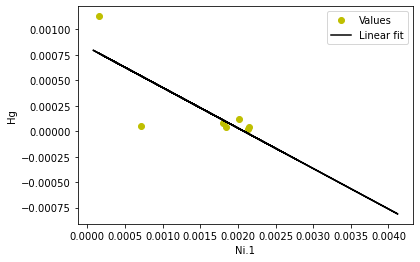

2.7768633886145406 x + 0.0055494702420694365


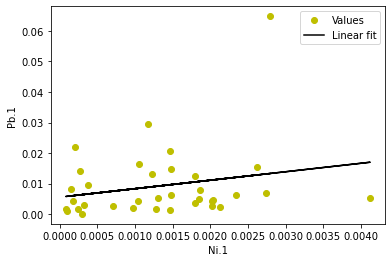

4.889141796087208 x + 0.02398096726293428


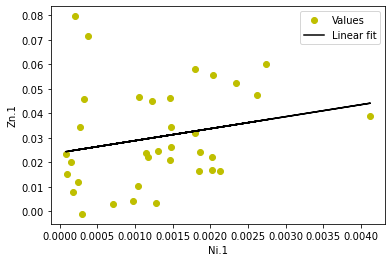

0.6662750657031067 x + 0.0035430693379884994


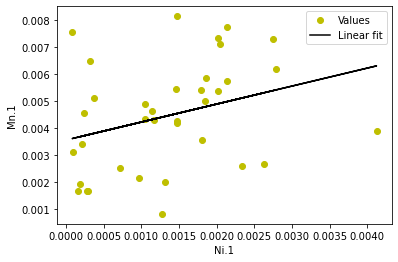

0.10790749148891299 x + 0.00018353542937234483


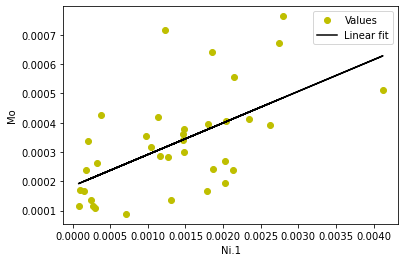

1.0 x + -2.851867827054165e-19


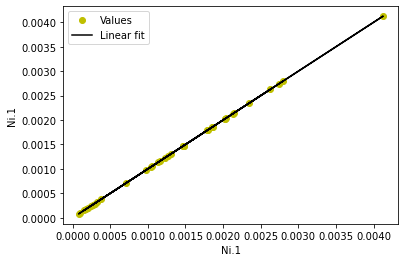

0.05825329817306091 x + 0.008167234605913998


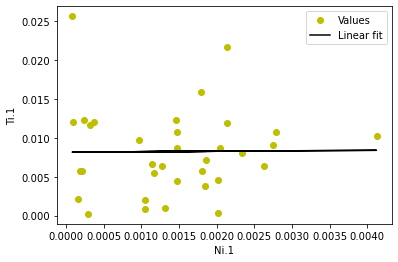

-0.055361660732793236 x + 0.002357235140684163


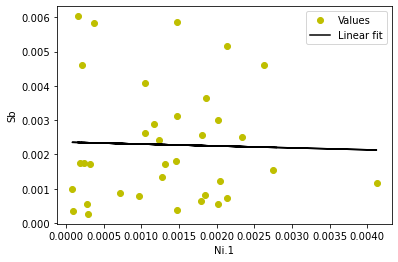

4763.5541996506445 x + 11.105918769277


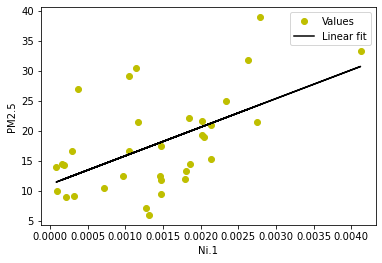

-3.1106899376016774 x + 0.24235334564832717


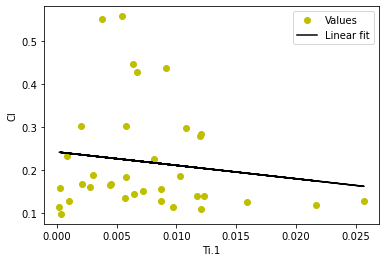

-11.795002883402224 x + 0.6554288801502123


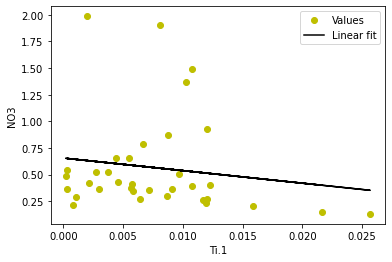

-7.513316894707197 x + 0.5091543158874169


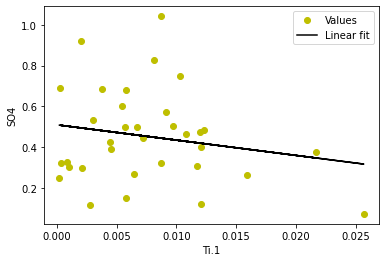

-0.26942639813558694 x + 0.2931709889577385


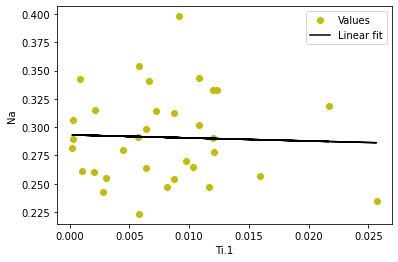

-0.7923159775267469 x + 0.3256634491942393


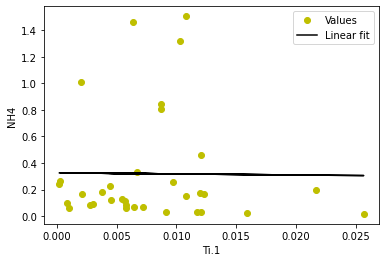

-42.46129758666701 x + 5.593401594827945


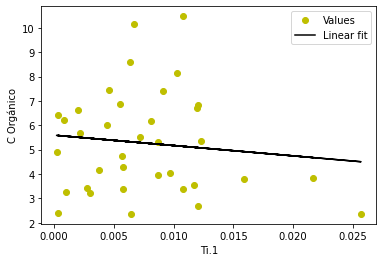

2.280901508213374 x + 1.0648731931317608


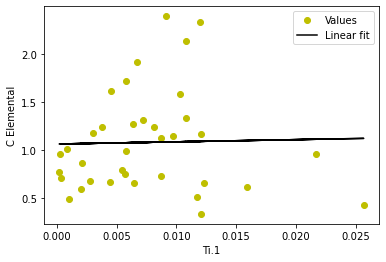

29.94142237097673 x + 5.903543824931646


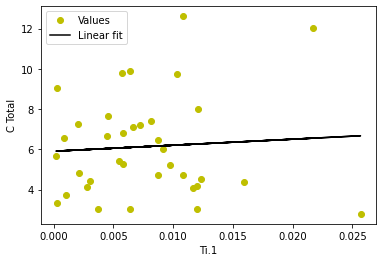

5.445143183251902 x + 0.43049139729694014


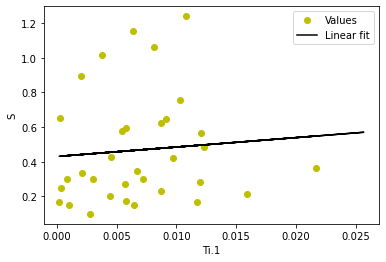

4.580719932030719 x + 0.22360325020063884


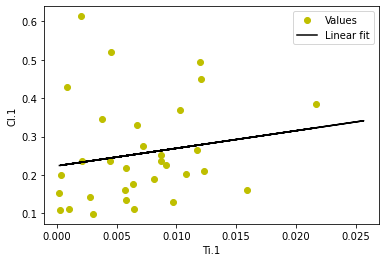

5.737530607792437 x + 0.12155711925507102


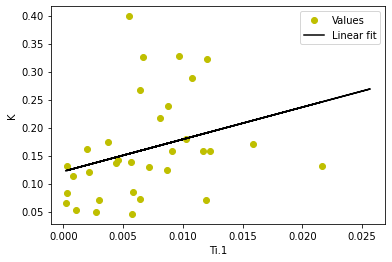

30.1838641133608 x + 0.39732679557671313


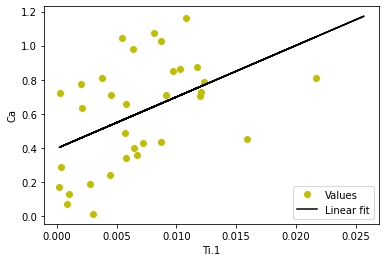

0.6531825389797804 x + 0.004362076955552328


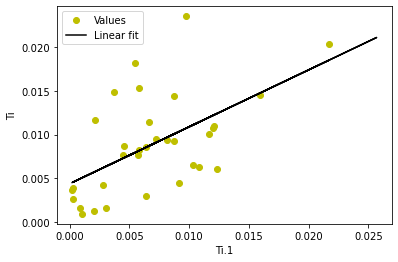

0.049532051726593744 x + 0.0011169115617525329


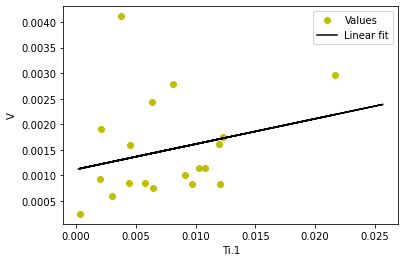

0.03237728384724974 x + 0.001961266295291974


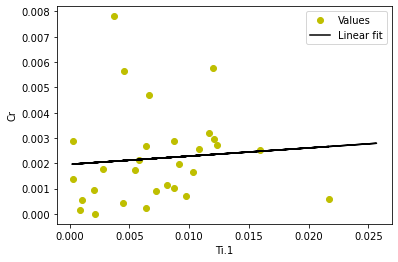

0.19379515656843035 x + 0.002149704587964784


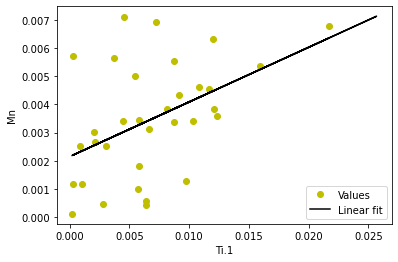

4.176510154773966 x + 0.1091556781357647


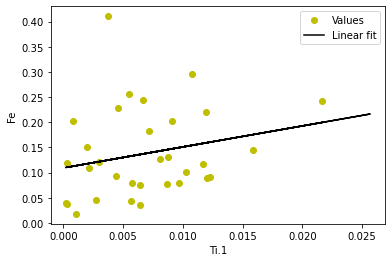

0.04430008298244028 x + 0.0008428175763258422


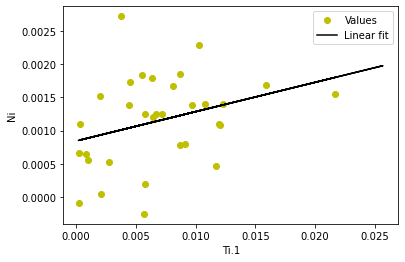

0.13958484746237954 x + 0.005580706209630981


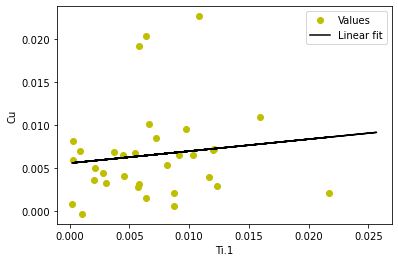

1.6968617485985191 x + 0.024944533368101592


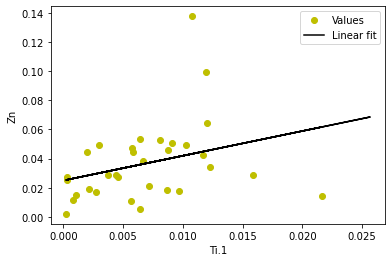

-0.016648641869770997 x + 0.0017323303140616886


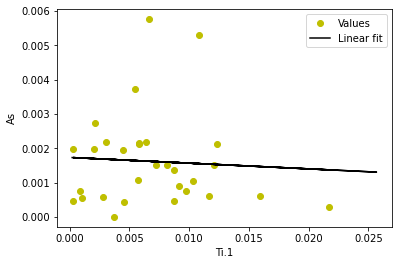

0.01871537462919701 x + 0.000627252534652035


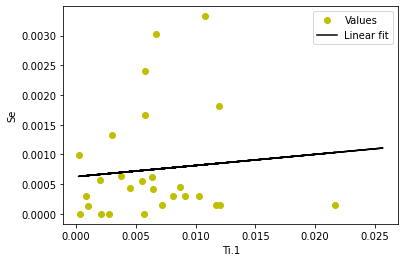

0.060272082694672845 x + 0.0016433556921888503


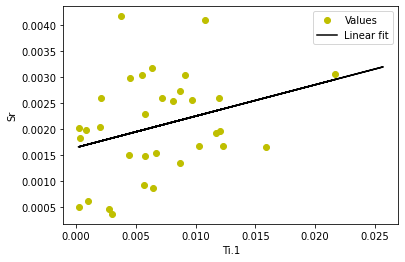

0.09915601389025873 x + 0.006228146238743798


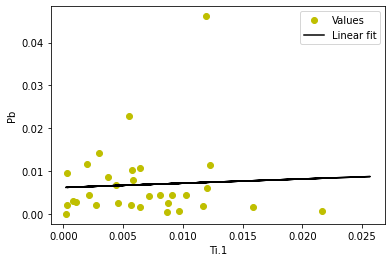

-0.017776253927904734 x + 0.0003306489011535469


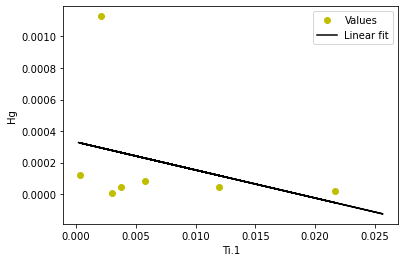

-0.20925147076277617 x + 0.011461597880575604


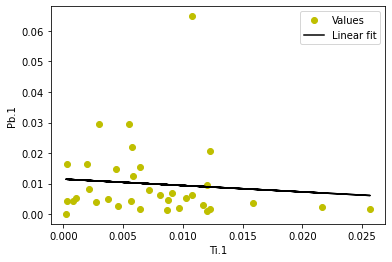

0.08140782269774421 x + 0.03136883975920598


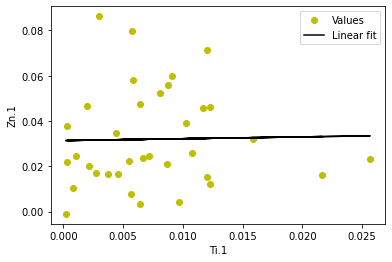

0.1604401772263166 x + 0.0032196513199724505


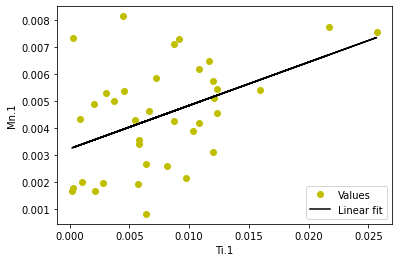

0.0016658207677858515 x + 0.00031176095636506425


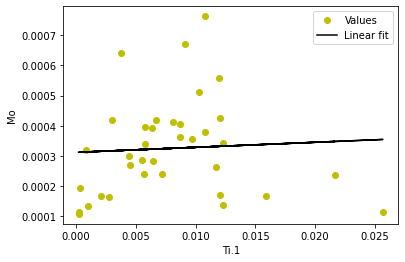

0.0016595702151583798 x + 0.0014000198388358443


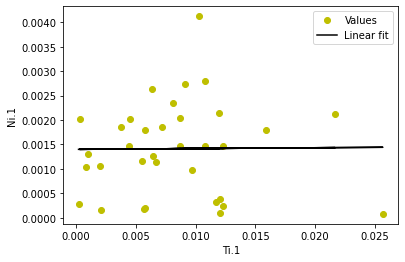

0.9999999999999997 x + 2.281494261643331e-18


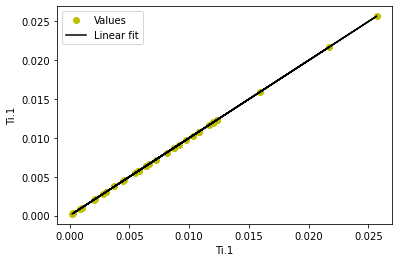

-0.08069604279431576 x + 0.003056397141201233


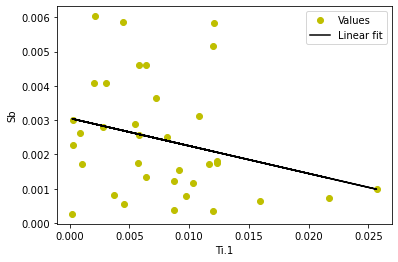

18.308275897584373 x + 17.67491095745829


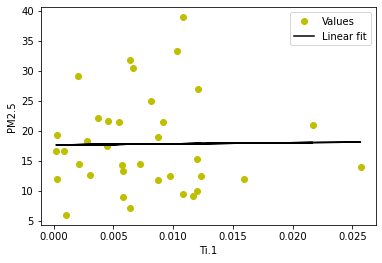

18.966317446489455 x + 0.16224563932978


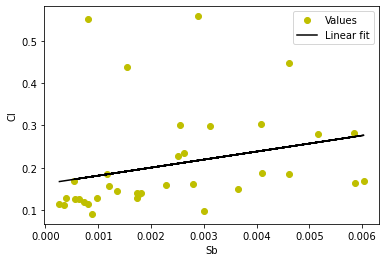

55.32234880107688 x + 0.39006536780395773


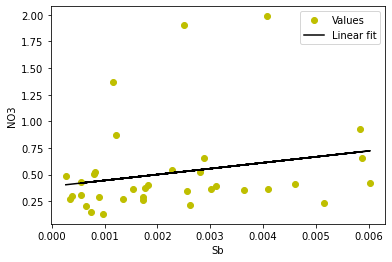

7.647554534795444 x + 0.4302907375368412


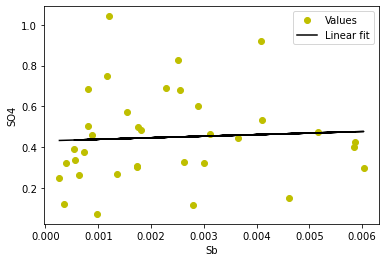

0.6392094511440034 x + 0.2872016961260031


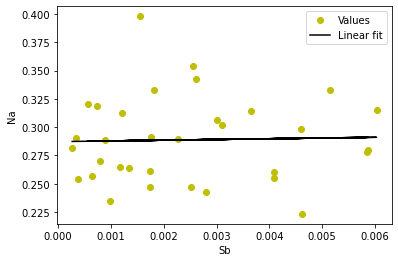

25.317050349614554 x + 0.21430629555293185


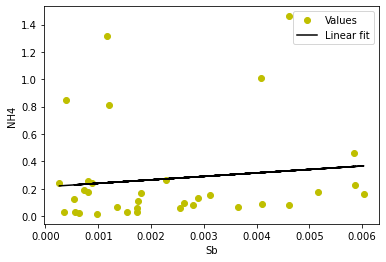

387.4252604078176 x + 3.981556519574054


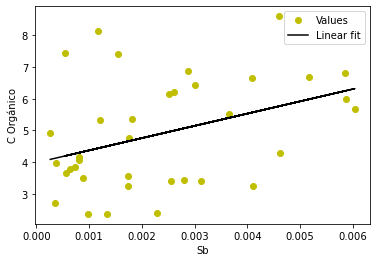

52.568268255732676 x + 0.8882903778750771


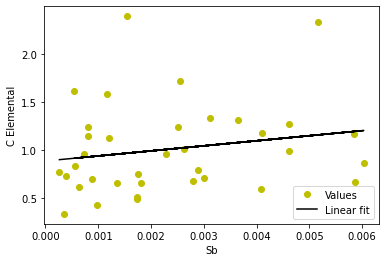

135.5542084318667 x + 5.656840610854824


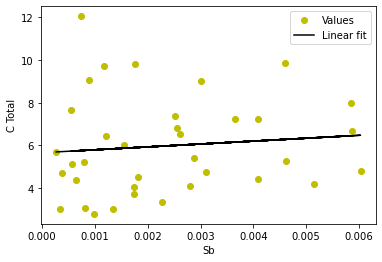

12.32366565894275 x + 0.40683882038752567


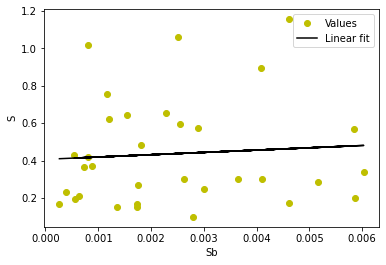

7.48601495198215 x + 0.24213081806163805


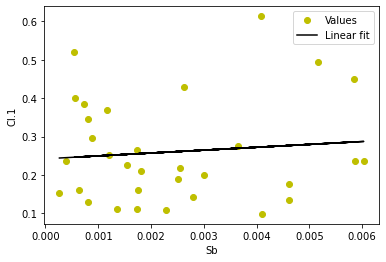

3.5492268026706704 x + 0.1379921987708333


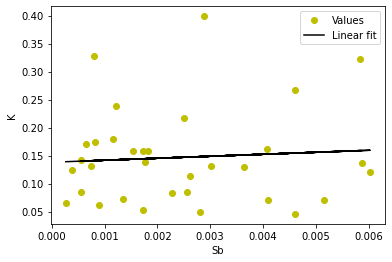

-1.7710834557570723 x + 0.5741691268195144


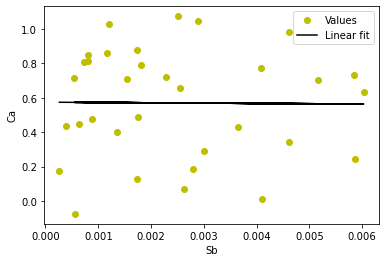

-0.26524829364518204 x + 0.009106903468380565


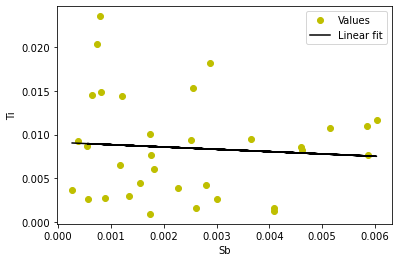

-0.10014369198320137 x + 0.001760285238721495


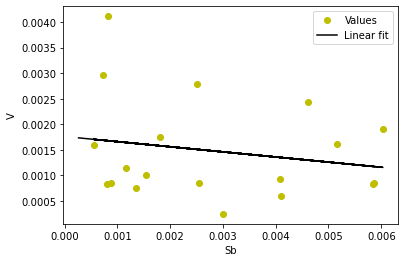

-0.2255042256812046 x + 0.0026301407244554344


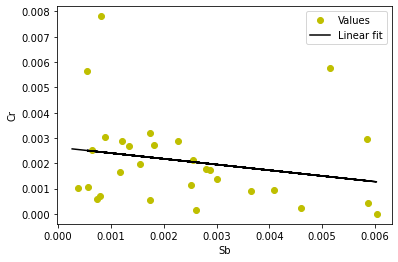

-0.05788448898575305 x + 0.0035758951723725355


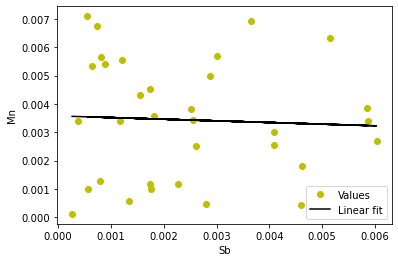

-2.950561916429034 x + 0.133774744871839


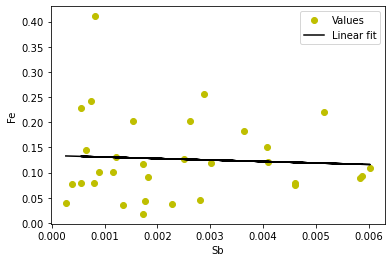

-0.0474847245337821 x + 0.0012268517421589102


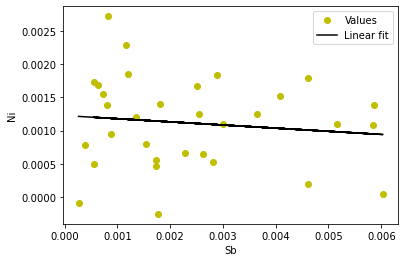

0.7119864433920021 x + 0.004536786031612959


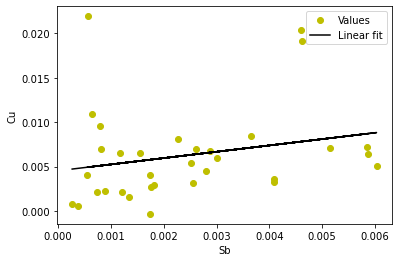

5.37231235233166 x + 0.01951283279289181


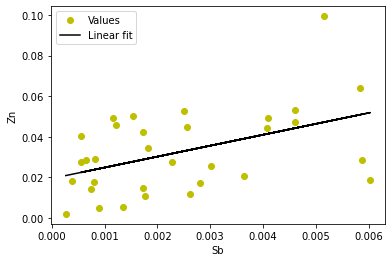

0.2734599340235945 x + 0.0007028002203414863


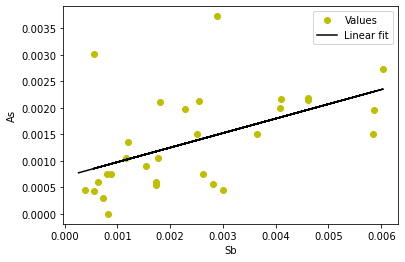

0.12423149119886998 x + 0.00019850213029714255


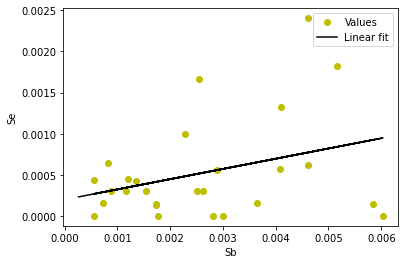

0.019646593012703245 x + 0.0019346462554788826


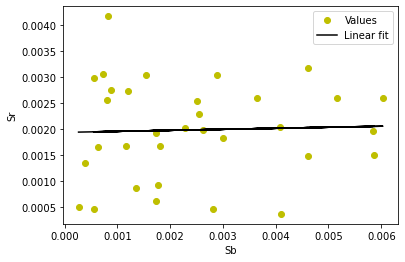

2.2325596477891803 x + 0.0013666541391579002


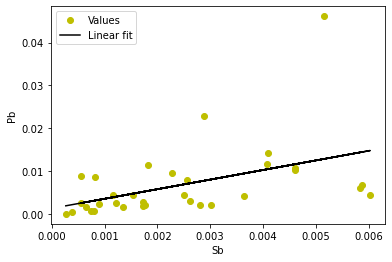

0.11459302764338575 x + -0.00014621065961730657


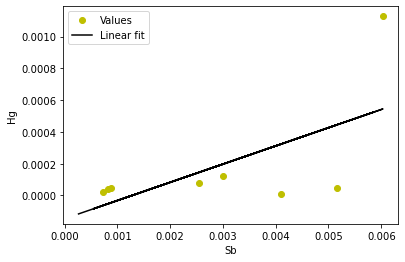

2.5359597353902132 x + 0.00262396537539806


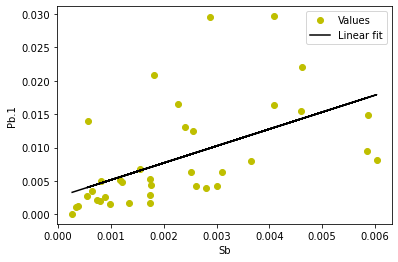

6.374812973822949 x + 0.0173718980547781


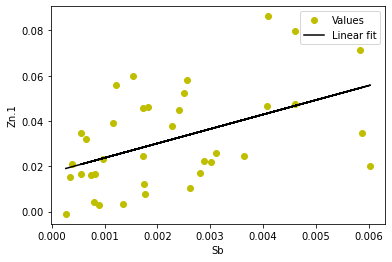

0.1250389677918014 x + 0.003988721596532876


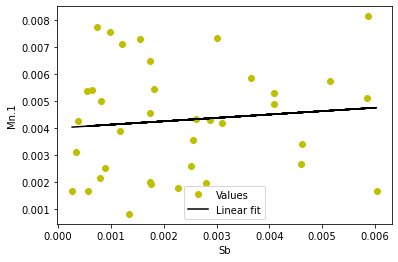

0.01895978302881301 x + 0.0002654224374059047


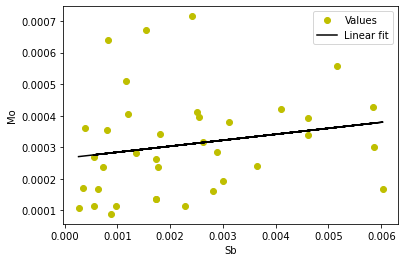

-0.01604861752095622 x + 0.001360779845135871


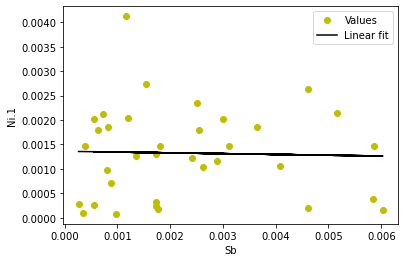

-0.933420239218937 x + 0.009961868002240817


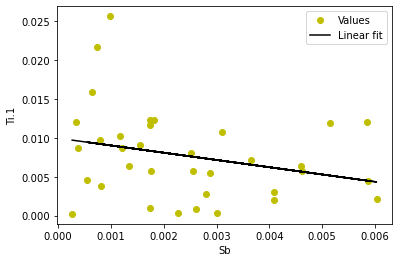

0.9999999999999998 x + -2.814093075418538e-19


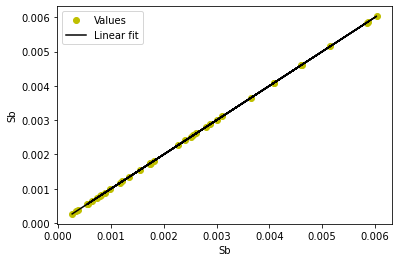

783.2390213233973 x + 14.746896644058703


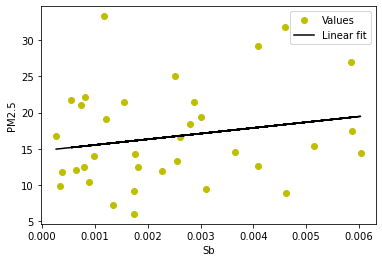

0.0071264451872998565 x + 0.09222088845640551


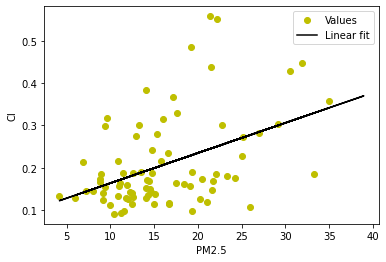

0.03356113521990577 x + -0.02977366067737799


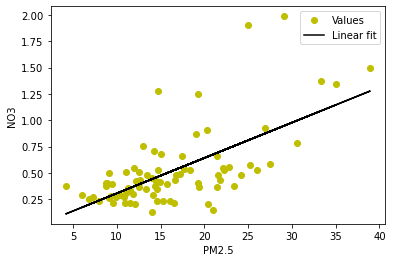

0.006155230625908319 x + 0.36722918705151686


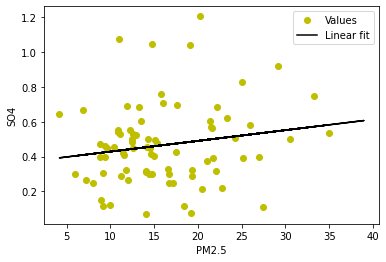

0.0009417213303966486 x + 0.27514777390274275


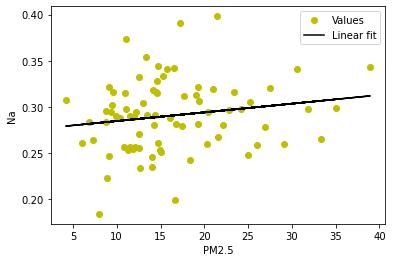

0.02759205129362138 x + -0.2130759491199919


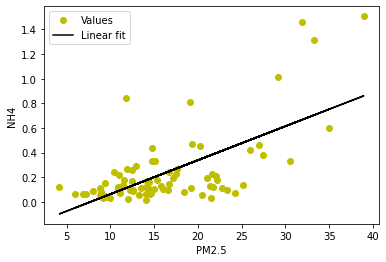

0.2712918699108698 x + 0.4103769738144184


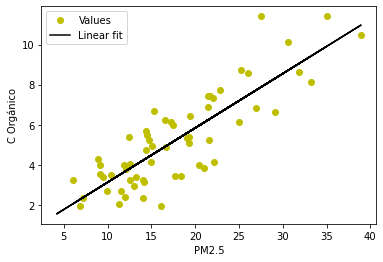

0.03320213795323964 x + 0.4288640770501708


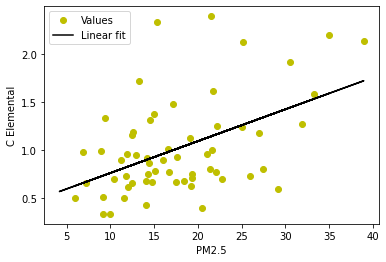

0.27056279342029504 x + 1.3913579295540768


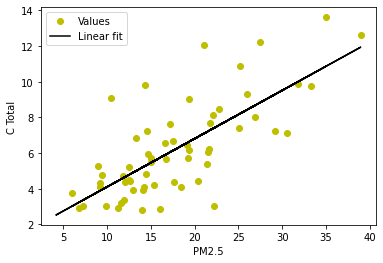

0.028506097306660372 x + -0.05348916363250165


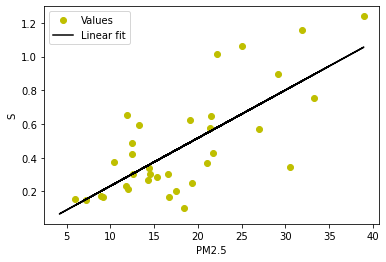

0.0069204678239703984 x + 0.1312366736493599


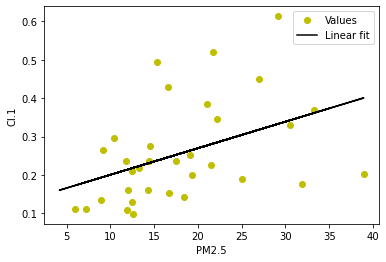

0.006938298915282179 x + 0.03169886371785756


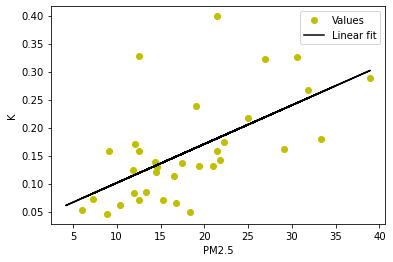

0.019421533937757453 x + 0.24680129627224578


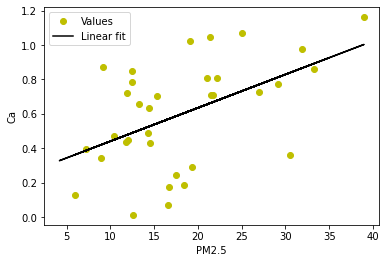

4.287142754031223e-05 x + 0.007873408737623527


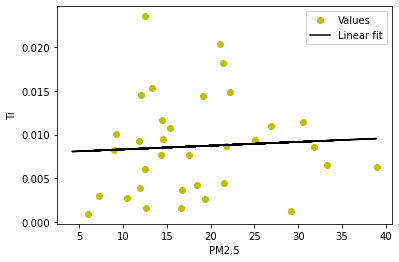

2.387728186632264e-05 x + 0.0009766822901595576


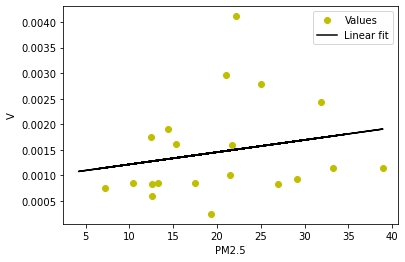

1.522332190719309e-05 x + 0.0019376905831099862


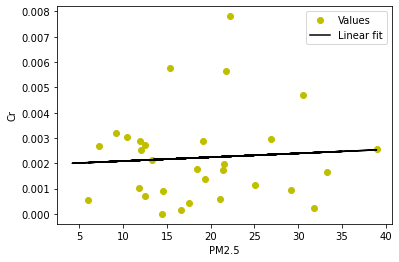

4.2919508716707065e-05 x + 0.0027517579984239317


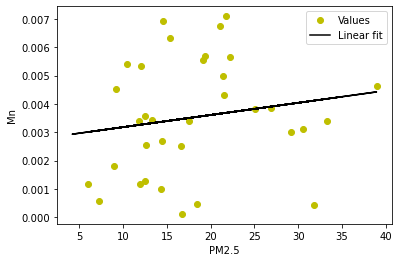

0.005097911247730212 x + 0.04327598781456521


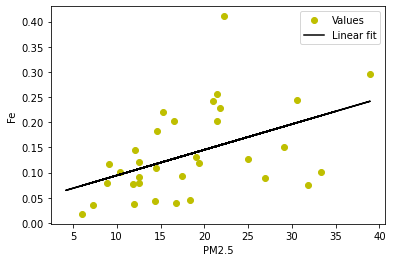

4.108471574050309e-05 x + 0.0003910012143931656


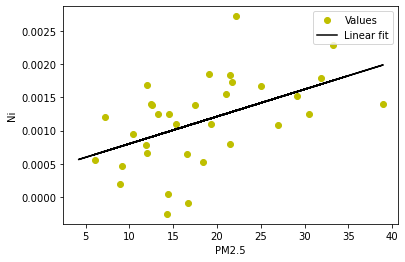

0.00030875248400040884 x + 0.0007956456024388921


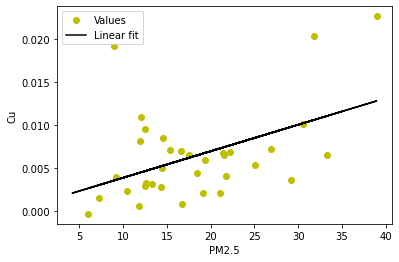

0.001902755789557521 x + 0.0012534310184438872


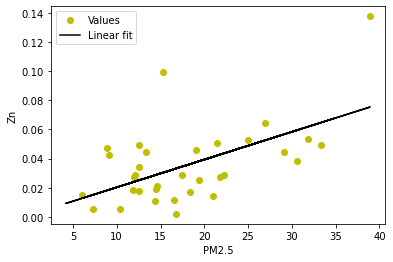

7.630054426227506e-05 x + 0.00016441217590299368


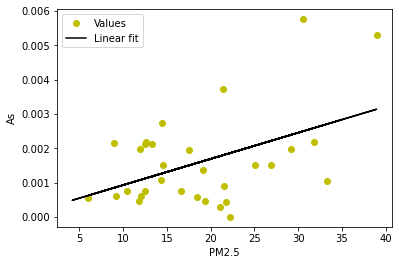

2.9991611328219534e-05 x + 0.00015901310685229164


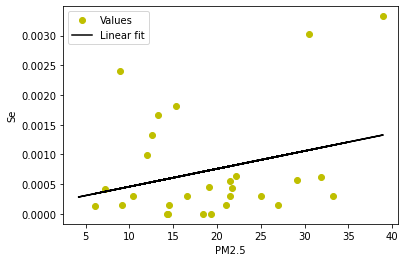

5.5808099960906094e-05 x + 0.0010610121783362432


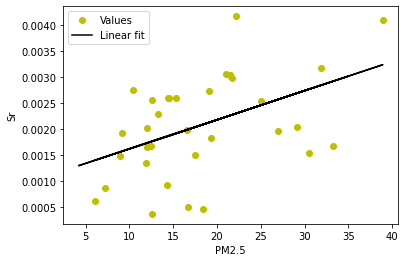

0.00011337349329534607 x + 0.004807359734639559


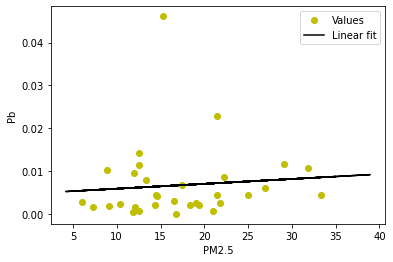

-1.2918686261461504e-05 x + 0.0003950696368685113


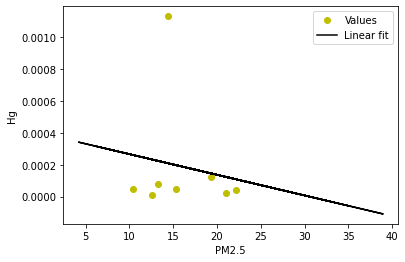

0.0006872243550269522 x + -0.0020096189602388467


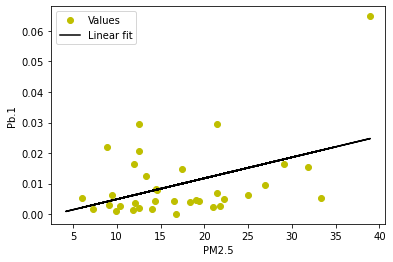

0.0005516034844131511 x + 0.02230500345019448


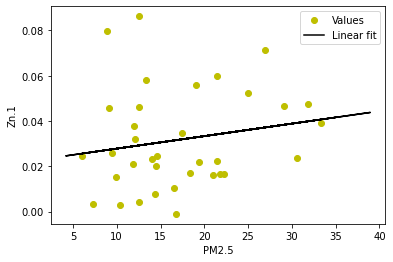

6.252224543091381e-05 x + 0.003305790888046681


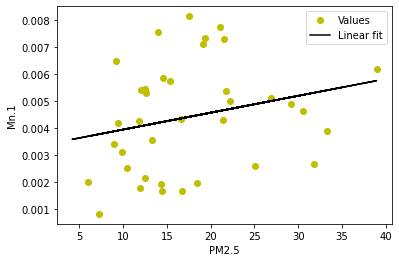

1.2232255504798192e-05 x + 0.00011208124804296372


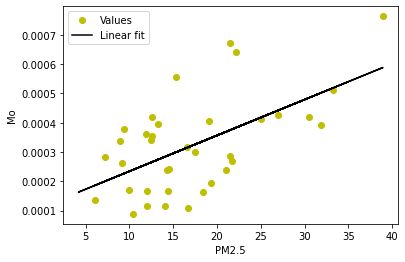

6.322521713668979e-05 x + 0.0002953959011609668


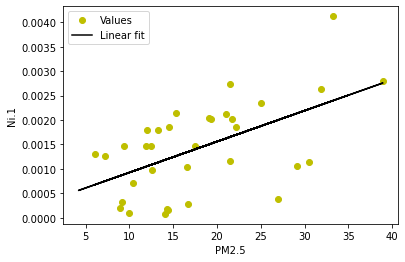

9.51499776286238e-06 x + 0.007449160238518372


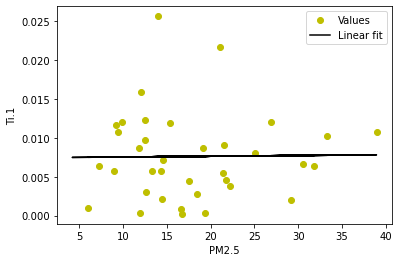

4.995812190410939e-05 x + 0.001580548814524689


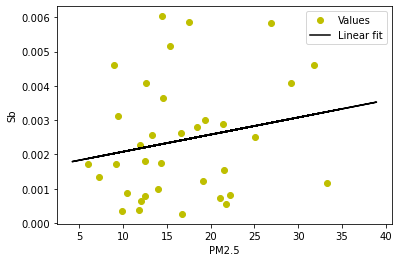

1.0000000000000009 x + 2.8564892751865397e-15


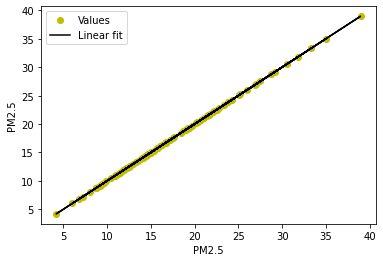

In [13]:
for i in df:
    if is_numeric_dtype(df[i]):
        for j in df:
            if is_numeric_dtype(df[j]):
                idx = np.isfinite(df[i]) & np.isfinite(df[j])
                coef = np.polyfit(df[i][idx],df[j][idx],1)
                print(str(coef[0]), 'x +', str(coef[1]))
                poly1d_fn = np.poly1d(coef)
                correlation_fig = plt.plot(df[i],df[j], 'yo', df[i], poly1d_fn(df[i]), 'k')
                plt.legend(iter(correlation_fig), ('Values', 'Linear fit'))
                #plt.plot(df[i], df[i], 'r--')
                plt.xlabel(i)
                plt.ylabel(j)
                plt.savefig('corr_' + i + '_' + j + '.png')
                plt.show()

In [ ]:
plt.plot((df['S'] - df['SO4'] * 0.33), df['V'], 'yo')
plt.show()
(df['V'] * 100).plot()
(df['S'] - df['SO4'] * 0.33).plot()

In [ ]:
def mass_closure(data_df, method='Chow_1996'):
    mass_closure = 0
    data_df2 = data_df.fillna(0)
    if method == 'Chow_1996':
        ##### FALTA EXCEPTUAR ALUMINIO, Silicio
        data_df2['Al'] = 0 * data_df2['Ca']
        data_df2['Si'] = 0 * data_df2['Ca']
        ########
        inorganic_ions = data_df2['SO4'] + data_df2['NO3'] + data_df2['NH4']
        organic_matter = data_df2['C Orgánico'] * 1.4
        elemental_C = data_df2['C Elemental']
        geological_minerals = (1.89 * data_df2['Al'] + 2.14 * data_df2['Si'] +
                               1.4 * data_df2['Ca'] + 1.43 * data_df2['Fe'])
        salt = data_df2['Na'] + data_df2['Cl']
        trace_elements = data_df2['V'] #Terminar
        others = data_df2['Na'] * 0
    
    
    mass_closure = (inorganic_ions + organic_matter + elemental_C + geological_minerals +
                    salt + trace_elements + others)
    return mass_closure

for i in (mass_closure(data_df=df) / df['PM2.5']):
    print(i)
    
print('\n\n\n' + str((mass_closure(data_df=df) / df['PM2.5']).mean()))
        
        ######### Metodo de Malm 1994
        #geological_minerals = (2.20 * data_df['Al'] + 2.49 * data_df['Si'] +
        #                       1.63 * data_df['Ca'] + 1.94 * data_df['Ti'] +
        #                       2.42 * data_df['Fe'])
        